In [1]:
import random 
import warnings
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [2]:
import os 
os.environ['PYTHONHASHSEED']=str(1)

In [3]:
import tensorflow as tf 
import tensorflow.keras as keras 
import tensorflow.keras.layers 

In [4]:
def reset_random_seeds():
    os.environ['PYTHONHASHSEED']=str(1)
    tf.random.set_seed(1)
    np.random.seed(1)
    random.seed(1)

In [5]:
data=pd.read_csv('C:\\Users\\Okwua\\1-projects\\Phys_Descrip.txt')

In [6]:
data.drop(['Config','Ecoh','Eb','Eadh'], axis=1, inplace=True)

N_12=pd.DataFrame(data.loc[data['N'] == 12])
N_all=pd.DataFrame(data.loc[data['N']!=12])

In [7]:
X=N_all.iloc[:,:-1] ## independent features
y=N_all.iloc[:,-1] ## dependent features

In [8]:
scaler_x=StandardScaler()
X_scaled=scaler_x.fit(X)
X_scaled=scaler_x.transform(X)



scaler_y=StandardScaler()
y=y.values.reshape(-1,1)
y_scaled=scaler_y.fit(y)
y_scaled=scaler_y.transform(y)

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.25,random_state=0)

In [10]:
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LeakyReLU,PReLU,ELU
from keras.layers import Dropout
from keras.regularizers import l1

In [11]:
def create_model():
    reset_random_seeds()
    Ann_model = Sequential()

# The Input Layer :
    Ann_model.add(Dense(360, kernel_initializer='normal',input_dim = 11, activation='relu',kernel_regularizer=l1(0.01),bias_regularizer=l1(0.01)))

# The Hidden Layers :
    Ann_model.add(Dense(360,activation='relu'))
    Ann_model.add(Dropout(0.2))
    Ann_model.add(Dense(360,activation='relu'))
    Ann_model.add(Dropout(0.2))
    Ann_model.add(Dense(180,activation='relu'))
    Ann_model.add(Dropout(0.2))
    Ann_model.add(Dense(180,activation='relu'))
    Ann_model.add(Dense(90,activation='relu'))

# The Output Layer :
    Ann_model.add(Dense(1,activation='linear'))

# Compile the network :
    Ann_model.compile(loss='mse', optimizer='adagrad', metrics=['mean_squared_error'],)
    return Ann_model
 


In [12]:
from keras.wrappers.scikit_learn import KerasRegressor
Ann_model=KerasRegressor(build_fn=create_model)

In [13]:
from keras.callbacks import EarlyStopping

early_stopping=EarlyStopping()

In [14]:
model_history=Ann_model.fit(X_train, y_train,validation_data=(X_train,y_train),verbose=0, batch_size = 10, epochs = 500,callbacks=[early_stopping])



In [15]:
pred_test=Ann_model.predict(X_test)
pred_train=Ann_model.predict(X_train)

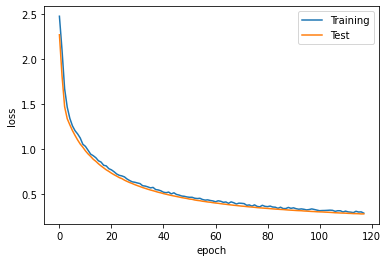

In [16]:
plt.plot(model_history.history['loss'], label='Training')
plt.plot(model_history.history['val_loss'], label='Test')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(loc='upper right')
plt.show()

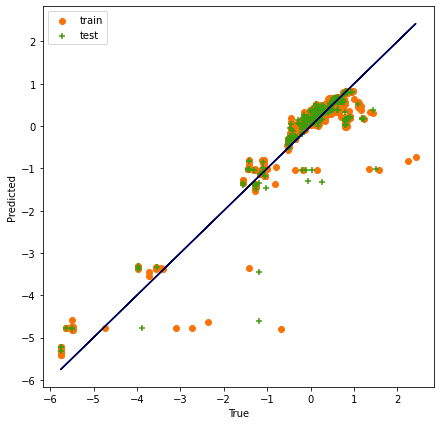

In [17]:
plt.figure(figsize=(7,7))
plt.scatter(y_train,pred_train, marker='o', color='#f97306', label='train' )
plt.scatter(y_test,pred_test, marker='+', color='#3f9b0b', label='test' )
plt.legend(loc='upper left')
plt.plot(y_train,y_train, color='#00035b')
plt.xlabel('True')
plt.ylabel('Predicted')
plt.show()

In [18]:
from sklearn import metrics 
from sklearn.metrics import r2_score

In [19]:
print('MAE:', metrics.mean_absolute_error(y_test, pred_test))
print('MSE:', metrics.mean_squared_error(y_test, pred_test))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred_test)))
print('R_squared:'+ str(round(r2_score(y_test,pred_test),2)))

MAE: 0.18781587247039155
MSE: 0.13147835514021608
RMSE: 0.3625994417262885
R_squared:0.85


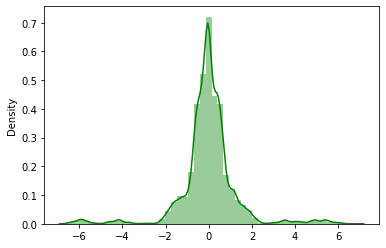

In [20]:
import seaborn as sns
sns.distplot(y_test-pred_test, color='green');

In [21]:
y_test=scaler_y.inverse_transform(y_test)
np.mean(y_test)

-378.3327680525164

In [22]:
pred_test=scaler_y.inverse_transform(pred_test)
np.mean(pred_test)

-378.30533

### Predicting unseen data

In [23]:
X_12=N_12.iloc[:,:-1] ## independent features
y_12=N_12.iloc[:,-1] ## dependent features_12


X_12_scaled=scaler_x.fit(X_12)
X_12_scaled=scaler_x.transform(X_12)


y_12=y_12.values.reshape(-1,1)
y_12_scaled=scaler_y.fit(y_12)
y_12_scaled=scaler_y.transform(y_12)

In [24]:
y_12_hat=Ann_model.predict(X_12_scaled)
y_12_hat

array([ 0.5184012 , -0.26715595,  0.02279634, -0.28066453,  0.44656643,
        0.02358043,  0.48589778, -0.18067646,  0.45404625, -0.38887602,
        0.46445358, -0.18536347], dtype=float32)

In [25]:
y_12_scaled

array([[ 1.39428179],
       [-0.90686411],
       [-0.63859694],
       [-0.90695164],
       [ 0.91884059],
       [-0.638772  ],
       [ 1.39288137],
       [-0.90703917],
       [ 0.91822791],
       [-0.92191859],
       [ 1.20890173],
       [-0.91299093]])

In [26]:
print('MAE:', metrics.mean_absolute_error(y_12_scaled, y_12_hat))
print('MSE:', metrics.mean_squared_error(y_12_scaled, y_12_hat))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_12_scaled, y_12_hat)))
print('R_squared:'+ str(round(r2_score(y_12_scaled,y_12_hat),2)))

MAE: 0.6700451543302023
MSE: 0.46677411130265734
RMSE: 0.6832086879589994
R_squared:0.53


## Hyperparamater optimisation 

In [27]:
def create_model(optimizer = 'adagrad'):
    reset_random_seeds()
    Ann_model = Sequential()

# The Input Layer :
    Ann_model.add(Dense(360, kernel_initializer='normal',input_dim = 11, activation='relu',kernel_regularizer=l1(0.01),bias_regularizer=l1(0.01)))

# The Hidden Layers :
    Ann_model.add(Dense(360,activation='relu'))
    Ann_model.add(Dropout(0.2))
    Ann_model.add(Dense(360,activation='relu'))
    Ann_model.add(Dropout(0.2))
    Ann_model.add(Dense(180,activation='relu'))
    Ann_model.add(Dropout(0.2))
    Ann_model.add(Dense(180,activation='relu'))
    Ann_model.add(Dense(90,activation='relu'))

# The Output Layer :
    Ann_model.add(Dense(1,activation='linear'))

# Compile the network :
    Ann_model.compile(loss='mse', optimizer=optimizer, metrics=['mean_squared_error'],)
    return Ann_model

In [28]:
from sklearn.model_selection import GridSearchCV
KR = KerasRegressor(build_fn=create_model)
parameters={'batch_size':[10,30,50],
           'epochs':[100,300,500],
           'optimizer':['adam','rmsprop', 'adagrad']}
grid_search=GridSearchCV(estimator= KR,
                        param_grid=parameters,
                        scoring='accuracy',
                        cv=10)
grid_search=grid_search.fit(X_train, y_train)

Epoch 1/100
124/124 [==============================] - 0s 3ms/step - loss: 1.1529 - mean_squared_error: 0.3283
Epoch 2/100
124/124 [==============================] - 0s 4ms/step - loss: 0.6234 - mean_squared_error: 0.2923
Epoch 3/100
124/124 [==============================] - 1s 4ms/step - loss: 0.3945 - mean_squared_error: 0.1889
Epoch 4/100
124/124 [==============================] - 1s 5ms/step - loss: 0.3859 - mean_squared_error: 0.2385
Epoch 5/100
124/124 [==============================] - 1s 4ms/step - loss: 0.3739 - mean_squared_error: 0.2452
Epoch 6/100
124/124 [==============================] - 1s 4ms/step - loss: 0.2899 - mean_squared_error: 0.1842
Epoch 7/100
124/124 [==============================] - 1s 4ms/step - loss: 0.3017 - mean_squared_error: 0.2034
Epoch 8/100
124/124 [==============================] - 1s 4ms/step - loss: 0.2614 - mean_squared_error: 0.1758
Epoch 9/100
124/124 [==============================] - 0s 4ms/step - loss: 0.2554 - mean_squared_error: 0.1775
E

124/124 [==============================] - 1s 4ms/step - loss: 0.2011 - mean_squared_error: 0.1347
Epoch 48/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2217 - mean_squared_error: 0.1529
Epoch 49/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1565 - mean_squared_error: 0.1118
Epoch 50/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2200 - mean_squared_error: 0.1553
Epoch 51/100
124/124 [==============================] - 1s 4ms/step - loss: 0.1765 - mean_squared_error: 0.1248
Epoch 52/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1639 - mean_squared_error: 0.1118
Epoch 53/100
124/124 [==============================] - 1s 4ms/step - loss: 0.1521 - mean_squared_error: 0.1137
Epoch 54/100
124/124 [==============================] - 2s 13ms/step - loss: 0.1930 - mean_squared_error: 0.1295
Epoch 55/100
124/124 [==============================] - 1s 7ms/step - loss: 0.2184 - mean_squared_error: 0.1489
Epoc

124/124 [==============================] - 1s 5ms/step - loss: 0.2008 - mean_squared_error: 0.1382
Epoch 94/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2128 - mean_squared_error: 0.1528
Epoch 95/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2140 - mean_squared_error: 0.1404
Epoch 96/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1702 - mean_squared_error: 0.1105
Epoch 97/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1975 - mean_squared_error: 0.1344
Epoch 98/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1860 - mean_squared_error: 0.1270
Epoch 99/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2441 - mean_squared_error: 0.1541
Epoch 100/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1859 - mean_squared_error: 0.1219
Epoch 1/100
124/124 [==============================] - 1s 5ms/step - loss: 1.0757 - mean_squared_error: 0.2821
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 0.1993 - mean_squared_error: 0.1433
Epoch 39/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2198 - mean_squared_error: 0.1562
Epoch 40/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2604 - mean_squared_error: 0.1854
Epoch 41/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1799 - mean_squared_error: 0.1260
Epoch 42/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1942 - mean_squared_error: 0.1397
Epoch 43/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2291 - mean_squared_error: 0.1642
Epoch 44/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2658 - mean_squared_error: 0.1868
Epoch 45/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2270 - mean_squared_error: 0.1518
Epoch 46/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1964 - mean_squared_error: 0.1448
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 0.1805 - mean_squared_error: 0.1228
Epoch 85/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1728 - mean_squared_error: 0.1213
Epoch 86/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2265 - mean_squared_error: 0.1470
Epoch 87/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2171 - mean_squared_error: 0.1460
Epoch 88/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1833 - mean_squared_error: 0.1318
Epoch 89/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1967 - mean_squared_error: 0.1436
Epoch 90/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1576 - mean_squared_error: 0.1125
Epoch 91/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1679 - mean_squared_error: 0.1218
Epoch 92/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1833 - mean_squared_error: 0.1343
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 0.1903 - mean_squared_error: 0.1353
Epoch 31/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2039 - mean_squared_error: 0.1478
Epoch 32/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2164 - mean_squared_error: 0.1561
Epoch 33/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2454 - mean_squared_error: 0.1809
Epoch 34/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2011 - mean_squared_error: 0.1405
Epoch 35/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2178 - mean_squared_error: 0.1542
Epoch 36/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1673 - mean_squared_error: 0.1158
Epoch 37/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1902 - mean_squared_error: 0.1361
Epoch 38/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2049 - mean_squared_error: 0.1541
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 0.2122 - mean_squared_error: 0.1393
Epoch 76/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2413 - mean_squared_error: 0.1559
Epoch 77/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1894 - mean_squared_error: 0.1305
Epoch 78/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2091 - mean_squared_error: 0.1524
Epoch 79/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1891 - mean_squared_error: 0.1369
Epoch 80/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1929 - mean_squared_error: 0.1359
Epoch 81/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1802 - mean_squared_error: 0.1291
Epoch 82/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1744 - mean_squared_error: 0.1263
Epoch 83/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1889 - mean_squared_error: 0.1373
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 0.2705 - mean_squared_error: 0.2050
Epoch 21/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2447 - mean_squared_error: 0.1817
Epoch 22/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2403 - mean_squared_error: 0.1795
Epoch 23/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2670 - mean_squared_error: 0.1970
Epoch 24/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2490 - mean_squared_error: 0.1877
Epoch 25/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2246 - mean_squared_error: 0.1607
Epoch 26/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2395 - mean_squared_error: 0.1790
Epoch 27/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2672 - mean_squared_error: 0.2051
Epoch 28/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2497 - mean_squared_error: 0.1902
Epoch

124/124 [==============================] - 1s 6ms/step - loss: 0.1650 - mean_squared_error: 0.1154
Epoch 66/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2042 - mean_squared_error: 0.1496
Epoch 67/100
124/124 [==============================] - 1s 6ms/step - loss: 0.1761 - mean_squared_error: 0.1246
Epoch 68/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1766 - mean_squared_error: 0.1224
Epoch 69/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2074 - mean_squared_error: 0.1538
Epoch 70/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1795 - mean_squared_error: 0.1264
Epoch 71/100
124/124 [==============================] - 1s 6ms/step - loss: 0.1982 - mean_squared_error: 0.1382
Epoch 72/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2034 - mean_squared_error: 0.1493
Epoch 73/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2001 - mean_squared_error: 0.1451
Epoch

124/124 [==============================] - 1s 6ms/step - loss: 0.2435 - mean_squared_error: 0.1758
Epoch 12/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2629 - mean_squared_error: 0.1933
Epoch 13/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2252 - mean_squared_error: 0.1568
Epoch 14/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2879 - mean_squared_error: 0.2190
Epoch 15/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2608 - mean_squared_error: 0.1942
Epoch 16/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2941 - mean_squared_error: 0.2273
Epoch 17/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2280 - mean_squared_error: 0.1632
Epoch 18/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2482 - mean_squared_error: 0.1884
Epoch 19/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2231 - mean_squared_error: 0.1618
Epoch

124/124 [==============================] - 1s 6ms/step - loss: 0.2025 - mean_squared_error: 0.1470
Epoch 57/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1959 - mean_squared_error: 0.1399
Epoch 58/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2067 - mean_squared_error: 0.1501
Epoch 59/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2476 - mean_squared_error: 0.1917
Epoch 60/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2434 - mean_squared_error: 0.1838
Epoch 61/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2459 - mean_squared_error: 0.1828
Epoch 62/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2359 - mean_squared_error: 0.1793
Epoch 63/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2081 - mean_squared_error: 0.1514
Epoch 64/100
124/124 [==============================] - 1s 6ms/step - loss: 0.2245 - mean_squared_error: 0.1668
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 0.2219 - mean_squared_error: 0.1638
Epoch 29/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1938 - mean_squared_error: 0.1362
Epoch 30/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1879 - mean_squared_error: 0.1323
Epoch 31/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2048 - mean_squared_error: 0.1485
Epoch 32/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2112 - mean_squared_error: 0.1548
Epoch 33/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2166 - mean_squared_error: 0.1566
Epoch 34/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2177 - mean_squared_error: 0.1599
Epoch 35/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2096 - mean_squared_error: 0.1486
Epoch 36/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2265 - mean_squared_error: 0.1664
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 0.2041 - mean_squared_error: 0.1445
Epoch 73/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2160 - mean_squared_error: 0.1516
Epoch 74/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2249 - mean_squared_error: 0.1593
Epoch 75/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2176 - mean_squared_error: 0.1544
Epoch 76/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2448 - mean_squared_error: 0.1809
Epoch 77/100
124/124 [==============================] - 1s 5ms/step - loss: 0.1951 - mean_squared_error: 0.1354
Epoch 78/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2117 - mean_squared_error: 0.1471
Epoch 79/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2325 - mean_squared_error: 0.1694
Epoch 80/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2261 - mean_squared_error: 0.1635
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 0.2494 - mean_squared_error: 0.1883
Epoch 19/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2220 - mean_squared_error: 0.1655
Epoch 20/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2266 - mean_squared_error: 0.1689
Epoch 21/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2205 - mean_squared_error: 0.1587
Epoch 22/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2624 - mean_squared_error: 0.1990
Epoch 23/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2242 - mean_squared_error: 0.1607
Epoch 24/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2582 - mean_squared_error: 0.1928
Epoch 25/100
124/124 [==============================] - ETA: 0s - loss: 0.2442 - mean_squared_error: 0.18 - 1s 5ms/step - loss: 0.2379 - mean_squared_error: 0.1775
Epoch 26/100
124/124 [==============================] - 1s 5ms/st

124/124 [==============================] - 1s 5ms/step - loss: 0.2081 - mean_squared_error: 0.1568
Epoch 64/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2262 - mean_squared_error: 0.1699
Epoch 65/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2138 - mean_squared_error: 0.1591
Epoch 66/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2111 - mean_squared_error: 0.1569
Epoch 67/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2225 - mean_squared_error: 0.1662
Epoch 68/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2072 - mean_squared_error: 0.1572
Epoch 69/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2084 - mean_squared_error: 0.1554
Epoch 70/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2253 - mean_squared_error: 0.1705
Epoch 71/100
124/124 [==============================] - 1s 5ms/step - loss: 0.2383 - mean_squared_error: 0.1828
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 1.2637 - mean_squared_error: 0.1456
Epoch 7/100
124/124 [==============================] - 1s 5ms/step - loss: 1.2233 - mean_squared_error: 0.1576
Epoch 8/100
124/124 [==============================] - 1s 5ms/step - loss: 1.1622 - mean_squared_error: 0.1449
Epoch 9/100
124/124 [==============================] - 1s 5ms/step - loss: 1.1216 - mean_squared_error: 0.1482
Epoch 10/100
124/124 [==============================] - 1s 4ms/step - loss: 1.0793 - mean_squared_error: 0.1461
Epoch 11/100
124/124 [==============================] - 1s 5ms/step - loss: 1.0350 - mean_squared_error: 0.1395
Epoch 12/100
124/124 [==============================] - 1s 5ms/step - loss: 1.0300 - mean_squared_error: 0.1688
Epoch 13/100
124/124 [==============================] - 1s 5ms/step - loss: 0.9729 - mean_squared_error: 0.1438
Epoch 14/100
124/124 [==============================] - 1s 5ms/step - loss: 0.9301 - mean_squared_error: 0.1305
Epoch 15

124/124 [==============================] - 1s 5ms/step - loss: 0.4974 - mean_squared_error: 0.1431
Epoch 53/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4894 - mean_squared_error: 0.1400
Epoch 54/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4898 - mean_squared_error: 0.1455
Epoch 55/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4788 - mean_squared_error: 0.1393
Epoch 56/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4720 - mean_squared_error: 0.1371
Epoch 57/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4755 - mean_squared_error: 0.1449
Epoch 58/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4693 - mean_squared_error: 0.1429
Epoch 59/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4574 - mean_squared_error: 0.1351
Epoch 60/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4650 - mean_squared_error: 0.1470
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 0.3454 - mean_squared_error: 0.1314
Epoch 99/100
124/124 [==============================] - 1s 5ms/step - loss: 0.3507 - mean_squared_error: 0.1383
Epoch 100/100
124/124 [==============================] - 1s 5ms/step - loss: 0.3462 - mean_squared_error: 0.1355
Epoch 1/100
124/124 [==============================] - 1s 5ms/step - loss: 2.4488 - mean_squared_error: 0.9478
Epoch 2/100
124/124 [==============================] - 1s 5ms/step - loss: 2.1300 - mean_squared_error: 0.7386
Epoch 3/100
124/124 [==============================] - 1s 5ms/step - loss: 1.7572 - mean_squared_error: 0.4507
Epoch 4/100
124/124 [==============================] - 1s 5ms/step - loss: 1.4918 - mean_squared_error: 0.2547
Epoch 5/100
124/124 [==============================] - 1s 5ms/step - loss: 1.4066 - mean_squared_error: 0.2322: 0s - loss: 1.5110 - mean_squ
Epoch 6/100
124/124 [==============================] - 1s 5ms/step - loss: 1.2937 - mean_sq

124/124 [==============================] - 1s 5ms/step - loss: 0.4096 - mean_squared_error: 0.1304
Epoch 72/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4076 - mean_squared_error: 0.1315
Epoch 73/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4118 - mean_squared_error: 0.1386
Epoch 74/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4277 - mean_squared_error: 0.1568
Epoch 75/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4027 - mean_squared_error: 0.1350
Epoch 76/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4096 - mean_squared_error: 0.1445
Epoch 77/100
124/124 [==============================] - 1s 5ms/step - loss: 0.3913 - mean_squared_error: 0.1292
Epoch 78/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4016 - mean_squared_error: 0.1421
Epoch 79/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4038 - mean_squared_error: 0.1468
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 0.8899 - mean_squared_error: 0.1611
Epoch 18/100
124/124 [==============================] - 1s 5ms/step - loss: 0.8661 - mean_squared_error: 0.1596
Epoch 19/100
124/124 [==============================] - 1s 5ms/step - loss: 0.8462 - mean_squared_error: 0.1608
Epoch 20/100
124/124 [==============================] - 1s 5ms/step - loss: 0.8095 - mean_squared_error: 0.1439
Epoch 21/100
124/124 [==============================] - 1s 5ms/step - loss: 0.8154 - mean_squared_error: 0.1683
Epoch 22/100
124/124 [==============================] - 1s 5ms/step - loss: 0.7851 - mean_squared_error: 0.1557
Epoch 23/100
124/124 [==============================] - 1s 5ms/step - loss: 0.7700 - mean_squared_error: 0.1571
Epoch 24/100
124/124 [==============================] - 1s 5ms/step - loss: 0.7471 - mean_squared_error: 0.1502
Epoch 25/100
124/124 [==============================] - 1s 5ms/step - loss: 0.7377 - mean_squared_error: 0.1557
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 0.4525 - mean_squared_error: 0.1394
Epoch 63/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4490 - mean_squared_error: 0.1395
Epoch 64/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4400 - mean_squared_error: 0.1340
Epoch 65/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4304 - mean_squared_error: 0.1281
Epoch 66/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4375 - mean_squared_error: 0.1385
Epoch 67/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4235 - mean_squared_error: 0.1277
Epoch 68/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4149 - mean_squared_error: 0.1225
Epoch 69/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4414 - mean_squared_error: 0.1521
Epoch 70/100
124/124 [==============================] - 1s 5ms/step - loss: 0.4245 - mean_squared_error: 0.1385
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 1.1863 - mean_squared_error: 0.1684
Epoch 9/100
124/124 [==============================] - 1s 5ms/step - loss: 1.1278 - mean_squared_error: 0.1534
Epoch 10/100
124/124 [==============================] - 1s 5ms/step - loss: 1.1080 - mean_squared_error: 0.1735
Epoch 11/100
124/124 [==============================] - 1s 5ms/step - loss: 1.0655 - mean_squared_error: 0.1673
Epoch 12/100
124/124 [==============================] - 1s 5ms/step - loss: 1.0186 - mean_squared_error: 0.1546
Epoch 13/100
124/124 [==============================] - 1s 5ms/step - loss: 1.0052 - mean_squared_error: 0.1722
Epoch 14/100
124/124 [==============================] - 1s 5ms/step - loss: 0.9772 - mean_squared_error: 0.1736
Epoch 15/100
124/124 [==============================] - 1s 5ms/step - loss: 0.9448 - mean_squared_error: 0.1678
Epoch 16/100
124/124 [==============================] - 1s 5ms/step - loss: 0.9117 - mean_squared_error: 0.1606: 0s - 

124/124 [==============================] - 1s 5ms/step - loss: 0.3923 - mean_squared_error: 0.1461
Epoch 82/100
124/124 [==============================] - 1s 5ms/step - loss: 0.3659 - mean_squared_error: 0.1220
Epoch 83/100
124/124 [==============================] - 1s 5ms/step - loss: 0.3790 - mean_squared_error: 0.1373
Epoch 84/100
124/124 [==============================] - 1s 5ms/step - loss: 0.3836 - mean_squared_error: 0.1442
Epoch 85/100
124/124 [==============================] - 1s 5ms/step - loss: 0.3715 - mean_squared_error: 0.1344
Epoch 86/100
124/124 [==============================] - ETA: 0s - loss: 0.3531 - mean_squared_error: 0.11 - 1s 5ms/step - loss: 0.3562 - mean_squared_error: 0.1213
Epoch 87/100
124/124 [==============================] - 1s 5ms/step - loss: 0.3694 - mean_squared_error: 0.1366
Epoch 88/100
124/124 [==============================] - 1s 5ms/step - loss: 0.3631 - mean_squared_error: 0.1323
Epoch 89/100
124/124 [==============================] - 1s 5ms/st

124/124 [==============================] - 1s 5ms/step - loss: 0.1980 - mean_squared_error: 0.1430
Epoch 126/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1532 - mean_squared_error: 0.1122
Epoch 127/300
124/124 [==============================] - 1s 5ms/step - loss: 0.2450 - mean_squared_error: 0.1418
Epoch 128/300
124/124 [==============================] - 1s 5ms/step - loss: 0.2349 - mean_squared_error: 0.1558
Epoch 129/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1745 - mean_squared_error: 0.1260
Epoch 130/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1858 - mean_squared_error: 0.1327
Epoch 131/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1991 - mean_squared_error: 0.1313
Epoch 132/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1546 - mean_squared_error: 0.1099
Epoch 133/300
124/124 [==============================] - 1s 5ms/step - loss: 0.2414 - mean_squared_error: 0.15

124/124 [==============================] - 1s 5ms/step - loss: 0.1766 - mean_squared_error: 0.1118
Epoch 270/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1510 - mean_squared_error: 0.1104
Epoch 271/300
124/124 [==============================] - 1s 5ms/step - loss: 0.3001 - mean_squared_error: 0.1539
Epoch 272/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1773 - mean_squared_error: 0.1188
Epoch 273/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1893 - mean_squared_error: 0.1212
Epoch 274/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1809 - mean_squared_error: 0.1206
Epoch 275/300
124/124 [==============================] - ETA: 0s - loss: 0.1697 - mean_squared_error: 0.11 - 1s 5ms/step - loss: 0.1720 - mean_squared_error: 0.1164
Epoch 276/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1668 - mean_squared_error: 0.1112
Epoch 277/300
124/124 [==============================] - 1

124/124 [==============================] - 1s 5ms/step - loss: 0.1654 - mean_squared_error: 0.1113
Epoch 115/300
124/124 [==============================] - 1s 5ms/step - loss: 0.2755 - mean_squared_error: 0.1541
Epoch 116/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1410 - mean_squared_error: 0.0983
Epoch 117/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1366 - mean_squared_error: 0.0957
Epoch 118/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1901 - mean_squared_error: 0.1247
Epoch 119/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1750 - mean_squared_error: 0.1106
Epoch 120/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1698 - mean_squared_error: 0.1098
Epoch 121/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1754 - mean_squared_error: 0.1219
Epoch 122/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1713 - mean_squared_error: 0.10

124/124 [==============================] - 0s 3ms/step - loss: 0.1221 - mean_squared_error: 0.0872
Epoch 259/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1354 - mean_squared_error: 0.0882
Epoch 260/300
124/124 [==============================] - 0s 3ms/step - loss: 0.5956 - mean_squared_error: 0.2796
Epoch 261/300
124/124 [==============================] - 0s 3ms/step - loss: 0.4171 - mean_squared_error: 0.1858
Epoch 262/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1982 - mean_squared_error: 0.1121
Epoch 263/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1913 - mean_squared_error: 0.0982
Epoch 264/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1257 - mean_squared_error: 0.0860
Epoch 265/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1343 - mean_squared_error: 0.0932
Epoch 266/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1678 - mean_squared_error: 0.10

124/124 [==============================] - 0s 3ms/step - loss: 0.1621 - mean_squared_error: 0.1094
Epoch 104/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2179 - mean_squared_error: 0.1309
Epoch 105/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2373 - mean_squared_error: 0.1369
Epoch 106/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1952 - mean_squared_error: 0.1240
Epoch 107/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2175 - mean_squared_error: 0.1260
Epoch 108/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1862 - mean_squared_error: 0.1235
Epoch 109/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1787 - mean_squared_error: 0.1133
Epoch 110/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1736 - mean_squared_error: 0.1181
Epoch 111/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1910 - mean_squared_error: 0.13

124/124 [==============================] - 0s 3ms/step - loss: 0.1801 - mean_squared_error: 0.1097
Epoch 248/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1962 - mean_squared_error: 0.1176
Epoch 249/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1463 - mean_squared_error: 0.0928
Epoch 250/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1910 - mean_squared_error: 0.1197
Epoch 251/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1893 - mean_squared_error: 0.1070
Epoch 252/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1978 - mean_squared_error: 0.1189
Epoch 253/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1750 - mean_squared_error: 0.1026
Epoch 254/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1469 - mean_squared_error: 0.0975
Epoch 255/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1640 - mean_squared_error: 0.10

124/124 [==============================] - 0s 4ms/step - loss: 0.2032 - mean_squared_error: 0.1426
Epoch 92/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1689 - mean_squared_error: 0.1294
Epoch 93/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1835 - mean_squared_error: 0.1350
Epoch 94/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2104 - mean_squared_error: 0.1521
Epoch 95/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1743 - mean_squared_error: 0.1225
Epoch 96/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1935 - mean_squared_error: 0.1346
Epoch 97/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2498 - mean_squared_error: 0.1630
Epoch 98/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2198 - mean_squared_error: 0.1467
Epoch 99/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2590 - mean_squared_error: 0.1650
Epoch

124/124 [==============================] - 1s 4ms/step - loss: 0.1911 - mean_squared_error: 0.1309: 0s - loss: 0.2060 - mean_squared
Epoch 236/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1614 - mean_squared_error: 0.1026
Epoch 237/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1477 - mean_squared_error: 0.1024
Epoch 238/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1856 - mean_squared_error: 0.1224
Epoch 239/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1667 - mean_squared_error: 0.1163
Epoch 240/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2037 - mean_squared_error: 0.1307
Epoch 241/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1739 - mean_squared_error: 0.1153
Epoch 242/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1738 - mean_squared_error: 0.1154
Epoch 243/300
124/124 [==============================] - 1s 4ms/step - loss:

124/124 [==============================] - 1s 4ms/step - loss: 0.1857 - mean_squared_error: 0.1304
Epoch 81/300
124/124 [==============================] - 1s 5ms/step - loss: 0.2009 - mean_squared_error: 0.1387
Epoch 82/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1915 - mean_squared_error: 0.1349
Epoch 83/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2165 - mean_squared_error: 0.1485
Epoch 84/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1965 - mean_squared_error: 0.1378
Epoch 85/300
124/124 [==============================] - 1s 5ms/step - loss: 0.2003 - mean_squared_error: 0.1517
Epoch 86/300
124/124 [==============================] - 1s 5ms/step - loss: 0.2087 - mean_squared_error: 0.1421
Epoch 87/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1991 - mean_squared_error: 0.1356
Epoch 88/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2362 - mean_squared_error: 0.1648
Epoch

124/124 [==============================] - 1s 4ms/step - loss: 0.2242 - mean_squared_error: 0.1480
Epoch 225/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2002 - mean_squared_error: 0.1263
Epoch 226/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2557 - mean_squared_error: 0.1469
Epoch 227/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1856 - mean_squared_error: 0.1215
Epoch 228/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1656 - mean_squared_error: 0.1135
Epoch 229/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2217 - mean_squared_error: 0.1392
Epoch 230/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1837 - mean_squared_error: 0.1215
Epoch 231/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1933 - mean_squared_error: 0.1188
Epoch 232/300
124/124 [==============================] - 1s 5ms/step - loss: 0.2035 - mean_squared_error: 0.12

124/124 [==============================] - 0s 4ms/step - loss: 0.1820 - mean_squared_error: 0.1226
Epoch 70/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1771 - mean_squared_error: 0.1284
Epoch 71/300
124/124 [==============================] - 1s 5ms/step - loss: 0.2212 - mean_squared_error: 0.1464
Epoch 72/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1852 - mean_squared_error: 0.1242
Epoch 73/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2218 - mean_squared_error: 0.1608
Epoch 74/300
124/124 [==============================] - 1s 5ms/step - loss: 0.2182 - mean_squared_error: 0.1430
Epoch 75/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2109 - mean_squared_error: 0.1402
Epoch 76/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1972 - mean_squared_error: 0.1332
Epoch 77/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1830 - mean_squared_error: 0.1257
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 0.1596 - mean_squared_error: 0.1041
Epoch 214/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1985 - mean_squared_error: 0.1311
Epoch 215/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1605 - mean_squared_error: 0.1112
Epoch 216/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1952 - mean_squared_error: 0.1306
Epoch 217/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1623 - mean_squared_error: 0.1104
Epoch 218/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1679 - mean_squared_error: 0.1099
Epoch 219/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1525 - mean_squared_error: 0.1012
Epoch 220/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2113 - mean_squared_error: 0.1353
Epoch 221/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1791 - mean_squared_error: 0.11

124/124 [==============================] - 1s 4ms/step - loss: 0.2068 - mean_squared_error: 0.1498
Epoch 59/300
124/124 [==============================] - 1s 5ms/step - loss: 0.2479 - mean_squared_error: 0.1674
Epoch 60/300
124/124 [==============================] - 1s 5ms/step - loss: 0.2898 - mean_squared_error: 0.1811
Epoch 61/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2329 - mean_squared_error: 0.1680
Epoch 62/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2765 - mean_squared_error: 0.1946
Epoch 63/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2494 - mean_squared_error: 0.1754
Epoch 64/300
124/124 [==============================] - 1s 5ms/step - loss: 0.2123 - mean_squared_error: 0.1496
Epoch 65/300
124/124 [==============================] - 1s 5ms/step - loss: 0.2150 - mean_squared_error: 0.1431
Epoch 66/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1871 - mean_squared_error: 0.1296
Epoch

Epoch 131/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1893 - mean_squared_error: 0.1259
Epoch 132/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1794 - mean_squared_error: 0.1225
Epoch 133/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2052 - mean_squared_error: 0.1434
Epoch 134/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1801 - mean_squared_error: 0.1308
Epoch 135/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1810 - mean_squared_error: 0.1268
Epoch 136/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1912 - mean_squared_error: 0.1334
Epoch 137/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2124 - mean_squared_error: 0.1322
Epoch 138/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1706 - mean_squared_error: 0.1188
Epoch 139/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1829 - mean_squar

124/124 [==============================] - 0s 4ms/step - loss: 0.1689 - mean_squared_error: 0.1110
Epoch 276/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1720 - mean_squared_error: 0.1127
Epoch 277/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1766 - mean_squared_error: 0.1143
Epoch 278/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1874 - mean_squared_error: 0.1160
Epoch 279/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1697 - mean_squared_error: 0.1127
Epoch 280/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1768 - mean_squared_error: 0.1164
Epoch 281/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1922 - mean_squared_error: 0.1265
Epoch 282/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1636 - mean_squared_error: 0.1122
Epoch 283/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1835 - mean_squared_error: 0.10

124/124 [==============================] - 1s 4ms/step - loss: 0.2254 - mean_squared_error: 0.1478
Epoch 122/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2319 - mean_squared_error: 0.1401
Epoch 123/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1560 - mean_squared_error: 0.1047
Epoch 124/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2396 - mean_squared_error: 0.1638
Epoch 125/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1891 - mean_squared_error: 0.1183
Epoch 126/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2031 - mean_squared_error: 0.1176
Epoch 127/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2105 - mean_squared_error: 0.1382
Epoch 128/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2476 - mean_squared_error: 0.1532
Epoch 129/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1714 - mean_squared_error: 0.11

124/124 [==============================] - 0s 4ms/step - loss: 0.1839 - mean_squared_error: 0.1177
Epoch 266/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1714 - mean_squared_error: 0.1111
Epoch 267/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1554 - mean_squared_error: 0.0938
Epoch 268/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1883 - mean_squared_error: 0.1135
Epoch 269/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1884 - mean_squared_error: 0.1078
Epoch 270/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1895 - mean_squared_error: 0.1213
Epoch 271/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1686 - mean_squared_error: 0.1073
Epoch 272/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1788 - mean_squared_error: 0.1072
Epoch 273/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1579 - mean_squared_error: 0.09

124/124 [==============================] - 1s 4ms/step - loss: 0.2324 - mean_squared_error: 0.1625
Epoch 39/300
124/124 [==============================] - 1s 5ms/step - loss: 0.2441 - mean_squared_error: 0.1632
Epoch 40/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2430 - mean_squared_error: 0.1814
Epoch 41/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2366 - mean_squared_error: 0.1666
Epoch 42/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1947 - mean_squared_error: 0.1275
Epoch 43/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2016 - mean_squared_error: 0.1424
Epoch 44/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2987 - mean_squared_error: 0.2065
Epoch 45/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2395 - mean_squared_error: 0.1632
Epoch 46/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2339 - mean_squared_error: 0.1589
Epoch

124/124 [==============================] - 0s 4ms/step - loss: 0.1524 - mean_squared_error: 0.1101
Epoch 184/300
124/124 [==============================] - 0s 3ms/step - loss: 0.1743 - mean_squared_error: 0.1169
Epoch 185/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1906 - mean_squared_error: 0.1113
Epoch 186/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1655 - mean_squared_error: 0.1101
Epoch 187/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1766 - mean_squared_error: 0.1215
Epoch 188/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2188 - mean_squared_error: 0.1260
Epoch 189/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1848 - mean_squared_error: 0.1279
Epoch 190/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1907 - mean_squared_error: 0.1323
Epoch 191/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1973 - mean_squared_error: 0.11

124/124 [==============================] - 0s 4ms/step - loss: 0.2499 - mean_squared_error: 0.1716
Epoch 28/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2129 - mean_squared_error: 0.1482
Epoch 29/300
124/124 [==============================] - 1s 5ms/step - loss: 0.2620 - mean_squared_error: 0.1905
Epoch 30/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1986 - mean_squared_error: 0.1411
Epoch 31/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2341 - mean_squared_error: 0.1643
Epoch 32/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2216 - mean_squared_error: 0.1507
Epoch 33/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1837 - mean_squared_error: 0.1304
Epoch 34/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1964 - mean_squared_error: 0.1410
Epoch 35/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2146 - mean_squared_error: 0.1544
Epoch

124/124 [==============================] - 1s 4ms/step - loss: 0.2252 - mean_squared_error: 0.1497
Epoch 173/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1821 - mean_squared_error: 0.1210
Epoch 174/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1688 - mean_squared_error: 0.1102
Epoch 175/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1802 - mean_squared_error: 0.1211
Epoch 176/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1721 - mean_squared_error: 0.1218
Epoch 177/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2046 - mean_squared_error: 0.1323
Epoch 178/300
124/124 [==============================] - 0s 4ms/step - loss: 0.3106 - mean_squared_error: 0.1643
Epoch 179/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1968 - mean_squared_error: 0.1243
Epoch 180/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1639 - mean_squared_error: 0.11

124/124 [==============================] - 0s 4ms/step - loss: 0.2526 - mean_squared_error: 0.1877
Epoch 17/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2627 - mean_squared_error: 0.1967
Epoch 18/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2909 - mean_squared_error: 0.2250
Epoch 19/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2374 - mean_squared_error: 0.1761
Epoch 20/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2705 - mean_squared_error: 0.2050
Epoch 21/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2447 - mean_squared_error: 0.1817
Epoch 22/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2403 - mean_squared_error: 0.1795
Epoch 23/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2670 - mean_squared_error: 0.1970
Epoch 24/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2490 - mean_squared_error: 0.1877
Epoch

124/124 [==============================] - 0s 4ms/step - loss: 0.2015 - mean_squared_error: 0.1471
Epoch 162/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2100 - mean_squared_error: 0.1547
Epoch 163/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2001 - mean_squared_error: 0.1416
Epoch 164/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2303 - mean_squared_error: 0.1709
Epoch 165/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1866 - mean_squared_error: 0.1328
Epoch 166/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2153 - mean_squared_error: 0.1556
Epoch 167/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2036 - mean_squared_error: 0.1401
Epoch 168/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2053 - mean_squared_error: 0.1475
Epoch 169/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2166 - mean_squared_error: 0.15

124/124 [==============================] - 1s 4ms/step - loss: 0.2822 - mean_squared_error: 0.1919
Epoch 6/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2651 - mean_squared_error: 0.1852
Epoch 7/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2759 - mean_squared_error: 0.1990
Epoch 8/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2335 - mean_squared_error: 0.1630
Epoch 9/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2086 - mean_squared_error: 0.1369
Epoch 10/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2129 - mean_squared_error: 0.1461
Epoch 11/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2250 - mean_squared_error: 0.1596
Epoch 12/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2676 - mean_squared_error: 0.2015
Epoch 13/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2156 - mean_squared_error: 0.1527
Epoch 14/

124/124 [==============================] - 1s 4ms/step - loss: 0.1889 - mean_squared_error: 0.1298
Epoch 151/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1578 - mean_squared_error: 0.1064
Epoch 152/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1621 - mean_squared_error: 0.1107
Epoch 153/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1889 - mean_squared_error: 0.1335
Epoch 154/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1877 - mean_squared_error: 0.1350
Epoch 155/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2095 - mean_squared_error: 0.1500
Epoch 156/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1845 - mean_squared_error: 0.1273
Epoch 157/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1676 - mean_squared_error: 0.1133
Epoch 158/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1864 - mean_squared_error: 0.13

124/124 [==============================] - 1s 4ms/step - loss: 0.1795 - mean_squared_error: 0.1198
Epoch 295/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1815 - mean_squared_error: 0.1249
Epoch 296/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1790 - mean_squared_error: 0.1215
Epoch 297/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1750 - mean_squared_error: 0.1168
Epoch 298/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1655 - mean_squared_error: 0.1135
Epoch 299/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1912 - mean_squared_error: 0.1327
Epoch 300/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1769 - mean_squared_error: 0.1240
Epoch 1/300
124/124 [==============================] - 0s 4ms/step - loss: 1.0569 - mean_squared_error: 0.3341
Epoch 2/300
124/124 [==============================] - 1s 4ms/step - loss: 0.4755 - mean_squared_error: 0.1962
E

124/124 [==============================] - 1s 4ms/step - loss: 0.2295 - mean_squared_error: 0.1669
Epoch 140/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1952 - mean_squared_error: 0.1320
Epoch 141/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2071 - mean_squared_error: 0.1436
Epoch 142/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2224 - mean_squared_error: 0.1620
Epoch 143/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2153 - mean_squared_error: 0.1538
Epoch 144/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1924 - mean_squared_error: 0.1311
Epoch 145/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1907 - mean_squared_error: 0.1285
Epoch 146/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2217 - mean_squared_error: 0.1578
Epoch 147/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2281 - mean_squared_error: 0.16

124/124 [==============================] - 1s 4ms/step - loss: 0.1894 - mean_squared_error: 0.1266
Epoch 284/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2020 - mean_squared_error: 0.1391
Epoch 285/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2022 - mean_squared_error: 0.1408
Epoch 286/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1839 - mean_squared_error: 0.1220
Epoch 287/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1970 - mean_squared_error: 0.1341
Epoch 288/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1908 - mean_squared_error: 0.1264
Epoch 289/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1994 - mean_squared_error: 0.1354
Epoch 290/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1856 - mean_squared_error: 0.1263
Epoch 291/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2152 - mean_squared_error: 0.14

124/124 [==============================] - 0s 4ms/step - loss: 0.1924 - mean_squared_error: 0.1365
Epoch 129/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2144 - mean_squared_error: 0.1598
Epoch 130/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2239 - mean_squared_error: 0.1659
Epoch 131/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2208 - mean_squared_error: 0.1670
Epoch 132/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2002 - mean_squared_error: 0.1434
Epoch 133/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2230 - mean_squared_error: 0.1649
Epoch 134/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2187 - mean_squared_error: 0.1592
Epoch 135/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2381 - mean_squared_error: 0.1752
Epoch 136/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2006 - mean_squared_error: 0.14

124/124 [==============================] - 0s 4ms/step - loss: 0.2532 - mean_squared_error: 0.1890
Epoch 273/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2172 - mean_squared_error: 0.1558
Epoch 274/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2073 - mean_squared_error: 0.1479
Epoch 275/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2177 - mean_squared_error: 0.1576
Epoch 276/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2058 - mean_squared_error: 0.1447
Epoch 277/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1960 - mean_squared_error: 0.1381
Epoch 278/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1987 - mean_squared_error: 0.1396
Epoch 279/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2256 - mean_squared_error: 0.1632
Epoch 280/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2036 - mean_squared_error: 0.14

124/124 [==============================] - 1s 4ms/step - loss: 0.2377 - mean_squared_error: 0.1789
Epoch 46/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2007 - mean_squared_error: 0.1473
Epoch 47/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2115 - mean_squared_error: 0.1585
Epoch 48/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2919 - mean_squared_error: 0.2260
Epoch 49/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2129 - mean_squared_error: 0.1541
Epoch 50/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2412 - mean_squared_error: 0.1807
Epoch 51/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2194 - mean_squared_error: 0.1627
Epoch 52/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2135 - mean_squared_error: 0.1569
Epoch 53/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2211 - mean_squared_error: 0.1629
Epoch

124/124 [==============================] - 1s 4ms/step - loss: 0.2268 - mean_squared_error: 0.1680
Epoch 119/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2068 - mean_squared_error: 0.1492
Epoch 120/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2178 - mean_squared_error: 0.1598
Epoch 121/300
124/124 [==============================] - 1s 5ms/step - loss: 0.2190 - mean_squared_error: 0.1634
Epoch 122/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2146 - mean_squared_error: 0.1552
Epoch 123/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2087 - mean_squared_error: 0.1509
Epoch 124/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2160 - mean_squared_error: 0.1544
Epoch 125/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2302 - mean_squared_error: 0.1736
Epoch 126/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1983 - mean_squared_error: 0.14

124/124 [==============================] - 1s 4ms/step - loss: 0.2417 - mean_squared_error: 0.1764
Epoch 263/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2115 - mean_squared_error: 0.1533
Epoch 264/300
124/124 [==============================] - 1s 5ms/step - loss: 0.2280 - mean_squared_error: 0.1703
Epoch 265/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2118 - mean_squared_error: 0.1493
Epoch 266/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2039 - mean_squared_error: 0.1467
Epoch 267/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2179 - mean_squared_error: 0.1572
Epoch 268/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1971 - mean_squared_error: 0.1373
Epoch 269/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2261 - mean_squared_error: 0.1647
Epoch 270/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2028 - mean_squared_error: 0.14

124/124 [==============================] - 1s 4ms/step - loss: 0.1860 - mean_squared_error: 0.1336
Epoch 107/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1889 - mean_squared_error: 0.1338
Epoch 108/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2049 - mean_squared_error: 0.1497
Epoch 109/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1828 - mean_squared_error: 0.1302
Epoch 110/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1804 - mean_squared_error: 0.1241
Epoch 111/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1735 - mean_squared_error: 0.1212
Epoch 112/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1784 - mean_squared_error: 0.1241
Epoch 113/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1974 - mean_squared_error: 0.1412
Epoch 114/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1769 - mean_squared_error: 0.12

124/124 [==============================] - 1s 4ms/step - loss: 0.1881 - mean_squared_error: 0.1298
Epoch 251/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2001 - mean_squared_error: 0.1438
Epoch 252/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1752 - mean_squared_error: 0.1195
Epoch 253/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1900 - mean_squared_error: 0.1356
Epoch 254/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1879 - mean_squared_error: 0.1301
Epoch 255/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1926 - mean_squared_error: 0.1332
Epoch 256/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2457 - mean_squared_error: 0.1828
Epoch 257/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1941 - mean_squared_error: 0.1353
Epoch 258/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1833 - mean_squared_error: 0.12

124/124 [==============================] - 0s 4ms/step - loss: 0.2117 - mean_squared_error: 0.1531
Epoch 96/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2599 - mean_squared_error: 0.1906
Epoch 97/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2188 - mean_squared_error: 0.1551
Epoch 98/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2129 - mean_squared_error: 0.1528
Epoch 99/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2168 - mean_squared_error: 0.1562
Epoch 100/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2226 - mean_squared_error: 0.1634
Epoch 101/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2341 - mean_squared_error: 0.1719
Epoch 102/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2175 - mean_squared_error: 0.1582
Epoch 103/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2138 - mean_squared_error: 0.1523
E

124/124 [==============================] - 0s 4ms/step - loss: 0.2270 - mean_squared_error: 0.1647
Epoch 240/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2395 - mean_squared_error: 0.1773
Epoch 241/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2001 - mean_squared_error: 0.1433
Epoch 242/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2057 - mean_squared_error: 0.1458
Epoch 243/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1969 - mean_squared_error: 0.1393
Epoch 244/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2284 - mean_squared_error: 0.1684
Epoch 245/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2334 - mean_squared_error: 0.1672
Epoch 246/300
124/124 [==============================] - 1s 5ms/step - loss: 0.1939 - mean_squared_error: 0.1390: 0s - loss: 0.2130 - mean_squared_error
Epoch 247/300
124/124 [==============================] - 1s 4ms/step -

124/124 [==============================] - 0s 4ms/step - loss: 0.2099 - mean_squared_error: 0.1540
Epoch 85/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2073 - mean_squared_error: 0.1515
Epoch 86/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2140 - mean_squared_error: 0.1582
Epoch 87/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2161 - mean_squared_error: 0.1574
Epoch 88/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2268 - mean_squared_error: 0.1707
Epoch 89/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2070 - mean_squared_error: 0.1521
Epoch 90/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2122 - mean_squared_error: 0.1536
Epoch 91/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2027 - mean_squared_error: 0.1452
Epoch 92/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2053 - mean_squared_error: 0.1505
Epoch

124/124 [==============================] - 0s 4ms/step - loss: 0.1830 - mean_squared_error: 0.1270
Epoch 229/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1844 - mean_squared_error: 0.1290
Epoch 230/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2165 - mean_squared_error: 0.1589
Epoch 231/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1923 - mean_squared_error: 0.1362
Epoch 232/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1863 - mean_squared_error: 0.1315
Epoch 233/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2246 - mean_squared_error: 0.1663
Epoch 234/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1915 - mean_squared_error: 0.1354
Epoch 235/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2172 - mean_squared_error: 0.1556
Epoch 236/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1915 - mean_squared_error: 0.13

124/124 [==============================] - 1s 4ms/step - loss: 0.2140 - mean_squared_error: 0.1591
Epoch 74/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2181 - mean_squared_error: 0.1620
Epoch 75/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2138 - mean_squared_error: 0.1563
Epoch 76/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2105 - mean_squared_error: 0.1549
Epoch 77/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1982 - mean_squared_error: 0.1391
Epoch 78/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2254 - mean_squared_error: 0.1674
Epoch 79/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1950 - mean_squared_error: 0.1374
Epoch 80/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2150 - mean_squared_error: 0.1562
Epoch 81/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1912 - mean_squared_error: 0.1372
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 0.1905 - mean_squared_error: 0.1322
Epoch 218/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1996 - mean_squared_error: 0.1400
Epoch 219/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2008 - mean_squared_error: 0.1386
Epoch 220/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2147 - mean_squared_error: 0.1550
Epoch 221/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1904 - mean_squared_error: 0.1286
Epoch 222/300
124/124 [==============================] - 1s 4ms/step - loss: 0.1887 - mean_squared_error: 0.1326
Epoch 223/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2004 - mean_squared_error: 0.1390
Epoch 224/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2254 - mean_squared_error: 0.1642
Epoch 225/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2212 - mean_squared_error: 0.16

124/124 [==============================] - 0s 4ms/step - loss: 0.2257 - mean_squared_error: 0.1736
Epoch 63/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2081 - mean_squared_error: 0.1568
Epoch 64/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2262 - mean_squared_error: 0.1699
Epoch 65/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2138 - mean_squared_error: 0.1591
Epoch 66/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2111 - mean_squared_error: 0.1569
Epoch 67/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2225 - mean_squared_error: 0.1662
Epoch 68/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2072 - mean_squared_error: 0.1572
Epoch 69/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2084 - mean_squared_error: 0.1554
Epoch 70/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2253 - mean_squared_error: 0.1705
Epoch

124/124 [==============================] - 0s 4ms/step - loss: 0.2154 - mean_squared_error: 0.1571
Epoch 206/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2036 - mean_squared_error: 0.1490
Epoch 207/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2030 - mean_squared_error: 0.1493
Epoch 208/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2198 - mean_squared_error: 0.1606
Epoch 209/300
124/124 [==============================] - 0s 4ms/step - loss: 0.1988 - mean_squared_error: 0.1446
Epoch 210/300
124/124 [==============================] - 1s 4ms/step - loss: 0.2346 - mean_squared_error: 0.1737
Epoch 211/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2207 - mean_squared_error: 0.1607
Epoch 212/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2297 - mean_squared_error: 0.1707
Epoch 213/300
124/124 [==============================] - 0s 4ms/step - loss: 0.2237 - mean_squared_error: 0.16

124/124 [==============================] - 0s 4ms/step - loss: 0.5123 - mean_squared_error: 0.1514
Epoch 51/300
124/124 [==============================] - 0s 4ms/step - loss: 0.4953 - mean_squared_error: 0.1397
Epoch 52/300
124/124 [==============================] - 0s 4ms/step - loss: 0.5011 - mean_squared_error: 0.1504
Epoch 53/300
124/124 [==============================] - 0s 3ms/step - loss: 0.4889 - mean_squared_error: 0.1431
Epoch 54/300
124/124 [==============================] - 0s 4ms/step - loss: 0.4855 - mean_squared_error: 0.1446
Epoch 55/300
124/124 [==============================] - 0s 4ms/step - loss: 0.4816 - mean_squared_error: 0.1455
Epoch 56/300
124/124 [==============================] - 0s 4ms/step - loss: 0.4750 - mean_squared_error: 0.1434
Epoch 57/300
124/124 [==============================] - 0s 4ms/step - loss: 0.4823 - mean_squared_error: 0.1549
Epoch 58/300
124/124 [==============================] - 0s 4ms/step - loss: 0.4710 - mean_squared_error: 0.1479
Epoch

124/124 [==============================] - 0s 4ms/step - loss: 0.3153 - mean_squared_error: 0.1341
Epoch 124/300
124/124 [==============================] - 0s 4ms/step - loss: 0.3075 - mean_squared_error: 0.1277
Epoch 125/300
124/124 [==============================] - 0s 4ms/step - loss: 0.3125 - mean_squared_error: 0.1339
Epoch 126/300
124/124 [==============================] - 0s 4ms/step - loss: 0.3094 - mean_squared_error: 0.1317
Epoch 127/300
124/124 [==============================] - 0s 4ms/step - loss: 0.3102 - mean_squared_error: 0.1337
Epoch 128/300
124/124 [==============================] - 1s 4ms/step - loss: 0.3012 - mean_squared_error: 0.1258
Epoch 129/300
124/124 [==============================] - 0s 4ms/step - loss: 0.3090 - mean_squared_error: 0.1347
Epoch 130/300
124/124 [==============================] - 0s 4ms/step - loss: 0.3135 - mean_squared_error: 0.1401
Epoch 131/300
124/124 [==============================] - 0s 4ms/step - loss: 0.3062 - mean_squared_error: 0.13

124/124 [==============================] - 0s 3ms/step - loss: 0.2189 - mean_squared_error: 0.1171
Epoch 268/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2262 - mean_squared_error: 0.1246
Epoch 269/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2149 - mean_squared_error: 0.1138
Epoch 270/300
124/124 [==============================] - 0s 2ms/step - loss: 0.2220 - mean_squared_error: 0.1212
Epoch 271/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2234 - mean_squared_error: 0.1228
Epoch 272/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2148 - mean_squared_error: 0.1146
Epoch 273/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2213 - mean_squared_error: 0.1212
Epoch 274/300
124/124 [==============================] - 0s 2ms/step - loss: 0.2102 - mean_squared_error: 0.1103
Epoch 275/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2213 - mean_squared_error: 0.12

124/124 [==============================] - 0s 3ms/step - loss: 0.5313 - mean_squared_error: 0.1213
Epoch 41/300
124/124 [==============================] - 0s 3ms/step - loss: 0.5323 - mean_squared_error: 0.1300
Epoch 42/300
124/124 [==============================] - 0s 3ms/step - loss: 0.5181 - mean_squared_error: 0.1232
Epoch 43/300
124/124 [==============================] - 0s 3ms/step - loss: 0.5131 - mean_squared_error: 0.1253
Epoch 44/300
124/124 [==============================] - 0s 3ms/step - loss: 0.4985 - mean_squared_error: 0.1173
Epoch 45/300
124/124 [==============================] - 0s 3ms/step - loss: 0.4950 - mean_squared_error: 0.1202
Epoch 46/300
124/124 [==============================] - 0s 3ms/step - loss: 0.4905 - mean_squared_error: 0.1222
Epoch 47/300
124/124 [==============================] - 0s 3ms/step - loss: 0.4927 - mean_squared_error: 0.1305
Epoch 48/300
124/124 [==============================] - 0s 3ms/step - loss: 0.4884 - mean_squared_error: 0.1325
Epoch

124/124 [==============================] - 0s 3ms/step - loss: 0.2238 - mean_squared_error: 0.1033
Epoch 186/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2167 - mean_squared_error: 0.0968
Epoch 187/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2149 - mean_squared_error: 0.0955
Epoch 188/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2128 - mean_squared_error: 0.0938
Epoch 189/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2300 - mean_squared_error: 0.1114
Epoch 190/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2177 - mean_squared_error: 0.0997
Epoch 191/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2111 - mean_squared_error: 0.0935
Epoch 192/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2105 - mean_squared_error: 0.0933
Epoch 193/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2190 - mean_squared_error: 0.10

Epoch 30/300
124/124 [==============================] - 0s 3ms/step - loss: 0.6730 - mean_squared_error: 0.1512
Epoch 31/300
124/124 [==============================] - 0s 3ms/step - loss: 0.6580 - mean_squared_error: 0.1473
Epoch 32/300
124/124 [==============================] - 0s 3ms/step - loss: 0.6434 - mean_squared_error: 0.1436
Epoch 33/300
124/124 [==============================] - 0s 3ms/step - loss: 0.6385 - mean_squared_error: 0.1485
Epoch 34/300
124/124 [==============================] - 0s 3ms/step - loss: 0.6213 - mean_squared_error: 0.1417
Epoch 35/300
124/124 [==============================] - 0s 3ms/step - loss: 0.6090 - mean_squared_error: 0.1388
Epoch 36/300
124/124 [==============================] - 0s 3ms/step - loss: 0.6111 - mean_squared_error: 0.1498
Epoch 37/300
124/124 [==============================] - 0s 3ms/step - loss: 0.5888 - mean_squared_error: 0.1361
Epoch 38/300
124/124 [==============================] - 0s 3ms/step - loss: 0.5873 - mean_squared_error:

124/124 [==============================] - 0s 3ms/step - loss: 0.3384 - mean_squared_error: 0.1297
Epoch 104/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3478 - mean_squared_error: 0.1407
Epoch 105/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3374 - mean_squared_error: 0.1318
Epoch 106/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3330 - mean_squared_error: 0.1290
Epoch 107/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3237 - mean_squared_error: 0.1212
Epoch 108/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3356 - mean_squared_error: 0.1347
Epoch 109/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3213 - mean_squared_error: 0.1218
Epoch 110/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3155 - mean_squared_error: 0.1175
Epoch 111/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3113 - mean_squared_error: 0.11

124/124 [==============================] - 0s 3ms/step - loss: 0.2242 - mean_squared_error: 0.1182
Epoch 248/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2192 - mean_squared_error: 0.1135
Epoch 249/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2167 - mean_squared_error: 0.1113
Epoch 250/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2253 - mean_squared_error: 0.1202
Epoch 251/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2285 - mean_squared_error: 0.1236
Epoch 252/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2163 - mean_squared_error: 0.1118
Epoch 253/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2161 - mean_squared_error: 0.1120
Epoch 254/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2257 - mean_squared_error: 0.1219
Epoch 255/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2092 - mean_squared_error: 0.10

124/124 [==============================] - 0s 3ms/step - loss: 0.3495 - mean_squared_error: 0.1246
Epoch 93/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3416 - mean_squared_error: 0.1185
Epoch 94/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3690 - mean_squared_error: 0.1477
Epoch 95/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3450 - mean_squared_error: 0.1255
Epoch 96/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3462 - mean_squared_error: 0.1286
Epoch 97/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3536 - mean_squared_error: 0.1378
Epoch 98/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3454 - mean_squared_error: 0.1314
Epoch 99/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3507 - mean_squared_error: 0.1383
Epoch 100/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3462 - mean_squared_error: 0.1355
Epoc

124/124 [==============================] - 0s 3ms/step - loss: 0.2272 - mean_squared_error: 0.1188
Epoch 237/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2292 - mean_squared_error: 0.1214
Epoch 238/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2327 - mean_squared_error: 0.1252
Epoch 239/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2191 - mean_squared_error: 0.1120
Epoch 240/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2193 - mean_squared_error: 0.1126
Epoch 241/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2188 - mean_squared_error: 0.1124
Epoch 242/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2263 - mean_squared_error: 0.1202
Epoch 243/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2283 - mean_squared_error: 0.1226
Epoch 244/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2375 - mean_squared_error: 0.13

124/124 [==============================] - 0s 3ms/step - loss: 0.3903 - mean_squared_error: 0.1383
Epoch 82/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3834 - mean_squared_error: 0.1338
Epoch 83/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3911 - mean_squared_error: 0.1437
Epoch 84/300
124/124 [==============================] - 0s 3ms/step - loss: 0.4000 - mean_squared_error: 0.1549
Epoch 85/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3859 - mean_squared_error: 0.1430
Epoch 86/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3712 - mean_squared_error: 0.1305
Epoch 87/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3720 - mean_squared_error: 0.1336
Epoch 88/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3614 - mean_squared_error: 0.1251
Epoch 89/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3820 - mean_squared_error: 0.1477
Epoch

124/124 [==============================] - 0s 3ms/step - loss: 0.2290 - mean_squared_error: 0.1155
Epoch 226/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2392 - mean_squared_error: 0.1260
Epoch 227/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2233 - mean_squared_error: 0.1106
Epoch 228/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2315 - mean_squared_error: 0.1192
Epoch 229/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2388 - mean_squared_error: 0.1267
Epoch 230/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2321 - mean_squared_error: 0.1204
Epoch 231/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2308 - mean_squared_error: 0.1195
Epoch 232/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2332 - mean_squared_error: 0.1222
Epoch 233/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2293 - mean_squared_error: 0.11

124/124 [==============================] - 1s 4ms/step - loss: 0.3971 - mean_squared_error: 0.1295
Epoch 71/300
124/124 [==============================] - 0s 4ms/step - loss: 0.3870 - mean_squared_error: 0.1223
Epoch 72/300
124/124 [==============================] - 0s 4ms/step - loss: 0.3796 - mean_squared_error: 0.1179
Epoch 73/300
124/124 [==============================] - 1s 4ms/step - loss: 0.3808 - mean_squared_error: 0.1220
Epoch 74/300
124/124 [==============================] - 1s 5ms/step - loss: 0.3822 - mean_squared_error: 0.1259
Epoch 75/300
124/124 [==============================] - 0s 4ms/step - loss: 0.3706 - mean_squared_error: 0.1173
Epoch 76/300
124/124 [==============================] - 1s 6ms/step - loss: 0.3727 - mean_squared_error: 0.1218
Epoch 77/300
124/124 [==============================] - 1s 5ms/step - loss: 0.3631 - mean_squared_error: 0.1148
Epoch 78/300
124/124 [==============================] - 1s 4ms/step - loss: 0.3658 - mean_squared_error: 0.1200
Epoch

124/124 [==============================] - 0s 3ms/step - loss: 0.2136 - mean_squared_error: 0.1028
Epoch 215/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2149 - mean_squared_error: 0.1044
Epoch 216/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2149 - mean_squared_error: 0.1047
Epoch 217/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2207 - mean_squared_error: 0.1109
Epoch 218/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2106 - mean_squared_error: 0.1013
Epoch 219/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2201 - mean_squared_error: 0.1110
Epoch 220/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2149 - mean_squared_error: 0.1063
Epoch 221/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2073 - mean_squared_error: 0.0992
Epoch 222/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2165 - mean_squared_error: 0.10

124/124 [==============================] - 0s 3ms/step - loss: 0.4605 - mean_squared_error: 0.1413
Epoch 60/300
124/124 [==============================] - 0s 3ms/step - loss: 0.4573 - mean_squared_error: 0.1421
Epoch 61/300
124/124 [==============================] - 0s 3ms/step - loss: 0.4715 - mean_squared_error: 0.1602
Epoch 62/300
124/124 [==============================] - 0s 3ms/step - loss: 0.4556 - mean_squared_error: 0.1479
Epoch 63/300
124/124 [==============================] - 0s 3ms/step - loss: 0.4512 - mean_squared_error: 0.1471
Epoch 64/300
124/124 [==============================] - 0s 3ms/step - loss: 0.4440 - mean_squared_error: 0.1435
Epoch 65/300
124/124 [==============================] - 0s 3ms/step - loss: 0.4320 - mean_squared_error: 0.1351
Epoch 66/300
124/124 [==============================] - 0s 3ms/step - loss: 0.4384 - mean_squared_error: 0.1447
Epoch 67/300
124/124 [==============================] - 0s 3ms/step - loss: 0.4252 - mean_squared_error: 0.1347
Epoch

Epoch 132/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2882 - mean_squared_error: 0.1165
Epoch 133/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2987 - mean_squared_error: 0.1277
Epoch 134/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2938 - mean_squared_error: 0.1240
Epoch 135/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2897 - mean_squared_error: 0.1209
Epoch 136/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2923 - mean_squared_error: 0.1243
Epoch 137/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2938 - mean_squared_error: 0.1268
Epoch 138/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3015 - mean_squared_error: 0.1356
Epoch 139/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2825 - mean_squared_error: 0.1176
Epoch 140/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2889 - mean_squar

124/124 [==============================] - 0s 3ms/step - loss: 0.2179 - mean_squared_error: 0.1196
Epoch 277/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2173 - mean_squared_error: 0.1193
Epoch 278/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2197 - mean_squared_error: 0.1219
Epoch 279/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2169 - mean_squared_error: 0.1194
Epoch 280/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2236 - mean_squared_error: 0.1264
Epoch 281/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2149 - mean_squared_error: 0.1178
Epoch 282/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2167 - mean_squared_error: 0.1199
Epoch 283/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2241 - mean_squared_error: 0.1276
Epoch 284/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2253 - mean_squared_error: 0.12

124/124 [==============================] - 0s 3ms/step - loss: 0.3201 - mean_squared_error: 0.1324
Epoch 122/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3129 - mean_squared_error: 0.1264
Epoch 123/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3051 - mean_squared_error: 0.1199
Epoch 124/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3166 - mean_squared_error: 0.1324
Epoch 125/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3108 - mean_squared_error: 0.1279
Epoch 126/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3123 - mean_squared_error: 0.1306
Epoch 127/300
124/124 [==============================] - 0s 3ms/step - loss: 0.3026 - mean_squared_error: 0.1220
Epoch 128/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2985 - mean_squared_error: 0.1189
Epoch 129/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2949 - mean_squared_error: 0.11

124/124 [==============================] - 0s 3ms/step - loss: 0.2263 - mean_squared_error: 0.1227
Epoch 266/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2050 - mean_squared_error: 0.1017
Epoch 267/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2106 - mean_squared_error: 0.1077
Epoch 268/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2223 - mean_squared_error: 0.1197
Epoch 269/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2081 - mean_squared_error: 0.1057
Epoch 270/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2107 - mean_squared_error: 0.1086
Epoch 271/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2128 - mean_squared_error: 0.1109
Epoch 272/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2149 - mean_squared_error: 0.1135
Epoch 273/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2145 - mean_squared_error: 0.11

124/124 [==============================] - 0s 3ms/step - loss: 0.5751 - mean_squared_error: 0.1400
Epoch 39/300
124/124 [==============================] - 0s 3ms/step - loss: 0.5737 - mean_squared_error: 0.1467
Epoch 40/300
124/124 [==============================] - 0s 3ms/step - loss: 0.5657 - mean_squared_error: 0.1466
Epoch 41/300
124/124 [==============================] - 0s 3ms/step - loss: 0.5577 - mean_squared_error: 0.1465
Epoch 42/300
124/124 [==============================] - 0s 3ms/step - loss: 0.5496 - mean_squared_error: 0.1457
Epoch 43/300
124/124 [==============================] - 0s 4ms/step - loss: 0.5379 - mean_squared_error: 0.1412
Epoch 44/300
124/124 [==============================] - 0s 3ms/step - loss: 0.5309 - mean_squared_error: 0.1412
Epoch 45/300
124/124 [==============================] - 0s 3ms/step - loss: 0.5244 - mean_squared_error: 0.1411
Epoch 46/300
124/124 [==============================] - 0s 3ms/step - loss: 0.5260 - mean_squared_error: 0.1493
Epoch

124/124 [==============================] - 0s 3ms/step - loss: 0.2461 - mean_squared_error: 0.1216
Epoch 184/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2462 - mean_squared_error: 0.1222
Epoch 185/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2326 - mean_squared_error: 0.1092
Epoch 186/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2438 - mean_squared_error: 0.1209
Epoch 187/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2518 - mean_squared_error: 0.1294
Epoch 188/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2467 - mean_squared_error: 0.1247
Epoch 189/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2470 - mean_squared_error: 0.1254
Epoch 190/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2411 - mean_squared_error: 0.1201
Epoch 191/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2356 - mean_squared_error: 0.11

124/124 [==============================] - 0s 3ms/step - loss: 0.7014 - mean_squared_error: 0.1495
Epoch 28/300
124/124 [==============================] - 0s 3ms/step - loss: 0.6963 - mean_squared_error: 0.1575
Epoch 29/300
124/124 [==============================] - 0s 3ms/step - loss: 0.6674 - mean_squared_error: 0.1409
Epoch 30/300
124/124 [==============================] - 0s 3ms/step - loss: 0.6666 - mean_squared_error: 0.1517
Epoch 31/300
124/124 [==============================] - 0s 3ms/step - loss: 0.6485 - mean_squared_error: 0.1452
Epoch 32/300
124/124 [==============================] - 0s 3ms/step - loss: 0.6426 - mean_squared_error: 0.1499
Epoch 33/300
124/124 [==============================] - 0s 3ms/step - loss: 0.6175 - mean_squared_error: 0.1354
Epoch 34/300
124/124 [==============================] - 0s 3ms/step - loss: 0.6209 - mean_squared_error: 0.1488
Epoch 35/300
124/124 [==============================] - 0s 3ms/step - loss: 0.6193 - mean_squared_error: 0.1568
Epoch

124/124 [==============================] - 0s 4ms/step - loss: 0.2575 - mean_squared_error: 0.1209
Epoch 173/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2595 - mean_squared_error: 0.1235
Epoch 174/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2592 - mean_squared_error: 0.1238
Epoch 175/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2534 - mean_squared_error: 0.1185
Epoch 176/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2683 - mean_squared_error: 0.1341
Epoch 177/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2658 - mean_squared_error: 0.1319
Epoch 178/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2584 - mean_squared_error: 0.1251
Epoch 179/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2508 - mean_squared_error: 0.1182
Epoch 180/300
124/124 [==============================] - 0s 3ms/step - loss: 0.2624 - mean_squared_error: 0.13

124/124 [==============================] - 0s 4ms/step - loss: 0.2339 - mean_squared_error: 0.1702
Epoch 17/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2545 - mean_squared_error: 0.1797
Epoch 18/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2953 - mean_squared_error: 0.2056
Epoch 19/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2040 - mean_squared_error: 0.1433
Epoch 20/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2148 - mean_squared_error: 0.1560
Epoch 21/500
124/124 [==============================] - 1s 4ms/step - loss: 0.3138 - mean_squared_error: 0.2220
Epoch 22/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2061 - mean_squared_error: 0.1462
Epoch 23/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2370 - mean_squared_error: 0.1649
Epoch 24/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1853 - mean_squared_error: 0.1349
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 0.2044 - mean_squared_error: 0.1245
Epoch 162/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2292 - mean_squared_error: 0.1439
Epoch 163/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1836 - mean_squared_error: 0.1130
Epoch 164/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2009 - mean_squared_error: 0.1268
Epoch 165/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1673 - mean_squared_error: 0.1173
Epoch 166/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1961 - mean_squared_error: 0.1186
Epoch 167/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1802 - mean_squared_error: 0.1204
Epoch 168/500
124/124 [==============================] - 1s 4ms/step - loss: 0.3612 - mean_squared_error: 0.2034
Epoch 169/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2473 - mean_squared_error: 0.13

124/124 [==============================] - 0s 4ms/step - loss: 0.1540 - mean_squared_error: 0.1129
Epoch 306/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1559 - mean_squared_error: 0.1058
Epoch 307/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1611 - mean_squared_error: 0.1103
Epoch 308/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1698 - mean_squared_error: 0.1127
Epoch 309/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1798 - mean_squared_error: 0.1114
Epoch 310/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1504 - mean_squared_error: 0.1093
Epoch 311/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1419 - mean_squared_error: 0.1054
Epoch 312/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1664 - mean_squared_error: 0.1103
Epoch 313/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1628 - mean_squared_error: 0.10

124/124 [==============================] - 1s 4ms/step - loss: 0.1350 - mean_squared_error: 0.0985
Epoch 450/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1671 - mean_squared_error: 0.1047
Epoch 451/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1940 - mean_squared_error: 0.1209
Epoch 452/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1814 - mean_squared_error: 0.1134
Epoch 453/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1804 - mean_squared_error: 0.1037
Epoch 454/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1425 - mean_squared_error: 0.0992
Epoch 455/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2223 - mean_squared_error: 0.1132
Epoch 456/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1984 - mean_squared_error: 0.1024
Epoch 457/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1442 - mean_squared_error: 0.10

124/124 [==============================] - 1s 4ms/step - loss: 0.1560 - mean_squared_error: 0.1085
Epoch 95/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1770 - mean_squared_error: 0.1077
Epoch 96/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2433 - mean_squared_error: 0.1389
Epoch 97/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2189 - mean_squared_error: 0.1310
Epoch 98/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1638 - mean_squared_error: 0.1158
Epoch 99/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2128 - mean_squared_error: 0.1372
Epoch 100/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1791 - mean_squared_error: 0.1210
Epoch 101/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1485 - mean_squared_error: 0.0946
Epoch 102/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1644 - mean_squared_error: 0.1184
Ep

124/124 [==============================] - 1s 5ms/step - loss: 0.1334 - mean_squared_error: 0.0891
Epoch 239/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1282 - mean_squared_error: 0.0870
Epoch 240/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2363 - mean_squared_error: 0.1223
Epoch 241/500
124/124 [==============================] - 1s 4ms/step - loss: 0.3437 - mean_squared_error: 0.1475
Epoch 242/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1504 - mean_squared_error: 0.0897
Epoch 243/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1269 - mean_squared_error: 0.0899
Epoch 244/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1565 - mean_squared_error: 0.1009
Epoch 245/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1318 - mean_squared_error: 0.0905
Epoch 246/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1265 - mean_squared_error: 0.08

124/124 [==============================] - 1s 5ms/step - loss: 0.1365 - mean_squared_error: 0.0828
Epoch 383/500
124/124 [==============================] - 1s 4ms/step - loss: 0.5488 - mean_squared_error: 0.2814
Epoch 384/500
124/124 [==============================] - 1s 4ms/step - loss: 0.3199 - mean_squared_error: 0.1392
Epoch 385/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1845 - mean_squared_error: 0.1100
Epoch 386/500
124/124 [==============================] - 1s 4ms/step - loss: 0.3752 - mean_squared_error: 0.2672
Epoch 387/500
124/124 [==============================] - 1s 5ms/step - loss: 0.5684 - mean_squared_error: 0.2830
Epoch 388/500
124/124 [==============================] - 1s 5ms/step - loss: 0.3156 - mean_squared_error: 0.1364
Epoch 389/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2070 - mean_squared_error: 0.1224
Epoch 390/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1691 - mean_squared_error: 0.10

124/124 [==============================] - 1s 5ms/step - loss: 0.2229 - mean_squared_error: 0.1485
Epoch 26/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2723 - mean_squared_error: 0.1931
Epoch 27/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2645 - mean_squared_error: 0.1739
Epoch 28/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2548 - mean_squared_error: 0.1806
Epoch 29/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2084 - mean_squared_error: 0.1461
Epoch 30/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2692 - mean_squared_error: 0.1901
Epoch 31/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2283 - mean_squared_error: 0.1566
Epoch 32/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1820 - mean_squared_error: 0.1296
Epoch 33/500
124/124 [==============================] - 1s 4ms/step - loss: 0.3141 - mean_squared_error: 0.1906
Epoch

124/124 [==============================] - 0s 4ms/step - loss: 0.1816 - mean_squared_error: 0.1170
Epoch 170/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1722 - mean_squared_error: 0.1040
Epoch 171/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1420 - mean_squared_error: 0.0971
Epoch 172/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1519 - mean_squared_error: 0.1044
Epoch 173/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1640 - mean_squared_error: 0.1043
Epoch 174/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1884 - mean_squared_error: 0.1141
Epoch 175/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1927 - mean_squared_error: 0.1205
Epoch 176/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1898 - mean_squared_error: 0.1145
Epoch 177/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1572 - mean_squared_error: 0.10

124/124 [==============================] - 1s 4ms/step - loss: 0.1370 - mean_squared_error: 0.0915
Epoch 314/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1679 - mean_squared_error: 0.1000
Epoch 315/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1557 - mean_squared_error: 0.0933
Epoch 316/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1572 - mean_squared_error: 0.1028
Epoch 317/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2535 - mean_squared_error: 0.1219
Epoch 318/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1538 - mean_squared_error: 0.0972
Epoch 319/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1456 - mean_squared_error: 0.0934
Epoch 320/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2851 - mean_squared_error: 0.1337
Epoch 321/500
124/124 [==============================] - 1s 4ms/step - loss: 0.3392 - mean_squared_error: 0.14

124/124 [==============================] - 1s 4ms/step - loss: 0.1343 - mean_squared_error: 0.0823
Epoch 458/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1401 - mean_squared_error: 0.0818
Epoch 459/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1461 - mean_squared_error: 0.0787
Epoch 460/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1672 - mean_squared_error: 0.0968
Epoch 461/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1536 - mean_squared_error: 0.0864
Epoch 462/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1790 - mean_squared_error: 0.0956
Epoch 463/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1590 - mean_squared_error: 0.0866
Epoch 464/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1630 - mean_squared_error: 0.0938
Epoch 465/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2069 - mean_squared_error: 0.10

124/124 [==============================] - 1s 4ms/step - loss: 0.1779 - mean_squared_error: 0.1234
Epoch 103/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1780 - mean_squared_error: 0.1291
Epoch 104/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2176 - mean_squared_error: 0.1381
Epoch 105/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2055 - mean_squared_error: 0.1469
Epoch 106/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2054 - mean_squared_error: 0.1417
Epoch 107/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2024 - mean_squared_error: 0.1386
Epoch 108/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2084 - mean_squared_error: 0.1529
Epoch 109/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2133 - mean_squared_error: 0.1215
Epoch 110/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1793 - mean_squared_error: 0.13

124/124 [==============================] - 1s 4ms/step - loss: 0.1709 - mean_squared_error: 0.1153
Epoch 247/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2679 - mean_squared_error: 0.1561
Epoch 248/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1948 - mean_squared_error: 0.1174
Epoch 249/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1771 - mean_squared_error: 0.1164
Epoch 250/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1724 - mean_squared_error: 0.1162
Epoch 251/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1820 - mean_squared_error: 0.1221
Epoch 252/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2004 - mean_squared_error: 0.1400
Epoch 253/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2030 - mean_squared_error: 0.1262
Epoch 254/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1713 - mean_squared_error: 0.11

124/124 [==============================] - 1s 4ms/step - loss: 0.2125 - mean_squared_error: 0.1217
Epoch 391/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1832 - mean_squared_error: 0.1119
Epoch 392/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1433 - mean_squared_error: 0.1040
Epoch 393/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1542 - mean_squared_error: 0.1021
Epoch 394/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1679 - mean_squared_error: 0.1106
Epoch 395/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2826 - mean_squared_error: 0.1773
Epoch 396/500
124/124 [==============================] - 1s 4ms/step - loss: 0.5405 - mean_squared_error: 0.2649
Epoch 397/500
124/124 [==============================] - 1s 4ms/step - loss: 0.3992 - mean_squared_error: 0.2047
Epoch 398/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2393 - mean_squared_error: 0.12

124/124 [==============================] - 1s 5ms/step - loss: 0.2286 - mean_squared_error: 0.1685
Epoch 35/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1965 - mean_squared_error: 0.1374
Epoch 36/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2348 - mean_squared_error: 0.1661
Epoch 37/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1970 - mean_squared_error: 0.1381
Epoch 38/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1993 - mean_squared_error: 0.1433
Epoch 39/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2198 - mean_squared_error: 0.1562
Epoch 40/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2604 - mean_squared_error: 0.1854
Epoch 41/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1799 - mean_squared_error: 0.1260
Epoch 42/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1942 - mean_squared_error: 0.1397
Epoch

124/124 [==============================] - 1s 4ms/step - loss: 0.1833 - mean_squared_error: 0.1183
Epoch 180/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1705 - mean_squared_error: 0.1191
Epoch 181/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1531 - mean_squared_error: 0.1143
Epoch 182/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1716 - mean_squared_error: 0.1132
Epoch 183/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1826 - mean_squared_error: 0.1257
Epoch 184/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2079 - mean_squared_error: 0.1378
Epoch 185/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2356 - mean_squared_error: 0.1442
Epoch 186/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2382 - mean_squared_error: 0.1449
Epoch 187/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1976 - mean_squared_error: 0.13

124/124 [==============================] - 1s 4ms/step - loss: 0.2006 - mean_squared_error: 0.1223
Epoch 324/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1684 - mean_squared_error: 0.1171
Epoch 325/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1771 - mean_squared_error: 0.1128
Epoch 326/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1642 - mean_squared_error: 0.1112
Epoch 327/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1441 - mean_squared_error: 0.1041
Epoch 328/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1362 - mean_squared_error: 0.0963
Epoch 329/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1912 - mean_squared_error: 0.1233
Epoch 330/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1646 - mean_squared_error: 0.1117
Epoch 331/500
124/124 [==============================] - 0s 4ms/step - loss: 0.3184 - mean_squared_error: 0.16

124/124 [==============================] - 0s 3ms/step - loss: 0.2107 - mean_squared_error: 0.1340
Epoch 468/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2444 - mean_squared_error: 0.1454
Epoch 469/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2414 - mean_squared_error: 0.1481
Epoch 470/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2455 - mean_squared_error: 0.1474
Epoch 471/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2183 - mean_squared_error: 0.1318
Epoch 472/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2209 - mean_squared_error: 0.1385
Epoch 473/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2268 - mean_squared_error: 0.1460
Epoch 474/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1947 - mean_squared_error: 0.1288
Epoch 475/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2005 - mean_squared_error: 0.12

124/124 [==============================] - 0s 4ms/step - loss: 0.1908 - mean_squared_error: 0.1328
Epoch 41/500
124/124 [==============================] - 0s 4ms/step - loss: 0.5593 - mean_squared_error: 0.3687
Epoch 42/500
124/124 [==============================] - 0s 3ms/step - loss: 0.6062 - mean_squared_error: 0.3808
Epoch 43/500
124/124 [==============================] - 0s 3ms/step - loss: 0.3695 - mean_squared_error: 0.2220
Epoch 44/500
124/124 [==============================] - 0s 3ms/step - loss: 0.3073 - mean_squared_error: 0.1910
Epoch 45/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2338 - mean_squared_error: 0.1446
Epoch 46/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2390 - mean_squared_error: 0.1597
Epoch 47/500
124/124 [==============================] - 0s 3ms/step - loss: 0.3265 - mean_squared_error: 0.2279
Epoch 48/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2094 - mean_squared_error: 0.1368
Epoch

124/124 [==============================] - 0s 3ms/step - loss: 0.1588 - mean_squared_error: 0.1103
Epoch 186/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1595 - mean_squared_error: 0.1132
Epoch 187/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2069 - mean_squared_error: 0.1227
Epoch 188/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1778 - mean_squared_error: 0.1116
Epoch 189/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1994 - mean_squared_error: 0.1214
Epoch 190/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1501 - mean_squared_error: 0.1002
Epoch 191/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2022 - mean_squared_error: 0.1249
Epoch 192/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1582 - mean_squared_error: 0.1095
Epoch 193/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1659 - mean_squared_error: 0.10

124/124 [==============================] - 0s 4ms/step - loss: 0.1859 - mean_squared_error: 0.1140
Epoch 330/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1813 - mean_squared_error: 0.1028
Epoch 331/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1817 - mean_squared_error: 0.1111
Epoch 332/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2228 - mean_squared_error: 0.1509
Epoch 333/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1867 - mean_squared_error: 0.1214
Epoch 334/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1697 - mean_squared_error: 0.1084
Epoch 335/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1697 - mean_squared_error: 0.1177
Epoch 336/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1614 - mean_squared_error: 0.1050
Epoch 337/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1773 - mean_squared_error: 0.10

124/124 [==============================] - 1s 4ms/step - loss: 0.1990 - mean_squared_error: 0.1088
Epoch 474/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1680 - mean_squared_error: 0.1057
Epoch 475/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2067 - mean_squared_error: 0.1031
Epoch 476/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1723 - mean_squared_error: 0.1024
Epoch 477/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1483 - mean_squared_error: 0.0988
Epoch 478/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2648 - mean_squared_error: 0.1200
Epoch 479/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2085 - mean_squared_error: 0.1115
Epoch 480/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1813 - mean_squared_error: 0.1064
Epoch 481/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1705 - mean_squared_error: 0.09

124/124 [==============================] - 0s 4ms/step - loss: 0.1832 - mean_squared_error: 0.1311
Epoch 47/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1834 - mean_squared_error: 0.1323
Epoch 48/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1933 - mean_squared_error: 0.1396
Epoch 49/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2081 - mean_squared_error: 0.1440
Epoch 50/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2186 - mean_squared_error: 0.1612
Epoch 51/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2322 - mean_squared_error: 0.1610
Epoch 52/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2089 - mean_squared_error: 0.1465
Epoch 53/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2272 - mean_squared_error: 0.1579
Epoch 54/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2502 - mean_squared_error: 0.1679
Epoch

124/124 [==============================] - 0s 4ms/step - loss: 0.1746 - mean_squared_error: 0.1261
Epoch 191/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1831 - mean_squared_error: 0.1243
Epoch 192/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1599 - mean_squared_error: 0.1125
Epoch 193/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1777 - mean_squared_error: 0.1257
Epoch 194/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1694 - mean_squared_error: 0.1184
Epoch 195/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2060 - mean_squared_error: 0.1343
Epoch 196/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1666 - mean_squared_error: 0.1149
Epoch 197/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1952 - mean_squared_error: 0.1354
Epoch 198/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1695 - mean_squared_error: 0.11

124/124 [==============================] - 1s 4ms/step - loss: 0.1780 - mean_squared_error: 0.1168
Epoch 335/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1618 - mean_squared_error: 0.1142
Epoch 336/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1661 - mean_squared_error: 0.1132
Epoch 337/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1678 - mean_squared_error: 0.1071
Epoch 338/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1807 - mean_squared_error: 0.1165
Epoch 339/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1537 - mean_squared_error: 0.1111
Epoch 340/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1672 - mean_squared_error: 0.1123
Epoch 341/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1628 - mean_squared_error: 0.1169
Epoch 342/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1585 - mean_squared_error: 0.11

124/124 [==============================] - 0s 3ms/step - loss: 0.1649 - mean_squared_error: 0.1132
Epoch 479/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1444 - mean_squared_error: 0.1124
Epoch 480/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1651 - mean_squared_error: 0.1114
Epoch 481/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1467 - mean_squared_error: 0.1102
Epoch 482/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1948 - mean_squared_error: 0.1171
Epoch 483/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2152 - mean_squared_error: 0.1283
Epoch 484/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1642 - mean_squared_error: 0.1182
Epoch 485/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1549 - mean_squared_error: 0.1128
Epoch 486/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1587 - mean_squared_error: 0.11

124/124 [==============================] - 1s 4ms/step - loss: 0.1560 - mean_squared_error: 0.1047
Epoch 124/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2396 - mean_squared_error: 0.1638
Epoch 125/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1891 - mean_squared_error: 0.1183
Epoch 126/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2031 - mean_squared_error: 0.1176
Epoch 127/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2105 - mean_squared_error: 0.1382
Epoch 128/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2476 - mean_squared_error: 0.1532
Epoch 129/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1714 - mean_squared_error: 0.1193
Epoch 130/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1704 - mean_squared_error: 0.1220
Epoch 131/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1735 - mean_squared_error: 0.11

124/124 [==============================] - 0s 4ms/step - loss: 0.1554 - mean_squared_error: 0.0938
Epoch 268/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1883 - mean_squared_error: 0.1135
Epoch 269/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1884 - mean_squared_error: 0.1078
Epoch 270/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1895 - mean_squared_error: 0.1213
Epoch 271/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1686 - mean_squared_error: 0.1073
Epoch 272/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1788 - mean_squared_error: 0.1072
Epoch 273/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1579 - mean_squared_error: 0.0999
Epoch 274/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1510 - mean_squared_error: 0.0965
Epoch 275/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1915 - mean_squared_error: 0.11

124/124 [==============================] - 1s 4ms/step - loss: 0.2183 - mean_squared_error: 0.1329
Epoch 412/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2270 - mean_squared_error: 0.1371
Epoch 413/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2676 - mean_squared_error: 0.1728
Epoch 414/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1660 - mean_squared_error: 0.1082
Epoch 415/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1707 - mean_squared_error: 0.1065
Epoch 416/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1428 - mean_squared_error: 0.0948
Epoch 417/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1575 - mean_squared_error: 0.1003
Epoch 418/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2805 - mean_squared_error: 0.1353
Epoch 419/500
124/124 [==============================] - 1s 4ms/step - loss: 0.3175 - mean_squared_error: 0.13

124/124 [==============================] - 0s 3ms/step - loss: 0.2320 - mean_squared_error: 0.1472
Epoch 57/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1905 - mean_squared_error: 0.1344
Epoch 58/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1653 - mean_squared_error: 0.1217
Epoch 59/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1972 - mean_squared_error: 0.1456
Epoch 60/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1890 - mean_squared_error: 0.1386
Epoch 61/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2118 - mean_squared_error: 0.1512
Epoch 62/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2309 - mean_squared_error: 0.1570
Epoch 63/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2152 - mean_squared_error: 0.1509
Epoch 64/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2252 - mean_squared_error: 0.1560
Epoch

124/124 [==============================] - 0s 4ms/step - loss: 0.2148 - mean_squared_error: 0.1295
Epoch 130/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1646 - mean_squared_error: 0.1142
Epoch 131/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1897 - mean_squared_error: 0.1292
Epoch 132/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1835 - mean_squared_error: 0.1223
Epoch 133/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1852 - mean_squared_error: 0.1306
Epoch 134/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1907 - mean_squared_error: 0.1310
Epoch 135/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1669 - mean_squared_error: 0.1164
Epoch 136/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1590 - mean_squared_error: 0.1149
Epoch 137/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1570 - mean_squared_error: 0.11

124/124 [==============================] - 0s 3ms/step - loss: 0.2165 - mean_squared_error: 0.1415
Epoch 274/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1977 - mean_squared_error: 0.1386
Epoch 275/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2511 - mean_squared_error: 0.1557
Epoch 276/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2476 - mean_squared_error: 0.1658
Epoch 277/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2975 - mean_squared_error: 0.1726
Epoch 278/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2381 - mean_squared_error: 0.1578
Epoch 279/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1802 - mean_squared_error: 0.1230
Epoch 280/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1717 - mean_squared_error: 0.1165
Epoch 281/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2152 - mean_squared_error: 0.13

124/124 [==============================] - 0s 4ms/step - loss: 0.1923 - mean_squared_error: 0.1147
Epoch 418/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2241 - mean_squared_error: 0.1351
Epoch 419/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2720 - mean_squared_error: 0.1543
Epoch 420/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2523 - mean_squared_error: 0.1329
Epoch 421/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2120 - mean_squared_error: 0.1337
Epoch 422/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1668 - mean_squared_error: 0.1119
Epoch 423/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2058 - mean_squared_error: 0.1268
Epoch 424/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2381 - mean_squared_error: 0.1367
Epoch 425/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2016 - mean_squared_error: 0.12

124/124 [==============================] - 0s 3ms/step - loss: 0.2140 - mean_squared_error: 0.1417
Epoch 63/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2283 - mean_squared_error: 0.1548
Epoch 64/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2130 - mean_squared_error: 0.1553
Epoch 65/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2223 - mean_squared_error: 0.1502
Epoch 66/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2265 - mean_squared_error: 0.1581
Epoch 67/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2300 - mean_squared_error: 0.1462
Epoch 68/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1653 - mean_squared_error: 0.1207
Epoch 69/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2479 - mean_squared_error: 0.1690
Epoch 70/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1974 - mean_squared_error: 0.1333
Epoch

124/124 [==============================] - 0s 3ms/step - loss: 0.1761 - mean_squared_error: 0.1116
Epoch 207/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2144 - mean_squared_error: 0.1350
Epoch 208/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1649 - mean_squared_error: 0.1202
Epoch 209/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1870 - mean_squared_error: 0.1270
Epoch 210/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1960 - mean_squared_error: 0.1208
Epoch 211/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1741 - mean_squared_error: 0.1195
Epoch 212/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1887 - mean_squared_error: 0.1195
Epoch 213/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1692 - mean_squared_error: 0.1041
Epoch 214/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1749 - mean_squared_error: 0.11

124/124 [==============================] - 0s 4ms/step - loss: 0.1524 - mean_squared_error: 0.1005
Epoch 351/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1959 - mean_squared_error: 0.1158
Epoch 352/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1733 - mean_squared_error: 0.1084
Epoch 353/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1679 - mean_squared_error: 0.1076
Epoch 354/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1525 - mean_squared_error: 0.0996
Epoch 355/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1597 - mean_squared_error: 0.1014
Epoch 356/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2107 - mean_squared_error: 0.1134
Epoch 357/500
124/124 [==============================] - 0s 3ms/step - loss: 0.1498 - mean_squared_error: 0.0974
Epoch 358/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1896 - mean_squared_error: 0.11

124/124 [==============================] - 0s 3ms/step - loss: 0.2041 - mean_squared_error: 0.1079
Epoch 495/500
124/124 [==============================] - 0s 4ms/step - loss: 0.3014 - mean_squared_error: 0.1644
Epoch 496/500
124/124 [==============================] - 0s 3ms/step - loss: 0.3963 - mean_squared_error: 0.1738
Epoch 497/500
124/124 [==============================] - 0s 3ms/step - loss: 0.4946 - mean_squared_error: 0.2654
Epoch 498/500
124/124 [==============================] - 0s 4ms/step - loss: 0.3251 - mean_squared_error: 0.1735
Epoch 499/500
124/124 [==============================] - 0s 4ms/step - loss: 0.3090 - mean_squared_error: 0.1627
Epoch 500/500
124/124 [==============================] - 0s 3ms/step - loss: 0.2619 - mean_squared_error: 0.1382
Epoch 1/500
124/124 [==============================] - 0s 4ms/step - loss: 1.1381 - mean_squared_error: 0.3773
Epoch 2/500
124/124 [==============================] - 1s 5ms/step - loss: 0.5230 - mean_squared_error: 0.2352
E

124/124 [==============================] - 1s 4ms/step - loss: 0.2024 - mean_squared_error: 0.1466
Epoch 140/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1846 - mean_squared_error: 0.1300
Epoch 141/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2057 - mean_squared_error: 0.1459
Epoch 142/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1937 - mean_squared_error: 0.1339
Epoch 143/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2259 - mean_squared_error: 0.1627
Epoch 144/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2040 - mean_squared_error: 0.1441
Epoch 145/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2016 - mean_squared_error: 0.1422
Epoch 146/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1948 - mean_squared_error: 0.1394
Epoch 147/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2370 - mean_squared_error: 0.17

124/124 [==============================] - 1s 4ms/step - loss: 0.2190 - mean_squared_error: 0.1552
Epoch 284/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2177 - mean_squared_error: 0.1527
Epoch 285/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2175 - mean_squared_error: 0.1558
Epoch 286/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2174 - mean_squared_error: 0.1522
Epoch 287/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2126 - mean_squared_error: 0.1457
Epoch 288/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2142 - mean_squared_error: 0.1526
Epoch 289/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2078 - mean_squared_error: 0.1432
Epoch 290/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1853 - mean_squared_error: 0.1229
Epoch 291/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2246 - mean_squared_error: 0.16

124/124 [==============================] - 1s 4ms/step - loss: 0.2221 - mean_squared_error: 0.1523
Epoch 427/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2138 - mean_squared_error: 0.1450
Epoch 428/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2245 - mean_squared_error: 0.1550
Epoch 429/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2068 - mean_squared_error: 0.1362
Epoch 430/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2148 - mean_squared_error: 0.1504
Epoch 431/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2242 - mean_squared_error: 0.1566
Epoch 432/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2203 - mean_squared_error: 0.1538
Epoch 433/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2156 - mean_squared_error: 0.1425
Epoch 434/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2119 - mean_squared_error: 0.14

124/124 [==============================] - 0s 4ms/step - loss: 0.1982 - mean_squared_error: 0.1382
Epoch 72/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2034 - mean_squared_error: 0.1493
Epoch 73/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2001 - mean_squared_error: 0.1451
Epoch 74/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1926 - mean_squared_error: 0.1394
Epoch 75/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1936 - mean_squared_error: 0.1389
Epoch 76/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1903 - mean_squared_error: 0.1356
Epoch 77/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1780 - mean_squared_error: 0.1261
Epoch 78/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1913 - mean_squared_error: 0.1335
Epoch 79/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2126 - mean_squared_error: 0.1575
Epoch

124/124 [==============================] - 1s 4ms/step - loss: 0.1670 - mean_squared_error: 0.1102
Epoch 216/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1756 - mean_squared_error: 0.1225
Epoch 217/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1890 - mean_squared_error: 0.1320
Epoch 218/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1692 - mean_squared_error: 0.1171
Epoch 219/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1849 - mean_squared_error: 0.1270
Epoch 220/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1918 - mean_squared_error: 0.1330
Epoch 221/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1889 - mean_squared_error: 0.1315
Epoch 222/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1799 - mean_squared_error: 0.1215
Epoch 223/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1719 - mean_squared_error: 0.11

124/124 [==============================] - 1s 4ms/step - loss: 0.1672 - mean_squared_error: 0.1109
Epoch 288/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1772 - mean_squared_error: 0.1212
Epoch 289/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1988 - mean_squared_error: 0.1344
Epoch 290/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1634 - mean_squared_error: 0.1087
Epoch 291/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1860 - mean_squared_error: 0.1268
Epoch 292/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1710 - mean_squared_error: 0.1088
Epoch 293/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1724 - mean_squared_error: 0.1165
Epoch 294/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1795 - mean_squared_error: 0.1198
Epoch 295/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1815 - mean_squared_error: 0.12

124/124 [==============================] - 1s 4ms/step - loss: 0.1716 - mean_squared_error: 0.1152
Epoch 432/500
124/124 [==============================] - 0s 4ms/step - loss: 0.1892 - mean_squared_error: 0.1286
Epoch 433/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1736 - mean_squared_error: 0.1124
Epoch 434/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2005 - mean_squared_error: 0.1323
Epoch 435/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1858 - mean_squared_error: 0.1226
Epoch 436/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1829 - mean_squared_error: 0.1232
Epoch 437/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1700 - mean_squared_error: 0.1111
Epoch 438/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1881 - mean_squared_error: 0.1258
Epoch 439/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2030 - mean_squared_error: 0.14

124/124 [==============================] - 1s 4ms/step - loss: 0.2404 - mean_squared_error: 0.1784
Epoch 77/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2300 - mean_squared_error: 0.1686
Epoch 78/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2408 - mean_squared_error: 0.1815
Epoch 79/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2334 - mean_squared_error: 0.1758
Epoch 80/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2220 - mean_squared_error: 0.1641
Epoch 81/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2008 - mean_squared_error: 0.1443
Epoch 82/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2084 - mean_squared_error: 0.1537
Epoch 83/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2024 - mean_squared_error: 0.1464
Epoch 84/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2000 - mean_squared_error: 0.1437
Epoch

124/124 [==============================] - 1s 4ms/step - loss: 0.1811 - mean_squared_error: 0.1220
Epoch 221/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1820 - mean_squared_error: 0.1181
Epoch 222/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2011 - mean_squared_error: 0.1324
Epoch 223/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2066 - mean_squared_error: 0.1397
Epoch 224/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2315 - mean_squared_error: 0.1654
Epoch 225/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2225 - mean_squared_error: 0.1582
Epoch 226/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1879 - mean_squared_error: 0.1247
Epoch 227/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1782 - mean_squared_error: 0.1178
Epoch 228/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2125 - mean_squared_error: 0.14

124/124 [==============================] - 1s 5ms/step - loss: 0.1905 - mean_squared_error: 0.1263
Epoch 365/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1710 - mean_squared_error: 0.1101
Epoch 366/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2039 - mean_squared_error: 0.1381
Epoch 367/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1896 - mean_squared_error: 0.1260
Epoch 368/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2109 - mean_squared_error: 0.1491
Epoch 369/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2134 - mean_squared_error: 0.1457
Epoch 370/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2170 - mean_squared_error: 0.1530
Epoch 371/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1821 - mean_squared_error: 0.1193
Epoch 372/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1936 - mean_squared_error: 0.13

124/124 [==============================] - 1s 6ms/step - loss: 0.2893 - mean_squared_error: 0.2068
Epoch 9/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2806 - mean_squared_error: 0.2034
Epoch 10/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2591 - mean_squared_error: 0.1835
Epoch 11/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2435 - mean_squared_error: 0.1758
Epoch 12/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2629 - mean_squared_error: 0.1933
Epoch 13/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2252 - mean_squared_error: 0.1568
Epoch 14/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2879 - mean_squared_error: 0.2190
Epoch 15/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2608 - mean_squared_error: 0.1942
Epoch 16/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2941 - mean_squared_error: 0.2273
Epoch 

124/124 [==============================] - 1s 5ms/step - loss: 0.2330 - mean_squared_error: 0.1745
Epoch 154/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2133 - mean_squared_error: 0.1558
Epoch 155/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1942 - mean_squared_error: 0.1377
Epoch 156/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1981 - mean_squared_error: 0.1433
Epoch 157/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2282 - mean_squared_error: 0.1714
Epoch 158/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2000 - mean_squared_error: 0.1427
Epoch 159/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2211 - mean_squared_error: 0.1624
Epoch 160/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2142 - mean_squared_error: 0.1560
Epoch 161/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2124 - mean_squared_error: 0.15

124/124 [==============================] - 1s 5ms/step - loss: 0.1927 - mean_squared_error: 0.1370
Epoch 298/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2056 - mean_squared_error: 0.1473
Epoch 299/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2128 - mean_squared_error: 0.1504
Epoch 300/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1997 - mean_squared_error: 0.1404
Epoch 301/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1804 - mean_squared_error: 0.1234
Epoch 302/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2264 - mean_squared_error: 0.1662
Epoch 303/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1970 - mean_squared_error: 0.1396
Epoch 304/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1935 - mean_squared_error: 0.1352
Epoch 305/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1856 - mean_squared_error: 0.12

124/124 [==============================] - 1s 5ms/step - loss: 0.2001 - mean_squared_error: 0.1380
Epoch 441/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2142 - mean_squared_error: 0.1496
Epoch 442/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2118 - mean_squared_error: 0.1505
Epoch 443/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2134 - mean_squared_error: 0.1543
Epoch 444/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1980 - mean_squared_error: 0.1322
Epoch 445/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1911 - mean_squared_error: 0.1312
Epoch 446/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2098 - mean_squared_error: 0.1508
Epoch 447/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1968 - mean_squared_error: 0.1357
Epoch 448/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1992 - mean_squared_error: 0.13

124/124 [==============================] - 1s 6ms/step - loss: 0.2019 - mean_squared_error: 0.1446
Epoch 86/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2026 - mean_squared_error: 0.1464
Epoch 87/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2244 - mean_squared_error: 0.1633
Epoch 88/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2307 - mean_squared_error: 0.1682
Epoch 89/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2022 - mean_squared_error: 0.1445
Epoch 90/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2250 - mean_squared_error: 0.1626
Epoch 91/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2163 - mean_squared_error: 0.1571
Epoch 92/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2170 - mean_squared_error: 0.1578
Epoch 93/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2129 - mean_squared_error: 0.1537
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 0.2077 - mean_squared_error: 0.1498
Epoch 229/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2159 - mean_squared_error: 0.1547
Epoch 230/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2255 - mean_squared_error: 0.1647
Epoch 231/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2416 - mean_squared_error: 0.1749
Epoch 232/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1975 - mean_squared_error: 0.1405
Epoch 233/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2349 - mean_squared_error: 0.1750
Epoch 234/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2139 - mean_squared_error: 0.1534
Epoch 235/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2168 - mean_squared_error: 0.1618
Epoch 236/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1994 - mean_squared_error: 0.14

124/124 [==============================] - 1s 6ms/step - loss: 0.2196 - mean_squared_error: 0.1592
Epoch 373/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2093 - mean_squared_error: 0.1466
Epoch 374/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2121 - mean_squared_error: 0.1506
Epoch 375/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2040 - mean_squared_error: 0.1458
Epoch 376/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2112 - mean_squared_error: 0.1493
Epoch 377/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2201 - mean_squared_error: 0.1558
Epoch 378/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2268 - mean_squared_error: 0.1624
Epoch 379/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2095 - mean_squared_error: 0.1451
Epoch 380/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2086 - mean_squared_error: 0.14

124/124 [==============================] - 1s 6ms/step - loss: 0.2718 - mean_squared_error: 0.2020
Epoch 17/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2517 - mean_squared_error: 0.1866
Epoch 18/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2441 - mean_squared_error: 0.1824
Epoch 19/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2318 - mean_squared_error: 0.1668
Epoch 20/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2059 - mean_squared_error: 0.1429
Epoch 21/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2343 - mean_squared_error: 0.1712
Epoch 22/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2139 - mean_squared_error: 0.1559
Epoch 23/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2435 - mean_squared_error: 0.1819
Epoch 24/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2204 - mean_squared_error: 0.1593
Epoch

124/124 [==============================] - 1s 6ms/step - loss: 0.2009 - mean_squared_error: 0.1468
Epoch 161/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1745 - mean_squared_error: 0.1216
Epoch 162/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1817 - mean_squared_error: 0.1265
Epoch 163/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1936 - mean_squared_error: 0.1382
Epoch 164/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1922 - mean_squared_error: 0.1381
Epoch 165/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1812 - mean_squared_error: 0.1272
Epoch 166/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1796 - mean_squared_error: 0.1219
Epoch 167/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1906 - mean_squared_error: 0.1342
Epoch 168/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1890 - mean_squared_error: 0.13

124/124 [==============================] - 1s 6ms/step - loss: 0.2139 - mean_squared_error: 0.1554
Epoch 305/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2003 - mean_squared_error: 0.1384
Epoch 306/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2073 - mean_squared_error: 0.1465
Epoch 307/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2443 - mean_squared_error: 0.1774
Epoch 308/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2234 - mean_squared_error: 0.1565
Epoch 309/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2097 - mean_squared_error: 0.1411
Epoch 310/500
124/124 [==============================] - ETA: 0s - loss: 0.1816 - mean_squared_error: 0.12 - 1s 6ms/step - loss: 0.1909 - mean_squared_error: 0.1317
Epoch 311/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2217 - mean_squared_error: 0.1540
Epoch 312/500
124/124 [==============================] - 1

124/124 [==============================] - 1s 6ms/step - loss: 0.1979 - mean_squared_error: 0.1333
Epoch 448/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2124 - mean_squared_error: 0.1470
Epoch 449/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1793 - mean_squared_error: 0.1176
Epoch 450/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1875 - mean_squared_error: 0.1234
Epoch 451/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1932 - mean_squared_error: 0.1289
Epoch 452/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2016 - mean_squared_error: 0.1377
Epoch 453/500
124/124 [==============================] - ETA: 0s - loss: 0.2300 - mean_squared_error: 0.15 - 1s 5ms/step - loss: 0.2286 - mean_squared_error: 0.1566
Epoch 454/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2070 - mean_squared_error: 0.1423
Epoch 455/500
124/124 [==============================] - 1

124/124 [==============================] - 1s 6ms/step - loss: 0.2164 - mean_squared_error: 0.1569
Epoch 93/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2172 - mean_squared_error: 0.1610
Epoch 94/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2206 - mean_squared_error: 0.1629
Epoch 95/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2117 - mean_squared_error: 0.1531
Epoch 96/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2599 - mean_squared_error: 0.1906
Epoch 97/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2188 - mean_squared_error: 0.1551
Epoch 98/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2129 - mean_squared_error: 0.1528
Epoch 99/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2168 - mean_squared_error: 0.1562
Epoch 100/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2226 - mean_squared_error: 0.1634
Epoc

124/124 [==============================] - 1s 5ms/step - loss: 0.2072 - mean_squared_error: 0.1452
Epoch 237/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2301 - mean_squared_error: 0.1686
Epoch 238/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2174 - mean_squared_error: 0.1549
Epoch 239/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2270 - mean_squared_error: 0.1647
Epoch 240/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2395 - mean_squared_error: 0.1773
Epoch 241/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2001 - mean_squared_error: 0.1433
Epoch 242/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2057 - mean_squared_error: 0.1458
Epoch 243/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1969 - mean_squared_error: 0.1393
Epoch 244/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2284 - mean_squared_error: 0.16

124/124 [==============================] - 1s 6ms/step - loss: 0.2164 - mean_squared_error: 0.1585
Epoch 381/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2127 - mean_squared_error: 0.1497
Epoch 382/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2358 - mean_squared_error: 0.1741
Epoch 383/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1958 - mean_squared_error: 0.1412
Epoch 384/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2048 - mean_squared_error: 0.1477
Epoch 385/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2106 - mean_squared_error: 0.1556
Epoch 386/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2164 - mean_squared_error: 0.1551
Epoch 387/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2056 - mean_squared_error: 0.1470
Epoch 388/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2527 - mean_squared_error: 0.18

124/124 [==============================] - 1s 6ms/step - loss: 0.2521 - mean_squared_error: 0.1922
Epoch 25/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2488 - mean_squared_error: 0.1841
Epoch 26/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2231 - mean_squared_error: 0.1623
Epoch 27/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2483 - mean_squared_error: 0.1839
Epoch 28/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2672 - mean_squared_error: 0.2036
Epoch 29/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2214 - mean_squared_error: 0.1588
Epoch 30/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2088 - mean_squared_error: 0.1508
Epoch 31/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2458 - mean_squared_error: 0.1838
Epoch 32/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2284 - mean_squared_error: 0.1706
Epoch

124/124 [==============================] - 1s 6ms/step - loss: 0.2173 - mean_squared_error: 0.1578
Epoch 170/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2299 - mean_squared_error: 0.1719
Epoch 171/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1969 - mean_squared_error: 0.1384
Epoch 172/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1881 - mean_squared_error: 0.1271
Epoch 173/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2042 - mean_squared_error: 0.1446
Epoch 174/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2070 - mean_squared_error: 0.1460
Epoch 175/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1930 - mean_squared_error: 0.1323
Epoch 176/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2134 - mean_squared_error: 0.1515
Epoch 177/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2046 - mean_squared_error: 0.14

124/124 [==============================] - 1s 6ms/step - loss: 0.2273 - mean_squared_error: 0.1686
Epoch 314/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2253 - mean_squared_error: 0.1633
Epoch 315/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2251 - mean_squared_error: 0.1576
Epoch 316/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2163 - mean_squared_error: 0.1521
Epoch 317/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2221 - mean_squared_error: 0.1605
Epoch 318/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2005 - mean_squared_error: 0.1386
Epoch 319/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1940 - mean_squared_error: 0.1337
Epoch 320/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2662 - mean_squared_error: 0.1976
Epoch 321/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2118 - mean_squared_error: 0.15

124/124 [==============================] - 1s 6ms/step - loss: 0.2031 - mean_squared_error: 0.1443
Epoch 458/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2006 - mean_squared_error: 0.1389
Epoch 459/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2199 - mean_squared_error: 0.1615
Epoch 460/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2033 - mean_squared_error: 0.1467
Epoch 461/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2149 - mean_squared_error: 0.1541
Epoch 462/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2023 - mean_squared_error: 0.1435
Epoch 463/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2160 - mean_squared_error: 0.1595
Epoch 464/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1916 - mean_squared_error: 0.1315
Epoch 465/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1874 - mean_squared_error: 0.13

Epoch 30/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2333 - mean_squared_error: 0.1707
Epoch 31/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2203 - mean_squared_error: 0.1613
Epoch 32/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2430 - mean_squared_error: 0.1858
Epoch 33/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2372 - mean_squared_error: 0.1765
Epoch 34/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2098 - mean_squared_error: 0.1532
Epoch 35/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2194 - mean_squared_error: 0.1630
Epoch 36/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2175 - mean_squared_error: 0.1579
Epoch 37/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2233 - mean_squared_error: 0.1645
Epoch 38/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2389 - mean_squared_error:

124/124 [==============================] - 1s 6ms/step - loss: 0.1916 - mean_squared_error: 0.1332
Epoch 175/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1974 - mean_squared_error: 0.1397
Epoch 176/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2253 - mean_squared_error: 0.1655
Epoch 177/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2304 - mean_squared_error: 0.1669
Epoch 178/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2185 - mean_squared_error: 0.1577
Epoch 179/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2411 - mean_squared_error: 0.1801
Epoch 180/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2085 - mean_squared_error: 0.1484
Epoch 181/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1867 - mean_squared_error: 0.1298
Epoch 182/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2002 - mean_squared_error: 0.14

124/124 [==============================] - 1s 9ms/step - loss: 0.2419 - mean_squared_error: 0.1813
Epoch 318/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2196 - mean_squared_error: 0.1569
Epoch 319/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2049 - mean_squared_error: 0.1453
Epoch 320/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2092 - mean_squared_error: 0.1467
Epoch 321/500
124/124 [==============================] - 1s 7ms/step - loss: 0.2206 - mean_squared_error: 0.1596
Epoch 322/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1836 - mean_squared_error: 0.1226
Epoch 323/500
124/124 [==============================] - 1s 7ms/step - loss: 0.2246 - mean_squared_error: 0.1631
Epoch 324/500
124/124 [==============================] - 1s 7ms/step - loss: 0.1861 - mean_squared_error: 0.1260
Epoch 325/500
124/124 [==============================] - 1s 7ms/step - loss: 0.1967 - mean_squared_error: 0.13

124/124 [==============================] - 1s 6ms/step - loss: 0.2403 - mean_squared_error: 0.1759
Epoch 462/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2174 - mean_squared_error: 0.1525
Epoch 463/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2324 - mean_squared_error: 0.1651
Epoch 464/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2074 - mean_squared_error: 0.1435
Epoch 465/500
124/124 [==============================] - 1s 6ms/step - loss: 0.7195 - mean_squared_error: 0.6545
Epoch 466/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1991 - mean_squared_error: 0.1244
Epoch 467/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2073 - mean_squared_error: 0.1397
Epoch 468/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2231 - mean_squared_error: 0.1534
Epoch 469/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2217 - mean_squared_error: 0.15

Epoch 34/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2196 - mean_squared_error: 0.1654
Epoch 35/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2514 - mean_squared_error: 0.1953
Epoch 36/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2497 - mean_squared_error: 0.1902
Epoch 37/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2186 - mean_squared_error: 0.1625
Epoch 38/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2396 - mean_squared_error: 0.1848
Epoch 39/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2313 - mean_squared_error: 0.1764
Epoch 40/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2148 - mean_squared_error: 0.1602
Epoch 41/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2253 - mean_squared_error: 0.1713
Epoch 42/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2253 - mean_squared_error:

124/124 [==============================] - 1s 6ms/step - loss: 0.2001 - mean_squared_error: 0.1493
Epoch 108/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1954 - mean_squared_error: 0.1430
Epoch 109/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1933 - mean_squared_error: 0.1398
Epoch 110/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1888 - mean_squared_error: 0.1381
Epoch 111/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1945 - mean_squared_error: 0.1422
Epoch 112/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1964 - mean_squared_error: 0.1425
Epoch 113/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2082 - mean_squared_error: 0.1523
Epoch 114/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2256 - mean_squared_error: 0.1717
Epoch 115/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1984 - mean_squared_error: 0.14

124/124 [==============================] - 1s 6ms/step - loss: 0.2277 - mean_squared_error: 0.1643
Epoch 252/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2196 - mean_squared_error: 0.1583
Epoch 253/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2019 - mean_squared_error: 0.1452
Epoch 254/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1888 - mean_squared_error: 0.1314
Epoch 255/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2177 - mean_squared_error: 0.1609
Epoch 256/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2124 - mean_squared_error: 0.1544
Epoch 257/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2072 - mean_squared_error: 0.1495
Epoch 258/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2038 - mean_squared_error: 0.1432
Epoch 259/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2150 - mean_squared_error: 0.15

124/124 [==============================] - 1s 6ms/step - loss: 0.2169 - mean_squared_error: 0.1578
Epoch 396/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2194 - mean_squared_error: 0.1561
Epoch 397/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2383 - mean_squared_error: 0.1719
Epoch 398/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2072 - mean_squared_error: 0.1468
Epoch 399/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2340 - mean_squared_error: 0.1736
Epoch 400/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2184 - mean_squared_error: 0.1534
Epoch 401/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1941 - mean_squared_error: 0.1332
Epoch 402/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2628 - mean_squared_error: 0.1931
Epoch 403/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2192 - mean_squared_error: 0.15

124/124 [==============================] - 1s 5ms/step - loss: 0.5700 - mean_squared_error: 0.1458
Epoch 41/500
124/124 [==============================] - 1s 5ms/step - loss: 0.5676 - mean_squared_error: 0.1508
Epoch 42/500
124/124 [==============================] - 1s 6ms/step - loss: 0.5563 - mean_squared_error: 0.1467
Epoch 43/500
124/124 [==============================] - 1s 6ms/step - loss: 0.5472 - mean_squared_error: 0.1444
Epoch 44/500
124/124 [==============================] - 1s 6ms/step - loss: 0.5313 - mean_squared_error: 0.1350
Epoch 45/500
124/124 [==============================] - 1s 5ms/step - loss: 0.5316 - mean_squared_error: 0.1415
Epoch 46/500
124/124 [==============================] - 1s 5ms/step - loss: 0.5256 - mean_squared_error: 0.1419
Epoch 47/500
124/124 [==============================] - 1s 6ms/step - loss: 0.5271 - mean_squared_error: 0.1493
Epoch 48/500
124/124 [==============================] - 1s 5ms/step - loss: 0.5273 - mean_squared_error: 0.1557
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 0.2605 - mean_squared_error: 0.1277
Epoch 185/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2597 - mean_squared_error: 0.1273
Epoch 186/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2502 - mean_squared_error: 0.1185
Epoch 187/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2478 - mean_squared_error: 0.1166
Epoch 188/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2472 - mean_squared_error: 0.1165
Epoch 189/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2660 - mean_squared_error: 0.1356
Epoch 190/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2555 - mean_squared_error: 0.1258
Epoch 191/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2465 - mean_squared_error: 0.1173
Epoch 192/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2472 - mean_squared_error: 0.11

124/124 [==============================] - 1s 5ms/step - loss: 0.2033 - mean_squared_error: 0.1156
Epoch 329/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2189 - mean_squared_error: 0.1314
Epoch 330/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1984 - mean_squared_error: 0.1111
Epoch 331/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2073 - mean_squared_error: 0.1201
Epoch 332/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2075 - mean_squared_error: 0.1206
Epoch 333/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2065 - mean_squared_error: 0.1198
Epoch 334/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2003 - mean_squared_error: 0.1139
Epoch 335/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2017 - mean_squared_error: 0.1154
Epoch 336/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2080 - mean_squared_error: 0.12

124/124 [==============================] - 1s 5ms/step - loss: 0.1774 - mean_squared_error: 0.1096
Epoch 473/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1798 - mean_squared_error: 0.1122
Epoch 474/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1908 - mean_squared_error: 0.1232
Epoch 475/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1871 - mean_squared_error: 0.1196
Epoch 476/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1822 - mean_squared_error: 0.1149
Epoch 477/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1769 - mean_squared_error: 0.1096
Epoch 478/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1740 - mean_squared_error: 0.1068
Epoch 479/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1809 - mean_squared_error: 0.1138
Epoch 480/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1776 - mean_squared_error: 0.11

124/124 [==============================] - 1s 5ms/step - loss: 0.4950 - mean_squared_error: 0.1202
Epoch 46/500
124/124 [==============================] - 1s 5ms/step - loss: 0.4905 - mean_squared_error: 0.1222
Epoch 47/500
124/124 [==============================] - 1s 5ms/step - loss: 0.4927 - mean_squared_error: 0.1305
Epoch 48/500
124/124 [==============================] - 1s 5ms/step - loss: 0.4884 - mean_squared_error: 0.1325
Epoch 49/500
124/124 [==============================] - 1s 5ms/step - loss: 0.4825 - mean_squared_error: 0.1322
Epoch 50/500
124/124 [==============================] - 1s 5ms/step - loss: 0.4775 - mean_squared_error: 0.1326
Epoch 51/500
124/124 [==============================] - 1s 5ms/step - loss: 0.4583 - mean_squared_error: 0.1188
Epoch 52/500
124/124 [==============================] - 1s 5ms/step - loss: 0.4583 - mean_squared_error: 0.1239
Epoch 53/500
124/124 [==============================] - 1s 5ms/step - loss: 0.4522 - mean_squared_error: 0.1227
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 0.2300 - mean_squared_error: 0.1114
Epoch 190/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2177 - mean_squared_error: 0.0997
Epoch 191/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2111 - mean_squared_error: 0.0935
Epoch 192/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2105 - mean_squared_error: 0.0933
Epoch 193/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2190 - mean_squared_error: 0.1023
Epoch 194/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2143 - mean_squared_error: 0.0981
Epoch 195/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2248 - mean_squared_error: 0.1087
Epoch 196/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2170 - mean_squared_error: 0.1016
Epoch 197/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2126 - mean_squared_error: 0.09

124/124 [==============================] - 1s 6ms/step - loss: 0.1773 - mean_squared_error: 0.0995
Epoch 334/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1660 - mean_squared_error: 0.0885
Epoch 335/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1665 - mean_squared_error: 0.0892
Epoch 336/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1788 - mean_squared_error: 0.1016
Epoch 337/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1776 - mean_squared_error: 0.1003
Epoch 338/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1721 - mean_squared_error: 0.0950
Epoch 339/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1793 - mean_squared_error: 0.1025
Epoch 340/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1668 - mean_squared_error: 0.0902
Epoch 341/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1677 - mean_squared_error: 0.09

124/124 [==============================] - 1s 5ms/step - loss: 0.1466 - mean_squared_error: 0.0865
Epoch 478/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1474 - mean_squared_error: 0.0872
Epoch 479/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1488 - mean_squared_error: 0.0888
Epoch 480/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1504 - mean_squared_error: 0.0905
Epoch 481/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1448 - mean_squared_error: 0.0850
Epoch 482/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1546 - mean_squared_error: 0.0948
Epoch 483/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1458 - mean_squared_error: 0.0862
Epoch 484/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1485 - mean_squared_error: 0.0890
Epoch 485/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1512 - mean_squared_error: 0.09

124/124 [==============================] - 1s 5ms/step - loss: 0.3088 - mean_squared_error: 0.1268
Epoch 123/500
124/124 [==============================] - 1s 5ms/step - loss: 0.3012 - mean_squared_error: 0.1204
Epoch 124/500
124/124 [==============================] - 1s 5ms/step - loss: 0.3000 - mean_squared_error: 0.1203
Epoch 125/500
124/124 [==============================] - 1s 5ms/step - loss: 0.3033 - mean_squared_error: 0.1248
Epoch 126/500
124/124 [==============================] - 1s 5ms/step - loss: 0.3030 - mean_squared_error: 0.1257
Epoch 127/500
124/124 [==============================] - 1s 5ms/step - loss: 0.3080 - mean_squared_error: 0.1318
Epoch 128/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2895 - mean_squared_error: 0.1145
Epoch 129/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2998 - mean_squared_error: 0.1258
Epoch 130/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2987 - mean_squared_error: 0.12

124/124 [==============================] - 1s 5ms/step - loss: 0.2083 - mean_squared_error: 0.1080
Epoch 267/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2022 - mean_squared_error: 0.1022
Epoch 268/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2172 - mean_squared_error: 0.1174
Epoch 269/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2024 - mean_squared_error: 0.1029
Epoch 270/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2102 - mean_squared_error: 0.1110
Epoch 271/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2137 - mean_squared_error: 0.1145
Epoch 272/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2079 - mean_squared_error: 0.1093
Epoch 273/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2138 - mean_squared_error: 0.1153
Epoch 274/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2030 - mean_squared_error: 0.10

124/124 [==============================] - 1s 6ms/step - loss: 0.1967 - mean_squared_error: 0.1227
Epoch 411/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1774 - mean_squared_error: 0.1035
Epoch 412/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1749 - mean_squared_error: 0.1012
Epoch 413/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1785 - mean_squared_error: 0.1050
Epoch 414/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1725 - mean_squared_error: 0.0991
Epoch 415/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1716 - mean_squared_error: 0.0983
Epoch 416/500
124/124 [==============================] - 119s 957ms/step - loss: 0.1831 - mean_squared_error: 0.1099
Epoch 417/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1778 - mean_squared_error: 0.1048
Epoch 418/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1871 - mean_squared_error: 

124/124 [==============================] - 1s 5ms/step - loss: 0.4815 - mean_squared_error: 0.1428
Epoch 55/500
124/124 [==============================] - 1s 5ms/step - loss: 0.4723 - mean_squared_error: 0.1382
Epoch 56/500
124/124 [==============================] - 1s 5ms/step - loss: 0.4663 - mean_squared_error: 0.1368
Epoch 57/500
124/124 [==============================] - 1s 5ms/step - loss: 0.4713 - mean_squared_error: 0.1461
Epoch 58/500
124/124 [==============================] - 1s 5ms/step - loss: 0.4639 - mean_squared_error: 0.1428
Epoch 59/500
124/124 [==============================] - 1s 5ms/step - loss: 0.4516 - mean_squared_error: 0.1346: 0s - loss: 0.4738 - mean_s
Epoch 60/500
124/124 [==============================] - 1s 5ms/step - loss: 0.4615 - mean_squared_error: 0.1485
Epoch 61/500
124/124 [==============================] - 1s 5ms/step - loss: 0.4570 - mean_squared_error: 0.1479
Epoch 62/500
124/124 [==============================] - 1s 5ms/step - loss: 0.4353 - mean

124/124 [==============================] - 1s 6ms/step - loss: 0.2451 - mean_squared_error: 0.1221
Epoch 199/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2535 - mean_squared_error: 0.1308
Epoch 200/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2489 - mean_squared_error: 0.1268
Epoch 201/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2428 - mean_squared_error: 0.1211
Epoch 202/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2446 - mean_squared_error: 0.1232
Epoch 203/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2390 - mean_squared_error: 0.1182
Epoch 204/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2411 - mean_squared_error: 0.1207
Epoch 205/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2370 - mean_squared_error: 0.1170
Epoch 206/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2401 - mean_squared_error: 0.12

124/124 [==============================] - 1s 6ms/step - loss: 0.2042 - mean_squared_error: 0.1215
Epoch 343/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1955 - mean_squared_error: 0.1131
Epoch 344/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1970 - mean_squared_error: 0.1147
Epoch 345/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1999 - mean_squared_error: 0.1178
Epoch 346/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1975 - mean_squared_error: 0.1156
Epoch 347/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2011 - mean_squared_error: 0.1193
Epoch 348/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2043 - mean_squared_error: 0.1227
Epoch 349/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1940 - mean_squared_error: 0.1125
Epoch 350/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1952 - mean_squared_error: 0.11

124/124 [==============================] - 1s 5ms/step - loss: 0.1728 - mean_squared_error: 0.1079
Epoch 487/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1792 - mean_squared_error: 0.1145
Epoch 488/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1687 - mean_squared_error: 0.1042
Epoch 489/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1750 - mean_squared_error: 0.1107
Epoch 490/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1690 - mean_squared_error: 0.1046
Epoch 491/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1800 - mean_squared_error: 0.1158
Epoch 492/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1708 - mean_squared_error: 0.1066
Epoch 493/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1902 - mean_squared_error: 0.1258
Epoch 494/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1729 - mean_squared_error: 0.10

Epoch 131/500
124/124 [==============================] - 1s 5ms/step - loss: 0.3109 - mean_squared_error: 0.1384
Epoch 132/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2956 - mean_squared_error: 0.1241
Epoch 133/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2838 - mean_squared_error: 0.1134
Epoch 134/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2938 - mean_squared_error: 0.1245
Epoch 135/500
124/124 [==============================] - 1s 5ms/step - loss: 0.3035 - mean_squared_error: 0.1350
Epoch 136/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2921 - mean_squared_error: 0.1246
Epoch 137/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2888 - mean_squared_error: 0.1223
Epoch 138/500
124/124 [==============================] - 1s 5ms/step - loss: 0.3042 - mean_squared_error: 0.1387
Epoch 139/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2782 - mean_squar

124/124 [==============================] - 1s 5ms/step - loss: 0.2437 - mean_squared_error: 0.1210
Epoch 204/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2422 - mean_squared_error: 0.1200
Epoch 205/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2390 - mean_squared_error: 0.1172
Epoch 206/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2413 - mean_squared_error: 0.1199
Epoch 207/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2426 - mean_squared_error: 0.1216
Epoch 208/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2481 - mean_squared_error: 0.1277
Epoch 209/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2370 - mean_squared_error: 0.1171
Epoch 210/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2442 - mean_squared_error: 0.1243
Epoch 211/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2425 - mean_squared_error: 0.12

124/124 [==============================] - 1s 5ms/step - loss: 0.2030 - mean_squared_error: 0.1207
Epoch 348/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2095 - mean_squared_error: 0.1274
Epoch 349/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1951 - mean_squared_error: 0.1130
Epoch 350/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1987 - mean_squared_error: 0.1168
Epoch 351/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1880 - mean_squared_error: 0.1064
Epoch 352/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2016 - mean_squared_error: 0.1199
Epoch 353/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1965 - mean_squared_error: 0.1151
Epoch 354/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2029 - mean_squared_error: 0.1216
Epoch 355/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1889 - mean_squared_error: 0.10

124/124 [==============================] - 0s 4ms/step - loss: 0.1734 - mean_squared_error: 0.1089
Epoch 490/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1699 - mean_squared_error: 0.1054
Epoch 491/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1825 - mean_squared_error: 0.1181
Epoch 492/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1724 - mean_squared_error: 0.1082
Epoch 493/500
124/124 [==============================] - 1s 4ms/step - loss: 0.1964 - mean_squared_error: 0.1320
Epoch 494/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1754 - mean_squared_error: 0.1111
Epoch 495/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1795 - mean_squared_error: 0.1154
Epoch 496/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1743 - mean_squared_error: 0.1102
Epoch 497/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1806 - mean_squared_error: 0.11

124/124 [==============================] - 1s 5ms/step - loss: 0.2679 - mean_squared_error: 0.1074
Epoch 134/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2706 - mean_squared_error: 0.1112
Epoch 135/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2714 - mean_squared_error: 0.1129
Epoch 136/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2670 - mean_squared_error: 0.1093
Epoch 137/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2687 - mean_squared_error: 0.1119
Epoch 138/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2753 - mean_squared_error: 0.1195
Epoch 139/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2617 - mean_squared_error: 0.1069
Epoch 140/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2637 - mean_squared_error: 0.1096
Epoch 141/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2630 - mean_squared_error: 0.10

124/124 [==============================] - 1s 6ms/step - loss: 0.1916 - mean_squared_error: 0.1001
Epoch 278/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1948 - mean_squared_error: 0.1036
Epoch 279/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1981 - mean_squared_error: 0.1072
Epoch 280/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1942 - mean_squared_error: 0.1036
Epoch 281/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1947 - mean_squared_error: 0.1042
Epoch 282/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1912 - mean_squared_error: 0.1010
Epoch 283/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1965 - mean_squared_error: 0.1065
Epoch 284/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2054 - mean_squared_error: 0.1156
Epoch 285/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1919 - mean_squared_error: 0.10

124/124 [==============================] - 1s 6ms/step - loss: 0.1662 - mean_squared_error: 0.0990
Epoch 422/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1631 - mean_squared_error: 0.0961
Epoch 423/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1640 - mean_squared_error: 0.0972
Epoch 424/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1580 - mean_squared_error: 0.0913
Epoch 425/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1597 - mean_squared_error: 0.0932
Epoch 426/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1653 - mean_squared_error: 0.0987
Epoch 427/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1638 - mean_squared_error: 0.0973
Epoch 428/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1704 - mean_squared_error: 0.1041
Epoch 429/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1695 - mean_squared_error: 0.10

124/124 [==============================] - 1s 6ms/step - loss: 0.4320 - mean_squared_error: 0.1351
Epoch 66/500
124/124 [==============================] - 1s 6ms/step - loss: 0.4384 - mean_squared_error: 0.1447
Epoch 67/500
124/124 [==============================] - 1s 6ms/step - loss: 0.4252 - mean_squared_error: 0.1347
Epoch 68/500
124/124 [==============================] - 1s 6ms/step - loss: 0.4200 - mean_squared_error: 0.1328
Epoch 69/500
124/124 [==============================] - 1s 6ms/step - loss: 0.4443 - mean_squared_error: 0.1603
Epoch 70/500
124/124 [==============================] - 1s 6ms/step - loss: 0.4275 - mean_squared_error: 0.1466
Epoch 71/500
124/124 [==============================] - 1s 6ms/step - loss: 0.4126 - mean_squared_error: 0.1347
Epoch 72/500
124/124 [==============================] - 1s 6ms/step - loss: 0.4152 - mean_squared_error: 0.1403
Epoch 73/500
124/124 [==============================] - 1s 6ms/step - loss: 0.4150 - mean_squared_error: 0.1430
Epoch

Epoch 209/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2443 - mean_squared_error: 0.1238: 0s - loss: 0.1772 - mean_s
Epoch 210/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2510 - mean_squared_error: 0.1308
Epoch 211/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2469 - mean_squared_error: 0.1272
Epoch 212/500
124/124 [==============================] - 1s 8ms/step - loss: 0.2389 - mean_squared_error: 0.1197
Epoch 213/500
124/124 [==============================] - 1s 8ms/step - loss: 0.2407 - mean_squared_error: 0.1219: 0s - loss: 0.2464 - mean_squared_error: 
Epoch 214/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2384 - mean_squared_error: 0.1201
Epoch 215/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2395 - mean_squared_error: 0.1215
Epoch 216/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2397 - mean_squared_error: 0.1221
Epoch 217/500
124/124 [===

124/124 [==============================] - 1s 6ms/step - loss: 0.2039 - mean_squared_error: 0.1211
Epoch 351/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1954 - mean_squared_error: 0.1130
Epoch 352/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2028 - mean_squared_error: 0.1204
Epoch 353/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1961 - mean_squared_error: 0.1141
Epoch 354/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2012 - mean_squared_error: 0.1192
Epoch 355/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1879 - mean_squared_error: 0.1061
Epoch 356/500
124/124 [==============================] - 1s 7ms/step - loss: 0.1913 - mean_squared_error: 0.1097
Epoch 357/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1933 - mean_squared_error: 0.1120
Epoch 358/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1984 - mean_squared_error: 0.11

124/124 [==============================] - 1s 6ms/step - loss: 0.1869 - mean_squared_error: 0.1219
Epoch 494/500
124/124 [==============================] - ETA: 0s - loss: 0.1756 - mean_squared_error: 0.11 - 1s 6ms/step - loss: 0.1804 - mean_squared_error: 0.1155
Epoch 495/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1818 - mean_squared_error: 0.1169
Epoch 496/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1797 - mean_squared_error: 0.1149
Epoch 497/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1871 - mean_squared_error: 0.1224
Epoch 498/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1775 - mean_squared_error: 0.1130
Epoch 499/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1720 - mean_squared_error: 0.1077
Epoch 500/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1725 - mean_squared_error: 0.1083
Epoch 1/500
124/124 [==============================] - 1s 

124/124 [==============================] - 1s 4ms/step - loss: 0.2876 - mean_squared_error: 0.1175
Epoch 138/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2972 - mean_squared_error: 0.1281
Epoch 139/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2781 - mean_squared_error: 0.1101
Epoch 140/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2860 - mean_squared_error: 0.1187
Epoch 141/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2835 - mean_squared_error: 0.1172
Epoch 142/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2844 - mean_squared_error: 0.1190
Epoch 143/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2905 - mean_squared_error: 0.1260
Epoch 144/500
124/124 [==============================] - 1s 4ms/step - loss: 0.2839 - mean_squared_error: 0.1202
Epoch 145/500
124/124 [==============================] - 0s 4ms/step - loss: 0.2846 - mean_squared_error: 0.12

124/124 [==============================] - 1s 6ms/step - loss: 0.2108 - mean_squared_error: 0.1118
Epoch 282/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2155 - mean_squared_error: 0.1167
Epoch 283/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2196 - mean_squared_error: 0.1211
Epoch 284/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2205 - mean_squared_error: 0.1222
Epoch 285/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2153 - mean_squared_error: 0.1173
Epoch 286/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2208 - mean_squared_error: 0.1230
Epoch 287/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2185 - mean_squared_error: 0.1210
Epoch 288/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2088 - mean_squared_error: 0.1116
Epoch 289/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2096 - mean_squared_error: 0.11

124/124 [==============================] - 1s 6ms/step - loss: 0.1797 - mean_squared_error: 0.1060
Epoch 426/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1845 - mean_squared_error: 0.1110
Epoch 427/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1815 - mean_squared_error: 0.1080
Epoch 428/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1859 - mean_squared_error: 0.1125
Epoch 429/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1885 - mean_squared_error: 0.1153
Epoch 430/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1856 - mean_squared_error: 0.1126
Epoch 431/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1749 - mean_squared_error: 0.1020
Epoch 432/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1928 - mean_squared_error: 0.1199
Epoch 433/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1779 - mean_squared_error: 0.10

124/124 [==============================] - 1s 6ms/step - loss: 0.4269 - mean_squared_error: 0.1534
Epoch 70/500
124/124 [==============================] - 1s 6ms/step - loss: 0.4080 - mean_squared_error: 0.1376
Epoch 71/500
124/124 [==============================] - 1s 6ms/step - loss: 0.3939 - mean_squared_error: 0.1268
Epoch 72/500
124/124 [==============================] - 1s 6ms/step - loss: 0.3950 - mean_squared_error: 0.1308
Epoch 73/500
124/124 [==============================] - 1s 6ms/step - loss: 0.3982 - mean_squared_error: 0.1371
Epoch 74/500
124/124 [==============================] - 1s 6ms/step - loss: 0.4026 - mean_squared_error: 0.1441
Epoch 75/500
124/124 [==============================] - 1s 6ms/step - loss: 0.3914 - mean_squared_error: 0.1359
Epoch 76/500
124/124 [==============================] - 1s 6ms/step - loss: 0.3918 - mean_squared_error: 0.1389
Epoch 77/500
124/124 [==============================] - 1s 6ms/step - loss: 0.3794 - mean_squared_error: 0.1293
Epoch

124/124 [==============================] - 1s 5ms/step - loss: 0.2303 - mean_squared_error: 0.1188
Epoch 213/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2248 - mean_squared_error: 0.1137
Epoch 214/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2263 - mean_squared_error: 0.1156
Epoch 215/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2290 - mean_squared_error: 0.1185
Epoch 216/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2281 - mean_squared_error: 0.1180
Epoch 217/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2402 - mean_squared_error: 0.1304
Epoch 218/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2341 - mean_squared_error: 0.1248
Epoch 219/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2293 - mean_squared_error: 0.1203
Epoch 220/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2320 - mean_squared_error: 0.12

124/124 [==============================] - 1s 6ms/step - loss: 0.1780 - mean_squared_error: 0.1014
Epoch 356/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1813 - mean_squared_error: 0.1048
Epoch 357/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1860 - mean_squared_error: 0.1097
Epoch 358/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1900 - mean_squared_error: 0.1139
Epoch 359/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1866 - mean_squared_error: 0.1106
Epoch 360/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1848 - mean_squared_error: 0.1090
Epoch 361/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1832 - mean_squared_error: 0.1074
Epoch 362/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1942 - mean_squared_error: 0.1186
Epoch 363/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1892 - mean_squared_error: 0.11

124/124 [==============================] - 1s 6ms/step - loss: 0.1708 - mean_squared_error: 0.1105
Epoch 499/500
124/124 [==============================] - 1s 5ms/step - loss: 0.1645 - mean_squared_error: 0.1044
Epoch 500/500
124/124 [==============================] - ETA: 0s - loss: 0.1665 - mean_squared_error: 0.10 - 1s 5ms/step - loss: 0.1650 - mean_squared_error: 0.1050
Epoch 1/500
124/124 [==============================] - 1s 5ms/step - loss: 2.4739 - mean_squared_error: 0.9726
Epoch 2/500
124/124 [==============================] - 1s 6ms/step - loss: 2.1495 - mean_squared_error: 0.7578
Epoch 3/500
124/124 [==============================] - 1s 6ms/step - loss: 1.7631 - mean_squared_error: 0.4561
Epoch 4/500
124/124 [==============================] - 1s 6ms/step - loss: 1.4862 - mean_squared_error: 0.2485
Epoch 5/500
124/124 [==============================] - 1s 6ms/step - loss: 1.3751 - mean_squared_error: 0.2005
Epoch 6/500
124/124 [==============================] - 1s 5ms/step -

Epoch 142/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2803 - mean_squared_error: 0.1218
Epoch 143/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2907 - mean_squared_error: 0.1330
Epoch 144/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2815 - mean_squared_error: 0.1246
Epoch 145/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2809 - mean_squared_error: 0.1249
Epoch 146/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2830 - mean_squared_error: 0.1278
Epoch 147/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2769 - mean_squared_error: 0.1226
Epoch 148/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2779 - mean_squared_error: 0.1244
Epoch 149/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2720 - mean_squared_error: 0.1191
Epoch 150/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2754 - mean_squar

124/124 [==============================] - 1s 5ms/step - loss: 0.2309 - mean_squared_error: 0.1142: 0s - loss: 0.3604 - mean_s
Epoch 214/500
124/124 [==============================] - 1s 5ms/step - loss: 0.2351 - mean_squared_error: 0.1188
Epoch 215/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2362 - mean_squared_error: 0.1202
Epoch 216/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2327 - mean_squared_error: 0.1172
Epoch 217/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2477 - mean_squared_error: 0.1325
Epoch 218/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2421 - mean_squared_error: 0.1273
Epoch 219/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2383 - mean_squared_error: 0.1238
Epoch 220/500
124/124 [==============================] - 1s 6ms/step - loss: 0.2392 - mean_squared_error: 0.1251
Epoch 221/500
124/124 [==============================] - 1s 6ms/step - loss: 0.230

124/124 [==============================] - 1s 6ms/step - loss: 0.1920 - mean_squared_error: 0.1119
Epoch 358/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1955 - mean_squared_error: 0.1157
Epoch 359/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1937 - mean_squared_error: 0.1140
Epoch 360/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1893 - mean_squared_error: 0.1099
Epoch 361/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1870 - mean_squared_error: 0.1076
Epoch 362/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1976 - mean_squared_error: 0.1183
Epoch 363/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1930 - mean_squared_error: 0.1139
Epoch 364/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1909 - mean_squared_error: 0.1121
Epoch 365/500
124/124 [==============================] - 1s 6ms/step - loss: 0.1872 - mean_squared_error: 0.10

42/42 [==============================] - 0s 7ms/step - loss: 1.5131 - mean_squared_error: 0.3824
Epoch 2/100
42/42 [==============================] - 0s 9ms/step - loss: 0.7816 - mean_squared_error: 0.1783
Epoch 3/100
42/42 [==============================] - 0s 9ms/step - loss: 0.5487 - mean_squared_error: 0.1716
Epoch 4/100
42/42 [==============================] - 0s 9ms/step - loss: 0.4292 - mean_squared_error: 0.1631
Epoch 5/100
42/42 [==============================] - 0s 9ms/step - loss: 0.3838 - mean_squared_error: 0.1833
Epoch 6/100
42/42 [==============================] - 0s 9ms/step - loss: 0.3105 - mean_squared_error: 0.1549
Epoch 7/100
42/42 [==============================] - 0s 9ms/step - loss: 0.3131 - mean_squared_error: 0.1770
Epoch 8/100
42/42 [==============================] - 0s 9ms/step - loss: 0.3013 - mean_squared_error: 0.1778
Epoch 9/100
42/42 [==============================] - 0s 9ms/step - loss: 0.3587 - mean_squared_error: 0.2229
Epoch 10/100
42/42 [===========

42/42 [==============================] - 0s 8ms/step - loss: 0.1732 - mean_squared_error: 0.1231
Epoch 50/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1670 - mean_squared_error: 0.1223
Epoch 51/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1749 - mean_squared_error: 0.1276
Epoch 52/100
42/42 [==============================] - 0s 10ms/step - loss: 0.1432 - mean_squared_error: 0.0988
Epoch 53/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1468 - mean_squared_error: 0.1101
Epoch 54/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1483 - mean_squared_error: 0.1037
Epoch 55/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1377 - mean_squared_error: 0.0977
Epoch 56/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1314 - mean_squared_error: 0.0922
Epoch 57/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1884 - mean_squared_error: 0.1417
Epoch 58/100
42/42 [==

42/42 [==============================] - 0s 8ms/step - loss: 0.1707 - mean_squared_error: 0.1101
Epoch 97/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1670 - mean_squared_error: 0.1120
Epoch 98/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2000 - mean_squared_error: 0.1358
Epoch 99/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2080 - mean_squared_error: 0.1320
Epoch 100/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1566 - mean_squared_error: 0.1083
Epoch 1/100
42/42 [==============================] - 0s 7ms/step - loss: 1.5247 - mean_squared_error: 0.3691
Epoch 2/100
42/42 [==============================] - 0s 8ms/step - loss: 0.9685 - mean_squared_error: 0.3182
Epoch 3/100
42/42 [==============================] - ETA: 0s - loss: 0.5762 - mean_squared_error: 0.16 - 0s 8ms/step - loss: 0.5717 - mean_squared_error: 0.1642
Epoch 4/100
42/42 [==============================] - 0s 8ms/step - loss: 0.4775 - m

42/42 [==============================] - ETA: 0s - loss: 0.1843 - mean_squared_error: 0.14 - 0s 8ms/step - loss: 0.1840 - mean_squared_error: 0.1398
Epoch 44/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1748 - mean_squared_error: 0.1345
Epoch 45/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1856 - mean_squared_error: 0.1415
Epoch 46/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1844 - mean_squared_error: 0.1399
Epoch 47/100
42/42 [==============================] - 0s 10ms/step - loss: 0.1783 - mean_squared_error: 0.1347
Epoch 48/100
42/42 [==============================] - 0s 11ms/step - loss: 0.1854 - mean_squared_error: 0.1403
Epoch 49/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1972 - mean_squared_error: 0.1433
Epoch 50/100
42/42 [==============================] - 0s 7ms/step - loss: 0.1815 - mean_squared_error: 0.1379
Epoch 51/100
42/42 [==============================] - 0s 7ms/step - loss: 0.174

42/42 [==============================] - 0s 9ms/step - loss: 0.1374 - mean_squared_error: 0.0947
Epoch 91/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1513 - mean_squared_error: 0.1081
Epoch 92/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1439 - mean_squared_error: 0.1045
Epoch 93/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1531 - mean_squared_error: 0.1061
Epoch 94/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2031 - mean_squared_error: 0.1514
Epoch 95/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1473 - mean_squared_error: 0.0950
Epoch 96/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1625 - mean_squared_error: 0.1164
Epoch 97/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1891 - mean_squared_error: 0.1276
Epoch 98/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1820 - mean_squared_error: 0.1195
Epoch 99/100
42/42 [===

Epoch 64/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1823 - mean_squared_error: 0.1339
Epoch 65/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1787 - mean_squared_error: 0.1351
Epoch 66/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1950 - mean_squared_error: 0.1414
Epoch 67/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1819 - mean_squared_error: 0.1268
Epoch 68/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1741 - mean_squared_error: 0.1296
Epoch 69/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1715 - mean_squared_error: 0.1272
Epoch 70/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1801 - mean_squared_error: 0.1371
Epoch 71/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1701 - mean_squared_error: 0.1287
Epoch 72/100
42/42 [==============================] - 0s 8ms/step - loss: 0.2356 - mean_squared_error: 0.1501
Epoch 73/1

42/42 [==============================] - 0s 8ms/step - loss: 0.2336 - mean_squared_error: 0.1446
Epoch 13/100
42/42 [==============================] - 0s 8ms/step - loss: 0.6249 - mean_squared_error: 0.4259
Epoch 14/100
42/42 [==============================] - 0s 8ms/step - loss: 0.3175 - mean_squared_error: 0.1612
Epoch 15/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2483 - mean_squared_error: 0.1514
Epoch 16/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2835 - mean_squared_error: 0.2010
Epoch 17/100
42/42 [==============================] - 0s 8ms/step - loss: 0.2502 - mean_squared_error: 0.1701
Epoch 18/100
42/42 [==============================] - 0s 8ms/step - loss: 0.2439 - mean_squared_error: 0.1704
Epoch 19/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1950 - mean_squared_error: 0.1359
Epoch 20/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1899 - mean_squared_error: 0.1326
Epoch 21/100
42/42 [===

42/42 [==============================] - 0s 9ms/step - loss: 0.1870 - mean_squared_error: 0.1465
Epoch 60/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1832 - mean_squared_error: 0.1392
Epoch 61/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1702 - mean_squared_error: 0.1271
Epoch 62/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1870 - mean_squared_error: 0.1425
Epoch 63/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1822 - mean_squared_error: 0.1333
Epoch 64/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1729 - mean_squared_error: 0.1326
Epoch 65/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1676 - mean_squared_error: 0.1227
Epoch 66/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1941 - mean_squared_error: 0.1523
Epoch 67/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1810 - mean_squared_error: 0.1151
Epoch 68/100
42/42 [===

42/42 [==============================] - 0s 9ms/step - loss: 0.2903 - mean_squared_error: 0.1719
Epoch 8/100
42/42 [==============================] - 0s 9ms/step - loss: 0.3052 - mean_squared_error: 0.2007
Epoch 9/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2478 - mean_squared_error: 0.1484
Epoch 10/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2585 - mean_squared_error: 0.1665
Epoch 11/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2059 - mean_squared_error: 0.1248
Epoch 12/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2229 - mean_squared_error: 0.1437
Epoch 13/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2281 - mean_squared_error: 0.1531
Epoch 14/100
42/42 [==============================] - 0s 8ms/step - loss: 0.2129 - mean_squared_error: 0.1409
Epoch 15/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2176 - mean_squared_error: 0.1492
Epoch 16/100
42/42 [=====

42/42 [==============================] - 0s 8ms/step - loss: 0.1898 - mean_squared_error: 0.1362
Epoch 55/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2074 - mean_squared_error: 0.1542
Epoch 56/100
42/42 [==============================] - 0s 7ms/step - loss: 0.1713 - mean_squared_error: 0.1177
Epoch 57/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1822 - mean_squared_error: 0.1276
Epoch 58/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1873 - mean_squared_error: 0.1321: 0s - loss: 0.1607 - mean_squared_error: 
Epoch 59/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2025 - mean_squared_error: 0.1487
Epoch 60/100
42/42 [==============================] - 0s 12ms/step - loss: 0.1993 - mean_squared_error: 0.1467
Epoch 61/100
42/42 [==============================] - 0s 10ms/step - loss: 0.2169 - mean_squared_error: 0.1619
Epoch 62/100
42/42 [==============================] - 0s 7ms/step - loss: 0.2022 - mean_s

42/42 [==============================] - 0s 10ms/step - loss: 0.8085 - mean_squared_error: 0.2257
Epoch 3/100
42/42 [==============================] - 0s 9ms/step - loss: 0.5749 - mean_squared_error: 0.2123
Epoch 4/100
42/42 [==============================] - 0s 9ms/step - loss: 0.4637 - mean_squared_error: 0.2159
Epoch 5/100
42/42 [==============================] - 0s 9ms/step - loss: 0.4312 - mean_squared_error: 0.2464
Epoch 6/100
42/42 [==============================] - 0s 9ms/step - loss: 0.3230 - mean_squared_error: 0.1730
Epoch 7/100
42/42 [==============================] - 0s 9ms/step - loss: 0.3372 - mean_squared_error: 0.2082
Epoch 8/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2799 - mean_squared_error: 0.1665
Epoch 9/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2808 - mean_squared_error: 0.1800
Epoch 10/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2810 - mean_squared_error: 0.1886
Epoch 11/100
42/42 [=========

42/42 [==============================] - 0s 7ms/step - loss: 0.2016 - mean_squared_error: 0.1451
Epoch 49/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1815 - mean_squared_error: 0.1282
Epoch 50/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1857 - mean_squared_error: 0.1331
Epoch 51/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1705 - mean_squared_error: 0.1194
Epoch 52/100
42/42 [==============================] - 0s 8ms/step - loss: 0.2051 - mean_squared_error: 0.1482
Epoch 53/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1791 - mean_squared_error: 0.1245
Epoch 54/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1951 - mean_squared_error: 0.1359
Epoch 55/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1836 - mean_squared_error: 0.1310
Epoch 56/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1699 - mean_squared_error: 0.1185
Epoch 57/100
42/42 [===

42/42 [==============================] - 0s 9ms/step - loss: 0.2218 - mean_squared_error: 0.1642
Epoch 96/100
42/42 [==============================] - 0s 8ms/step - loss: 0.2175 - mean_squared_error: 0.1601
Epoch 97/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2242 - mean_squared_error: 0.1654
Epoch 98/100
42/42 [==============================] - 0s 8ms/step - loss: 0.2035 - mean_squared_error: 0.1506
Epoch 99/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1928 - mean_squared_error: 0.1380
Epoch 100/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2088 - mean_squared_error: 0.1539
Epoch 1/100
42/42 [==============================] - 0s 8ms/step - loss: 1.4206 - mean_squared_error: 0.3478
Epoch 2/100
42/42 [==============================] - 0s 9ms/step - loss: 0.8290 - mean_squared_error: 0.2554: 0s - loss: 0.8492 - mean_squared_error: 
Epoch 3/100
42/42 [==============================] - 0s 9ms/step - loss: 0.5606 - mean_squar

42/42 [==============================] - 0s 9ms/step - loss: 0.1941 - mean_squared_error: 0.1409
Epoch 44/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2084 - mean_squared_error: 0.1554
Epoch 45/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2119 - mean_squared_error: 0.1587
Epoch 46/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2112 - mean_squared_error: 0.1581
Epoch 47/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1874 - mean_squared_error: 0.1358
Epoch 48/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2301 - mean_squared_error: 0.1755
Epoch 49/100
42/42 [==============================] - 0s 9ms/step - loss: 0.2044 - mean_squared_error: 0.1527
Epoch 50/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1844 - mean_squared_error: 0.1342
Epoch 51/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1998 - mean_squared_error: 0.1454
Epoch 52/100
42/42 [===

42/42 [==============================] - 0s 9ms/step - loss: 0.1894 - mean_squared_error: 0.1370
Epoch 92/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1931 - mean_squared_error: 0.1382
Epoch 93/100
42/42 [==============================] - 0s 8ms/step - loss: 0.2229 - mean_squared_error: 0.1702
Epoch 94/100
42/42 [==============================] - 0s 7ms/step - loss: 0.1785 - mean_squared_error: 0.1257
Epoch 95/100
42/42 [==============================] - 0s 7ms/step - loss: 0.2104 - mean_squared_error: 0.1563
Epoch 96/100
42/42 [==============================] - 0s 7ms/step - loss: 0.2144 - mean_squared_error: 0.1587
Epoch 97/100
42/42 [==============================] - 0s 7ms/step - loss: 0.2241 - mean_squared_error: 0.1704
Epoch 98/100
42/42 [==============================] - 0s 9ms/step - loss: 0.1774 - mean_squared_error: 0.1257
Epoch 99/100
42/42 [==============================] - 0s 8ms/step - loss: 0.1855 - mean_squared_error: 0.1333
Epoch 100/100
42/42 [==

42/42 [==============================] - 0s 9ms/step - loss: 0.8459 - mean_squared_error: 0.1314
Epoch 40/100
42/42 [==============================] - 0s 9ms/step - loss: 0.8464 - mean_squared_error: 0.1428
Epoch 41/100
42/42 [==============================] - 0s 9ms/step - loss: 0.8305 - mean_squared_error: 0.1378
Epoch 42/100
42/42 [==============================] - 0s 9ms/step - loss: 0.8328 - mean_squared_error: 0.1509
Epoch 43/100
42/42 [==============================] - 0s 8ms/step - loss: 0.8029 - mean_squared_error: 0.1312
Epoch 44/100
42/42 [==============================] - 0s 8ms/step - loss: 0.7991 - mean_squared_error: 0.1373
Epoch 45/100
42/42 [==============================] - 0s 8ms/step - loss: 0.7901 - mean_squared_error: 0.1378
Epoch 46/100
42/42 [==============================] - 0s 8ms/step - loss: 0.7724 - mean_squared_error: 0.1298
Epoch 47/100
42/42 [==============================] - 0s 8ms/step - loss: 0.7615 - mean_squared_error: 0.1282
Epoch 48/100
42/42 [===

42/42 [==============================] - 0s 8ms/step - loss: 0.5370 - mean_squared_error: 0.1331
Epoch 87/100
42/42 [==============================] - 0s 9ms/step - loss: 0.5388 - mean_squared_error: 0.1390
Epoch 88/100
42/42 [==============================] - 0s 8ms/step - loss: 0.5389 - mean_squared_error: 0.1429
Epoch 89/100
42/42 [==============================] - 0s 9ms/step - loss: 0.5436 - mean_squared_error: 0.1517
Epoch 90/100
42/42 [==============================] - 0s 9ms/step - loss: 0.5416 - mean_squared_error: 0.1534
Epoch 91/100
42/42 [==============================] - 0s 8ms/step - loss: 0.5221 - mean_squared_error: 0.1377
Epoch 92/100
42/42 [==============================] - 0s 9ms/step - loss: 0.5084 - mean_squared_error: 0.1277
Epoch 93/100
42/42 [==============================] - 0s 9ms/step - loss: 0.5053 - mean_squared_error: 0.1282
Epoch 94/100
42/42 [==============================] - 0s 9ms/step - loss: 0.5265 - mean_squared_error: 0.1530
Epoch 95/100
42/42 [===

Epoch 60/100
42/42 [==============================] - 0s 9ms/step - loss: 0.6905 - mean_squared_error: 0.1579
Epoch 61/100
42/42 [==============================] - 0s 8ms/step - loss: 0.6813 - mean_squared_error: 0.1553
Epoch 62/100
42/42 [==============================] - 0s 8ms/step - loss: 0.6664 - mean_squared_error: 0.1468
Epoch 63/100
42/42 [==============================] - 0s 8ms/step - loss: 0.6574 - mean_squared_error: 0.1442
Epoch 64/100
42/42 [==============================] - 0s 8ms/step - loss: 0.6568 - mean_squared_error: 0.1501
Epoch 65/100
42/42 [==============================] - 0s 8ms/step - loss: 0.6546 - mean_squared_error: 0.1538
Epoch 66/100
42/42 [==============================] - 0s 8ms/step - loss: 0.6580 - mean_squared_error: 0.1634
Epoch 67/100
42/42 [==============================] - 0s 8ms/step - loss: 0.6463 - mean_squared_error: 0.1576
Epoch 68/100
42/42 [==============================] - 0s 8ms/step - loss: 0.6265 - mean_squared_error: 0.1437
Epoch 69/1

42/42 [==============================] - 0s 9ms/step - loss: 0.9417 - mean_squared_error: 0.1651
Epoch 35/100
42/42 [==============================] - 0s 9ms/step - loss: 0.9223 - mean_squared_error: 0.1579
Epoch 36/100
42/42 [==============================] - 0s 7ms/step - loss: 0.9162 - mean_squared_error: 0.1632
Epoch 37/100
42/42 [==============================] - 0s 7ms/step - loss: 0.8972 - mean_squared_error: 0.1556
Epoch 38/100
42/42 [==============================] - 0s 7ms/step - loss: 0.8982 - mean_squared_error: 0.1680
Epoch 39/100
42/42 [==============================] - 0s 8ms/step - loss: 0.8786 - mean_squared_error: 0.1593
Epoch 40/100
42/42 [==============================] - 0s 8ms/step - loss: 0.8638 - mean_squared_error: 0.1550
Epoch 41/100
42/42 [==============================] - 0s 8ms/step - loss: 0.8515 - mean_squared_error: 0.1533
Epoch 42/100
42/42 [==============================] - 0s 8ms/step - loss: 0.8616 - mean_squared_error: 0.1737
Epoch 43/100
42/42 [===

42/42 [==============================] - 0s 8ms/step - loss: 0.5362 - mean_squared_error: 0.1282
Epoch 83/100
42/42 [==============================] - 0s 8ms/step - loss: 0.5491 - mean_squared_error: 0.1455
Epoch 84/100
42/42 [==============================] - 0s 8ms/step - loss: 0.5405 - mean_squared_error: 0.1410
Epoch 85/100
42/42 [==============================] - 0s 8ms/step - loss: 0.5323 - mean_squared_error: 0.1370
Epoch 86/100
42/42 [==============================] - 0s 8ms/step - loss: 0.5165 - mean_squared_error: 0.1254
Epoch 87/100
42/42 [==============================] - 0s 9ms/step - loss: 0.5231 - mean_squared_error: 0.1363
Epoch 88/100
42/42 [==============================] - 0s 9ms/step - loss: 0.5253 - mean_squared_error: 0.1423
Epoch 89/100
42/42 [==============================] - 0s 8ms/step - loss: 0.5213 - mean_squared_error: 0.1423
Epoch 90/100
42/42 [==============================] - 0s 9ms/step - loss: 0.5239 - mean_squared_error: 0.1485
Epoch 91/100
42/42 [===

42/42 [==============================] - 0s 9ms/step - loss: 1.0005 - mean_squared_error: 0.1684
Epoch 31/100
42/42 [==============================] - 0s 9ms/step - loss: 0.9789 - mean_squared_error: 0.1607
Epoch 32/100
42/42 [==============================] - 0s 8ms/step - loss: 0.9510 - mean_squared_error: 0.1461
Epoch 33/100
42/42 [==============================] - 0s 8ms/step - loss: 0.9560 - mean_squared_error: 0.1631
Epoch 34/100
42/42 [==============================] - 0s 8ms/step - loss: 0.9485 - mean_squared_error: 0.1687
Epoch 35/100
42/42 [==============================] - 0s 8ms/step - loss: 0.9135 - mean_squared_error: 0.1458
Epoch 36/100
42/42 [==============================] - 0s 8ms/step - loss: 0.9047 - mean_squared_error: 0.1486
Epoch 37/100
42/42 [==============================] - 0s 9ms/step - loss: 0.9030 - mean_squared_error: 0.1584
Epoch 38/100
42/42 [==============================] - 0s 9ms/step - loss: 0.8888 - mean_squared_error: 0.1554
Epoch 39/100
42/42 [===

42/42 [==============================] - 0s 9ms/step - loss: 0.5662 - mean_squared_error: 0.1504
Epoch 79/100
42/42 [==============================] - 0s 9ms/step - loss: 0.5637 - mean_squared_error: 0.1527
Epoch 80/100
42/42 [==============================] - 0s 8ms/step - loss: 0.5458 - mean_squared_error: 0.1391
Epoch 81/100
42/42 [==============================] - 0s 8ms/step - loss: 0.5369 - mean_squared_error: 0.1351
Epoch 82/100
42/42 [==============================] - 0s 8ms/step - loss: 0.5342 - mean_squared_error: 0.1369
Epoch 83/100
42/42 [==============================] - 0s 8ms/step - loss: 0.5381 - mean_squared_error: 0.1453
Epoch 84/100
42/42 [==============================] - 0s 8ms/step - loss: 0.5310 - mean_squared_error: 0.1425
Epoch 85/100
42/42 [==============================] - 0s 9ms/step - loss: 0.5310 - mean_squared_error: 0.1468
Epoch 86/100
42/42 [==============================] - 0s 9ms/step - loss: 0.5121 - mean_squared_error: 0.1321
Epoch 87/100
42/42 [===

42/42 [==============================] - 0s 9ms/step - loss: 0.2198 - mean_squared_error: 0.1375
Epoch 27/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2069 - mean_squared_error: 0.1449
Epoch 28/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2281 - mean_squared_error: 0.1653
Epoch 29/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2402 - mean_squared_error: 0.1849
Epoch 30/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2003 - mean_squared_error: 0.1387
Epoch 31/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1919 - mean_squared_error: 0.1424
Epoch 32/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2125 - mean_squared_error: 0.1552
Epoch 33/300
42/42 [==============================] - 0s 7ms/step - loss: 0.5261 - mean_squared_error: 0.3576
Epoch 34/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3502 - mean_squared_error: 0.1967
Epoch 35/300
42/42 [===

42/42 [==============================] - 0s 8ms/step - loss: 0.1882 - mean_squared_error: 0.1357
Epoch 100/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1699 - mean_squared_error: 0.1275
Epoch 101/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1656 - mean_squared_error: 0.1219
Epoch 102/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1594 - mean_squared_error: 0.1135
Epoch 103/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1766 - mean_squared_error: 0.1286
Epoch 104/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1691 - mean_squared_error: 0.1187
Epoch 105/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2027 - mean_squared_error: 0.1472
Epoch 106/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1735 - mean_squared_error: 0.1245
Epoch 107/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1677 - mean_squared_error: 0.1119
Epoch 108/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1752 - mean_squared_error: 0.1277
Epoch 173/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1770 - mean_squared_error: 0.1228
Epoch 174/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1685 - mean_squared_error: 0.1063
Epoch 175/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1628 - mean_squared_error: 0.1132
Epoch 176/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1788 - mean_squared_error: 0.1228
Epoch 177/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1763 - mean_squared_error: 0.1250
Epoch 178/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2400 - mean_squared_error: 0.1686
Epoch 179/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1826 - mean_squared_error: 0.1216
Epoch 180/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1973 - mean_squared_error: 0.1297
Epoch 181/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.2066 - mean_squared_error: 0.1385
Epoch 19/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2057 - mean_squared_error: 0.1381
Epoch 20/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2396 - mean_squared_error: 0.1551
Epoch 21/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2362 - mean_squared_error: 0.1540
Epoch 22/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1812 - mean_squared_error: 0.1269
Epoch 23/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2013 - mean_squared_error: 0.1304
Epoch 24/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1864 - mean_squared_error: 0.1340
Epoch 25/300
42/42 [==============================] - 0s 9ms/step - loss: 0.4679 - mean_squared_error: 0.2865: 0s - loss: 0.4791 - mean_squared_e
Epoch 26/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2551 - mean_squared_e

42/42 [==============================] - 0s 8ms/step - loss: 0.1657 - mean_squared_error: 0.1060
Epoch 165/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1741 - mean_squared_error: 0.1174
Epoch 166/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1828 - mean_squared_error: 0.1090
Epoch 167/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1739 - mean_squared_error: 0.1182
Epoch 168/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1308 - mean_squared_error: 0.0839
Epoch 169/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1555 - mean_squared_error: 0.1058
Epoch 170/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1400 - mean_squared_error: 0.1013
Epoch 171/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1296 - mean_squared_error: 0.0894
Epoch 172/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1531 - mean_squared_error: 0.1086
Epoch 173/300
4

42/42 [==============================] - 0s 8ms/step - loss: 0.3007 - mean_squared_error: 0.1485
Epoch 11/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2689 - mean_squared_error: 0.1438
Epoch 12/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2368 - mean_squared_error: 0.1208
Epoch 13/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2508 - mean_squared_error: 0.1484
Epoch 14/300
42/42 [==============================] - 0s 7ms/step - loss: 0.2497 - mean_squared_error: 0.1504
Epoch 15/300
42/42 [==============================] - 0s 7ms/step - loss: 0.2261 - mean_squared_error: 0.1332
Epoch 16/300
42/42 [==============================] - 0s 7ms/step - loss: 0.2350 - mean_squared_error: 0.1484
Epoch 17/300
42/42 [==============================] - 0s 7ms/step - loss: 0.2462 - mean_squared_error: 0.1503
Epoch 18/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2590 - mean_squared_error: 0.1758
Epoch 19/300
42/42 [===

42/42 [==============================] - 0s 9ms/step - loss: 0.1776 - mean_squared_error: 0.1123
Epoch 158/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1631 - mean_squared_error: 0.1107
Epoch 159/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1532 - mean_squared_error: 0.1028
Epoch 160/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1485 - mean_squared_error: 0.0962
Epoch 161/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1610 - mean_squared_error: 0.1036
Epoch 162/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1623 - mean_squared_error: 0.1044
Epoch 163/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1639 - mean_squared_error: 0.1104
Epoch 164/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1662 - mean_squared_error: 0.1109
Epoch 165/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1620 - mean_squared_error: 0.1076
Epoch 166/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.5717 - mean_squared_error: 0.1642
Epoch 4/300
42/42 [==============================] - 0s 8ms/step - loss: 0.4775 - mean_squared_error: 0.1877
Epoch 5/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3576 - mean_squared_error: 0.1490
Epoch 6/300
42/42 [==============================] - 0s 6ms/step - loss: 0.3237 - mean_squared_error: 0.1623
Epoch 7/300
42/42 [==============================] - 0s 7ms/step - loss: 0.3045 - mean_squared_error: 0.1694
Epoch 8/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2690 - mean_squared_error: 0.1506
Epoch 9/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2784 - mean_squared_error: 0.1751
Epoch 10/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2236 - mean_squared_error: 0.1367
Epoch 11/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2705 - mean_squared_error: 0.1858
Epoch 12/300
42/42 [=========

42/42 [==============================] - 0s 7ms/step - loss: 0.1735 - mean_squared_error: 0.1305
Epoch 151/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1610 - mean_squared_error: 0.1155
Epoch 152/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1697 - mean_squared_error: 0.1212
Epoch 153/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1561 - mean_squared_error: 0.1098
Epoch 154/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1830 - mean_squared_error: 0.1263
Epoch 155/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1850 - mean_squared_error: 0.1227
Epoch 156/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1449 - mean_squared_error: 0.1012
Epoch 157/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1505 - mean_squared_error: 0.1084
Epoch 158/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1794 - mean_squared_error: 0.1328
Epoch 159/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1963 - mean_squared_error: 0.1109
Epoch 297/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1710 - mean_squared_error: 0.1100
Epoch 298/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1796 - mean_squared_error: 0.1123
Epoch 299/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1638 - mean_squared_error: 0.1117
Epoch 300/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1459 - mean_squared_error: 0.0995
Epoch 1/300
42/42 [==============================] - 0s 7ms/step - loss: 1.5472 - mean_squared_error: 0.3723
Epoch 2/300
42/42 [==============================] - 0s 8ms/step - loss: 0.8485 - mean_squared_error: 0.2009
Epoch 3/300
42/42 [==============================] - 0s 8ms/step - loss: 0.5867 - mean_squared_error: 0.1966
Epoch 4/300
42/42 [==============================] - 0s 8ms/step - loss: 0.5046 - mean_squared_error: 0.2298
Epoch 5/300
42/42 [====

42/42 [==============================] - 0s 9ms/step - loss: 0.1721 - mean_squared_error: 0.1261
Epoch 144/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1767 - mean_squared_error: 0.1216
Epoch 145/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1888 - mean_squared_error: 0.1346
Epoch 146/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1653 - mean_squared_error: 0.1169
Epoch 147/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1733 - mean_squared_error: 0.1214
Epoch 148/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1656 - mean_squared_error: 0.1173
Epoch 149/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1658 - mean_squared_error: 0.1212
Epoch 150/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1610 - mean_squared_error: 0.1146
Epoch 151/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1584 - mean_squared_error: 0.1166
Epoch 152/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1769 - mean_squared_error: 0.1120
Epoch 290/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1791 - mean_squared_error: 0.1224
Epoch 291/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1375 - mean_squared_error: 0.0910
Epoch 292/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1520 - mean_squared_error: 0.1028
Epoch 293/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1521 - mean_squared_error: 0.1071
Epoch 294/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1837 - mean_squared_error: 0.1165
Epoch 295/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1412 - mean_squared_error: 0.0881
Epoch 296/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1630 - mean_squared_error: 0.1089
Epoch 297/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1716 - mean_squared_error: 0.1143
Epoch 298/300
4

42/42 [==============================] - 0s 8ms/step - loss: 0.1682 - mean_squared_error: 0.1236
Epoch 138/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1347 - mean_squared_error: 0.0963
Epoch 139/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1434 - mean_squared_error: 0.1003
Epoch 140/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3109 - mean_squared_error: 0.1638
Epoch 141/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2529 - mean_squared_error: 0.1438
Epoch 142/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1834 - mean_squared_error: 0.1165
Epoch 143/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1635 - mean_squared_error: 0.1086
Epoch 144/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1423 - mean_squared_error: 0.0946
Epoch 145/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1807 - mean_squared_error: 0.1272
Epoch 146/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1357 - mean_squared_error: 0.0869
Epoch 283/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1204 - mean_squared_error: 0.0796
Epoch 284/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1260 - mean_squared_error: 0.0866
Epoch 285/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1298 - mean_squared_error: 0.0883
Epoch 286/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1497 - mean_squared_error: 0.1034
Epoch 287/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1607 - mean_squared_error: 0.0983
Epoch 288/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1420 - mean_squared_error: 0.0911
Epoch 289/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1431 - mean_squared_error: 0.0912
Epoch 290/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1323 - mean_squared_error: 0.0854
Epoch 291/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1699 - mean_squared_error: 0.1158
Epoch 129/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1701 - mean_squared_error: 0.1211
Epoch 130/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1763 - mean_squared_error: 0.1205
Epoch 131/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1855 - mean_squared_error: 0.1279
Epoch 132/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1889 - mean_squared_error: 0.1368
Epoch 133/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1845 - mean_squared_error: 0.1395
Epoch 134/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1781 - mean_squared_error: 0.1218
Epoch 135/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2003 - mean_squared_error: 0.1372
Epoch 136/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1786 - mean_squared_error: 0.1246
Epoch 137/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1582 - mean_squared_error: 0.1108
Epoch 275/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1899 - mean_squared_error: 0.1265
Epoch 276/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1677 - mean_squared_error: 0.1075
Epoch 277/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1674 - mean_squared_error: 0.1238
Epoch 278/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1426 - mean_squared_error: 0.0948
Epoch 279/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1425 - mean_squared_error: 0.0986
Epoch 280/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1569 - mean_squared_error: 0.1112
Epoch 281/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1765 - mean_squared_error: 0.1119
Epoch 282/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1515 - mean_squared_error: 0.1030
Epoch 283/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.2038 - mean_squared_error: 0.1472
Epoch 122/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1893 - mean_squared_error: 0.1328
Epoch 123/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1682 - mean_squared_error: 0.1199
Epoch 124/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1708 - mean_squared_error: 0.1236
Epoch 125/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1519 - mean_squared_error: 0.1139
Epoch 126/300
42/42 [==============================] - 0s 10ms/step - loss: 0.1667 - mean_squared_error: 0.1263
Epoch 127/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1602 - mean_squared_error: 0.1074
Epoch 128/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1726 - mean_squared_error: 0.1245
Epoch 129/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1516 - mean_squared_error: 0.1077
Epoch 130/300


42/42 [==============================] - 0s 8ms/step - loss: 0.1948 - mean_squared_error: 0.1163
Epoch 268/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1453 - mean_squared_error: 0.0945
Epoch 269/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1341 - mean_squared_error: 0.0923
Epoch 270/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1403 - mean_squared_error: 0.0969
Epoch 271/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1541 - mean_squared_error: 0.1020
Epoch 272/300
42/42 [==============================] - ETA: 0s - loss: 0.1501 - mean_squared_error: 0.10 - 0s 8ms/step - loss: 0.1473 - mean_squared_error: 0.0988
Epoch 273/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1510 - mean_squared_error: 0.1021
Epoch 274/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1414 - mean_squared_error: 0.1001
Epoch 275/300
42/42 [==============================] - 0s 8ms/step - loss:

42/42 [==============================] - 0s 7ms/step - loss: 0.1601 - mean_squared_error: 0.1165
Epoch 114/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1425 - mean_squared_error: 0.1076
Epoch 115/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1542 - mean_squared_error: 0.1117
Epoch 116/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1929 - mean_squared_error: 0.1470
Epoch 117/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1802 - mean_squared_error: 0.1200
Epoch 118/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1593 - mean_squared_error: 0.1108
Epoch 119/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2195 - mean_squared_error: 0.1545
Epoch 120/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2080 - mean_squared_error: 0.1378
Epoch 121/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2605 - mean_squared_error: 0.1835
Epoch 122/300
4

42/42 [==============================] - 0s 8ms/step - loss: 0.1646 - mean_squared_error: 0.1255
Epoch 260/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1532 - mean_squared_error: 0.1124
Epoch 261/300
42/42 [==============================] - 0s 7ms/step - loss: 0.1607 - mean_squared_error: 0.1220
Epoch 262/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1621 - mean_squared_error: 0.1027
Epoch 263/300
42/42 [==============================] - 0s 7ms/step - loss: 0.1764 - mean_squared_error: 0.1308
Epoch 264/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1794 - mean_squared_error: 0.1280
Epoch 265/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1854 - mean_squared_error: 0.1289
Epoch 266/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1718 - mean_squared_error: 0.1211
Epoch 267/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1519 - mean_squared_error: 0.1053
Epoch 268/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.2072 - mean_squared_error: 0.1417
Epoch 108/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2338 - mean_squared_error: 0.1682
Epoch 109/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3030 - mean_squared_error: 0.2003
Epoch 110/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2141 - mean_squared_error: 0.1384
Epoch 111/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1735 - mean_squared_error: 0.1255
Epoch 112/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1548 - mean_squared_error: 0.1112
Epoch 113/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1488 - mean_squared_error: 0.1116
Epoch 114/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1522 - mean_squared_error: 0.1161
Epoch 115/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2089 - mean_squared_error: 0.1398
Epoch 116/300
4

42/42 [==============================] - 0s 8ms/step - loss: 0.1441 - mean_squared_error: 0.1050
Epoch 254/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1589 - mean_squared_error: 0.1177
Epoch 255/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1565 - mean_squared_error: 0.1171
Epoch 256/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1335 - mean_squared_error: 0.0954
Epoch 257/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1763 - mean_squared_error: 0.1250
Epoch 258/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1685 - mean_squared_error: 0.1090
Epoch 259/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1874 - mean_squared_error: 0.1301
Epoch 260/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1600 - mean_squared_error: 0.1106
Epoch 261/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1382 - mean_squared_error: 0.0968
Epoch 262/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1885 - mean_squared_error: 0.1361
Epoch 102/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2120 - mean_squared_error: 0.1577
Epoch 103/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2012 - mean_squared_error: 0.1455
Epoch 104/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1976 - mean_squared_error: 0.1467
Epoch 105/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1908 - mean_squared_error: 0.1406
Epoch 106/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1895 - mean_squared_error: 0.1388
Epoch 107/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1791 - mean_squared_error: 0.1273
Epoch 108/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1884 - mean_squared_error: 0.1350
Epoch 109/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1811 - mean_squared_error: 0.1293
Epoch 110/300
4

42/42 [==============================] - 0s 7ms/step - loss: 0.1782 - mean_squared_error: 0.1275: 0s - loss: 0.1533 - mean_squared_error
Epoch 247/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1622 - mean_squared_error: 0.1158
Epoch 248/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1618 - mean_squared_error: 0.1049
Epoch 249/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1746 - mean_squared_error: 0.1226
Epoch 250/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1804 - mean_squared_error: 0.1245
Epoch 251/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1770 - mean_squared_error: 0.1266
Epoch 252/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1820 - mean_squared_error: 0.1298
Epoch 253/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1819 - mean_squared_error: 0.1295
Epoch 254/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1704 - me

42/42 [==============================] - 0s 9ms/step - loss: 0.1601 - mean_squared_error: 0.1094
Epoch 93/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1705 - mean_squared_error: 0.1211
Epoch 94/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1666 - mean_squared_error: 0.1137
Epoch 95/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1642 - mean_squared_error: 0.1147
Epoch 96/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1698 - mean_squared_error: 0.1174
Epoch 97/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1701 - mean_squared_error: 0.1177
Epoch 98/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1703 - mean_squared_error: 0.1190
Epoch 99/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1668 - mean_squared_error: 0.1165
Epoch 100/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1587 - mean_squared_error: 0.1116
Epoch 101/300
42/42 [=

42/42 [==============================] - 0s 8ms/step - loss: 0.1617 - mean_squared_error: 0.1074
Epoch 239/300
42/42 [==============================] - 0s 7ms/step - loss: 0.1452 - mean_squared_error: 0.0968
Epoch 240/300
42/42 [==============================] - 0s 7ms/step - loss: 0.1391 - mean_squared_error: 0.0883
Epoch 241/300
42/42 [==============================] - 0s 7ms/step - loss: 0.1346 - mean_squared_error: 0.0869
Epoch 242/300
42/42 [==============================] - 0s 7ms/step - loss: 0.1540 - mean_squared_error: 0.1067
Epoch 243/300
42/42 [==============================] - 0s 7ms/step - loss: 0.1493 - mean_squared_error: 0.0970
Epoch 244/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1471 - mean_squared_error: 0.0971
Epoch 245/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1571 - mean_squared_error: 0.1047
Epoch 246/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1397 - mean_squared_error: 0.0912
Epoch 247/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.2706 - mean_squared_error: 0.1871
Epoch 13/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2297 - mean_squared_error: 0.1508
Epoch 14/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2368 - mean_squared_error: 0.1608
Epoch 15/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2352 - mean_squared_error: 0.1622
Epoch 16/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2414 - mean_squared_error: 0.1686
Epoch 17/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2464 - mean_squared_error: 0.1732
Epoch 18/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2410 - mean_squared_error: 0.1743
Epoch 19/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2200 - mean_squared_error: 0.1535
Epoch 20/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2194 - mean_squared_error: 0.1483
Epoch 21/300
42/42 [===

42/42 [==============================] - 0s 9ms/step - loss: 0.1742 - mean_squared_error: 0.1213
Epoch 160/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1694 - mean_squared_error: 0.1194
Epoch 161/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1926 - mean_squared_error: 0.1353
Epoch 162/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2083 - mean_squared_error: 0.1505
Epoch 163/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1814 - mean_squared_error: 0.1249
Epoch 164/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1928 - mean_squared_error: 0.1407
Epoch 165/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1696 - mean_squared_error: 0.1153
Epoch 166/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1863 - mean_squared_error: 0.1356
Epoch 167/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1531 - mean_squared_error: 0.1012
Epoch 168/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.4051 - mean_squared_error: 0.2182
Epoch 6/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3365 - mean_squared_error: 0.1840
Epoch 7/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3341 - mean_squared_error: 0.2047
Epoch 8/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2645 - mean_squared_error: 0.1521
Epoch 9/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2776 - mean_squared_error: 0.1779
Epoch 10/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2667 - mean_squared_error: 0.1779
Epoch 11/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2396 - mean_squared_error: 0.1559
Epoch 12/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2658 - mean_squared_error: 0.1861
Epoch 13/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2361 - mean_squared_error: 0.1581
Epoch 14/300
42/42 [=======

42/42 [==============================] - 0s 9ms/step - loss: 0.1722 - mean_squared_error: 0.1187
Epoch 152/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1974 - mean_squared_error: 0.1424
Epoch 153/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1839 - mean_squared_error: 0.1315
Epoch 154/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1916 - mean_squared_error: 0.1407
Epoch 155/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1807 - mean_squared_error: 0.1246
Epoch 156/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1734 - mean_squared_error: 0.1191
Epoch 157/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1794 - mean_squared_error: 0.1248
Epoch 158/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1730 - mean_squared_error: 0.1222
Epoch 159/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2058 - mean_squared_error: 0.1519
Epoch 160/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1691 - mean_squared_error: 0.1162
Epoch 298/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1763 - mean_squared_error: 0.1272
Epoch 299/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1673 - mean_squared_error: 0.1156
Epoch 300/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1844 - mean_squared_error: 0.1294
Epoch 1/300
42/42 [==============================] - 0s 8ms/step - loss: 1.3820 - mean_squared_error: 0.3331
Epoch 2/300
42/42 [==============================] - 0s 9ms/step - loss: 0.8085 - mean_squared_error: 0.2257
Epoch 3/300
42/42 [==============================] - 0s 9ms/step - loss: 0.5749 - mean_squared_error: 0.2123
Epoch 4/300
42/42 [==============================] - 0s 9ms/step - loss: 0.4637 - mean_squared_error: 0.2159
Epoch 5/300
42/42 [==============================] - 0s 8ms/step - loss: 0.4312 - mean_squared_error: 0.2464
Epoch 6/300
42/42 [======

42/42 [==============================] - 0s 9ms/step - loss: 0.1895 - mean_squared_error: 0.1342
Epoch 145/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2082 - mean_squared_error: 0.1556
Epoch 146/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1841 - mean_squared_error: 0.1331
Epoch 147/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1989 - mean_squared_error: 0.1438
Epoch 148/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1946 - mean_squared_error: 0.1375
Epoch 149/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1857 - mean_squared_error: 0.1355
Epoch 150/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2244 - mean_squared_error: 0.1700
Epoch 151/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1761 - mean_squared_error: 0.1279
Epoch 152/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2051 - mean_squared_error: 0.1537
Epoch 153/300
4

42/42 [==============================] - 0s 7ms/step - loss: 0.1630 - mean_squared_error: 0.1130
Epoch 291/300
42/42 [==============================] - 0s 7ms/step - loss: 0.1754 - mean_squared_error: 0.1214
Epoch 292/300
42/42 [==============================] - 0s 7ms/step - loss: 0.1798 - mean_squared_error: 0.1238
Epoch 293/300
42/42 [==============================] - 0s 7ms/step - loss: 0.1868 - mean_squared_error: 0.1320
Epoch 294/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1811 - mean_squared_error: 0.1187
Epoch 295/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1539 - mean_squared_error: 0.1007
Epoch 296/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1920 - mean_squared_error: 0.1349
Epoch 297/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1658 - mean_squared_error: 0.1137
Epoch 298/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1751 - mean_squared_error: 0.1207
Epoch 299/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1743 - mean_squared_error: 0.1206
Epoch 138/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1747 - mean_squared_error: 0.1224
Epoch 139/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1742 - mean_squared_error: 0.1201
Epoch 140/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1848 - mean_squared_error: 0.1247
Epoch 141/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1680 - mean_squared_error: 0.1142
Epoch 142/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1670 - mean_squared_error: 0.1140
Epoch 143/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1625 - mean_squared_error: 0.1133
Epoch 144/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1844 - mean_squared_error: 0.1209
Epoch 145/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1611 - mean_squared_error: 0.1095
Epoch 146/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1550 - mean_squared_error: 0.1037
Epoch 283/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1457 - mean_squared_error: 0.0966
Epoch 284/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1421 - mean_squared_error: 0.0961
Epoch 285/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1492 - mean_squared_error: 0.0998
Epoch 286/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1536 - mean_squared_error: 0.1041
Epoch 287/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1483 - mean_squared_error: 0.0977
Epoch 288/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1390 - mean_squared_error: 0.0891
Epoch 289/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1500 - mean_squared_error: 0.0987
Epoch 290/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1437 - mean_squared_error: 0.0975
Epoch 291/300
4

Epoch 130/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1990 - mean_squared_error: 0.1463
Epoch 131/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1912 - mean_squared_error: 0.1375
Epoch 132/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2050 - mean_squared_error: 0.1519
Epoch 133/300
42/42 [==============================] - 0s 7ms/step - loss: 0.1847 - mean_squared_error: 0.1327
Epoch 134/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1810 - mean_squared_error: 0.1262
Epoch 135/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2032 - mean_squared_error: 0.1476
Epoch 136/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1878 - mean_squared_error: 0.1366
Epoch 137/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2078 - mean_squared_error: 0.1561
Epoch 138/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1843 - mean_squared_error: 0.1327
E

42/42 [==============================] - 0s 8ms/step - loss: 0.1831 - mean_squared_error: 0.1291
Epoch 277/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1661 - mean_squared_error: 0.1181
Epoch 278/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1925 - mean_squared_error: 0.1418
Epoch 279/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1760 - mean_squared_error: 0.1251
Epoch 280/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1816 - mean_squared_error: 0.1308
Epoch 281/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1785 - mean_squared_error: 0.1249
Epoch 282/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1729 - mean_squared_error: 0.1214
Epoch 283/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1638 - mean_squared_error: 0.1143
Epoch 284/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1992 - mean_squared_error: 0.1450
Epoch 285/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1821 - mean_squared_error: 0.1307
Epoch 124/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1846 - mean_squared_error: 0.1296
Epoch 125/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1909 - mean_squared_error: 0.1423
Epoch 126/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2069 - mean_squared_error: 0.1532
Epoch 127/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1933 - mean_squared_error: 0.1408
Epoch 128/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1692 - mean_squared_error: 0.1193
Epoch 129/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1854 - mean_squared_error: 0.1348
Epoch 130/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1696 - mean_squared_error: 0.1195
Epoch 131/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2044 - mean_squared_error: 0.1487
Epoch 132/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1855 - mean_squared_error: 0.1350
Epoch 270/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1809 - mean_squared_error: 0.1308
Epoch 271/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1665 - mean_squared_error: 0.1167
Epoch 272/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1666 - mean_squared_error: 0.1186
Epoch 273/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1819 - mean_squared_error: 0.1289
Epoch 274/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1732 - mean_squared_error: 0.1257
Epoch 275/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1600 - mean_squared_error: 0.1137
Epoch 276/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1921 - mean_squared_error: 0.1399
Epoch 277/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1666 - mean_squared_error: 0.1174
Epoch 278/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1965 - mean_squared_error: 0.1432
Epoch 118/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2098 - mean_squared_error: 0.1519
Epoch 119/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1650 - mean_squared_error: 0.1164
Epoch 120/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1836 - mean_squared_error: 0.1296
Epoch 121/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1832 - mean_squared_error: 0.1285
Epoch 122/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1811 - mean_squared_error: 0.1278
Epoch 123/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1719 - mean_squared_error: 0.1210
Epoch 124/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1675 - mean_squared_error: 0.1167
Epoch 125/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2010 - mean_squared_error: 0.1504
Epoch 126/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1727 - mean_squared_error: 0.1219
Epoch 264/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1975 - mean_squared_error: 0.1464
Epoch 265/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1716 - mean_squared_error: 0.1165
Epoch 266/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1659 - mean_squared_error: 0.1136
Epoch 267/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1801 - mean_squared_error: 0.1236
Epoch 268/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1720 - mean_squared_error: 0.1199
Epoch 269/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1998 - mean_squared_error: 0.1413
Epoch 270/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1714 - mean_squared_error: 0.1184
Epoch 271/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1675 - mean_squared_error: 0.1206
Epoch 272/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1839 - mean_squared_error: 0.1343
Epoch 112/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1993 - mean_squared_error: 0.1466
Epoch 113/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1828 - mean_squared_error: 0.1313
Epoch 114/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1787 - mean_squared_error: 0.1261
Epoch 115/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1849 - mean_squared_error: 0.1285
Epoch 116/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1767 - mean_squared_error: 0.1269
Epoch 117/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2128 - mean_squared_error: 0.1581
Epoch 118/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1890 - mean_squared_error: 0.1396
Epoch 119/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1810 - mean_squared_error: 0.1281
Epoch 120/300
4

42/42 [==============================] - 0s 8ms/step - loss: 0.1720 - mean_squared_error: 0.1194
Epoch 256/300
42/42 [==============================] - 0s 7ms/step - loss: 0.1673 - mean_squared_error: 0.1140
Epoch 257/300
42/42 [==============================] - 0s 8ms/step - loss: 0.1690 - mean_squared_error: 0.1197
Epoch 258/300
42/42 [==============================] - 0s 10ms/step - loss: 0.1977 - mean_squared_error: 0.1425
Epoch 259/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1719 - mean_squared_error: 0.1215
Epoch 260/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1712 - mean_squared_error: 0.1179
Epoch 261/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1642 - mean_squared_error: 0.1134
Epoch 262/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1869 - mean_squared_error: 0.1309
Epoch 263/300
42/42 [==============================] - 0s 9ms/step - loss: 0.1990 - mean_squared_error: 0.1406
Epoch 264/300


42/42 [==============================] - 0s 7ms/step - loss: 0.4891 - mean_squared_error: 0.1488
Epoch 102/300
42/42 [==============================] - 0s 7ms/step - loss: 0.4849 - mean_squared_error: 0.1477
Epoch 103/300
42/42 [==============================] - 0s 7ms/step - loss: 0.4694 - mean_squared_error: 0.1353
Epoch 104/300
42/42 [==============================] - 0s 8ms/step - loss: 0.4898 - mean_squared_error: 0.1586
Epoch 105/300
42/42 [==============================] - 0s 7ms/step - loss: 0.4741 - mean_squared_error: 0.1458
Epoch 106/300
42/42 [==============================] - 0s 6ms/step - loss: 0.4735 - mean_squared_error: 0.1480
Epoch 107/300
42/42 [==============================] - 0s 6ms/step - loss: 0.4539 - mean_squared_error: 0.1314
Epoch 108/300
42/42 [==============================] - 0s 7ms/step - loss: 0.4557 - mean_squared_error: 0.1360
Epoch 109/300
42/42 [==============================] - 0s 8ms/step - loss: 0.4623 - mean_squared_error: 0.1452
Epoch 110/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.2676 - mean_squared_error: 0.1228
Epoch 246/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2777 - mean_squared_error: 0.1335
Epoch 247/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2809 - mean_squared_error: 0.1371
Epoch 248/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2684 - mean_squared_error: 0.1249
Epoch 249/300
42/42 [==============================] - 0s 10ms/step - loss: 0.2783 - mean_squared_error: 0.1356
Epoch 250/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2809 - mean_squared_error: 0.1385
Epoch 251/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2786 - mean_squared_error: 0.1369
Epoch 252/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2692 - mean_squared_error: 0.1281
Epoch 253/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2713 - mean_squared_error: 0.1306
Epoch 254/300


42/42 [==============================] - 0s 9ms/step - loss: 0.4834 - mean_squared_error: 0.1171
Epoch 93/300
42/42 [==============================] - ETA: 0s - loss: 0.4796 - mean_squared_error: 0.11 - 0s 10ms/step - loss: 0.4771 - mean_squared_error: 0.1144
Epoch 94/300
42/42 [==============================] - 0s 10ms/step - loss: 0.4844 - mean_squared_error: 0.1253
Epoch 95/300
42/42 [==============================] - 0s 9ms/step - loss: 0.4921 - mean_squared_error: 0.1365
Epoch 96/300
42/42 [==============================] - 0s 10ms/step - loss: 0.4767 - mean_squared_error: 0.1247
Epoch 97/300
42/42 [==============================] - 0s 10ms/step - loss: 0.4697 - mean_squared_error: 0.1211
Epoch 98/300
42/42 [==============================] - 0s 10ms/step - loss: 0.4733 - mean_squared_error: 0.1280
Epoch 99/300
42/42 [==============================] - 0s 8ms/step - loss: 0.4666 - mean_squared_error: 0.1247
Epoch 100/300
42/42 [==============================] - 0s 8ms/step - loss: 0

42/42 [==============================] - 0s 8ms/step - loss: 0.2562 - mean_squared_error: 0.1167
Epoch 239/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2397 - mean_squared_error: 0.1008
Epoch 240/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2466 - mean_squared_error: 0.1083
Epoch 241/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2425 - mean_squared_error: 0.1048
Epoch 242/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2607 - mean_squared_error: 0.1235
Epoch 243/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2439 - mean_squared_error: 0.1075
Epoch 244/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2429 - mean_squared_error: 0.1070
Epoch 245/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2336 - mean_squared_error: 0.0983
Epoch 246/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2453 - mean_squared_error: 0.1106
Epoch 247/300
4

42/42 [==============================] - 0s 8ms/step - loss: 1.3755 - mean_squared_error: 0.1938
Epoch 13/300
42/42 [==============================] - 0s 8ms/step - loss: 1.3343 - mean_squared_error: 0.1777
Epoch 14/300
42/42 [==============================] - 0s 8ms/step - loss: 1.3087 - mean_squared_error: 0.1765
Epoch 15/300
42/42 [==============================] - 0s 8ms/step - loss: 1.2782 - mean_squared_error: 0.1693
Epoch 16/300
42/42 [==============================] - 0s 8ms/step - loss: 1.2536 - mean_squared_error: 0.1675
Epoch 17/300
42/42 [==============================] - 0s 8ms/step - loss: 1.2397 - mean_squared_error: 0.1759
Epoch 18/300
42/42 [==============================] - 0s 8ms/step - loss: 1.2073 - mean_squared_error: 0.1653
Epoch 19/300
42/42 [==============================] - 0s 8ms/step - loss: 1.1955 - mean_squared_error: 0.1742
Epoch 20/300
42/42 [==============================] - 0s 9ms/step - loss: 1.1674 - mean_squared_error: 0.1651
Epoch 21/300
42/42 [===

42/42 [==============================] - 0s 8ms/step - loss: 0.3643 - mean_squared_error: 0.1392
Epoch 161/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3518 - mean_squared_error: 0.1282
Epoch 162/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3587 - mean_squared_error: 0.1365
Epoch 163/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3392 - mean_squared_error: 0.1183
Epoch 164/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3525 - mean_squared_error: 0.1329
Epoch 165/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3631 - mean_squared_error: 0.1448
Epoch 166/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3466 - mean_squared_error: 0.1298
Epoch 167/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3460 - mean_squared_error: 0.1304
Epoch 168/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3343 - mean_squared_error: 0.1199
Epoch 169/300
4

42/42 [==============================] - 0s 8ms/step - loss: 1.7759 - mean_squared_error: 0.4666
Epoch 8/300
42/42 [==============================] - 0s 9ms/step - loss: 1.6135 - mean_squared_error: 0.3337
Epoch 9/300
42/42 [==============================] - 0s 8ms/step - loss: 1.5251 - mean_squared_error: 0.2735
Epoch 10/300
42/42 [==============================] - 0s 8ms/step - loss: 1.4474 - mean_squared_error: 0.2233
Epoch 11/300
42/42 [==============================] - 0s 8ms/step - loss: 1.4267 - mean_squared_error: 0.2293
Epoch 12/300
42/42 [==============================] - 0s 8ms/step - loss: 1.3647 - mean_squared_error: 0.1936
Epoch 13/300
42/42 [==============================] - 0s 8ms/step - loss: 1.3234 - mean_squared_error: 0.1780
Epoch 14/300
42/42 [==============================] - 0s 8ms/step - loss: 1.2993 - mean_squared_error: 0.1786
Epoch 15/300
42/42 [==============================] - 0s 8ms/step - loss: 1.2715 - mean_squared_error: 0.1748
Epoch 16/300
42/42 [=====

42/42 [==============================] - 0s 8ms/step - loss: 0.3648 - mean_squared_error: 0.1387
Epoch 156/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3538 - mean_squared_error: 0.1293
Epoch 157/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3487 - mean_squared_error: 0.1257
Epoch 158/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3684 - mean_squared_error: 0.1468
Epoch 159/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3646 - mean_squared_error: 0.1444
Epoch 160/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3669 - mean_squared_error: 0.1479
Epoch 161/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3438 - mean_squared_error: 0.1263
Epoch 162/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3558 - mean_squared_error: 0.1397
Epoch 163/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3438 - mean_squared_error: 0.1290
Epoch 164/300
4

42/42 [==============================] - 0s 7ms/step - loss: 2.5597 - mean_squared_error: 1.0171
Epoch 2/300
42/42 [==============================] - 0s 9ms/step - loss: 2.4514 - mean_squared_error: 0.9567
Epoch 3/300
42/42 [==============================] - 0s 9ms/step - loss: 2.3283 - mean_squared_error: 0.8773
Epoch 4/300
42/42 [==============================] - 0s 9ms/step - loss: 2.2199 - mean_squared_error: 0.8087
Epoch 5/300
42/42 [==============================] - 0s 9ms/step - loss: 2.0897 - mean_squared_error: 0.7153
Epoch 6/300
42/42 [==============================] - 0s 9ms/step - loss: 1.9245 - mean_squared_error: 0.5839
Epoch 7/300
42/42 [==============================] - 0s 9ms/step - loss: 1.7622 - mean_squared_error: 0.4530
Epoch 8/300
42/42 [==============================] - 0s 9ms/step - loss: 1.6129 - mean_squared_error: 0.3334
Epoch 9/300
42/42 [==============================] - 0s 9ms/step - loss: 1.5327 - mean_squared_error: 0.2814
Epoch 10/300
42/42 [===========

42/42 [==============================] - 0s 9ms/step - loss: 0.3697 - mean_squared_error: 0.1275
Epoch 149/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3780 - mean_squared_error: 0.1373
Epoch 150/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3767 - mean_squared_error: 0.1375
Epoch 151/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3645 - mean_squared_error: 0.1270
Epoch 152/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3788 - mean_squared_error: 0.1429
Epoch 153/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3713 - mean_squared_error: 0.1370
Epoch 154/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3676 - mean_squared_error: 0.1347
Epoch 155/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3678 - mean_squared_error: 0.1362
Epoch 156/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3549 - mean_squared_error: 0.1249
Epoch 157/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.2551 - mean_squared_error: 0.1298
Epoch 295/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2470 - mean_squared_error: 0.1228
Epoch 296/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2404 - mean_squared_error: 0.1165
Epoch 297/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2557 - mean_squared_error: 0.1322
Epoch 298/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2711 - mean_squared_error: 0.1475
Epoch 299/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2452 - mean_squared_error: 0.1223
Epoch 300/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2524 - mean_squared_error: 0.1301
Epoch 1/300
42/42 [==============================] - 0s 7ms/step - loss: 2.5287 - mean_squared_error: 0.9861
Epoch 2/300
42/42 [==============================] - 0s 8ms/step - loss: 2.4243 - mean_squared_error: 0.9297
Epoch 3/300
42/42 [

42/42 [==============================] - 0s 9ms/step - loss: 0.3685 - mean_squared_error: 0.1260
Epoch 143/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3682 - mean_squared_error: 0.1273
Epoch 144/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3556 - mean_squared_error: 0.1164
Epoch 145/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3630 - mean_squared_error: 0.1255
Epoch 146/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3486 - mean_squared_error: 0.1127
Epoch 147/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3644 - mean_squared_error: 0.1300
Epoch 148/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3531 - mean_squared_error: 0.1205
Epoch 149/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3588 - mean_squared_error: 0.1278
Epoch 150/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3562 - mean_squared_error: 0.1267
Epoch 151/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.2329 - mean_squared_error: 0.1123
Epoch 289/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2308 - mean_squared_error: 0.1106
Epoch 290/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2373 - mean_squared_error: 0.1172
Epoch 291/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2358 - mean_squared_error: 0.1163
Epoch 292/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2352 - mean_squared_error: 0.1160
Epoch 293/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2331 - mean_squared_error: 0.1145
Epoch 294/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2356 - mean_squared_error: 0.1161
Epoch 295/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2252 - mean_squared_error: 0.1071
Epoch 296/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2249 - mean_squared_error: 0.1072
Epoch 297/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.6808 - mean_squared_error: 0.1570
Epoch 63/300
42/42 [==============================] - 0s 9ms/step - loss: 0.6705 - mean_squared_error: 0.1532
Epoch 64/300
42/42 [==============================] - 0s 9ms/step - loss: 0.6685 - mean_squared_error: 0.1576
Epoch 65/300
42/42 [==============================] - 0s 9ms/step - loss: 0.6565 - mean_squared_error: 0.1518
Epoch 66/300
42/42 [==============================] - 0s 8ms/step - loss: 0.6645 - mean_squared_error: 0.1657
Epoch 67/300
42/42 [==============================] - 0s 7ms/step - loss: 0.6373 - mean_squared_error: 0.1436
Epoch 68/300
42/42 [==============================] - 0s 7ms/step - loss: 0.6323 - mean_squared_error: 0.1451
Epoch 69/300
42/42 [==============================] - 0s 9ms/step - loss: 0.6470 - mean_squared_error: 0.1656
Epoch 70/300
42/42 [==============================] - 0s 9ms/step - loss: 0.6279 - mean_squared_error: 0.1521
Epoch 71/300
42/42 [===

42/42 [==============================] - 0s 9ms/step - loss: 0.3018 - mean_squared_error: 0.1287
Epoch 209/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2969 - mean_squared_error: 0.1246
Epoch 210/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3153 - mean_squared_error: 0.1437
Epoch 211/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3048 - mean_squared_error: 0.1341
Epoch 212/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2891 - mean_squared_error: 0.1192
Epoch 213/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2962 - mean_squared_error: 0.1271
Epoch 214/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2988 - mean_squared_error: 0.1306
Epoch 215/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2940 - mean_squared_error: 0.1265
Epoch 216/300
42/42 [==============================] - 0s 7ms/step - loss: 0.3059 - mean_squared_error: 0.1391
Epoch 217/300
4

42/42 [==============================] - 0s 8ms/step - loss: 0.7304 - mean_squared_error: 0.1536
Epoch 56/300
42/42 [==============================] - 0s 8ms/step - loss: 0.7079 - mean_squared_error: 0.1387
Epoch 57/300
42/42 [==============================] - 0s 8ms/step - loss: 0.7100 - mean_squared_error: 0.1480
Epoch 58/300
42/42 [==============================] - 0s 8ms/step - loss: 0.7111 - mean_squared_error: 0.1562
Epoch 59/300
42/42 [==============================] - 0s 8ms/step - loss: 0.6992 - mean_squared_error: 0.1514
Epoch 60/300
42/42 [==============================] - 0s 8ms/step - loss: 0.6916 - mean_squared_error: 0.1506
Epoch 61/300
42/42 [==============================] - 0s 8ms/step - loss: 0.6823 - mean_squared_error: 0.1481
Epoch 62/300
42/42 [==============================] - 0s 9ms/step - loss: 0.6755 - mean_squared_error: 0.1478
Epoch 63/300
42/42 [==============================] - 0s 9ms/step - loss: 0.6687 - mean_squared_error: 0.1475
Epoch 64/300
42/42 [===

42/42 [==============================] - 0s 8ms/step - loss: 0.3071 - mean_squared_error: 0.1262
Epoch 202/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3145 - mean_squared_error: 0.1347
Epoch 203/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3019 - mean_squared_error: 0.1230
Epoch 204/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2957 - mean_squared_error: 0.1176
Epoch 205/300
42/42 [==============================] - 0s 7ms/step - loss: 0.3036 - mean_squared_error: 0.1263
Epoch 206/300
42/42 [==============================] - 0s 7ms/step - loss: 0.3102 - mean_squared_error: 0.1338
Epoch 207/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3018 - mean_squared_error: 0.1262
Epoch 208/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2943 - mean_squared_error: 0.1197
Epoch 209/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2942 - mean_squared_error: 0.1205
Epoch 210/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.7749 - mean_squared_error: 0.1573
Epoch 49/300
42/42 [==============================] - 0s 9ms/step - loss: 0.7487 - mean_squared_error: 0.1402
Epoch 50/300
42/42 [==============================] - 0s 9ms/step - loss: 0.7539 - mean_squared_error: 0.1544
Epoch 51/300
42/42 [==============================] - 0s 9ms/step - loss: 0.7380 - mean_squared_error: 0.1469
Epoch 52/300
42/42 [==============================] - 0s 9ms/step - loss: 0.7506 - mean_squared_error: 0.1680
Epoch 53/300
42/42 [==============================] - 0s 9ms/step - loss: 0.7332 - mean_squared_error: 0.1591
Epoch 54/300
42/42 [==============================] - 0s 9ms/step - loss: 0.7254 - mean_squared_error: 0.1593
Epoch 55/300
42/42 [==============================] - 0s 9ms/step - loss: 0.7140 - mean_squared_error: 0.1559
Epoch 56/300
42/42 [==============================] - 0s 9ms/step - loss: 0.6926 - mean_squared_error: 0.1422
Epoch 57/300
42/42 [===

42/42 [==============================] - 0s 9ms/step - loss: 0.2962 - mean_squared_error: 0.1301
Epoch 196/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2929 - mean_squared_error: 0.1277
Epoch 197/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3031 - mean_squared_error: 0.1387
Epoch 198/300
42/42 [==============================] - ETA: 0s - loss: 0.3029 - mean_squared_error: 0.13 - 0s 8ms/step - loss: 0.3002 - mean_squared_error: 0.1367
Epoch 199/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2932 - mean_squared_error: 0.1304
Epoch 200/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2995 - mean_squared_error: 0.1377
Epoch 201/300
42/42 [==============================] - 0s 8ms/step - loss: 0.2885 - mean_squared_error: 0.1271
Epoch 202/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2980 - mean_squared_error: 0.1378
Epoch 203/300
42/42 [==============================] - 0s 9ms/step - loss:

42/42 [==============================] - 0s 8ms/step - loss: 0.8463 - mean_squared_error: 0.1497
Epoch 41/300
42/42 [==============================] - 0s 9ms/step - loss: 0.8361 - mean_squared_error: 0.1507
Epoch 42/300
42/42 [==============================] - 0s 9ms/step - loss: 0.8401 - mean_squared_error: 0.1652
Epoch 43/300
42/42 [==============================] - 0s 8ms/step - loss: 0.8254 - mean_squared_error: 0.1610
Epoch 44/300
42/42 [==============================] - 0s 9ms/step - loss: 0.8021 - mean_squared_error: 0.1481
Epoch 45/300
42/42 [==============================] - 0s 9ms/step - loss: 0.7962 - mean_squared_error: 0.1519: 0s - loss: 0.8143 - mean_squared_error
Epoch 46/300
42/42 [==============================] - 0s 9ms/step - loss: 0.7916 - mean_squared_error: 0.1572
Epoch 47/300
42/42 [==============================] - 0s 9ms/step - loss: 0.7759 - mean_squared_error: 0.1506
Epoch 48/300
42/42 [==============================] - 0s 9ms/step - loss: 0.7743 - mean_squar

42/42 [==============================] - ETA: 0s - loss: 0.2964 - mean_squared_error: 0.11 - 0s 9ms/step - loss: 0.3077 - mean_squared_error: 0.1289
Epoch 187/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3150 - mean_squared_error: 0.1370
Epoch 188/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2999 - mean_squared_error: 0.1231
Epoch 189/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3059 - mean_squared_error: 0.1300
Epoch 190/300
42/42 [==============================] - 0s 8ms/step - loss: 0.3071 - mean_squared_error: 0.1320
Epoch 191/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3078 - mean_squared_error: 0.1337
Epoch 192/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3014 - mean_squared_error: 0.1282
Epoch 193/300
42/42 [==============================] - 0s 9ms/step - loss: 0.3149 - mean_squared_error: 0.1425
Epoch 194/300
42/42 [==============================] - 0s 9ms/step - loss:

42/42 [==============================] - 0s 6ms/step - loss: 0.2604 - mean_squared_error: 0.1304
Epoch 260/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2629 - mean_squared_error: 0.1334
Epoch 261/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2558 - mean_squared_error: 0.1267
Epoch 262/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2624 - mean_squared_error: 0.1338
Epoch 263/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2763 - mean_squared_error: 0.1480
Epoch 264/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2428 - mean_squared_error: 0.1151
Epoch 265/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2593 - mean_squared_error: 0.1320
Epoch 266/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2494 - mean_squared_error: 0.1225
Epoch 267/300
42/42 [==============================] - 0s 9ms/step - loss: 0.2484 - mean_squared_error: 0.1219
Epoch 268/300
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1677 - mean_squared_error: 0.1119
Epoch 108/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1654 - mean_squared_error: 0.1173
Epoch 109/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1708 - mean_squared_error: 0.1163
Epoch 110/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2054 - mean_squared_error: 0.1310
Epoch 111/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1722 - mean_squared_error: 0.1126
Epoch 112/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1569 - mean_squared_error: 0.1110
Epoch 113/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1619 - mean_squared_error: 0.1132
Epoch 114/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1501 - mean_squared_error: 0.1050
Epoch 115/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2095 - mean_squared_error: 0.1474
Epoch 116/500
4

42/42 [==============================] - 0s 10ms/step - loss: 0.1594 - mean_squared_error: 0.1039
Epoch 253/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1602 - mean_squared_error: 0.1033
Epoch 254/500
42/42 [==============================] - 0s 10ms/step - loss: 0.1428 - mean_squared_error: 0.0961
Epoch 255/500
42/42 [==============================] - 0s 10ms/step - loss: 0.1399 - mean_squared_error: 0.0943
Epoch 256/500
42/42 [==============================] - 0s 10ms/step - loss: 0.1619 - mean_squared_error: 0.1165
Epoch 257/500
42/42 [==============================] - 0s 10ms/step - loss: 0.1572 - mean_squared_error: 0.1107
Epoch 258/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1741 - mean_squared_error: 0.1237
Epoch 259/500
42/42 [==============================] - 0s 10ms/step - loss: 0.1591 - mean_squared_error: 0.1087
Epoch 260/500
42/42 [==============================] - 0s 10ms/step - loss: 0.1806 - mean_squared_error: 0.1178
Epoch 26

42/42 [==============================] - 0s 9ms/step - loss: 0.1339 - mean_squared_error: 0.0962
Epoch 398/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1435 - mean_squared_error: 0.0997
Epoch 399/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2262 - mean_squared_error: 0.1392
Epoch 400/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1465 - mean_squared_error: 0.0931
Epoch 401/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1530 - mean_squared_error: 0.1067
Epoch 402/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1630 - mean_squared_error: 0.1011
Epoch 403/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1571 - mean_squared_error: 0.1083
Epoch 404/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1519 - mean_squared_error: 0.0997
Epoch 405/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1720 - mean_squared_error: 0.1099
Epoch 406/500
4

42/42 [==============================] - 0s 10ms/step - loss: 0.1359 - mean_squared_error: 0.0959
Epoch 45/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1573 - mean_squared_error: 0.1027
Epoch 46/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1693 - mean_squared_error: 0.1253
Epoch 47/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1856 - mean_squared_error: 0.1215
Epoch 48/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1688 - mean_squared_error: 0.1130
Epoch 49/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1732 - mean_squared_error: 0.1231
Epoch 50/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1670 - mean_squared_error: 0.1223
Epoch 51/500
42/42 [==============================] - 0s 10ms/step - loss: 0.1749 - mean_squared_error: 0.1276
Epoch 52/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1432 - mean_squared_error: 0.0988
Epoch 53/500
42/42 [=

42/42 [==============================] - 0s 8ms/step - loss: 0.1479 - mean_squared_error: 0.1114
Epoch 190/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1627 - mean_squared_error: 0.1126
Epoch 191/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1303 - mean_squared_error: 0.0919
Epoch 192/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1602 - mean_squared_error: 0.1079
Epoch 193/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1329 - mean_squared_error: 0.0826
Epoch 194/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1257 - mean_squared_error: 0.0781
Epoch 195/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1701 - mean_squared_error: 0.1100
Epoch 196/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1321 - mean_squared_error: 0.0798
Epoch 197/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1424 - mean_squared_error: 0.0945
Epoch 198/500
4

42/42 [==============================] - 0s 8ms/step - loss: 0.1779 - mean_squared_error: 0.1055
Epoch 336/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1742 - mean_squared_error: 0.1167
Epoch 337/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1522 - mean_squared_error: 0.0892: 0s - loss: 0.1841 - mean_squared_error
Epoch 338/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1196 - mean_squared_error: 0.0786
Epoch 339/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1141 - mean_squared_error: 0.0790
Epoch 340/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1427 - mean_squared_error: 0.0921
Epoch 341/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1165 - mean_squared_error: 0.0744
Epoch 342/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1168 - mean_squared_error: 0.0794
Epoch 343/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2011 - me

42/42 [==============================] - 0s 9ms/step - loss: 0.1468 - mean_squared_error: 0.0790
Epoch 409/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1100 - mean_squared_error: 0.0734
Epoch 410/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1634 - mean_squared_error: 0.1142
Epoch 411/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1469 - mean_squared_error: 0.0760
Epoch 412/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1293 - mean_squared_error: 0.0780
Epoch 413/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1588 - mean_squared_error: 0.0917
Epoch 414/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1158 - mean_squared_error: 0.0781
Epoch 415/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1356 - mean_squared_error: 0.0781
Epoch 416/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1364 - mean_squared_error: 0.0883
Epoch 417/500
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1636 - mean_squared_error: 0.1097
Epoch 56/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1444 - mean_squared_error: 0.0961
Epoch 57/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2126 - mean_squared_error: 0.1528
Epoch 58/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1701 - mean_squared_error: 0.1184: 0s - loss: 0.1485 - mean_squared_error
Epoch 59/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2078 - mean_squared_error: 0.1465
Epoch 60/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2172 - mean_squared_error: 0.1504
Epoch 61/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1760 - mean_squared_error: 0.1229
Epoch 62/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1710 - mean_squared_error: 0.1203
Epoch 63/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1680 - mean_squar

Epoch 129/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1717 - mean_squared_error: 0.1147
Epoch 130/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1389 - mean_squared_error: 0.0953
Epoch 131/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1673 - mean_squared_error: 0.1124
Epoch 132/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1727 - mean_squared_error: 0.1121
Epoch 133/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1637 - mean_squared_error: 0.1095
Epoch 134/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1430 - mean_squared_error: 0.1011
Epoch 135/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2154 - mean_squared_error: 0.1380
Epoch 136/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1929 - mean_squared_error: 0.1343
Epoch 137/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1444 - mean_squared_error: 0.0963
E

42/42 [==============================] - 0s 9ms/step - loss: 0.1486 - mean_squared_error: 0.0953
Epoch 275/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1493 - mean_squared_error: 0.0945
Epoch 276/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1384 - mean_squared_error: 0.0877
Epoch 277/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1397 - mean_squared_error: 0.0851
Epoch 278/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1173 - mean_squared_error: 0.0768
Epoch 279/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1569 - mean_squared_error: 0.0952
Epoch 280/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1384 - mean_squared_error: 0.0846
Epoch 281/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1769 - mean_squared_error: 0.1065
Epoch 282/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1520 - mean_squared_error: 0.0927
Epoch 283/500
4

42/42 [==============================] - 0s 7ms/step - loss: 0.1235 - mean_squared_error: 0.0695
Epoch 421/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1009 - mean_squared_error: 0.0606
Epoch 422/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1404 - mean_squared_error: 0.0814
Epoch 423/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1253 - mean_squared_error: 0.0743
Epoch 424/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1488 - mean_squared_error: 0.0821
Epoch 425/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1436 - mean_squared_error: 0.0860
Epoch 426/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1233 - mean_squared_error: 0.0683
Epoch 427/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1502 - mean_squared_error: 0.0764
Epoch 428/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1528 - mean_squared_error: 0.0773
Epoch 429/500
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1712 - mean_squared_error: 0.1297
Epoch 66/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1746 - mean_squared_error: 0.1255
Epoch 67/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1890 - mean_squared_error: 0.1365
Epoch 68/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1565 - mean_squared_error: 0.1161
Epoch 69/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1934 - mean_squared_error: 0.1438
Epoch 70/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1674 - mean_squared_error: 0.1237
Epoch 71/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1695 - mean_squared_error: 0.1252: 0s - loss: 0.1991 - mean_squared_e
Epoch 72/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1916 - mean_squared_error: 0.1324
Epoch 73/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2064 - mean_squared_e

42/42 [==============================] - 0s 9ms/step - loss: 0.2114 - mean_squared_error: 0.1254
Epoch 212/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2079 - mean_squared_error: 0.1378
Epoch 213/500
42/42 [==============================] - 0s 8ms/step - loss: 0.2207 - mean_squared_error: 0.1494
Epoch 214/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2008 - mean_squared_error: 0.1377
Epoch 215/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1650 - mean_squared_error: 0.1112
Epoch 216/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1851 - mean_squared_error: 0.1310
Epoch 217/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2064 - mean_squared_error: 0.1198
Epoch 218/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1496 - mean_squared_error: 0.0976
Epoch 219/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1825 - mean_squared_error: 0.1253
Epoch 220/500
4

42/42 [==============================] - 0s 9ms/step - loss: 0.1527 - mean_squared_error: 0.1025
Epoch 358/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1342 - mean_squared_error: 0.0886
Epoch 359/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1474 - mean_squared_error: 0.0898
Epoch 360/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1440 - mean_squared_error: 0.1023
Epoch 361/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1571 - mean_squared_error: 0.0990
Epoch 362/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2130 - mean_squared_error: 0.1312
Epoch 363/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1649 - mean_squared_error: 0.1047
Epoch 364/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1473 - mean_squared_error: 0.0981
Epoch 365/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1566 - mean_squared_error: 0.0978
Epoch 366/500
4

42/42 [==============================] - 0s 9ms/step - loss: 0.5867 - mean_squared_error: 0.1966
Epoch 4/500
42/42 [==============================] - 0s 9ms/step - loss: 0.5046 - mean_squared_error: 0.2298
Epoch 5/500
42/42 [==============================] - 0s 9ms/step - loss: 0.3850 - mean_squared_error: 0.1796
Epoch 6/500
42/42 [==============================] - 0s 9ms/step - loss: 0.3120 - mean_squared_error: 0.1643
Epoch 7/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2695 - mean_squared_error: 0.1475
Epoch 8/500
42/42 [==============================] - 0s 9ms/step - loss: 0.3083 - mean_squared_error: 0.1970
Epoch 9/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2930 - mean_squared_error: 0.1862
Epoch 10/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2134 - mean_squared_error: 0.1320
Epoch 11/500
42/42 [==============================] - 0s 10ms/step - loss: 0.2408 - mean_squared_error: 0.1638 0s - loss: 0.2405 - mean_squ

42/42 [==============================] - 0s 10ms/step - loss: 0.1658 - mean_squared_error: 0.1212
Epoch 150/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1610 - mean_squared_error: 0.1146
Epoch 151/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1584 - mean_squared_error: 0.1166
Epoch 152/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1884 - mean_squared_error: 0.1217: 0s - loss: 0.1502 - mean_squared_error
Epoch 153/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1817 - mean_squared_error: 0.1128
Epoch 154/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1712 - mean_squared_error: 0.1119
Epoch 155/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1986 - mean_squared_error: 0.1281
Epoch 156/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1712 - mean_squared_error: 0.1134
Epoch 157/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1702 - m

42/42 [==============================] - 0s 9ms/step - loss: 0.1837 - mean_squared_error: 0.1165
Epoch 295/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1412 - mean_squared_error: 0.0881
Epoch 296/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1630 - mean_squared_error: 0.1089
Epoch 297/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1716 - mean_squared_error: 0.1143
Epoch 298/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2169 - mean_squared_error: 0.1449
Epoch 299/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1950 - mean_squared_error: 0.1231
Epoch 300/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1487 - mean_squared_error: 0.0965
Epoch 301/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1419 - mean_squared_error: 0.0949
Epoch 302/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1429 - mean_squared_error: 0.0989
Epoch 303/500
4

42/42 [==============================] - 0s 7ms/step - loss: 0.1325 - mean_squared_error: 0.0826
Epoch 440/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1382 - mean_squared_error: 0.0927
Epoch 441/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1309 - mean_squared_error: 0.0812
Epoch 442/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1682 - mean_squared_error: 0.0977
Epoch 443/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1597 - mean_squared_error: 0.0957
Epoch 444/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1880 - mean_squared_error: 0.1185
Epoch 445/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2292 - mean_squared_error: 0.1188
Epoch 446/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1686 - mean_squared_error: 0.0986
Epoch 447/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1571 - mean_squared_error: 0.0953
Epoch 448/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.1924 - mean_squared_error: 0.1271
Epoch 85/500
42/42 [==============================] - 0s 8ms/step - loss: 0.2151 - mean_squared_error: 0.1304
Epoch 86/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1730 - mean_squared_error: 0.1146
Epoch 87/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1572 - mean_squared_error: 0.1085
Epoch 88/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1729 - mean_squared_error: 0.1220
Epoch 89/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1614 - mean_squared_error: 0.1100
Epoch 90/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1374 - mean_squared_error: 0.0947
Epoch 91/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1513 - mean_squared_error: 0.1081
Epoch 92/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1439 - mean_squared_error: 0.1045
Epoch 93/500
42/42 [===

42/42 [==============================] - 0s 7ms/step - loss: 0.1387 - mean_squared_error: 0.0951
Epoch 230/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1336 - mean_squared_error: 0.0945
Epoch 231/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1731 - mean_squared_error: 0.1032
Epoch 232/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1805 - mean_squared_error: 0.1199
Epoch 233/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1353 - mean_squared_error: 0.0904
Epoch 234/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1319 - mean_squared_error: 0.0921
Epoch 235/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1656 - mean_squared_error: 0.1038
Epoch 236/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3389 - mean_squared_error: 0.1525
Epoch 237/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2317 - mean_squared_error: 0.1069
Epoch 238/500
4

42/42 [==============================] - 0s 7ms/step - loss: 0.1333 - mean_squared_error: 0.0903
Epoch 376/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1290 - mean_squared_error: 0.0919: 0s - loss: 0.1205 - mean_squared_error: 0.
Epoch 377/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1490 - mean_squared_error: 0.0952
Epoch 378/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1415 - mean_squared_error: 0.0959
Epoch 379/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1386 - mean_squared_error: 0.0947
Epoch 380/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1451 - mean_squared_error: 0.0963
Epoch 381/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1812 - mean_squared_error: 0.1050
Epoch 382/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1260 - mean_squared_error: 0.0855
Epoch 383/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1270 

42/42 [==============================] - 0s 6ms/step - loss: 0.2197 - mean_squared_error: 0.1580
Epoch 22/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2084 - mean_squared_error: 0.1536
Epoch 23/500
42/42 [==============================] - 0s 8ms/step - loss: 0.3308 - mean_squared_error: 0.2213
Epoch 24/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2450 - mean_squared_error: 0.1643
Epoch 25/500
42/42 [==============================] - 0s 8ms/step - loss: 0.4928 - mean_squared_error: 0.3316
Epoch 26/500
42/42 [==============================] - 0s 8ms/step - loss: 0.3142 - mean_squared_error: 0.1918
Epoch 27/500
42/42 [==============================] - 0s 8ms/step - loss: 0.3386 - mean_squared_error: 0.2111
Epoch 28/500
42/42 [==============================] - 0s 8ms/step - loss: 0.2413 - mean_squared_error: 0.1601
Epoch 29/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2324 - mean_squared_error: 0.1712
Epoch 30/500
42/42 [===

42/42 [==============================] - 0s 6ms/step - loss: 0.1597 - mean_squared_error: 0.1093
Epoch 167/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1768 - mean_squared_error: 0.1240
Epoch 168/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1580 - mean_squared_error: 0.1058
Epoch 169/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2200 - mean_squared_error: 0.1581
Epoch 170/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1682 - mean_squared_error: 0.1138
Epoch 171/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1666 - mean_squared_error: 0.1135
Epoch 172/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1674 - mean_squared_error: 0.1218
Epoch 173/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1628 - mean_squared_error: 0.1148
Epoch 174/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2138 - mean_squared_error: 0.1499
Epoch 175/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.1685 - mean_squared_error: 0.1074
Epoch 313/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1594 - mean_squared_error: 0.0997
Epoch 314/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1398 - mean_squared_error: 0.0912
Epoch 315/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1611 - mean_squared_error: 0.1050
Epoch 316/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1608 - mean_squared_error: 0.1056
Epoch 317/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1470 - mean_squared_error: 0.0991
Epoch 318/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1418 - mean_squared_error: 0.0988
Epoch 319/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1450 - mean_squared_error: 0.1023
Epoch 320/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1564 - mean_squared_error: 0.1092
Epoch 321/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.1488 - mean_squared_error: 0.0963
Epoch 459/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1355 - mean_squared_error: 0.0909
Epoch 460/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2330 - mean_squared_error: 0.1318
Epoch 461/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2068 - mean_squared_error: 0.1194
Epoch 462/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1568 - mean_squared_error: 0.0998
Epoch 463/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1244 - mean_squared_error: 0.0849
Epoch 464/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1284 - mean_squared_error: 0.0838
Epoch 465/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1510 - mean_squared_error: 0.0999
Epoch 466/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1941 - mean_squared_error: 0.1176
Epoch 467/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.1691 - mean_squared_error: 0.1247
Epoch 106/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1614 - mean_squared_error: 0.1132
Epoch 107/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1673 - mean_squared_error: 0.1208
Epoch 108/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1750 - mean_squared_error: 0.1289
Epoch 109/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2254 - mean_squared_error: 0.1453
Epoch 110/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2466 - mean_squared_error: 0.1736
Epoch 111/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1779 - mean_squared_error: 0.1119
Epoch 112/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1568 - mean_squared_error: 0.1120
Epoch 113/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1777 - mean_squared_error: 0.1291
Epoch 114/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.1668 - mean_squared_error: 0.1133
Epoch 252/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1538 - mean_squared_error: 0.1118
Epoch 253/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1496 - mean_squared_error: 0.0974
Epoch 254/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1561 - mean_squared_error: 0.0989
Epoch 255/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1908 - mean_squared_error: 0.1262
Epoch 256/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1569 - mean_squared_error: 0.1071
Epoch 257/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1558 - mean_squared_error: 0.1052
Epoch 258/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1756 - mean_squared_error: 0.1134
Epoch 259/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1559 - mean_squared_error: 0.1077
Epoch 260/500
4

42/42 [==============================] - 0s 8ms/step - loss: 0.1454 - mean_squared_error: 0.0952
Epoch 398/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1352 - mean_squared_error: 0.0901
Epoch 399/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1688 - mean_squared_error: 0.1095
Epoch 400/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1787 - mean_squared_error: 0.1114
Epoch 401/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1526 - mean_squared_error: 0.0964
Epoch 402/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1482 - mean_squared_error: 0.1021
Epoch 403/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1450 - mean_squared_error: 0.0935
Epoch 404/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1396 - mean_squared_error: 0.0875
Epoch 405/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1427 - mean_squared_error: 0.0974
Epoch 406/500
4

Epoch 470/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1382 - mean_squared_error: 0.0874
Epoch 471/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1552 - mean_squared_error: 0.1007
Epoch 472/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1983 - mean_squared_error: 0.1182
Epoch 473/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1713 - mean_squared_error: 0.1003
Epoch 474/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1518 - mean_squared_error: 0.0951
Epoch 475/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3320 - mean_squared_error: 0.1593
Epoch 476/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2094 - mean_squared_error: 0.1124
Epoch 477/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1488 - mean_squared_error: 0.0962
Epoch 478/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1740 - mean_squared_error: 0.1081
E

42/42 [==============================] - 0s 6ms/step - loss: 0.1929 - mean_squared_error: 0.1470
Epoch 117/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1802 - mean_squared_error: 0.1200
Epoch 118/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1593 - mean_squared_error: 0.1108
Epoch 119/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2195 - mean_squared_error: 0.1545
Epoch 120/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2080 - mean_squared_error: 0.1378
Epoch 121/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2605 - mean_squared_error: 0.1835
Epoch 122/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2240 - mean_squared_error: 0.1599
Epoch 123/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1706 - mean_squared_error: 0.1247
Epoch 124/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1526 - mean_squared_error: 0.1161
Epoch 125/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.1621 - mean_squared_error: 0.1027
Epoch 263/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1764 - mean_squared_error: 0.1308
Epoch 264/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1794 - mean_squared_error: 0.1280
Epoch 265/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1854 - mean_squared_error: 0.1289
Epoch 266/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1718 - mean_squared_error: 0.1211
Epoch 267/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1519 - mean_squared_error: 0.1053
Epoch 268/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1457 - mean_squared_error: 0.1017
Epoch 269/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1546 - mean_squared_error: 0.1164
Epoch 270/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1524 - mean_squared_error: 0.1091
Epoch 271/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.2077 - mean_squared_error: 0.1233
Epoch 409/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1633 - mean_squared_error: 0.1097
Epoch 410/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1441 - mean_squared_error: 0.1057
Epoch 411/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1445 - mean_squared_error: 0.0986
Epoch 412/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1485 - mean_squared_error: 0.1082
Epoch 413/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1443 - mean_squared_error: 0.1039
Epoch 414/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1546 - mean_squared_error: 0.1146
Epoch 415/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1449 - mean_squared_error: 0.1101
Epoch 416/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1386 - mean_squared_error: 0.0967
Epoch 417/500
4

42/42 [==============================] - 0s 7ms/step - loss: 0.2224 - mean_squared_error: 0.1573
Epoch 55/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2021 - mean_squared_error: 0.1366
Epoch 56/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1923 - mean_squared_error: 0.1429
Epoch 57/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1617 - mean_squared_error: 0.1149: 0s - loss: 0.1616 - mean_squared_error
Epoch 58/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1607 - mean_squared_error: 0.1218
Epoch 59/500
42/42 [==============================] - 0s 9ms/step - loss: 0.1870 - mean_squared_error: 0.1465
Epoch 60/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1832 - mean_squared_error: 0.1392
Epoch 61/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1702 - mean_squared_error: 0.1271
Epoch 62/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1870 - mean_squar

Epoch 128/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1506 - mean_squared_error: 0.1084
Epoch 129/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1424 - mean_squared_error: 0.1090
Epoch 130/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1406 - mean_squared_error: 0.1084
Epoch 131/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2455 - mean_squared_error: 0.1610
Epoch 132/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2308 - mean_squared_error: 0.1535
Epoch 133/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1821 - mean_squared_error: 0.1327
Epoch 134/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2619 - mean_squared_error: 0.1819
Epoch 135/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1793 - mean_squared_error: 0.1162
Epoch 136/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1740 - mean_squared_error: 0.1224
E

42/42 [==============================] - 0s 7ms/step - loss: 0.1692 - mean_squared_error: 0.1104
Epoch 273/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1656 - mean_squared_error: 0.1168
Epoch 274/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1608 - mean_squared_error: 0.1099
Epoch 275/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1807 - mean_squared_error: 0.1302
Epoch 276/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1605 - mean_squared_error: 0.1067
Epoch 277/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1513 - mean_squared_error: 0.0969
Epoch 278/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1689 - mean_squared_error: 0.1097
Epoch 279/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1529 - mean_squared_error: 0.0977
Epoch 280/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1532 - mean_squared_error: 0.1032
Epoch 281/500
4

42/42 [==============================] - 0s 5ms/step - loss: 0.1491 - mean_squared_error: 0.0984
Epoch 418/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1479 - mean_squared_error: 0.0927
Epoch 419/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1766 - mean_squared_error: 0.0998
Epoch 420/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1296 - mean_squared_error: 0.0906
Epoch 421/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1945 - mean_squared_error: 0.1231
Epoch 422/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1577 - mean_squared_error: 0.1011
Epoch 423/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1577 - mean_squared_error: 0.0915
Epoch 424/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1745 - mean_squared_error: 0.0949
Epoch 425/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1426 - mean_squared_error: 0.0929
Epoch 426/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.1943 - mean_squared_error: 0.1437
Epoch 65/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1935 - mean_squared_error: 0.1394
Epoch 66/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1909 - mean_squared_error: 0.1360
Epoch 67/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2220 - mean_squared_error: 0.1689
Epoch 68/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2048 - mean_squared_error: 0.1497
Epoch 69/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2005 - mean_squared_error: 0.1506
Epoch 70/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1992 - mean_squared_error: 0.1449
Epoch 71/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2125 - mean_squared_error: 0.1623
Epoch 72/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1826 - mean_squared_error: 0.1316
Epoch 73/500
42/42 [===

42/42 [==============================] - 0s 6ms/step - loss: 0.1591 - mean_squared_error: 0.1094
Epoch 212/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1706 - mean_squared_error: 0.1200
Epoch 213/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1719 - mean_squared_error: 0.1176
Epoch 214/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1833 - mean_squared_error: 0.1256
Epoch 215/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1809 - mean_squared_error: 0.1299
Epoch 216/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1844 - mean_squared_error: 0.1329
Epoch 217/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1617 - mean_squared_error: 0.1143
Epoch 218/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1729 - mean_squared_error: 0.1198
Epoch 219/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1964 - mean_squared_error: 0.1400
Epoch 220/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.1757 - mean_squared_error: 0.1257
Epoch 358/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1664 - mean_squared_error: 0.1171
Epoch 359/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1703 - mean_squared_error: 0.1162
Epoch 360/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1727 - mean_squared_error: 0.1225
Epoch 361/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1856 - mean_squared_error: 0.1319
Epoch 362/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1876 - mean_squared_error: 0.1324
Epoch 363/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1840 - mean_squared_error: 0.1323
Epoch 364/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1810 - mean_squared_error: 0.1296
Epoch 365/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1753 - mean_squared_error: 0.1226
Epoch 366/500
4

42/42 [==============================] - 0s 5ms/step - loss: 0.5373 - mean_squared_error: 0.1848
Epoch 4/500
42/42 [==============================] - 0s 5ms/step - loss: 0.4208 - mean_squared_error: 0.1830
Epoch 5/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3525 - mean_squared_error: 0.1783
Epoch 6/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3044 - mean_squared_error: 0.1657
Epoch 7/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2903 - mean_squared_error: 0.1719
Epoch 8/500
42/42 [==============================] - 0s 5ms/step - loss: 0.3052 - mean_squared_error: 0.2007
Epoch 9/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2478 - mean_squared_error: 0.1484
Epoch 10/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2585 - mean_squared_error: 0.1665
Epoch 11/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2059 - mean_squared_error: 0.1248
Epoch 12/500
42/42 [=========

42/42 [==============================] - 0s 5ms/step - loss: 0.1669 - mean_squared_error: 0.1141
Epoch 152/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1719 - mean_squared_error: 0.1162
Epoch 153/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1966 - mean_squared_error: 0.1398
Epoch 154/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1641 - mean_squared_error: 0.1126
Epoch 155/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1922 - mean_squared_error: 0.1391
Epoch 156/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1558 - mean_squared_error: 0.1060
Epoch 157/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1487 - mean_squared_error: 0.0980
Epoch 158/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1586 - mean_squared_error: 0.1071
Epoch 159/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1791 - mean_squared_error: 0.1255
Epoch 160/500
4

42/42 [==============================] - 0s 5ms/step - loss: 0.1597 - mean_squared_error: 0.1136
Epoch 298/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1593 - mean_squared_error: 0.1056
Epoch 299/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1585 - mean_squared_error: 0.1062
Epoch 300/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1727 - mean_squared_error: 0.1178
Epoch 301/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1991 - mean_squared_error: 0.1458
Epoch 302/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1522 - mean_squared_error: 0.1009
Epoch 303/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1460 - mean_squared_error: 0.0931
Epoch 304/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1545 - mean_squared_error: 0.1037
Epoch 305/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1504 - mean_squared_error: 0.0970
Epoch 306/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.1490 - mean_squared_error: 0.0949
Epoch 444/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1379 - mean_squared_error: 0.0896
Epoch 445/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1361 - mean_squared_error: 0.0876
Epoch 446/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1666 - mean_squared_error: 0.1134
Epoch 447/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1630 - mean_squared_error: 0.1075
Epoch 448/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1492 - mean_squared_error: 0.0983
Epoch 449/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1456 - mean_squared_error: 0.0936
Epoch 450/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1363 - mean_squared_error: 0.0873
Epoch 451/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1441 - mean_squared_error: 0.0954
Epoch 452/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.1887 - mean_squared_error: 0.1334
Epoch 92/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1854 - mean_squared_error: 0.1305
Epoch 93/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1959 - mean_squared_error: 0.1374
Epoch 94/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1696 - mean_squared_error: 0.1169
Epoch 95/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1635 - mean_squared_error: 0.1129
Epoch 96/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1891 - mean_squared_error: 0.1355
Epoch 97/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1825 - mean_squared_error: 0.1286
Epoch 98/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1938 - mean_squared_error: 0.1406
Epoch 99/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2004 - mean_squared_error: 0.1424
Epoch 100/500
42/42 [==

42/42 [==============================] - 0s 6ms/step - loss: 0.1736 - mean_squared_error: 0.1190
Epoch 238/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1560 - mean_squared_error: 0.1044
Epoch 239/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1787 - mean_squared_error: 0.1276
Epoch 240/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1656 - mean_squared_error: 0.1130
Epoch 241/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1605 - mean_squared_error: 0.1063
Epoch 242/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1384 - mean_squared_error: 0.0888
Epoch 243/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1678 - mean_squared_error: 0.1154
Epoch 244/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1906 - mean_squared_error: 0.1314
Epoch 245/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1688 - mean_squared_error: 0.1168
Epoch 246/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.1574 - mean_squared_error: 0.1020
Epoch 384/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1517 - mean_squared_error: 0.1005
Epoch 385/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1448 - mean_squared_error: 0.0945
Epoch 386/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1581 - mean_squared_error: 0.1046
Epoch 387/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1624 - mean_squared_error: 0.1047
Epoch 388/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1491 - mean_squared_error: 0.0990
Epoch 389/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1528 - mean_squared_error: 0.0994
Epoch 390/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1468 - mean_squared_error: 0.0936
Epoch 391/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1487 - mean_squared_error: 0.0934
Epoch 392/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.2089 - mean_squared_error: 0.1494
Epoch 31/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2215 - mean_squared_error: 0.1607
Epoch 32/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1963 - mean_squared_error: 0.1411
Epoch 33/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2305 - mean_squared_error: 0.1617
Epoch 34/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2024 - mean_squared_error: 0.1480
Epoch 35/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2337 - mean_squared_error: 0.1763
Epoch 36/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2299 - mean_squared_error: 0.1711
Epoch 37/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2046 - mean_squared_error: 0.1516
Epoch 38/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2312 - mean_squared_error: 0.1705
Epoch 39/500
42/42 [===

42/42 [==============================] - 0s 6ms/step - loss: 0.1819 - mean_squared_error: 0.1297
Epoch 177/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1899 - mean_squared_error: 0.1373
Epoch 178/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1979 - mean_squared_error: 0.1431
Epoch 179/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1897 - mean_squared_error: 0.1406
Epoch 180/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1720 - mean_squared_error: 0.1186
Epoch 181/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1763 - mean_squared_error: 0.1245
Epoch 182/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1922 - mean_squared_error: 0.1381
Epoch 183/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1706 - mean_squared_error: 0.1198
Epoch 184/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2164 - mean_squared_error: 0.1598
Epoch 185/500
4

42/42 [==============================] - 0s 5ms/step - loss: 0.1676 - mean_squared_error: 0.1137
Epoch 323/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1706 - mean_squared_error: 0.1204
Epoch 324/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1788 - mean_squared_error: 0.1277
Epoch 325/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1755 - mean_squared_error: 0.1243
Epoch 326/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1854 - mean_squared_error: 0.1311
Epoch 327/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1629 - mean_squared_error: 0.1149
Epoch 328/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1735 - mean_squared_error: 0.1212
Epoch 329/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1879 - mean_squared_error: 0.1342
Epoch 330/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1500 - mean_squared_error: 0.1036
Epoch 331/500
4

42/42 [==============================] - 0s 5ms/step - loss: 0.1620 - mean_squared_error: 0.1087
Epoch 469/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1891 - mean_squared_error: 0.1349
Epoch 470/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2095 - mean_squared_error: 0.1509
Epoch 471/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1778 - mean_squared_error: 0.1276
Epoch 472/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1723 - mean_squared_error: 0.1203
Epoch 473/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1704 - mean_squared_error: 0.1199
Epoch 474/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1595 - mean_squared_error: 0.1108
Epoch 475/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1767 - mean_squared_error: 0.1241
Epoch 476/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1762 - mean_squared_error: 0.1197
Epoch 477/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.1986 - mean_squared_error: 0.1468
Epoch 117/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1890 - mean_squared_error: 0.1402
Epoch 118/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2007 - mean_squared_error: 0.1479
Epoch 119/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1801 - mean_squared_error: 0.1292
Epoch 120/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1799 - mean_squared_error: 0.1291
Epoch 121/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2099 - mean_squared_error: 0.1560
Epoch 122/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1925 - mean_squared_error: 0.1406
Epoch 123/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1855 - mean_squared_error: 0.1331
Epoch 124/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1874 - mean_squared_error: 0.1351
Epoch 125/500
4

42/42 [==============================] - 0s 5ms/step - loss: 0.2063 - mean_squared_error: 0.1468
Epoch 263/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1733 - mean_squared_error: 0.1169
Epoch 264/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1775 - mean_squared_error: 0.1280
Epoch 265/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1794 - mean_squared_error: 0.1247
Epoch 266/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1756 - mean_squared_error: 0.1252
Epoch 267/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1857 - mean_squared_error: 0.1329
Epoch 268/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1817 - mean_squared_error: 0.1309
Epoch 269/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1765 - mean_squared_error: 0.1161
Epoch 270/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1739 - mean_squared_error: 0.1188
Epoch 271/500
4

42/42 [==============================] - 0s 5ms/step - loss: 0.1703 - mean_squared_error: 0.1170
Epoch 409/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2033 - mean_squared_error: 0.1472
Epoch 410/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1747 - mean_squared_error: 0.1192
Epoch 411/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1884 - mean_squared_error: 0.1307
Epoch 412/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1866 - mean_squared_error: 0.1264
Epoch 413/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2053 - mean_squared_error: 0.1483
Epoch 414/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1978 - mean_squared_error: 0.1375
Epoch 415/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1830 - mean_squared_error: 0.1235
Epoch 416/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2194 - mean_squared_error: 0.1609
Epoch 417/500
4

42/42 [==============================] - 0s 5ms/step - loss: 0.1836 - mean_squared_error: 0.1310
Epoch 56/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1699 - mean_squared_error: 0.1185
Epoch 57/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1786 - mean_squared_error: 0.1260
Epoch 58/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1724 - mean_squared_error: 0.1222
Epoch 59/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1750 - mean_squared_error: 0.1264
Epoch 60/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1878 - mean_squared_error: 0.1333
Epoch 61/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1922 - mean_squared_error: 0.1366
Epoch 62/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1905 - mean_squared_error: 0.1364
Epoch 63/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1653 - mean_squared_error: 0.1118
Epoch 64/500
42/42 [===

42/42 [==============================] - 0s 5ms/step - loss: 0.1538 - mean_squared_error: 0.1048
Epoch 203/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1579 - mean_squared_error: 0.1067
Epoch 204/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1411 - mean_squared_error: 0.0930
Epoch 205/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1681 - mean_squared_error: 0.1154
Epoch 206/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1643 - mean_squared_error: 0.1139
Epoch 207/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1571 - mean_squared_error: 0.1070
Epoch 208/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1463 - mean_squared_error: 0.0974
Epoch 209/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1578 - mean_squared_error: 0.1087
Epoch 210/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1513 - mean_squared_error: 0.1008
Epoch 211/500
4

42/42 [==============================] - 0s 5ms/step - loss: 0.1710 - mean_squared_error: 0.1201
Epoch 349/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1475 - mean_squared_error: 0.0994
Epoch 350/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1563 - mean_squared_error: 0.0999
Epoch 351/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1571 - mean_squared_error: 0.1067
Epoch 352/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1541 - mean_squared_error: 0.1053
Epoch 353/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1523 - mean_squared_error: 0.1010
Epoch 354/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1520 - mean_squared_error: 0.1044
Epoch 355/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1531 - mean_squared_error: 0.1028
Epoch 356/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1461 - mean_squared_error: 0.0945
Epoch 357/500
4

42/42 [==============================] - 0s 5ms/step - loss: 0.1330 - mean_squared_error: 0.0872
Epoch 495/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1573 - mean_squared_error: 0.1035
Epoch 496/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1457 - mean_squared_error: 0.0976
Epoch 497/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1538 - mean_squared_error: 0.1008
Epoch 498/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1402 - mean_squared_error: 0.0931
Epoch 499/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1593 - mean_squared_error: 0.1066
Epoch 500/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1499 - mean_squared_error: 0.1002
Epoch 1/500
42/42 [==============================] - 0s 5ms/step - loss: 1.4059 - mean_squared_error: 0.3404
Epoch 2/500
42/42 [==============================] - 0s 5ms/step - loss: 0.8206 - mean_squared_error: 0.2516
Epoch 3/500
42/42 [

42/42 [==============================] - 0s 4ms/step - loss: 0.1983 - mean_squared_error: 0.1440
Epoch 143/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2030 - mean_squared_error: 0.1482
Epoch 144/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1887 - mean_squared_error: 0.1371
Epoch 145/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1830 - mean_squared_error: 0.1299
Epoch 146/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2078 - mean_squared_error: 0.1549
Epoch 147/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2140 - mean_squared_error: 0.1572
Epoch 148/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1631 - mean_squared_error: 0.1120
Epoch 149/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2226 - mean_squared_error: 0.1599
Epoch 150/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2156 - mean_squared_error: 0.1596
Epoch 151/500
4

42/42 [==============================] - 0s 4ms/step - loss: 0.1924 - mean_squared_error: 0.1415
Epoch 289/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1604 - mean_squared_error: 0.1158
Epoch 290/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1935 - mean_squared_error: 0.1411
Epoch 291/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1713 - mean_squared_error: 0.1234
Epoch 292/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1722 - mean_squared_error: 0.1250
Epoch 293/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1638 - mean_squared_error: 0.1149
Epoch 294/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2023 - mean_squared_error: 0.1421
Epoch 295/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1855 - mean_squared_error: 0.1332
Epoch 296/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1971 - mean_squared_error: 0.1427
Epoch 297/500
4

42/42 [==============================] - 0s 4ms/step - loss: 0.1872 - mean_squared_error: 0.1323
Epoch 435/500
42/42 [==============================] - ETA: 0s - loss: 0.1512 - mean_squared_error: 0.09 - 0s 4ms/step - loss: 0.1589 - mean_squared_error: 0.1084
Epoch 436/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1823 - mean_squared_error: 0.1319
Epoch 437/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1676 - mean_squared_error: 0.1161
Epoch 438/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1859 - mean_squared_error: 0.1323
Epoch 439/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1716 - mean_squared_error: 0.1168
Epoch 440/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2005 - mean_squared_error: 0.1494
Epoch 441/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1901 - mean_squared_error: 0.1367
Epoch 442/500
42/42 [==============================] - 0s 4ms/step - loss:

42/42 [==============================] - 0s 5ms/step - loss: 0.1786 - mean_squared_error: 0.1265
Epoch 82/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1986 - mean_squared_error: 0.1452
Epoch 83/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1882 - mean_squared_error: 0.1386
Epoch 84/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1998 - mean_squared_error: 0.1480
Epoch 85/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1991 - mean_squared_error: 0.1447
Epoch 86/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1780 - mean_squared_error: 0.1265
Epoch 87/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2043 - mean_squared_error: 0.1494
Epoch 88/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2128 - mean_squared_error: 0.1611
Epoch 89/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1935 - mean_squared_error: 0.1435
Epoch 90/500
42/42 [===

42/42 [==============================] - 0s 4ms/step - loss: 0.1958 - mean_squared_error: 0.1418
Epoch 156/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1894 - mean_squared_error: 0.1388
Epoch 157/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2018 - mean_squared_error: 0.1507
Epoch 158/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1741 - mean_squared_error: 0.1233
Epoch 159/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1940 - mean_squared_error: 0.1407
Epoch 160/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2087 - mean_squared_error: 0.1512
Epoch 161/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1700 - mean_squared_error: 0.1197
Epoch 162/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1946 - mean_squared_error: 0.1416
Epoch 163/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2079 - mean_squared_error: 0.1563
Epoch 164/500
4

42/42 [==============================] - 0s 4ms/step - loss: 0.1750 - mean_squared_error: 0.1191
Epoch 302/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1724 - mean_squared_error: 0.1207
Epoch 303/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1767 - mean_squared_error: 0.1224
Epoch 304/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1671 - mean_squared_error: 0.1170
Epoch 305/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1894 - mean_squared_error: 0.1287
Epoch 306/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1631 - mean_squared_error: 0.1139
Epoch 307/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1663 - mean_squared_error: 0.1143
Epoch 308/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1795 - mean_squared_error: 0.1286
Epoch 309/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1825 - mean_squared_error: 0.1258
Epoch 310/500
4

42/42 [==============================] - 0s 5ms/step - loss: 0.1628 - mean_squared_error: 0.1131
Epoch 448/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1694 - mean_squared_error: 0.1183
Epoch 449/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1839 - mean_squared_error: 0.1306
Epoch 450/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1930 - mean_squared_error: 0.1440
Epoch 451/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1649 - mean_squared_error: 0.1140
Epoch 452/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1990 - mean_squared_error: 0.1426
Epoch 453/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1931 - mean_squared_error: 0.1367
Epoch 454/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1548 - mean_squared_error: 0.1039
Epoch 455/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1916 - mean_squared_error: 0.1370
Epoch 456/500
4

42/42 [==============================] - 0s 5ms/step - loss: 0.2039 - mean_squared_error: 0.1511
Epoch 96/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1895 - mean_squared_error: 0.1359
Epoch 97/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1830 - mean_squared_error: 0.1325
Epoch 98/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1860 - mean_squared_error: 0.1342
Epoch 99/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1852 - mean_squared_error: 0.1320
Epoch 100/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2007 - mean_squared_error: 0.1486
Epoch 101/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1962 - mean_squared_error: 0.1458: 0s - loss: 0.1964 - mean_squared_error: 0.14
Epoch 102/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1623 - mean_squared_error: 0.1100
Epoch 103/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1766 - 

42/42 [==============================] - 0s 4ms/step - loss: 0.1765 - mean_squared_error: 0.1232
Epoch 242/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1681 - mean_squared_error: 0.1175
Epoch 243/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1590 - mean_squared_error: 0.1105
Epoch 244/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1747 - mean_squared_error: 0.1246
Epoch 245/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1798 - mean_squared_error: 0.1317
Epoch 246/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1729 - mean_squared_error: 0.1230
Epoch 247/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1854 - mean_squared_error: 0.1272
Epoch 248/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1695 - mean_squared_error: 0.1210
Epoch 249/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1800 - mean_squared_error: 0.1278
Epoch 250/500
4

42/42 [==============================] - 0s 4ms/step - loss: 0.1644 - mean_squared_error: 0.1124
Epoch 388/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1472 - mean_squared_error: 0.0981
Epoch 389/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1747 - mean_squared_error: 0.1244
Epoch 390/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1440 - mean_squared_error: 0.0957
Epoch 391/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1554 - mean_squared_error: 0.1068
Epoch 392/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1544 - mean_squared_error: 0.1065
Epoch 393/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1936 - mean_squared_error: 0.1392
Epoch 394/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1931 - mean_squared_error: 0.1390
Epoch 395/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1885 - mean_squared_error: 0.1248
Epoch 396/500
4

42/42 [==============================] - 0s 5ms/step - loss: 0.1940 - mean_squared_error: 0.1347
Epoch 35/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2271 - mean_squared_error: 0.1687
Epoch 36/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2403 - mean_squared_error: 0.1792
Epoch 37/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2141 - mean_squared_error: 0.1550
Epoch 38/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2137 - mean_squared_error: 0.1571
Epoch 39/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2260 - mean_squared_error: 0.1692
Epoch 40/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2045 - mean_squared_error: 0.1479
Epoch 41/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2024 - mean_squared_error: 0.1480
Epoch 42/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2206 - mean_squared_error: 0.1617
Epoch 43/500
42/42 [===

42/42 [==============================] - 0s 5ms/step - loss: 0.1891 - mean_squared_error: 0.1333
Epoch 182/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2036 - mean_squared_error: 0.1546
Epoch 183/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1591 - mean_squared_error: 0.1127
Epoch 184/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2129 - mean_squared_error: 0.1562
Epoch 185/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1656 - mean_squared_error: 0.1165
Epoch 186/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1592 - mean_squared_error: 0.1120
Epoch 187/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2179 - mean_squared_error: 0.1593
Epoch 188/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1827 - mean_squared_error: 0.1282
Epoch 189/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1732 - mean_squared_error: 0.1211
Epoch 190/500
4

42/42 [==============================] - 0s 5ms/step - loss: 0.1710 - mean_squared_error: 0.1163
Epoch 328/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1734 - mean_squared_error: 0.1191
Epoch 329/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1589 - mean_squared_error: 0.1034
Epoch 330/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1751 - mean_squared_error: 0.1183
Epoch 331/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1578 - mean_squared_error: 0.1096
Epoch 332/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1856 - mean_squared_error: 0.1285
Epoch 333/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1843 - mean_squared_error: 0.1305
Epoch 334/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1585 - mean_squared_error: 0.1066
Epoch 335/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1746 - mean_squared_error: 0.1221
Epoch 336/500
4

42/42 [==============================] - 0s 5ms/step - loss: 0.1447 - mean_squared_error: 0.0918
Epoch 474/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1802 - mean_squared_error: 0.1246
Epoch 475/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1531 - mean_squared_error: 0.1044
Epoch 476/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1668 - mean_squared_error: 0.1119
Epoch 477/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1590 - mean_squared_error: 0.1062
Epoch 478/500
42/42 [==============================] - 0s 4ms/step - loss: 0.1624 - mean_squared_error: 0.1067
Epoch 479/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1513 - mean_squared_error: 0.0970
Epoch 480/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1681 - mean_squared_error: 0.1113
Epoch 481/500
42/42 [==============================] - 0s 5ms/step - loss: 0.1766 - mean_squared_error: 0.1151
Epoch 482/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.4420 - mean_squared_error: 0.1502
Epoch 120/500
42/42 [==============================] - 0s 5ms/step - loss: 0.4307 - mean_squared_error: 0.1411
Epoch 121/500
42/42 [==============================] - 0s 5ms/step - loss: 0.4324 - mean_squared_error: 0.1451
Epoch 122/500
42/42 [==============================] - 0s 5ms/step - loss: 0.4385 - mean_squared_error: 0.1534
Epoch 123/500
42/42 [==============================] - 0s 6ms/step - loss: 0.4266 - mean_squared_error: 0.1432
Epoch 124/500
42/42 [==============================] - 0s 6ms/step - loss: 0.4148 - mean_squared_error: 0.1342
Epoch 125/500
42/42 [==============================] - 0s 4ms/step - loss: 0.4176 - mean_squared_error: 0.1391
Epoch 126/500
42/42 [==============================] - 0s 4ms/step - loss: 0.4123 - mean_squared_error: 0.1357
Epoch 127/500
42/42 [==============================] - 0s 4ms/step - loss: 0.4102 - mean_squared_error: 0.1358
Epoch 128/500
4

42/42 [==============================] - 0s 4ms/step - loss: 0.2743 - mean_squared_error: 0.1392
Epoch 265/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2604 - mean_squared_error: 0.1258
Epoch 266/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2610 - mean_squared_error: 0.1269
Epoch 267/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2729 - mean_squared_error: 0.1391
Epoch 268/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2777 - mean_squared_error: 0.1443
Epoch 269/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2627 - mean_squared_error: 0.1296
Epoch 270/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2637 - mean_squared_error: 0.1314
Epoch 271/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2539 - mean_squared_error: 0.1219
Epoch 272/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2619 - mean_squared_error: 0.1305
Epoch 273/500
4

42/42 [==============================] - 0s 4ms/step - loss: 0.2311 - mean_squared_error: 0.1384
Epoch 411/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2162 - mean_squared_error: 0.1237
Epoch 412/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2188 - mean_squared_error: 0.1263
Epoch 413/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2225 - mean_squared_error: 0.1303
Epoch 414/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2182 - mean_squared_error: 0.1263
Epoch 415/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2124 - mean_squared_error: 0.1207
Epoch 416/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2140 - mean_squared_error: 0.1224
Epoch 417/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2148 - mean_squared_error: 0.1234
Epoch 418/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2300 - mean_squared_error: 0.1388
Epoch 419/500
4

42/42 [==============================] - 0s 5ms/step - loss: 0.6975 - mean_squared_error: 0.1462
Epoch 58/500
42/42 [==============================] - 0s 4ms/step - loss: 0.6831 - mean_squared_error: 0.1390
Epoch 59/500
42/42 [==============================] - 0s 4ms/step - loss: 0.6775 - mean_squared_error: 0.1407
Epoch 60/500
42/42 [==============================] - 0s 4ms/step - loss: 0.6647 - mean_squared_error: 0.1349
Epoch 61/500
42/42 [==============================] - 0s 4ms/step - loss: 0.6526 - mean_squared_error: 0.1295
Epoch 62/500
42/42 [==============================] - 0s 4ms/step - loss: 0.6517 - mean_squared_error: 0.1354
Epoch 63/500
42/42 [==============================] - 0s 4ms/step - loss: 0.6519 - mean_squared_error: 0.1421
Epoch 64/500
42/42 [==============================] - 0s 4ms/step - loss: 0.6399 - mean_squared_error: 0.1368
Epoch 65/500
42/42 [==============================] - 0s 4ms/step - loss: 0.6200 - mean_squared_error: 0.1229
Epoch 66/500
42/42 [===

42/42 [==============================] - 0s 4ms/step - loss: 0.2682 - mean_squared_error: 0.1055
Epoch 205/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2718 - mean_squared_error: 0.1099
Epoch 206/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2708 - mean_squared_error: 0.1095
Epoch 207/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2724 - mean_squared_error: 0.1121: 0s - loss: 0.2989 - mean_squared_error: 0.13 - ETA: 0s - loss: 0.2705 - mean_squared_error: 0.
Epoch 208/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2721 - mean_squared_error: 0.1121
Epoch 209/500
42/42 [==============================] - 0s 4ms/step - loss: 0.2637 - mean_squared_error: 0.1050
Epoch 210/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2897 - mean_squared_error: 0.1301
Epoch 211/500
42/42 [==============================] - 0s 5ms/step - loss: 0.2694 - mean_squared_error: 0.1119
Epoch 212/500
42/42 [=========

42/42 [==============================] - 0s 8ms/step - loss: 0.1986 - mean_squared_error: 0.1014
Epoch 350/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1927 - mean_squared_error: 0.0959
Epoch 351/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1954 - mean_squared_error: 0.0989
Epoch 352/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2023 - mean_squared_error: 0.1060
Epoch 353/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2002 - mean_squared_error: 0.1043
Epoch 354/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2009 - mean_squared_error: 0.1049
Epoch 355/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1986 - mean_squared_error: 0.1030
Epoch 356/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1967 - mean_squared_error: 0.1014
Epoch 357/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1959 - mean_squared_error: 0.1008
Epoch 358/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.1810 - mean_squared_error: 0.1082
Epoch 496/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1753 - mean_squared_error: 0.1027
Epoch 497/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1760 - mean_squared_error: 0.1035
Epoch 498/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1774 - mean_squared_error: 0.1051
Epoch 499/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1675 - mean_squared_error: 0.0951
Epoch 500/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1614 - mean_squared_error: 0.0893
Epoch 1/500
42/42 [==============================] - 0s 7ms/step - loss: 2.6150 - mean_squared_error: 1.0724
Epoch 2/500
42/42 [==============================] - 0s 8ms/step - loss: 2.4928 - mean_squared_error: 0.9967
Epoch 3/500
42/42 [==============================] - 0s 7ms/step - loss: 2.3517 - mean_squared_error: 0.8976
Epoch 4/500
42/42 [==

42/42 [==============================] - 0s 6ms/step - loss: 0.3885 - mean_squared_error: 0.1372
Epoch 144/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3753 - mean_squared_error: 0.1257
Epoch 145/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3868 - mean_squared_error: 0.1389
Epoch 146/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3695 - mean_squared_error: 0.1232
Epoch 147/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3799 - mean_squared_error: 0.1352
Epoch 148/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3677 - mean_squared_error: 0.1247
Epoch 149/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3716 - mean_squared_error: 0.1303
Epoch 150/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3684 - mean_squared_error: 0.1287
Epoch 151/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3574 - mean_squared_error: 0.1191
Epoch 152/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.2441 - mean_squared_error: 0.1169
Epoch 290/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2476 - mean_squared_error: 0.1208
Epoch 291/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2485 - mean_squared_error: 0.1223
Epoch 292/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2540 - mean_squared_error: 0.1280
Epoch 293/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2552 - mean_squared_error: 0.1297
Epoch 294/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2487 - mean_squared_error: 0.1229
Epoch 295/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2413 - mean_squared_error: 0.1167
Epoch 296/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2358 - mean_squared_error: 0.1115
Epoch 297/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2475 - mean_squared_error: 0.1236
Epoch 298/500
4

42/42 [==============================] - 0s 7ms/step - loss: 0.1984 - mean_squared_error: 0.1079
Epoch 436/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2019 - mean_squared_error: 0.1115
Epoch 437/500
42/42 [==============================] - 0s 9ms/step - loss: 0.2087 - mean_squared_error: 0.1185
Epoch 438/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2005 - mean_squared_error: 0.1105
Epoch 439/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2056 - mean_squared_error: 0.1157
Epoch 440/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2094 - mean_squared_error: 0.1198
Epoch 441/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1940 - mean_squared_error: 0.1043
Epoch 442/500
42/42 [==============================] - 0s 8ms/step - loss: 0.2097 - mean_squared_error: 0.1204
Epoch 443/500
42/42 [==============================] - 1s 13ms/step - loss: 0.2084 - mean_squared_error: 0.1190
Epoch 444/500


42/42 [==============================] - 0s 7ms/step - loss: 0.5672 - mean_squared_error: 0.1500
Epoch 82/500
42/42 [==============================] - 0s 7ms/step - loss: 0.5541 - mean_squared_error: 0.1415
Epoch 83/500
42/42 [==============================] - 0s 7ms/step - loss: 0.5592 - mean_squared_error: 0.1508
Epoch 84/500
42/42 [==============================] - 0s 10ms/step - loss: 0.5723 - mean_squared_error: 0.1680
Epoch 85/500
42/42 [==============================] - 0s 7ms/step - loss: 0.5406 - mean_squared_error: 0.1405
Epoch 86/500
42/42 [==============================] - 0s 8ms/step - loss: 0.5318 - mean_squared_error: 0.1360
Epoch 87/500
42/42 [==============================] - 0s 6ms/step - loss: 0.5367 - mean_squared_error: 0.1450
Epoch 88/500
42/42 [==============================] - 0s 6ms/step - loss: 0.5361 - mean_squared_error: 0.1482
Epoch 89/500
42/42 [==============================] - 0s 7ms/step - loss: 0.5412 - mean_squared_error: 0.1573
Epoch 90/500
42/42 [==

42/42 [==============================] - 0s 6ms/step - loss: 0.3648 - mean_squared_error: 0.1387
Epoch 156/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3538 - mean_squared_error: 0.1293
Epoch 157/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3487 - mean_squared_error: 0.1257
Epoch 158/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3684 - mean_squared_error: 0.1468
Epoch 159/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3646 - mean_squared_error: 0.1444
Epoch 160/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3669 - mean_squared_error: 0.1479
Epoch 161/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3438 - mean_squared_error: 0.1263
Epoch 162/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3558 - mean_squared_error: 0.1397
Epoch 163/500
42/42 [==============================] - 0s 7ms/step - loss: 0.3438 - mean_squared_error: 0.1290
Epoch 164/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.2398 - mean_squared_error: 0.1204
Epoch 302/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2394 - mean_squared_error: 0.1205
Epoch 303/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2562 - mean_squared_error: 0.1375
Epoch 304/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2583 - mean_squared_error: 0.1400
Epoch 305/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2490 - mean_squared_error: 0.1303
Epoch 306/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2465 - mean_squared_error: 0.1286
Epoch 307/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2406 - mean_squared_error: 0.1233
Epoch 308/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2394 - mean_squared_error: 0.1221
Epoch 309/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2430 - mean_squared_error: 0.1262
Epoch 310/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.2074 - mean_squared_error: 0.1210
Epoch 448/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2062 - mean_squared_error: 0.1201
Epoch 449/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2094 - mean_squared_error: 0.1234
Epoch 450/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2138 - mean_squared_error: 0.1279
Epoch 451/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1952 - mean_squared_error: 0.1095
Epoch 452/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2035 - mean_squared_error: 0.1178
Epoch 453/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2028 - mean_squared_error: 0.1174
Epoch 454/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2028 - mean_squared_error: 0.1175
Epoch 455/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1993 - mean_squared_error: 0.1142
Epoch 456/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.5275 - mean_squared_error: 0.1590
Epoch 96/500
42/42 [==============================] - 0s 7ms/step - loss: 0.5070 - mean_squared_error: 0.1420
Epoch 97/500
42/42 [==============================] - 0s 6ms/step - loss: 0.5147 - mean_squared_error: 0.1530
Epoch 98/500
42/42 [==============================] - 0s 7ms/step - loss: 0.5130 - mean_squared_error: 0.1546
Epoch 99/500
42/42 [==============================] - 0s 6ms/step - loss: 0.4991 - mean_squared_error: 0.1439
Epoch 100/500
42/42 [==============================] - 0s 6ms/step - loss: 0.5057 - mean_squared_error: 0.1539
Epoch 101/500
42/42 [==============================] - 0s 6ms/step - loss: 0.4924 - mean_squared_error: 0.1437
Epoch 102/500
42/42 [==============================] - 0s 6ms/step - loss: 0.4930 - mean_squared_error: 0.1474
Epoch 103/500
42/42 [==============================] - 0s 6ms/step - loss: 0.4816 - mean_squared_error: 0.1390
Epoch 104/500
42/42

42/42 [==============================] - 0s 6ms/step - loss: 0.2734 - mean_squared_error: 0.1238
Epoch 242/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2836 - mean_squared_error: 0.1345
Epoch 243/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2907 - mean_squared_error: 0.1422
Epoch 244/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2832 - mean_squared_error: 0.1353
Epoch 245/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2684 - mean_squared_error: 0.1212
Epoch 246/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2754 - mean_squared_error: 0.1288
Epoch 247/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2884 - mean_squared_error: 0.1421
Epoch 248/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2642 - mean_squared_error: 0.1186
Epoch 249/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2777 - mean_squared_error: 0.1325
Epoch 250/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.2143 - mean_squared_error: 0.1157
Epoch 388/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2107 - mean_squared_error: 0.1124
Epoch 389/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2312 - mean_squared_error: 0.1330
Epoch 390/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2310 - mean_squared_error: 0.1330
Epoch 391/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2209 - mean_squared_error: 0.1232
Epoch 392/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2248 - mean_squared_error: 0.1273
Epoch 393/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2188 - mean_squared_error: 0.1214
Epoch 394/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2198 - mean_squared_error: 0.1227
Epoch 395/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2230 - mean_squared_error: 0.1260
Epoch 396/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.9232 - mean_squared_error: 0.1534
Epoch 35/500
42/42 [==============================] - 0s 6ms/step - loss: 0.8996 - mean_squared_error: 0.1422
Epoch 36/500
42/42 [==============================] - 0s 6ms/step - loss: 0.8865 - mean_squared_error: 0.1407
Epoch 37/500
42/42 [==============================] - 0s 6ms/step - loss: 0.8814 - mean_squared_error: 0.1472
Epoch 38/500
42/42 [==============================] - 0s 7ms/step - loss: 0.8765 - mean_squared_error: 0.1537
Epoch 39/500
42/42 [==============================] - 0s 6ms/step - loss: 0.8634 - mean_squared_error: 0.1515
Epoch 40/500
42/42 [==============================] - 0s 7ms/step - loss: 0.8450 - mean_squared_error: 0.1440
Epoch 41/500
42/42 [==============================] - 0s 6ms/step - loss: 0.8310 - mean_squared_error: 0.1407
Epoch 42/500
42/42 [==============================] - 0s 6ms/step - loss: 0.8320 - mean_squared_error: 0.1521
Epoch 43/500
42/42 [===

42/42 [==============================] - 0s 8ms/step - loss: 0.3175 - mean_squared_error: 0.1265
Epoch 181/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3091 - mean_squared_error: 0.1191
Epoch 182/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3083 - mean_squared_error: 0.1194
Epoch 183/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3080 - mean_squared_error: 0.1202
Epoch 184/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3145 - mean_squared_error: 0.1277
Epoch 185/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3120 - mean_squared_error: 0.1261
Epoch 186/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3015 - mean_squared_error: 0.1167
Epoch 187/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3112 - mean_squared_error: 0.1274
Epoch 188/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2964 - mean_squared_error: 0.1137
Epoch 189/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.2236 - mean_squared_error: 0.1156
Epoch 327/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2155 - mean_squared_error: 0.1077
Epoch 328/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2183 - mean_squared_error: 0.1109
Epoch 329/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2255 - mean_squared_error: 0.1184
Epoch 330/500
42/42 [==============================] - ETA: 0s - loss: 0.2303 - mean_squared_error: 0.12 - 0s 6ms/step - loss: 0.2259 - mean_squared_error: 0.1191
Epoch 331/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2285 - mean_squared_error: 0.1217
Epoch 332/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2310 - mean_squared_error: 0.1247
Epoch 333/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2211 - mean_squared_error: 0.1151
Epoch 334/500
42/42 [==============================] - 0s 6ms/step - loss:

42/42 [==============================] - 0s 6ms/step - loss: 0.1875 - mean_squared_error: 0.1084
Epoch 473/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1881 - mean_squared_error: 0.1086
Epoch 474/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1810 - mean_squared_error: 0.1021
Epoch 475/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1840 - mean_squared_error: 0.1053
Epoch 476/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1843 - mean_squared_error: 0.1057
Epoch 477/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1854 - mean_squared_error: 0.1068
Epoch 478/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1834 - mean_squared_error: 0.1048
Epoch 479/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1979 - mean_squared_error: 0.1196
Epoch 480/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1822 - mean_squared_error: 0.1041
Epoch 481/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.4453 - mean_squared_error: 0.1470
Epoch 120/500
42/42 [==============================] - 0s 6ms/step - loss: 0.4426 - mean_squared_error: 0.1466
Epoch 121/500
42/42 [==============================] - 0s 6ms/step - loss: 0.4353 - mean_squared_error: 0.1418
Epoch 122/500
42/42 [==============================] - 0s 6ms/step - loss: 0.4450 - mean_squared_error: 0.1537
Epoch 123/500
42/42 [==============================] - 0s 6ms/step - loss: 0.4356 - mean_squared_error: 0.1466
Epoch 124/500
42/42 [==============================] - 0s 6ms/step - loss: 0.4390 - mean_squared_error: 0.1522
Epoch 125/500
42/42 [==============================] - 0s 6ms/step - loss: 0.4190 - mean_squared_error: 0.1344
Epoch 126/500
42/42 [==============================] - 0s 6ms/step - loss: 0.4242 - mean_squared_error: 0.1419
Epoch 127/500
42/42 [==============================] - 0s 6ms/step - loss: 0.4293 - mean_squared_error: 0.1490
Epoch 128/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.2633 - mean_squared_error: 0.1253
Epoch 266/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2621 - mean_squared_error: 0.1245
Epoch 267/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2659 - mean_squared_error: 0.1288
Epoch 268/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2726 - mean_squared_error: 0.1359
Epoch 269/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2752 - mean_squared_error: 0.1385
Epoch 270/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2619 - mean_squared_error: 0.1261
Epoch 271/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2649 - mean_squared_error: 0.1296
Epoch 272/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2702 - mean_squared_error: 0.1353
Epoch 273/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2650 - mean_squared_error: 0.1306
Epoch 274/500
4

42/42 [==============================] - 0s 7ms/step - loss: 0.2318 - mean_squared_error: 0.1368
Epoch 411/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2293 - mean_squared_error: 0.1345
Epoch 412/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2256 - mean_squared_error: 0.1307
Epoch 413/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2099 - mean_squared_error: 0.1154
Epoch 414/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2289 - mean_squared_error: 0.1347
Epoch 415/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2244 - mean_squared_error: 0.1304
Epoch 416/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2193 - mean_squared_error: 0.1254
Epoch 417/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2069 - mean_squared_error: 0.1132
Epoch 418/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2197 - mean_squared_error: 0.1262
Epoch 419/500
4

42/42 [==============================] - 0s 7ms/step - loss: 0.7100 - mean_squared_error: 0.1480
Epoch 58/500
42/42 [==============================] - 0s 7ms/step - loss: 0.7111 - mean_squared_error: 0.1562
Epoch 59/500
42/42 [==============================] - 0s 7ms/step - loss: 0.6992 - mean_squared_error: 0.1514
Epoch 60/500
42/42 [==============================] - 0s 7ms/step - loss: 0.6916 - mean_squared_error: 0.1506
Epoch 61/500
42/42 [==============================] - 0s 7ms/step - loss: 0.6823 - mean_squared_error: 0.1481
Epoch 62/500
42/42 [==============================] - 0s 7ms/step - loss: 0.6755 - mean_squared_error: 0.1478
Epoch 63/500
42/42 [==============================] - 0s 7ms/step - loss: 0.6687 - mean_squared_error: 0.1475
Epoch 64/500
42/42 [==============================] - 0s 7ms/step - loss: 0.6656 - mean_squared_error: 0.1508
Epoch 65/500
42/42 [==============================] - 0s 7ms/step - loss: 0.6517 - mean_squared_error: 0.1433
Epoch 66/500
42/42 [===

42/42 [==============================] - 0s 7ms/step - loss: 0.3019 - mean_squared_error: 0.1230
Epoch 204/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2957 - mean_squared_error: 0.1176
Epoch 205/500
42/42 [==============================] - 0s 7ms/step - loss: 0.3036 - mean_squared_error: 0.1263
Epoch 206/500
42/42 [==============================] - 0s 7ms/step - loss: 0.3102 - mean_squared_error: 0.1338
Epoch 207/500
42/42 [==============================] - 0s 7ms/step - loss: 0.3018 - mean_squared_error: 0.1262
Epoch 208/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2943 - mean_squared_error: 0.1197
Epoch 209/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2942 - mean_squared_error: 0.1205
Epoch 210/500
42/42 [==============================] - 0s 7ms/step - loss: 0.3062 - mean_squared_error: 0.1331
Epoch 211/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2995 - mean_squared_error: 0.1273
Epoch 212/500
4

42/42 [==============================] - 0s 7ms/step - loss: 0.2265 - mean_squared_error: 0.1173
Epoch 350/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2248 - mean_squared_error: 0.1159: 0s - loss: 0.2292 - mean_squared_error: 
Epoch 351/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2334 - mean_squared_error: 0.1247
Epoch 352/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2311 - mean_squared_error: 0.1225
Epoch 353/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2290 - mean_squared_error: 0.1208
Epoch 354/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2236 - mean_squared_error: 0.1157
Epoch 355/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2251 - mean_squared_error: 0.1175
Epoch 356/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2132 - mean_squared_error: 0.1059
Epoch 357/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2230 - 

42/42 [==============================] - 0s 7ms/step - loss: 0.1999 - mean_squared_error: 0.1177
Epoch 496/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2028 - mean_squared_error: 0.1208
Epoch 497/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2130 - mean_squared_error: 0.1311
Epoch 498/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1966 - mean_squared_error: 0.1150
Epoch 499/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1958 - mean_squared_error: 0.1143
Epoch 500/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2034 - mean_squared_error: 0.1221
Epoch 1/500
42/42 [==============================] - 0s 7ms/step - loss: 2.6444 - mean_squared_error: 1.1018
Epoch 2/500
42/42 [==============================] - 0s 7ms/step - loss: 2.5249 - mean_squared_error: 1.0299
Epoch 3/500
42/42 [==============================] - 0s 7ms/step - loss: 2.3930 - mean_squared_error: 0.9409
Epoch 4/500
42/42 [==

42/42 [==============================] - 0s 6ms/step - loss: 0.3673 - mean_squared_error: 0.1383
Epoch 144/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3507 - mean_squared_error: 0.1233
Epoch 145/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3629 - mean_squared_error: 0.1373
Epoch 146/500
42/42 [==============================] - 0s 7ms/step - loss: 0.3498 - mean_squared_error: 0.1258
Epoch 147/500
42/42 [==============================] - 0s 7ms/step - loss: 0.3713 - mean_squared_error: 0.1489
Epoch 148/500
42/42 [==============================] - 0s 7ms/step - loss: 0.3580 - mean_squared_error: 0.1372
Epoch 149/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3528 - mean_squared_error: 0.1330
Epoch 150/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3576 - mean_squared_error: 0.1398
Epoch 151/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3383 - mean_squared_error: 0.1222
Epoch 152/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.2363 - mean_squared_error: 0.1229
Epoch 290/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2498 - mean_squared_error: 0.1366
Epoch 291/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2419 - mean_squared_error: 0.1291
Epoch 292/500
42/42 [==============================] - 0s 8ms/step - loss: 0.2399 - mean_squared_error: 0.1275
Epoch 293/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2390 - mean_squared_error: 0.1270
Epoch 294/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2362 - mean_squared_error: 0.1236
Epoch 295/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2305 - mean_squared_error: 0.1192
Epoch 296/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2250 - mean_squared_error: 0.1141
Epoch 297/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2374 - mean_squared_error: 0.1268
Epoch 298/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.2189 - mean_squared_error: 0.1261
Epoch 363/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2210 - mean_squared_error: 0.1285
Epoch 364/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2145 - mean_squared_error: 0.1221
Epoch 365/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2043 - mean_squared_error: 0.1123
Epoch 366/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2186 - mean_squared_error: 0.1268
Epoch 367/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2100 - mean_squared_error: 0.1184
Epoch 368/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2104 - mean_squared_error: 0.1190
Epoch 369/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2192 - mean_squared_error: 0.1279
Epoch 370/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2038 - mean_squared_error: 0.1125
Epoch 371/500
4

42/42 [==============================] - 0s 7ms/step - loss: 1.5180 - mean_squared_error: 0.2654
Epoch 10/500
42/42 [==============================] - 0s 6ms/step - loss: 1.4414 - mean_squared_error: 0.2167
Epoch 11/500
42/42 [==============================] - 0s 6ms/step - loss: 1.4191 - mean_squared_error: 0.2215
Epoch 12/500
42/42 [==============================] - 0s 6ms/step - loss: 1.3734 - mean_squared_error: 0.2026
Epoch 13/500
42/42 [==============================] - 0s 6ms/step - loss: 1.3512 - mean_squared_error: 0.2058
Epoch 14/500
42/42 [==============================] - 0s 6ms/step - loss: 1.3116 - mean_squared_error: 0.1909
Epoch 15/500
42/42 [==============================] - 0s 7ms/step - loss: 1.2826 - mean_squared_error: 0.1853
Epoch 16/500
42/42 [==============================] - 0s 6ms/step - loss: 1.2406 - mean_squared_error: 0.1664
Epoch 17/500
42/42 [==============================] - 0s 6ms/step - loss: 1.2220 - mean_squared_error: 0.1699
Epoch 18/500
42/42 [===

42/42 [==============================] - 0s 6ms/step - loss: 0.3486 - mean_squared_error: 0.1368
Epoch 158/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3530 - mean_squared_error: 0.1426
Epoch 159/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3487 - mean_squared_error: 0.1396
Epoch 160/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3429 - mean_squared_error: 0.1351
Epoch 161/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3426 - mean_squared_error: 0.1361
Epoch 162/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3370 - mean_squared_error: 0.1318
Epoch 163/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3375 - mean_squared_error: 0.1331
Epoch 164/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3425 - mean_squared_error: 0.1398
Epoch 165/500
42/42 [==============================] - 0s 6ms/step - loss: 0.3486 - mean_squared_error: 0.1471
Epoch 166/500
4

42/42 [==============================] - 0s 7ms/step - loss: 0.2472 - mean_squared_error: 0.1342
Epoch 304/500
42/42 [==============================] - 0s 7ms/step - loss: 0.2461 - mean_squared_error: 0.1336
Epoch 305/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2309 - mean_squared_error: 0.1187
Epoch 306/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2337 - mean_squared_error: 0.1219
Epoch 307/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2428 - mean_squared_error: 0.1312
Epoch 308/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2526 - mean_squared_error: 0.1413
Epoch 309/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2370 - mean_squared_error: 0.1261
Epoch 310/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2307 - mean_squared_error: 0.1202
Epoch 311/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2412 - mean_squared_error: 0.1295
Epoch 312/500
4

42/42 [==============================] - 0s 6ms/step - loss: 0.1953 - mean_squared_error: 0.1146
Epoch 450/500
42/42 [==============================] - 0s 8ms/step - loss: 0.1996 - mean_squared_error: 0.1191
Epoch 451/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1893 - mean_squared_error: 0.1088
Epoch 452/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2120 - mean_squared_error: 0.1316
Epoch 453/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1950 - mean_squared_error: 0.1149
Epoch 454/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1965 - mean_squared_error: 0.1163
Epoch 455/500
42/42 [==============================] - 0s 6ms/step - loss: 0.1964 - mean_squared_error: 0.1163
Epoch 456/500
42/42 [==============================] - 0s 6ms/step - loss: 0.2052 - mean_squared_error: 0.1254
Epoch 457/500
42/42 [==============================] - 0s 7ms/step - loss: 0.1991 - mean_squared_error: 0.1196
Epoch 458/500
4

25/25 [==============================] - 0s 7ms/step - loss: 0.1589 - mean_squared_error: 0.1086
Epoch 97/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1522 - mean_squared_error: 0.1120
Epoch 98/100
25/25 [==============================] - 0s 9ms/step - loss: 0.1572 - mean_squared_error: 0.1182
Epoch 99/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1582 - mean_squared_error: 0.1127
Epoch 100/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1493 - mean_squared_error: 0.1072
Epoch 1/100
25/25 [==============================] - 0s 8ms/step - loss: 1.6746 - mean_squared_error: 0.4010
Epoch 2/100
25/25 [==============================] - 0s 8ms/step - loss: 1.0041 - mean_squared_error: 0.1649
Epoch 3/100
25/25 [==============================] - 0s 8ms/step - loss: 0.6844 - mean_squared_error: 0.1272
Epoch 4/100
25/25 [==============================] - 0s 8ms/step - loss: 0.5563 - mean_squared_error: 0.1664
Epoch 5/100
25/25 [=======

25/25 [==============================] - 0s 8ms/step - loss: 0.1712 - mean_squared_error: 0.1192
Epoch 44/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1646 - mean_squared_error: 0.1197
Epoch 45/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1664 - mean_squared_error: 0.1158
Epoch 46/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1605 - mean_squared_error: 0.1121
Epoch 47/100
25/25 [==============================] - 0s 8ms/step - loss: 0.1368 - mean_squared_error: 0.0955
Epoch 48/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1616 - mean_squared_error: 0.1163
Epoch 49/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1557 - mean_squared_error: 0.1123
Epoch 50/100
25/25 [==============================] - 0s 8ms/step - loss: 0.1696 - mean_squared_error: 0.1179
Epoch 51/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1713 - mean_squared_error: 0.1196
Epoch 52/100
25/25 [===

25/25 [==============================] - 0s 7ms/step - loss: 0.1657 - mean_squared_error: 0.1157
Epoch 91/100
25/25 [==============================] - ETA: 0s - loss: 0.1697 - mean_squared_error: 0.11 - 0s 7ms/step - loss: 0.1669 - mean_squared_error: 0.1114
Epoch 92/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1588 - mean_squared_error: 0.1135
Epoch 93/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1809 - mean_squared_error: 0.1369
Epoch 94/100
25/25 [==============================] - 0s 8ms/step - loss: 0.1850 - mean_squared_error: 0.1362
Epoch 95/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1851 - mean_squared_error: 0.1327
Epoch 96/100
25/25 [==============================] - 0s 10ms/step - loss: 0.1454 - mean_squared_error: 0.0983
Epoch 97/100
25/25 [==============================] - 0s 6ms/step - loss: 0.1537 - mean_squared_error: 0.1111
Epoch 98/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1506

25/25 [==============================] - 0s 7ms/step - loss: 0.1880 - mean_squared_error: 0.1289
Epoch 24/100
25/25 [==============================] - 0s 9ms/step - loss: 0.1720 - mean_squared_error: 0.1142
Epoch 25/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1541 - mean_squared_error: 0.1039
Epoch 26/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1514 - mean_squared_error: 0.1066
Epoch 27/100
25/25 [==============================] - 0s 8ms/step - loss: 0.1901 - mean_squared_error: 0.1376
Epoch 28/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1797 - mean_squared_error: 0.1217
Epoch 29/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1600 - mean_squared_error: 0.1125
Epoch 30/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1579 - mean_squared_error: 0.1114
Epoch 31/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1830 - mean_squared_error: 0.1274
Epoch 32/100
25/25 [===

25/25 [==============================] - 0s 9ms/step - loss: 0.1965 - mean_squared_error: 0.1464
Epoch 64/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1835 - mean_squared_error: 0.1363
Epoch 65/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1768 - mean_squared_error: 0.1342
Epoch 66/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1744 - mean_squared_error: 0.1307
Epoch 67/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1890 - mean_squared_error: 0.1415
Epoch 68/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1915 - mean_squared_error: 0.1363
Epoch 69/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1634 - mean_squared_error: 0.1130
Epoch 70/100
25/25 [==============================] - 0s 8ms/step - loss: 0.1632 - mean_squared_error: 0.1211
Epoch 71/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1573 - mean_squared_error: 0.1126
Epoch 72/100
25/25 [===

Epoch 1/100
25/25 [==============================] - 0s 8ms/step - loss: 1.8632 - mean_squared_error: 0.5650
Epoch 2/100
25/25 [==============================] - 0s 8ms/step - loss: 1.0843 - mean_squared_error: 0.1876
Epoch 3/100
25/25 [==============================] - 0s 8ms/step - loss: 0.7664 - mean_squared_error: 0.1650
Epoch 4/100
25/25 [==============================] - 0s 7ms/step - loss: 0.5985 - mean_squared_error: 0.1791
Epoch 5/100
25/25 [==============================] - 0s 7ms/step - loss: 0.4669 - mean_squared_error: 0.1692
Epoch 6/100
25/25 [==============================] - 0s 9ms/step - loss: 0.3718 - mean_squared_error: 0.1432
Epoch 7/100
25/25 [==============================] - 0s 7ms/step - loss: 0.2985 - mean_squared_error: 0.1277
Epoch 8/100
25/25 [==============================] - 0s 7ms/step - loss: 0.2713 - mean_squared_error: 0.1377
Epoch 9/100
25/25 [==============================] - 0s 7ms/step - loss: 0.2794 - mean_squared_error: 0.1554
Epoch 10/100
25/25 

25/25 [==============================] - 0s 7ms/step - loss: 0.1777 - mean_squared_error: 0.1258
Epoch 42/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1751 - mean_squared_error: 0.1280
Epoch 43/100
25/25 [==============================] - 0s 7ms/step - loss: 0.2012 - mean_squared_error: 0.1509
Epoch 44/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1883 - mean_squared_error: 0.1301
Epoch 45/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1562 - mean_squared_error: 0.1105
Epoch 46/100
25/25 [==============================] - 0s 7ms/step - loss: 0.2087 - mean_squared_error: 0.1621
Epoch 47/100
25/25 [==============================] - 0s 8ms/step - loss: 0.1912 - mean_squared_error: 0.1331
Epoch 48/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1934 - mean_squared_error: 0.1426
Epoch 49/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1716 - mean_squared_error: 0.1203
Epoch 50/100
25/25 [===

25/25 [==============================] - 0s 9ms/step - loss: 0.1861 - mean_squared_error: 0.1380
Epoch 82/100
25/25 [==============================] - 0s 9ms/step - loss: 0.1678 - mean_squared_error: 0.1185
Epoch 83/100
25/25 [==============================] - 0s 9ms/step - loss: 0.1705 - mean_squared_error: 0.1196
Epoch 84/100
25/25 [==============================] - 0s 10ms/step - loss: 0.1680 - mean_squared_error: 0.1190
Epoch 85/100
25/25 [==============================] - 0s 8ms/step - loss: 0.1921 - mean_squared_error: 0.1397
Epoch 86/100
25/25 [==============================] - 0s 10ms/step - loss: 0.1718 - mean_squared_error: 0.1241
Epoch 87/100
25/25 [==============================] - 0s 10ms/step - loss: 0.1920 - mean_squared_error: 0.1399
Epoch 88/100
25/25 [==============================] - 0s 10ms/step - loss: 0.1842 - mean_squared_error: 0.1320
Epoch 89/100
25/25 [==============================] - 0s 10ms/step - loss: 0.1748 - mean_squared_error: 0.1255
Epoch 90/100
25/25

25/25 [==============================] - 0s 10ms/step - loss: 0.2282 - mean_squared_error: 0.1445
Epoch 16/100
25/25 [==============================] - 0s 8ms/step - loss: 0.2433 - mean_squared_error: 0.1623
Epoch 17/100
25/25 [==============================] - 0s 9ms/step - loss: 0.2247 - mean_squared_error: 0.1469
Epoch 18/100
25/25 [==============================] - 0s 10ms/step - loss: 0.2596 - mean_squared_error: 0.1838
Epoch 19/100
25/25 [==============================] - 0s 11ms/step - loss: 0.2263 - mean_squared_error: 0.1513
Epoch 20/100
25/25 [==============================] - 0s 10ms/step - loss: 0.2313 - mean_squared_error: 0.1610
Epoch 21/100
25/25 [==============================] - 0s 10ms/step - loss: 0.2142 - mean_squared_error: 0.1462
Epoch 22/100
25/25 [==============================] - 0s 11ms/step - loss: 0.2105 - mean_squared_error: 0.1425
Epoch 23/100
25/25 [==============================] - 0s 9ms/step - loss: 0.2142 - mean_squared_error: 0.1459
Epoch 24/100
25/2

25/25 [==============================] - 0s 10ms/step - loss: 0.1834 - mean_squared_error: 0.1323
Epoch 56/100
25/25 [==============================] - 0s 10ms/step - loss: 0.1835 - mean_squared_error: 0.1322
Epoch 57/100
25/25 [==============================] - 0s 10ms/step - loss: 0.2032 - mean_squared_error: 0.1495 0s - loss: 0.2288 - mean_squared_error: 0.
Epoch 58/100
25/25 [==============================] - 0s 10ms/step - loss: 0.1808 - mean_squared_error: 0.1288
Epoch 59/100
25/25 [==============================] - 0s 10ms/step - loss: 0.2026 - mean_squared_error: 0.1484
Epoch 60/100
25/25 [==============================] - 0s 10ms/step - loss: 0.2026 - mean_squared_error: 0.1505
Epoch 61/100
25/25 [==============================] - 0s 10ms/step - loss: 0.2288 - mean_squared_error: 0.1743
Epoch 62/100
25/25 [==============================] - 0s 10ms/step - loss: 0.1641 - mean_squared_error: 0.1156
Epoch 63/100
25/25 [==============================] - 0s 10ms/step - loss: 0.1891 

25/25 [==============================] - 0s 10ms/step - loss: 0.1933 - mean_squared_error: 0.1421
Epoch 94/100
25/25 [==============================] - 0s 10ms/step - loss: 0.1705 - mean_squared_error: 0.1223
Epoch 95/100
25/25 [==============================] - 0s 10ms/step - loss: 0.1828 - mean_squared_error: 0.1331
Epoch 96/100
25/25 [==============================] - 0s 10ms/step - loss: 0.1724 - mean_squared_error: 0.1235
Epoch 97/100
25/25 [==============================] - 0s 10ms/step - loss: 0.2225 - mean_squared_error: 0.1648
Epoch 98/100
25/25 [==============================] - 0s 10ms/step - loss: 0.1846 - mean_squared_error: 0.1353
Epoch 99/100
25/25 [==============================] - 0s 10ms/step - loss: 0.1721 - mean_squared_error: 0.1203
Epoch 100/100
25/25 [==============================] - 0s 10ms/step - loss: 0.2062 - mean_squared_error: 0.1571
Epoch 1/100
25/25 [==============================] - 0s 11ms/step - loss: 1.5066 - mean_squared_error: 0.3324
Epoch 2/100
25

Epoch 27/100
25/25 [==============================] - 0s 8ms/step - loss: 0.2173 - mean_squared_error: 0.1539
Epoch 28/100
25/25 [==============================] - 0s 9ms/step - loss: 0.2199 - mean_squared_error: 0.1584
Epoch 29/100
25/25 [==============================] - 0s 9ms/step - loss: 0.2303 - mean_squared_error: 0.1682
Epoch 30/100
25/25 [==============================] - 0s 8ms/step - loss: 0.2430 - mean_squared_error: 0.1800
Epoch 31/100
25/25 [==============================] - 0s 9ms/step - loss: 0.2072 - mean_squared_error: 0.1465
Epoch 32/100
25/25 [==============================] - 0s 8ms/step - loss: 0.2263 - mean_squared_error: 0.1654
Epoch 33/100
25/25 [==============================] - 0s 8ms/step - loss: 0.2219 - mean_squared_error: 0.1612
Epoch 34/100
25/25 [==============================] - 0s 9ms/step - loss: 0.2196 - mean_squared_error: 0.1589
Epoch 35/100
25/25 [==============================] - 0s 8ms/step - loss: 0.2406 - mean_squared_error: 0.1796
Epoch 36/1

Epoch 1/100
25/25 [==============================] - 0s 9ms/step - loss: 1.6620 - mean_squared_error: 0.4600
Epoch 2/100
25/25 [==============================] - 0s 10ms/step - loss: 1.0475 - mean_squared_error: 0.2614
Epoch 3/100
25/25 [==============================] - 0s 10ms/step - loss: 0.7639 - mean_squared_error: 0.2175
Epoch 4/100
25/25 [==============================] - 0s 11ms/step - loss: 0.5926 - mean_squared_error: 0.1965 0s - loss: 0.6379 - mean_squared_error: 0.
Epoch 5/100
25/25 [==============================] - 0s 10ms/step - loss: 0.5366 - mean_squared_error: 0.2428
Epoch 6/100
25/25 [==============================] - 0s 11ms/step - loss: 0.4171 - mean_squared_error: 0.1842
Epoch 7/100
25/25 [==============================] - 0s 10ms/step - loss: 0.3935 - mean_squared_error: 0.2019
Epoch 8/100
25/25 [==============================] - 0s 11ms/step - loss: 0.3203 - mean_squared_error: 0.1582
Epoch 9/100
25/25 [==============================] - 0s 11ms/step - loss: 0.30

25/25 [==============================] - 0s 9ms/step - loss: 0.2281 - mean_squared_error: 0.1666
Epoch 32/100
25/25 [==============================] - 0s 7ms/step - loss: 0.2134 - mean_squared_error: 0.1545
Epoch 33/100
25/25 [==============================] - 0s 8ms/step - loss: 0.2144 - mean_squared_error: 0.1553
Epoch 34/100
25/25 [==============================] - 0s 7ms/step - loss: 0.2087 - mean_squared_error: 0.1457
Epoch 35/100
25/25 [==============================] - 0s 7ms/step - loss: 0.2285 - mean_squared_error: 0.1698
Epoch 36/100
25/25 [==============================] - 0s 7ms/step - loss: 0.1736 - mean_squared_error: 0.1185
Epoch 37/100
25/25 [==============================] - 0s 7ms/step - loss: 0.2090 - mean_squared_error: 0.1507
Epoch 38/100
25/25 [==============================] - 0s 8ms/step - loss: 0.2101 - mean_squared_error: 0.1527
Epoch 39/100
25/25 [==============================] - 0s 8ms/step - loss: 0.1887 - mean_squared_error: 0.1332
Epoch 40/100
25/25 [===

Epoch 1/100
25/25 [==============================] - 0s 9ms/step - loss: 1.5998 - mean_squared_error: 0.4364
Epoch 2/100
25/25 [==============================] - 0s 9ms/step - loss: 1.0074 - mean_squared_error: 0.2553
Epoch 3/100
25/25 [==============================] - 0s 9ms/step - loss: 0.7182 - mean_squared_error: 0.2023
Epoch 4/100
25/25 [==============================] - 0s 10ms/step - loss: 0.5752 - mean_squared_error: 0.2067
Epoch 5/100
25/25 [==============================] - 0s 8ms/step - loss: 0.5131 - mean_squared_error: 0.2338
Epoch 6/100
25/25 [==============================] - 0s 8ms/step - loss: 0.3843 - mean_squared_error: 0.1634
Epoch 7/100
25/25 [==============================] - 0s 9ms/step - loss: 0.3465 - mean_squared_error: 0.1671
Epoch 8/100
25/25 [==============================] - 0s 9ms/step - loss: 0.3657 - mean_squared_error: 0.2137
Epoch 9/100
25/25 [==============================] - 0s 9ms/step - loss: 0.2812 - mean_squared_error: 0.1490
Epoch 10/100
25/25

25/25 [==============================] - 0s 8ms/step - loss: 1.0276 - mean_squared_error: 0.1672
Epoch 43/100
25/25 [==============================] - 0s 8ms/step - loss: 1.0229 - mean_squared_error: 0.1730
Epoch 44/100
25/25 [==============================] - 0s 8ms/step - loss: 1.0027 - mean_squared_error: 0.1632
Epoch 45/100
25/25 [==============================] - 0s 8ms/step - loss: 1.0014 - mean_squared_error: 0.1722
Epoch 46/100
25/25 [==============================] - 0s 9ms/step - loss: 0.9733 - mean_squared_error: 0.1543
Epoch 47/100
25/25 [==============================] - 0s 9ms/step - loss: 0.9706 - mean_squared_error: 0.1613
Epoch 48/100
25/25 [==============================] - 0s 9ms/step - loss: 0.9598 - mean_squared_error: 0.1603
Epoch 49/100
25/25 [==============================] - 0s 8ms/step - loss: 0.9681 - mean_squared_error: 0.1779
Epoch 50/100
25/25 [==============================] - 0s 8ms/step - loss: 0.9393 - mean_squared_error: 0.1584
Epoch 51/100
25/25 [===

25/25 [==============================] - 0s 10ms/step - loss: 0.6797 - mean_squared_error: 0.1382
Epoch 83/100
25/25 [==============================] - 0s 13ms/step - loss: 0.6622 - mean_squared_error: 0.1265
Epoch 84/100
25/25 [==============================] - 0s 11ms/step - loss: 0.6716 - mean_squared_error: 0.1411
Epoch 85/100
25/25 [==============================] - 0s 10ms/step - loss: 0.6570 - mean_squared_error: 0.1321
Epoch 86/100
25/25 [==============================] - 0s 10ms/step - loss: 0.6506 - mean_squared_error: 0.1312
Epoch 87/100
25/25 [==============================] - 0s 9ms/step - loss: 0.6544 - mean_squared_error: 0.1404
Epoch 88/100
25/25 [==============================] - 0s 11ms/step - loss: 0.6261 - mean_squared_error: 0.1173
Epoch 89/100
25/25 [==============================] - 0s 11ms/step - loss: 0.6336 - mean_squared_error: 0.1299 0s - loss: 0.6600 - mean_squared_error: 0.
Epoch 90/100
25/25 [==============================] - 0s 9ms/step - loss: 0.6398 - 

25/25 [==============================] - 0s 10ms/step - loss: 0.9611 - mean_squared_error: 0.1676
Epoch 50/100
25/25 [==============================] - 0s 10ms/step - loss: 0.9432 - mean_squared_error: 0.1591
Epoch 51/100
25/25 [==============================] - 0s 9ms/step - loss: 0.9222 - mean_squared_error: 0.1472
Epoch 52/100
25/25 [==============================] - 0s 10ms/step - loss: 0.9063 - mean_squared_error: 0.1402
Epoch 53/100
25/25 [==============================] - 0s 9ms/step - loss: 0.9252 - mean_squared_error: 0.1678
Epoch 54/100
25/25 [==============================] - 0s 11ms/step - loss: 0.9182 - mean_squared_error: 0.1696
Epoch 55/100
25/25 [==============================] - 0s 12ms/step - loss: 0.9014 - mean_squared_error: 0.1614
Epoch 56/100
25/25 [==============================] - 0s 7ms/step - loss: 0.8946 - mean_squared_error: 0.1632
Epoch 57/100
25/25 [==============================] - 0s 8ms/step - loss: 0.8795 - mean_squared_error: 0.1562
Epoch 58/100
25/25

25/25 [==============================] - 0s 5ms/step - loss: 0.6599 - mean_squared_error: 0.1479
Epoch 90/100
25/25 [==============================] - 0s 5ms/step - loss: 0.6669 - mean_squared_error: 0.1597
Epoch 91/100
25/25 [==============================] - 0s 6ms/step - loss: 0.6501 - mean_squared_error: 0.1480
Epoch 92/100
25/25 [==============================] - 0s 5ms/step - loss: 0.6524 - mean_squared_error: 0.1551
Epoch 93/100
25/25 [==============================] - 0s 5ms/step - loss: 0.6420 - mean_squared_error: 0.1494
Epoch 94/100
25/25 [==============================] - 0s 5ms/step - loss: 0.6419 - mean_squared_error: 0.1542
Epoch 95/100
25/25 [==============================] - 0s 5ms/step - loss: 0.6456 - mean_squared_error: 0.1624
Epoch 96/100
25/25 [==============================] - 0s 5ms/step - loss: 0.6219 - mean_squared_error: 0.1434
Epoch 97/100
25/25 [==============================] - 0s 5ms/step - loss: 0.6240 - mean_squared_error: 0.1499
Epoch 98/100
25/25 [===

25/25 [==============================] - 0s 6ms/step - loss: 1.2733 - mean_squared_error: 0.1675
Epoch 24/100
25/25 [==============================] - 0s 6ms/step - loss: 1.2459 - mean_squared_error: 0.1553
Epoch 25/100
25/25 [==============================] - 0s 8ms/step - loss: 1.2400 - mean_squared_error: 0.1645
Epoch 26/100
25/25 [==============================] - 0s 10ms/step - loss: 1.2246 - mean_squared_error: 0.1641
Epoch 27/100
25/25 [==============================] - 0s 9ms/step - loss: 1.2053 - mean_squared_error: 0.1593
Epoch 28/100
25/25 [==============================] - 0s 7ms/step - loss: 1.2058 - mean_squared_error: 0.1744
Epoch 29/100
25/25 [==============================] - 0s 6ms/step - loss: 1.1762 - mean_squared_error: 0.1589
Epoch 30/100
25/25 [==============================] - 0s 7ms/step - loss: 1.1623 - mean_squared_error: 0.1586
Epoch 31/100
25/25 [==============================] - 0s 6ms/step - loss: 1.1561 - mean_squared_error: 0.1657
Epoch 32/100
25/25 [==

25/25 [==============================] - 0s 6ms/step - loss: 0.8259 - mean_squared_error: 0.1616
Epoch 65/100
25/25 [==============================] - 0s 5ms/step - loss: 0.8235 - mean_squared_error: 0.1665
Epoch 66/100
25/25 [==============================] - 0s 5ms/step - loss: 0.8144 - mean_squared_error: 0.1645
Epoch 67/100
25/25 [==============================] - 0s 5ms/step - loss: 0.8138 - mean_squared_error: 0.1709
Epoch 68/100
25/25 [==============================] - 0s 5ms/step - loss: 0.7866 - mean_squared_error: 0.1509
Epoch 69/100
25/25 [==============================] - 0s 5ms/step - loss: 0.7921 - mean_squared_error: 0.1635
Epoch 70/100
25/25 [==============================] - 0s 6ms/step - loss: 0.7756 - mean_squared_error: 0.1537
Epoch 71/100
25/25 [==============================] - 0s 5ms/step - loss: 0.7663 - mean_squared_error: 0.1509
Epoch 72/100
25/25 [==============================] - 0s 5ms/step - loss: 0.7681 - mean_squared_error: 0.1593
Epoch 73/100
25/25 [===

Epoch 1/100
25/25 [==============================] - 0s 6ms/step - loss: 2.6723 - mean_squared_error: 1.1199
Epoch 2/100
25/25 [==============================] - 0s 5ms/step - loss: 2.5961 - mean_squared_error: 1.0735
Epoch 3/100
25/25 [==============================] - 0s 6ms/step - loss: 2.5296 - mean_squared_error: 1.0350
Epoch 4/100
25/25 [==============================] - 0s 5ms/step - loss: 2.4454 - mean_squared_error: 0.9773
Epoch 5/100
25/25 [==============================] - 0s 5ms/step - loss: 2.3716 - mean_squared_error: 0.9289
Epoch 6/100
25/25 [==============================] - 0s 5ms/step - loss: 2.2674 - mean_squared_error: 0.8483
Epoch 7/100
25/25 [==============================] - 0s 5ms/step - loss: 2.1640 - mean_squared_error: 0.7676
Epoch 8/100
25/25 [==============================] - 0s 5ms/step - loss: 2.0448 - mean_squared_error: 0.6698
Epoch 9/100
25/25 [==============================] - 0s 7ms/step - loss: 1.9168 - mean_squared_error: 0.5622
Epoch 10/100
25/25 

25/25 [==============================] - 0s 6ms/step - loss: 1.0325 - mean_squared_error: 0.1722
Epoch 43/100
25/25 [==============================] - 0s 5ms/step - loss: 1.0216 - mean_squared_error: 0.1720
Epoch 44/100
25/25 [==============================] - 0s 5ms/step - loss: 0.9930 - mean_squared_error: 0.1540
Epoch 45/100
25/25 [==============================] - 0s 5ms/step - loss: 0.9828 - mean_squared_error: 0.1538
Epoch 46/100
25/25 [==============================] - 0s 5ms/step - loss: 0.9894 - mean_squared_error: 0.1708
Epoch 47/100
25/25 [==============================] - 0s 5ms/step - loss: 0.9573 - mean_squared_error: 0.1485
Epoch 48/100
25/25 [==============================] - 0s 5ms/step - loss: 0.9599 - mean_squared_error: 0.1611
Epoch 49/100
25/25 [==============================] - 0s 5ms/step - loss: 0.9526 - mean_squared_error: 0.1632
Epoch 50/100
25/25 [==============================] - 0s 5ms/step - loss: 0.9420 - mean_squared_error: 0.1622
Epoch 51/100
25/25 [===

25/25 [==============================] - 0s 7ms/step - loss: 0.1922 - mean_squared_error: 0.1384
Epoch 84/300
25/25 [==============================] - 0s 6ms/step - loss: 0.2018 - mean_squared_error: 0.1401
Epoch 85/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2370 - mean_squared_error: 0.1536
Epoch 86/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1827 - mean_squared_error: 0.1134
Epoch 87/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1850 - mean_squared_error: 0.1315
Epoch 88/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1758 - mean_squared_error: 0.1192
Epoch 89/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1602 - mean_squared_error: 0.1135
Epoch 90/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1684 - mean_squared_error: 0.1248
Epoch 91/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1429 - mean_squared_error: 0.0988
Epoch 92/300
25/25 [===

25/25 [==============================] - 0s 5ms/step - loss: 0.1506 - mean_squared_error: 0.0970
Epoch 158/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1853 - mean_squared_error: 0.1245
Epoch 159/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1567 - mean_squared_error: 0.0995
Epoch 160/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1497 - mean_squared_error: 0.1033
Epoch 161/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1489 - mean_squared_error: 0.1006
Epoch 162/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1539 - mean_squared_error: 0.1050
Epoch 163/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2273 - mean_squared_error: 0.1681
Epoch 164/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1710 - mean_squared_error: 0.1071
Epoch 165/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1475 - mean_squared_error: 0.0982
Epoch 166/300
2

Epoch 1/300
25/25 [==============================] - 0s 5ms/step - loss: 1.6746 - mean_squared_error: 0.4010
Epoch 2/300
25/25 [==============================] - 0s 5ms/step - loss: 1.0041 - mean_squared_error: 0.1649
Epoch 3/300
25/25 [==============================] - 0s 5ms/step - loss: 0.6844 - mean_squared_error: 0.1272
Epoch 4/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5563 - mean_squared_error: 0.1664
Epoch 5/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4491 - mean_squared_error: 0.1624
Epoch 6/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3721 - mean_squared_error: 0.1485
Epoch 7/300
25/25 [==============================] - 0s 7ms/step - loss: 0.3185 - mean_squared_error: 0.1370
Epoch 8/300
25/25 [==============================] - 0s 7ms/step - loss: 0.2503 - mean_squared_error: 0.1081
Epoch 9/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2527 - mean_squared_error: 0.1242
Epoch 10/300
25/25 

25/25 [==============================] - 0s 5ms/step - loss: 0.1283 - mean_squared_error: 0.0863
Epoch 149/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1229 - mean_squared_error: 0.0860
Epoch 150/300
25/25 [==============================] - 0s 7ms/step - loss: 0.1558 - mean_squared_error: 0.1106
Epoch 151/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1508 - mean_squared_error: 0.0921
Epoch 152/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1441 - mean_squared_error: 0.0969
Epoch 153/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1421 - mean_squared_error: 0.0964
Epoch 154/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1749 - mean_squared_error: 0.1272
Epoch 155/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1505 - mean_squared_error: 0.0902
Epoch 156/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1634 - mean_squared_error: 0.1117
Epoch 157/300
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1355 - mean_squared_error: 0.0861
Epoch 295/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1321 - mean_squared_error: 0.0790
Epoch 296/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1380 - mean_squared_error: 0.0832
Epoch 297/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1738 - mean_squared_error: 0.1070
Epoch 298/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1407 - mean_squared_error: 0.0820
Epoch 299/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1503 - mean_squared_error: 0.0896
Epoch 300/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1469 - mean_squared_error: 0.0856
Epoch 1/300
25/25 [==============================] - 0s 5ms/step - loss: 1.7159 - mean_squared_error: 0.4395
Epoch 2/300
25/25 [==============================] - 0s 5ms/step - loss: 1.0352 - mean_squared_error: 0.1772
Epoch 3/300
25/25 [

25/25 [==============================] - 0s 5ms/step - loss: 0.1693 - mean_squared_error: 0.1141
Epoch 136/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1442 - mean_squared_error: 0.0970
Epoch 137/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1285 - mean_squared_error: 0.0822
Epoch 138/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1528 - mean_squared_error: 0.1000
Epoch 139/300
25/25 [==============================] - 0s 7ms/step - loss: 0.1551 - mean_squared_error: 0.1020
Epoch 140/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1548 - mean_squared_error: 0.0962
Epoch 141/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1588 - mean_squared_error: 0.1022
Epoch 142/300
25/25 [==============================] - 0s 8ms/step - loss: 0.1418 - mean_squared_error: 0.0960
Epoch 143/300
25/25 [==============================] - 0s 7ms/step - loss: 0.1400 - mean_squared_error: 0.0914
Epoch 144/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1357 - mean_squared_error: 0.0796
Epoch 282/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1298 - mean_squared_error: 0.0781
Epoch 283/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1128 - mean_squared_error: 0.0656
Epoch 284/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1351 - mean_squared_error: 0.0862
Epoch 285/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1402 - mean_squared_error: 0.0821
Epoch 286/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1270 - mean_squared_error: 0.0661
Epoch 287/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1195 - mean_squared_error: 0.0684
Epoch 288/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1158 - mean_squared_error: 0.0679
Epoch 289/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1311 - mean_squared_error: 0.0730
Epoch 290/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1579 - mean_squared_error: 0.1163
Epoch 123/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1550 - mean_squared_error: 0.1106
Epoch 124/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1544 - mean_squared_error: 0.1147
Epoch 125/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1481 - mean_squared_error: 0.1071
Epoch 126/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1500 - mean_squared_error: 0.1085
Epoch 127/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1999 - mean_squared_error: 0.1559
Epoch 128/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1896 - mean_squared_error: 0.1301
Epoch 129/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1634 - mean_squared_error: 0.1124
Epoch 130/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1494 - mean_squared_error: 0.1056
Epoch 131/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1467 - mean_squared_error: 0.0971
Epoch 269/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1732 - mean_squared_error: 0.1064
Epoch 270/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1671 - mean_squared_error: 0.1066
Epoch 271/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1399 - mean_squared_error: 0.0905
Epoch 272/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1361 - mean_squared_error: 0.0937
Epoch 273/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1246 - mean_squared_error: 0.0875
Epoch 274/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1440 - mean_squared_error: 0.1046
Epoch 275/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1435 - mean_squared_error: 0.0927
Epoch 276/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1549 - mean_squared_error: 0.1044
Epoch 277/300
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1617 - mean_squared_error: 0.1105
Epoch 110/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1529 - mean_squared_error: 0.1077
Epoch 111/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1618 - mean_squared_error: 0.1166
Epoch 112/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1994 - mean_squared_error: 0.1430
Epoch 113/300
25/25 [==============================] - 0s 7ms/step - loss: 0.1834 - mean_squared_error: 0.1245
Epoch 114/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1606 - mean_squared_error: 0.1173
Epoch 115/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1699 - mean_squared_error: 0.1274
Epoch 116/300
25/25 [==============================] - 0s 7ms/step - loss: 0.1463 - mean_squared_error: 0.1067
Epoch 117/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1601 - mean_squared_error: 0.1162
Epoch 118/300
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1471 - mean_squared_error: 0.0999
Epoch 256/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1341 - mean_squared_error: 0.0923
Epoch 257/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1338 - mean_squared_error: 0.0925
Epoch 258/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1607 - mean_squared_error: 0.1083
Epoch 259/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1727 - mean_squared_error: 0.1111
Epoch 260/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1489 - mean_squared_error: 0.0970
Epoch 261/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1466 - mean_squared_error: 0.1018
Epoch 262/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1529 - mean_squared_error: 0.1039
Epoch 263/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1434 - mean_squared_error: 0.0940
Epoch 264/300
2

25/25 [==============================] - 0s 7ms/step - loss: 0.1433 - mean_squared_error: 0.0993
Epoch 96/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1307 - mean_squared_error: 0.0890
Epoch 97/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1380 - mean_squared_error: 0.0936
Epoch 98/300
25/25 [==============================] - 0s 8ms/step - loss: 0.1296 - mean_squared_error: 0.0890
Epoch 99/300
25/25 [==============================] - 0s 7ms/step - loss: 0.1504 - mean_squared_error: 0.1091
Epoch 100/300
25/25 [==============================] - 0s 7ms/step - loss: 0.1545 - mean_squared_error: 0.1064
Epoch 101/300
25/25 [==============================] - 0s 7ms/step - loss: 0.1339 - mean_squared_error: 0.0929
Epoch 102/300
25/25 [==============================] - 0s 8ms/step - loss: 0.1480 - mean_squared_error: 0.1027
Epoch 103/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1442 - mean_squared_error: 0.1027
Epoch 104/300
25/25

25/25 [==============================] - 0s 5ms/step - loss: 0.1287 - mean_squared_error: 0.0824
Epoch 242/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1248 - mean_squared_error: 0.0804
Epoch 243/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1152 - mean_squared_error: 0.0757
Epoch 244/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1280 - mean_squared_error: 0.0848
Epoch 245/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1191 - mean_squared_error: 0.0792
Epoch 246/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1204 - mean_squared_error: 0.0795
Epoch 247/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1124 - mean_squared_error: 0.0771
Epoch 248/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1141 - mean_squared_error: 0.0773
Epoch 249/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1363 - mean_squared_error: 0.0909
Epoch 250/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1515 - mean_squared_error: 0.1112
Epoch 83/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1531 - mean_squared_error: 0.1127
Epoch 84/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1859 - mean_squared_error: 0.1358
Epoch 85/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2087 - mean_squared_error: 0.1476
Epoch 86/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1906 - mean_squared_error: 0.1357
Epoch 87/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1823 - mean_squared_error: 0.1321
Epoch 88/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1740 - mean_squared_error: 0.1224
Epoch 89/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1723 - mean_squared_error: 0.1253
Epoch 90/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1755 - mean_squared_error: 0.1284
Epoch 91/300
25/25 [===

25/25 [==============================] - 0s 5ms/step - loss: 0.1406 - mean_squared_error: 0.1030
Epoch 157/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1513 - mean_squared_error: 0.1094
Epoch 158/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1448 - mean_squared_error: 0.1056
Epoch 159/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1527 - mean_squared_error: 0.1085
Epoch 160/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1782 - mean_squared_error: 0.1269
Epoch 161/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1687 - mean_squared_error: 0.1195
Epoch 162/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1463 - mean_squared_error: 0.0974
Epoch 163/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1589 - mean_squared_error: 0.1136
Epoch 164/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1762 - mean_squared_error: 0.1238
Epoch 165/300
2

Epoch 1/300
25/25 [==============================] - 0s 5ms/step - loss: 1.8306 - mean_squared_error: 0.5312
Epoch 2/300
25/25 [==============================] - 0s 5ms/step - loss: 1.0752 - mean_squared_error: 0.1807
Epoch 3/300
25/25 [==============================] - 0s 5ms/step - loss: 0.7590 - mean_squared_error: 0.1585
Epoch 4/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5940 - mean_squared_error: 0.1751
Epoch 5/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4554 - mean_squared_error: 0.1562
Epoch 6/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3681 - mean_squared_error: 0.1396
Epoch 7/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2999 - mean_squared_error: 0.1261
Epoch 8/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2940 - mean_squared_error: 0.1539
Epoch 9/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3259 - mean_squared_error: 0.1886
Epoch 10/300
25/25 

25/25 [==============================] - 0s 5ms/step - loss: 0.1712 - mean_squared_error: 0.1129
Epoch 150/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1604 - mean_squared_error: 0.1089
Epoch 151/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1551 - mean_squared_error: 0.1115
Epoch 152/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1652 - mean_squared_error: 0.1133
Epoch 153/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1529 - mean_squared_error: 0.1023
Epoch 154/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1359 - mean_squared_error: 0.0949
Epoch 155/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1539 - mean_squared_error: 0.1089
Epoch 156/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1315 - mean_squared_error: 0.0915
Epoch 157/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1534 - mean_squared_error: 0.1021
Epoch 158/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1522 - mean_squared_error: 0.0918
Epoch 296/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1391 - mean_squared_error: 0.0873
Epoch 297/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1296 - mean_squared_error: 0.0809
Epoch 298/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1416 - mean_squared_error: 0.0902
Epoch 299/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1464 - mean_squared_error: 0.0928
Epoch 300/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1478 - mean_squared_error: 0.0907
Epoch 1/300
25/25 [==============================] - 0s 5ms/step - loss: 1.8632 - mean_squared_error: 0.5650
Epoch 2/300
25/25 [==============================] - 0s 5ms/step - loss: 1.0843 - mean_squared_error: 0.1876
Epoch 3/300
25/25 [==============================] - 0s 5ms/step - loss: 0.7664 - mean_squared_error: 0.1650
Epoch 4/300
25/25 [==

25/25 [==============================] - 0s 5ms/step - loss: 0.1640 - mean_squared_error: 0.1228
Epoch 137/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1755 - mean_squared_error: 0.1227
Epoch 138/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1854 - mean_squared_error: 0.1244
Epoch 139/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1688 - mean_squared_error: 0.1224
Epoch 140/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1541 - mean_squared_error: 0.1116
Epoch 141/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1702 - mean_squared_error: 0.1262
Epoch 142/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1685 - mean_squared_error: 0.1166
Epoch 143/300
25/25 [==============================] - 0s 7ms/step - loss: 0.1400 - mean_squared_error: 0.0986
Epoch 144/300
25/25 [==============================] - 0s 7ms/step - loss: 0.1475 - mean_squared_error: 0.1063
Epoch 145/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1505 - mean_squared_error: 0.1021
Epoch 283/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1358 - mean_squared_error: 0.0853
Epoch 284/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1264 - mean_squared_error: 0.0881
Epoch 285/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1254 - mean_squared_error: 0.0868
Epoch 286/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1339 - mean_squared_error: 0.0864
Epoch 287/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1347 - mean_squared_error: 0.0896
Epoch 288/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1264 - mean_squared_error: 0.0853
Epoch 289/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1569 - mean_squared_error: 0.1030
Epoch 290/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1485 - mean_squared_error: 0.0975
Epoch 291/300
2

Epoch 123/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1810 - mean_squared_error: 0.1205
Epoch 124/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1559 - mean_squared_error: 0.1077
Epoch 125/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1642 - mean_squared_error: 0.1177
Epoch 126/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1606 - mean_squared_error: 0.1108
Epoch 127/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1489 - mean_squared_error: 0.1054
Epoch 128/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1529 - mean_squared_error: 0.1148
Epoch 129/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1673 - mean_squared_error: 0.1142
Epoch 130/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1440 - mean_squared_error: 0.0968
Epoch 131/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1548 - mean_squared_error: 0.1130
E

25/25 [==============================] - 0s 5ms/step - loss: 0.1314 - mean_squared_error: 0.0816
Epoch 270/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1415 - mean_squared_error: 0.0945
Epoch 271/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1561 - mean_squared_error: 0.0980
Epoch 272/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1536 - mean_squared_error: 0.0974
Epoch 273/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1318 - mean_squared_error: 0.0853
Epoch 274/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1322 - mean_squared_error: 0.0935
Epoch 275/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1991 - mean_squared_error: 0.1214
Epoch 276/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1550 - mean_squared_error: 0.0893
Epoch 277/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1471 - mean_squared_error: 0.0938
Epoch 278/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1760 - mean_squared_error: 0.1287
Epoch 111/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1703 - mean_squared_error: 0.1251
Epoch 112/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1740 - mean_squared_error: 0.1221
Epoch 113/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1807 - mean_squared_error: 0.1304
Epoch 114/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1674 - mean_squared_error: 0.1193
Epoch 115/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1868 - mean_squared_error: 0.1355
Epoch 116/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1802 - mean_squared_error: 0.1311
Epoch 117/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1641 - mean_squared_error: 0.1167
Epoch 118/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1739 - mean_squared_error: 0.1220
Epoch 119/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1934 - mean_squared_error: 0.1366
Epoch 257/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1631 - mean_squared_error: 0.1158
Epoch 258/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1648 - mean_squared_error: 0.1186
Epoch 259/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1619 - mean_squared_error: 0.1135
Epoch 260/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1690 - mean_squared_error: 0.1201
Epoch 261/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1601 - mean_squared_error: 0.1139
Epoch 262/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1831 - mean_squared_error: 0.1323
Epoch 263/300
25/25 [==============================] - 0s 7ms/step - loss: 0.1666 - mean_squared_error: 0.1186
Epoch 264/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1461 - mean_squared_error: 0.1014
Epoch 265/300
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1579 - mean_squared_error: 0.1088
Epoch 97/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1694 - mean_squared_error: 0.1165
Epoch 98/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1556 - mean_squared_error: 0.1060
Epoch 99/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1497 - mean_squared_error: 0.1032
Epoch 100/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1663 - mean_squared_error: 0.1142
Epoch 101/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1579 - mean_squared_error: 0.1072
Epoch 102/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1724 - mean_squared_error: 0.1217
Epoch 103/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1636 - mean_squared_error: 0.1134
Epoch 104/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1563 - mean_squared_error: 0.1097
Epoch 105/300
25/2

25/25 [==============================] - 0s 6ms/step - loss: 0.1385 - mean_squared_error: 0.0937
Epoch 243/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1709 - mean_squared_error: 0.1220
Epoch 244/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1421 - mean_squared_error: 0.0965
Epoch 245/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1462 - mean_squared_error: 0.1002
Epoch 246/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1720 - mean_squared_error: 0.1217
Epoch 247/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1449 - mean_squared_error: 0.0999
Epoch 248/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1630 - mean_squared_error: 0.1133
Epoch 249/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1559 - mean_squared_error: 0.1087
Epoch 250/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1407 - mean_squared_error: 0.0902
Epoch 251/300
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1792 - mean_squared_error: 0.1279
Epoch 84/300
25/25 [==============================] - 0s 6ms/step - loss: 0.2072 - mean_squared_error: 0.1520
Epoch 85/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1716 - mean_squared_error: 0.1199
Epoch 86/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1739 - mean_squared_error: 0.1243
Epoch 87/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1673 - mean_squared_error: 0.1141
Epoch 88/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1623 - mean_squared_error: 0.1096
Epoch 89/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1877 - mean_squared_error: 0.1367
Epoch 90/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1816 - mean_squared_error: 0.1290
Epoch 91/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1707 - mean_squared_error: 0.1200
Epoch 92/300
25/25 [===

25/25 [==============================] - 0s 6ms/step - loss: 0.1575 - mean_squared_error: 0.1093
Epoch 158/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1807 - mean_squared_error: 0.1259
Epoch 159/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1703 - mean_squared_error: 0.1220
Epoch 160/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1832 - mean_squared_error: 0.1302
Epoch 161/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1557 - mean_squared_error: 0.1047
Epoch 162/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1588 - mean_squared_error: 0.1106
Epoch 163/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1532 - mean_squared_error: 0.1054
Epoch 164/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1696 - mean_squared_error: 0.1181
Epoch 165/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1486 - mean_squared_error: 0.1019
Epoch 166/300
2

Epoch 1/300
25/25 [==============================] - 0s 6ms/step - loss: 1.5728 - mean_squared_error: 0.4209
Epoch 2/300
25/25 [==============================] - 0s 5ms/step - loss: 0.9134 - mean_squared_error: 0.1950
Epoch 3/300
25/25 [==============================] - 0s 5ms/step - loss: 0.6762 - mean_squared_error: 0.2006
Epoch 4/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5393 - mean_squared_error: 0.2017
Epoch 5/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4778 - mean_squared_error: 0.2214
Epoch 6/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3680 - mean_squared_error: 0.1631
Epoch 7/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3594 - mean_squared_error: 0.1881
Epoch 8/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3253 - mean_squared_error: 0.1791
Epoch 9/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3122 - mean_squared_error: 0.1811
Epoch 10/300
25/25 

25/25 [==============================] - 0s 5ms/step - loss: 0.1821 - mean_squared_error: 0.1341
Epoch 150/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1859 - mean_squared_error: 0.1333
Epoch 151/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1605 - mean_squared_error: 0.1111
Epoch 152/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1932 - mean_squared_error: 0.1442
Epoch 153/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1665 - mean_squared_error: 0.1163
Epoch 154/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1744 - mean_squared_error: 0.1263
Epoch 155/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1827 - mean_squared_error: 0.1306
Epoch 156/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1671 - mean_squared_error: 0.1201
Epoch 157/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1747 - mean_squared_error: 0.1257
Epoch 158/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1535 - mean_squared_error: 0.1065
Epoch 296/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1726 - mean_squared_error: 0.1307
Epoch 297/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1547 - mean_squared_error: 0.1074
Epoch 298/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1569 - mean_squared_error: 0.1066
Epoch 299/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1838 - mean_squared_error: 0.1333
Epoch 300/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1771 - mean_squared_error: 0.1289
Epoch 1/300
25/25 [==============================] - 0s 7ms/step - loss: 1.6241 - mean_squared_error: 0.4605
Epoch 2/300
25/25 [==============================] - 0s 5ms/step - loss: 0.9635 - mean_squared_error: 0.2023
Epoch 3/300
25/25 [==============================] - 0s 5ms/step - loss: 0.7376 - mean_squared_error: 0.2326
Epoch 4/300
25/25 [==

25/25 [==============================] - 0s 5ms/step - loss: 0.1978 - mean_squared_error: 0.1414
Epoch 136/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1643 - mean_squared_error: 0.1167
Epoch 137/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1949 - mean_squared_error: 0.1430
Epoch 138/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1888 - mean_squared_error: 0.1378
Epoch 139/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1933 - mean_squared_error: 0.1427
Epoch 140/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1944 - mean_squared_error: 0.1440
Epoch 141/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1924 - mean_squared_error: 0.1404
Epoch 142/300
25/25 [==============================] - 0s 7ms/step - loss: 0.1626 - mean_squared_error: 0.1145
Epoch 143/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1703 - mean_squared_error: 0.1262
Epoch 144/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1670 - mean_squared_error: 0.1198
Epoch 282/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1764 - mean_squared_error: 0.1261
Epoch 283/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1773 - mean_squared_error: 0.1280
Epoch 284/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1714 - mean_squared_error: 0.1233
Epoch 285/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1766 - mean_squared_error: 0.1226
Epoch 286/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1571 - mean_squared_error: 0.1140
Epoch 287/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1718 - mean_squared_error: 0.1232
Epoch 288/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1633 - mean_squared_error: 0.1143
Epoch 289/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1797 - mean_squared_error: 0.1252
Epoch 290/300
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1823 - mean_squared_error: 0.1328
Epoch 123/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1540 - mean_squared_error: 0.1063
Epoch 124/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1494 - mean_squared_error: 0.1019
Epoch 125/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1394 - mean_squared_error: 0.0917
Epoch 126/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1701 - mean_squared_error: 0.1206
Epoch 127/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1529 - mean_squared_error: 0.1082
Epoch 128/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1557 - mean_squared_error: 0.1053
Epoch 129/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1696 - mean_squared_error: 0.1187
Epoch 130/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1545 - mean_squared_error: 0.1086
Epoch 131/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1421 - mean_squared_error: 0.0969
Epoch 269/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1444 - mean_squared_error: 0.0974
Epoch 270/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1555 - mean_squared_error: 0.1041
Epoch 271/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1337 - mean_squared_error: 0.0867
Epoch 272/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1388 - mean_squared_error: 0.0899
Epoch 273/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1459 - mean_squared_error: 0.1002
Epoch 274/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1577 - mean_squared_error: 0.1063
Epoch 275/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1325 - mean_squared_error: 0.0899
Epoch 276/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1495 - mean_squared_error: 0.0998
Epoch 277/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2371 - mean_squared_error: 0.1870
Epoch 110/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1952 - mean_squared_error: 0.1410
Epoch 111/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1846 - mean_squared_error: 0.1376
Epoch 112/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1725 - mean_squared_error: 0.1227
Epoch 113/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1993 - mean_squared_error: 0.1462
Epoch 114/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1810 - mean_squared_error: 0.1327
Epoch 115/300
25/25 [==============================] - 0s 6ms/step - loss: 0.2025 - mean_squared_error: 0.1453
Epoch 116/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1964 - mean_squared_error: 0.1458
Epoch 117/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1652 - mean_squared_error: 0.1168
Epoch 118/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1765 - mean_squared_error: 0.1234
Epoch 256/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1696 - mean_squared_error: 0.1164
Epoch 257/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1984 - mean_squared_error: 0.1500
Epoch 258/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1621 - mean_squared_error: 0.1149
Epoch 259/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1820 - mean_squared_error: 0.1308
Epoch 260/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1572 - mean_squared_error: 0.1100
Epoch 261/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1627 - mean_squared_error: 0.1136
Epoch 262/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1829 - mean_squared_error: 0.1311
Epoch 263/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1513 - mean_squared_error: 0.1033
Epoch 264/300
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1880 - mean_squared_error: 0.1382
Epoch 97/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1792 - mean_squared_error: 0.1305
Epoch 98/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1945 - mean_squared_error: 0.1458
Epoch 99/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1739 - mean_squared_error: 0.1252
Epoch 100/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1937 - mean_squared_error: 0.1418
Epoch 101/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1987 - mean_squared_error: 0.1486
Epoch 102/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1811 - mean_squared_error: 0.1327
Epoch 103/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1556 - mean_squared_error: 0.1101
Epoch 104/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1736 - mean_squared_error: 0.1225
Epoch 105/300
25/2

Epoch 170/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1753 - mean_squared_error: 0.1297
Epoch 171/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1657 - mean_squared_error: 0.1145
Epoch 172/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1693 - mean_squared_error: 0.1210
Epoch 173/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1635 - mean_squared_error: 0.1179
Epoch 174/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1629 - mean_squared_error: 0.1155
Epoch 175/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1839 - mean_squared_error: 0.1365
Epoch 176/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1650 - mean_squared_error: 0.1166
Epoch 177/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1981 - mean_squared_error: 0.1508
Epoch 178/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1828 - mean_squared_error: 0.1343
E

25/25 [==============================] - 0s 6ms/step - loss: 0.2718 - mean_squared_error: 0.1551
Epoch 11/300
25/25 [==============================] - 0s 6ms/step - loss: 0.2968 - mean_squared_error: 0.1877
Epoch 12/300
25/25 [==============================] - 0s 6ms/step - loss: 0.2889 - mean_squared_error: 0.1871
Epoch 13/300
25/25 [==============================] - 0s 6ms/step - loss: 0.2592 - mean_squared_error: 0.1658
Epoch 14/300
25/25 [==============================] - 0s 6ms/step - loss: 0.2821 - mean_squared_error: 0.1930
Epoch 15/300
25/25 [==============================] - 0s 6ms/step - loss: 0.2406 - mean_squared_error: 0.1578
Epoch 16/300
25/25 [==============================] - 0s 6ms/step - loss: 0.2585 - mean_squared_error: 0.1788
Epoch 17/300
25/25 [==============================] - 0s 6ms/step - loss: 0.2677 - mean_squared_error: 0.1864
Epoch 18/300
25/25 [==============================] - 0s 7ms/step - loss: 0.2243 - mean_squared_error: 0.1508
Epoch 19/300
25/25 [===

25/25 [==============================] - 0s 6ms/step - loss: 0.1748 - mean_squared_error: 0.1261
Epoch 158/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1717 - mean_squared_error: 0.1218
Epoch 159/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1833 - mean_squared_error: 0.1322
Epoch 160/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1841 - mean_squared_error: 0.1293
Epoch 161/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1838 - mean_squared_error: 0.1346
Epoch 162/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1831 - mean_squared_error: 0.1293
Epoch 163/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1632 - mean_squared_error: 0.1163
Epoch 164/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1897 - mean_squared_error: 0.1375
Epoch 165/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1579 - mean_squared_error: 0.1112
Epoch 166/300
2

Epoch 1/300
25/25 [==============================] - 0s 7ms/step - loss: 1.5998 - mean_squared_error: 0.4364
Epoch 2/300
25/25 [==============================] - 0s 6ms/step - loss: 1.0074 - mean_squared_error: 0.2553
Epoch 3/300
25/25 [==============================] - 0s 5ms/step - loss: 0.7182 - mean_squared_error: 0.2023
Epoch 4/300
25/25 [==============================] - 0s 6ms/step - loss: 0.5752 - mean_squared_error: 0.2067
Epoch 5/300
25/25 [==============================] - 0s 6ms/step - loss: 0.5131 - mean_squared_error: 0.2338
Epoch 6/300
25/25 [==============================] - 0s 6ms/step - loss: 0.3843 - mean_squared_error: 0.1634
Epoch 7/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3465 - mean_squared_error: 0.1671
Epoch 8/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3657 - mean_squared_error: 0.2137
Epoch 9/300
25/25 [==============================] - 0s 6ms/step - loss: 0.2812 - mean_squared_error: 0.1490
Epoch 10/300
25/25 

25/25 [==============================] - 0s 6ms/step - loss: 0.1766 - mean_squared_error: 0.1251
Epoch 150/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1771 - mean_squared_error: 0.1270
Epoch 151/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1939 - mean_squared_error: 0.1411
Epoch 152/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1601 - mean_squared_error: 0.1128
Epoch 153/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1627 - mean_squared_error: 0.1133
Epoch 154/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1704 - mean_squared_error: 0.1197
Epoch 155/300
25/25 [==============================] - 0s 7ms/step - loss: 0.1675 - mean_squared_error: 0.1170
Epoch 156/300
25/25 [==============================] - 0s 7ms/step - loss: 0.1942 - mean_squared_error: 0.1437
Epoch 157/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1936 - mean_squared_error: 0.1429
Epoch 158/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1691 - mean_squared_error: 0.1198
Epoch 296/300
25/25 [==============================] - 0s 5ms/step - loss: 0.1598 - mean_squared_error: 0.1084
Epoch 297/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1583 - mean_squared_error: 0.1100
Epoch 298/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1893 - mean_squared_error: 0.1357
Epoch 299/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1404 - mean_squared_error: 0.0945
Epoch 300/300
25/25 [==============================] - 0s 6ms/step - loss: 0.1505 - mean_squared_error: 0.1022
Epoch 1/300
25/25 [==============================] - 0s 5ms/step - loss: 2.5895 - mean_squared_error: 1.0372
Epoch 2/300
25/25 [==============================] - 0s 5ms/step - loss: 2.5217 - mean_squared_error: 0.9994
Epoch 3/300
25/25 [==============================] - 0s 5ms/step - loss: 2.4520 - mean_squared_error: 0.9579
Epoch 4/300
25/25 [==

25/25 [==============================] - 0s 5ms/step - loss: 0.4910 - mean_squared_error: 0.1538
Epoch 137/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4706 - mean_squared_error: 0.1363
Epoch 138/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4851 - mean_squared_error: 0.1533
Epoch 139/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4793 - mean_squared_error: 0.1502
Epoch 140/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4696 - mean_squared_error: 0.1431
Epoch 141/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4816 - mean_squared_error: 0.1576
Epoch 142/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4654 - mean_squared_error: 0.1438
Epoch 143/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4811 - mean_squared_error: 0.1619
Epoch 144/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4579 - mean_squared_error: 0.1412
Epoch 145/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2968 - mean_squared_error: 0.1516
Epoch 283/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2742 - mean_squared_error: 0.1298
Epoch 284/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2775 - mean_squared_error: 0.1336
Epoch 285/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2852 - mean_squared_error: 0.1419
Epoch 286/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2774 - mean_squared_error: 0.1347
Epoch 287/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2777 - mean_squared_error: 0.1356
Epoch 288/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2857 - mean_squared_error: 0.1441
Epoch 289/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2753 - mean_squared_error: 0.1342
Epoch 290/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2730 - mean_squared_error: 0.1326
Epoch 291/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.4813 - mean_squared_error: 0.1160
Epoch 124/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5033 - mean_squared_error: 0.1411
Epoch 125/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4732 - mean_squared_error: 0.1140
Epoch 126/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4876 - mean_squared_error: 0.1314
Epoch 127/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4926 - mean_squared_error: 0.1395
Epoch 128/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4743 - mean_squared_error: 0.1242
Epoch 129/300
25/25 [==============================] - 0s 6ms/step - loss: 0.4673 - mean_squared_error: 0.1202
Epoch 130/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4785 - mean_squared_error: 0.1343
Epoch 131/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4605 - mean_squared_error: 0.1193
Epoch 132/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2584 - mean_squared_error: 0.1153
Epoch 270/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2447 - mean_squared_error: 0.1022
Epoch 271/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2525 - mean_squared_error: 0.1105
Epoch 272/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2483 - mean_squared_error: 0.1071
Epoch 273/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2633 - mean_squared_error: 0.1226
Epoch 274/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2640 - mean_squared_error: 0.1239
Epoch 275/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2563 - mean_squared_error: 0.1169
Epoch 276/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2587 - mean_squared_error: 0.1198
Epoch 277/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2528 - mean_squared_error: 0.1147
Epoch 278/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.5721 - mean_squared_error: 0.1442
Epoch 110/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5599 - mean_squared_error: 0.1359
Epoch 111/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5663 - mean_squared_error: 0.1462
Epoch 112/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5530 - mean_squared_error: 0.1365
Epoch 113/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5542 - mean_squared_error: 0.1416
Epoch 114/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5445 - mean_squared_error: 0.1355
Epoch 115/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5513 - mean_squared_error: 0.1458
Epoch 116/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5317 - mean_squared_error: 0.1298
Epoch 117/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5316 - mean_squared_error: 0.1331
Epoch 118/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2844 - mean_squared_error: 0.1196
Epoch 256/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2895 - mean_squared_error: 0.1255
Epoch 257/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2861 - mean_squared_error: 0.1229
Epoch 258/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2975 - mean_squared_error: 0.1349
Epoch 259/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2942 - mean_squared_error: 0.1324
Epoch 260/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2981 - mean_squared_error: 0.1370
Epoch 261/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2908 - mean_squared_error: 0.1305
Epoch 262/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3110 - mean_squared_error: 0.1512
Epoch 263/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2838 - mean_squared_error: 0.1248
Epoch 264/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.6219 - mean_squared_error: 0.1434
Epoch 97/300
25/25 [==============================] - 0s 5ms/step - loss: 0.6240 - mean_squared_error: 0.1499
Epoch 98/300
25/25 [==============================] - 0s 5ms/step - loss: 0.6215 - mean_squared_error: 0.1519
Epoch 99/300
25/25 [==============================] - 0s 5ms/step - loss: 0.6180 - mean_squared_error: 0.1528
Epoch 100/300
25/25 [==============================] - 0s 5ms/step - loss: 0.6119 - mean_squared_error: 0.1511
Epoch 101/300
25/25 [==============================] - 0s 5ms/step - loss: 0.6055 - mean_squared_error: 0.1490
Epoch 102/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5995 - mean_squared_error: 0.1472
Epoch 103/300
25/25 [==============================] - 0s 5ms/step - loss: 0.6016 - mean_squared_error: 0.1534
Epoch 104/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5932 - mean_squared_error: 0.1490
Epoch 105/300
25/2

Epoch 170/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3997 - mean_squared_error: 0.1375
Epoch 171/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4016 - mean_squared_error: 0.1411
Epoch 172/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3949 - mean_squared_error: 0.1362
Epoch 173/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3930 - mean_squared_error: 0.1360
Epoch 174/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3936 - mean_squared_error: 0.1383
Epoch 175/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3953 - mean_squared_error: 0.1418
Epoch 176/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3908 - mean_squared_error: 0.1390
Epoch 177/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3890 - mean_squared_error: 0.1388
Epoch 178/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3995 - mean_squared_error: 0.1508
E

25/25 [==============================] - 0s 5ms/step - loss: 1.8313 - mean_squared_error: 0.4996
Epoch 11/300
25/25 [==============================] - 0s 5ms/step - loss: 1.7426 - mean_squared_error: 0.4303
Epoch 12/300
25/25 [==============================] - 0s 5ms/step - loss: 1.6808 - mean_squared_error: 0.3873
Epoch 13/300
25/25 [==============================] - 0s 5ms/step - loss: 1.5863 - mean_squared_error: 0.3105
Epoch 14/300
25/25 [==============================] - 0s 5ms/step - loss: 1.5547 - mean_squared_error: 0.2969
Epoch 15/300
25/25 [==============================] - 0s 5ms/step - loss: 1.5009 - mean_squared_error: 0.2608
Epoch 16/300
25/25 [==============================] - ETA: 0s - loss: 1.4646 - mean_squared_error: 0.24 - 0s 5ms/step - loss: 1.4584 - mean_squared_error: 0.2358
Epoch 17/300
25/25 [==============================] - 0s 5ms/step - loss: 1.4250 - mean_squared_error: 0.2198
Epoch 18/300
25/25 [==============================] - 0s 5ms/step - loss: 1.4111 

25/25 [==============================] - 0s 5ms/step - loss: 0.4371 - mean_squared_error: 0.1476
Epoch 157/300
25/25 [==============================] - 0s 6ms/step - loss: 0.4390 - mean_squared_error: 0.1516
Epoch 158/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4325 - mean_squared_error: 0.1473
Epoch 159/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4152 - mean_squared_error: 0.1321
Epoch 160/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4193 - mean_squared_error: 0.1381
Epoch 161/300
25/25 [==============================] - 0s 6ms/step - loss: 0.4197 - mean_squared_error: 0.1403
Epoch 162/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4199 - mean_squared_error: 0.1426
Epoch 163/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4209 - mean_squared_error: 0.1456
Epoch 164/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4211 - mean_squared_error: 0.1475
Epoch 165/300
2

Epoch 1/300
25/25 [==============================] - 0s 6ms/step - loss: 2.5539 - mean_squared_error: 1.0015
Epoch 2/300
25/25 [==============================] - 0s 6ms/step - loss: 2.4847 - mean_squared_error: 0.9623
Epoch 3/300
25/25 [==============================] - 0s 5ms/step - loss: 2.4222 - mean_squared_error: 0.9280
Epoch 4/300
25/25 [==============================] - 0s 5ms/step - loss: 2.3611 - mean_squared_error: 0.8937
Epoch 5/300
25/25 [==============================] - 0s 5ms/step - loss: 2.2980 - mean_squared_error: 0.8563
Epoch 6/300
25/25 [==============================] - 0s 5ms/step - loss: 2.2193 - mean_squared_error: 0.8019
Epoch 7/300
25/25 [==============================] - 0s 5ms/step - loss: 2.1510 - mean_squared_error: 0.7570
Epoch 8/300
25/25 [==============================] - 0s 5ms/step - loss: 2.0506 - mean_squared_error: 0.6790
Epoch 9/300
25/25 [==============================] - 0s 6ms/step - loss: 1.9588 - mean_squared_error: 0.6084
Epoch 10/300
25/25 

25/25 [==============================] - 0s 5ms/step - loss: 0.4212 - mean_squared_error: 0.1239
Epoch 150/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4277 - mean_squared_error: 0.1327
Epoch 151/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4298 - mean_squared_error: 0.1370
Epoch 152/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4186 - mean_squared_error: 0.1281
Epoch 153/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4140 - mean_squared_error: 0.1257
Epoch 154/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4156 - mean_squared_error: 0.1295
Epoch 155/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4175 - mean_squared_error: 0.1335
Epoch 156/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4152 - mean_squared_error: 0.1332: 0s - loss: 0.4132 - mean_squared_error: 0.13
Epoch 157/300
25/25 [==============================] - 0s 5ms/step - loss: 0.415

25/25 [==============================] - 0s 5ms/step - loss: 0.2296 - mean_squared_error: 0.0984
Epoch 296/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2457 - mean_squared_error: 0.1150
Epoch 297/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2483 - mean_squared_error: 0.1180
Epoch 298/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2542 - mean_squared_error: 0.1245
Epoch 299/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2490 - mean_squared_error: 0.1198
Epoch 300/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2421 - mean_squared_error: 0.1134
Epoch 1/300
25/25 [==============================] - 0s 5ms/step - loss: 2.5962 - mean_squared_error: 1.0438
Epoch 2/300
25/25 [==============================] - 0s 5ms/step - loss: 2.5280 - mean_squared_error: 1.0055
Epoch 3/300
25/25 [==============================] - 0s 5ms/step - loss: 2.4636 - mean_squared_error: 0.9693
Epoch 4/300
25/25 [==

25/25 [==============================] - 0s 5ms/step - loss: 0.4838 - mean_squared_error: 0.1434
Epoch 136/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4764 - mean_squared_error: 0.1388
Epoch 137/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4864 - mean_squared_error: 0.1514
Epoch 138/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4845 - mean_squared_error: 0.1521
Epoch 139/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4803 - mean_squared_error: 0.1506
Epoch 140/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4862 - mean_squared_error: 0.1591
Epoch 141/300
25/25 [==============================] - 0s 6ms/step - loss: 0.4852 - mean_squared_error: 0.1607
Epoch 142/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4657 - mean_squared_error: 0.1437
Epoch 143/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4709 - mean_squared_error: 0.1514
Epoch 144/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2831 - mean_squared_error: 0.1364
Epoch 282/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2898 - mean_squared_error: 0.1437
Epoch 283/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2803 - mean_squared_error: 0.1348
Epoch 284/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2852 - mean_squared_error: 0.1403
Epoch 285/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2856 - mean_squared_error: 0.1412
Epoch 286/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2875 - mean_squared_error: 0.1436
Epoch 287/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2722 - mean_squared_error: 0.1291
Epoch 288/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2797 - mean_squared_error: 0.1371
Epoch 289/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2792 - mean_squared_error: 0.1371
Epoch 290/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.5258 - mean_squared_error: 0.1424
Epoch 123/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5177 - mean_squared_error: 0.1376
Epoch 124/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5177 - mean_squared_error: 0.1408
Epoch 125/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5200 - mean_squared_error: 0.1461
Epoch 126/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5060 - mean_squared_error: 0.1352
Epoch 127/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5230 - mean_squared_error: 0.1552
Epoch 128/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5130 - mean_squared_error: 0.1481
Epoch 129/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5045 - mean_squared_error: 0.1427
Epoch 130/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4937 - mean_squared_error: 0.1348
Epoch 131/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.3004 - mean_squared_error: 0.1430
Epoch 269/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2754 - mean_squared_error: 0.1188
Epoch 270/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2781 - mean_squared_error: 0.1220
Epoch 271/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2824 - mean_squared_error: 0.1269
Epoch 272/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2874 - mean_squared_error: 0.1327
Epoch 273/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2843 - mean_squared_error: 0.1303
Epoch 274/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2972 - mean_squared_error: 0.1437
Epoch 275/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2914 - mean_squared_error: 0.1384
Epoch 276/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2804 - mean_squared_error: 0.1281
Epoch 277/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.5581 - mean_squared_error: 0.1352
Epoch 109/300
25/25 [==============================] - 0s 6ms/step - loss: 0.5755 - mean_squared_error: 0.1564
Epoch 110/300
25/25 [==============================] - 0s 6ms/step - loss: 0.5581 - mean_squared_error: 0.1429
Epoch 111/300
25/25 [==============================] - 0s 6ms/step - loss: 0.5622 - mean_squared_error: 0.1508
Epoch 112/300
25/25 [==============================] - 0s 6ms/step - loss: 0.5493 - mean_squared_error: 0.1417
Epoch 113/300
25/25 [==============================] - 0s 6ms/step - loss: 0.5466 - mean_squared_error: 0.1428
Epoch 114/300
25/25 [==============================] - 0s 6ms/step - loss: 0.5432 - mean_squared_error: 0.1431
Epoch 115/300
25/25 [==============================] - 0s 6ms/step - loss: 0.5532 - mean_squared_error: 0.1566
Epoch 116/300
25/25 [==============================] - 0s 5ms/step - loss: 0.5346 - mean_squared_error: 0.1416
Epoch 117/300
2

25/25 [==============================] - 0s 6ms/step - loss: 0.2944 - mean_squared_error: 0.1362
Epoch 255/300
25/25 [==============================] - 0s 6ms/step - loss: 0.3018 - mean_squared_error: 0.1443
Epoch 256/300
25/25 [==============================] - 0s 6ms/step - loss: 0.2916 - mean_squared_error: 0.1349
Epoch 257/300
25/25 [==============================] - 0s 6ms/step - loss: 0.2861 - mean_squared_error: 0.1301
Epoch 258/300
25/25 [==============================] - 0s 6ms/step - loss: 0.2831 - mean_squared_error: 0.1279
Epoch 259/300
25/25 [==============================] - 0s 6ms/step - loss: 0.2962 - mean_squared_error: 0.1416
Epoch 260/300
25/25 [==============================] - 0s 6ms/step - loss: 0.2944 - mean_squared_error: 0.1405
Epoch 261/300
25/25 [==============================] - 0s 6ms/step - loss: 0.2817 - mean_squared_error: 0.1286
Epoch 262/300
25/25 [==============================] - 0s 6ms/step - loss: 0.2847 - mean_squared_error: 0.1322
Epoch 263/300
2

25/25 [==============================] - 0s 5ms/step - loss: 0.6408 - mean_squared_error: 0.1590
Epoch 96/300
25/25 [==============================] - 0s 5ms/step - loss: 0.6388 - mean_squared_error: 0.1617
Epoch 97/300
25/25 [==============================] - 0s 5ms/step - loss: 0.6262 - mean_squared_error: 0.1537
Epoch 98/300
25/25 [==============================] - 0s 5ms/step - loss: 0.6271 - mean_squared_error: 0.1592
Epoch 99/300
25/25 [==============================] - 0s 5ms/step - loss: 0.6156 - mean_squared_error: 0.1521
Epoch 100/300
25/25 [==============================] - 0s 5ms/step - loss: 0.6183 - mean_squared_error: 0.1593
Epoch 101/300
25/25 [==============================] - 0s 5ms/step - loss: 0.6083 - mean_squared_error: 0.1535
Epoch 102/300
25/25 [==============================] - 0s 5ms/step - loss: 0.6109 - mean_squared_error: 0.1604
Epoch 103/300
25/25 [==============================] - 0s 5ms/step - loss: 0.6017 - mean_squared_error: 0.1551
Epoch 104/300
25/25

Epoch 169/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4076 - mean_squared_error: 0.1444
Epoch 170/300
25/25 [==============================] - 0s 6ms/step - loss: 0.3943 - mean_squared_error: 0.1330
Epoch 171/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3976 - mean_squared_error: 0.1379
Epoch 172/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3790 - mean_squared_error: 0.1213
Epoch 173/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4060 - mean_squared_error: 0.1499
Epoch 174/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4059 - mean_squared_error: 0.1515
Epoch 175/300
25/25 [==============================] - 0s 5ms/step - loss: 0.4049 - mean_squared_error: 0.1522
Epoch 176/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3927 - mean_squared_error: 0.1417
Epoch 177/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3852 - mean_squared_error: 0.1359
E

Epoch 242/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3059 - mean_squared_error: 0.1331
Epoch 243/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3092 - mean_squared_error: 0.1372
Epoch 244/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2991 - mean_squared_error: 0.1279
Epoch 245/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3105 - mean_squared_error: 0.1402
Epoch 246/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3009 - mean_squared_error: 0.1315
Epoch 247/300
25/25 [==============================] - 0s 5ms/step - loss: 0.3108 - mean_squared_error: 0.1421
Epoch 248/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2995 - mean_squared_error: 0.1317
Epoch 249/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2986 - mean_squared_error: 0.1315
Epoch 250/300
25/25 [==============================] - 0s 5ms/step - loss: 0.2995 - mean_squared_error: 0.1331
E

25/25 [==============================] - 0s 6ms/step - loss: 0.2618 - mean_squared_error: 0.1353
Epoch 10/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2438 - mean_squared_error: 0.1330
Epoch 11/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2425 - mean_squared_error: 0.1415
Epoch 12/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2555 - mean_squared_error: 0.1571
Epoch 13/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2141 - mean_squared_error: 0.1295
Epoch 14/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2183 - mean_squared_error: 0.1435
Epoch 15/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2080 - mean_squared_error: 0.1353
Epoch 16/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2045 - mean_squared_error: 0.1347
Epoch 17/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2144 - mean_squared_error: 0.1476
Epoch 18/500
25/25 [===

25/25 [==============================] - 0s 5ms/step - loss: 0.1506 - mean_squared_error: 0.0970
Epoch 158/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1853 - mean_squared_error: 0.1245
Epoch 159/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1567 - mean_squared_error: 0.0995
Epoch 160/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1497 - mean_squared_error: 0.1033
Epoch 161/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1489 - mean_squared_error: 0.1006
Epoch 162/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1539 - mean_squared_error: 0.1050
Epoch 163/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2273 - mean_squared_error: 0.1681
Epoch 164/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1710 - mean_squared_error: 0.1071
Epoch 165/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1475 - mean_squared_error: 0.0982
Epoch 166/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1612 - mean_squared_error: 0.1082
Epoch 304/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1415 - mean_squared_error: 0.0884
Epoch 305/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1318 - mean_squared_error: 0.0846
Epoch 306/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1410 - mean_squared_error: 0.0951
Epoch 307/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1315 - mean_squared_error: 0.0813
Epoch 308/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1389 - mean_squared_error: 0.0858
Epoch 309/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1471 - mean_squared_error: 0.0924
Epoch 310/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1611 - mean_squared_error: 0.1075
Epoch 311/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1428 - mean_squared_error: 0.0878
Epoch 312/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1231 - mean_squared_error: 0.0843
Epoch 450/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1307 - mean_squared_error: 0.0848
Epoch 451/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1247 - mean_squared_error: 0.0843
Epoch 452/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1257 - mean_squared_error: 0.0791
Epoch 453/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1283 - mean_squared_error: 0.0824
Epoch 454/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2154 - mean_squared_error: 0.1299
Epoch 455/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1490 - mean_squared_error: 0.0900
Epoch 456/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1538 - mean_squared_error: 0.0989
Epoch 457/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1359 - mean_squared_error: 0.0894
Epoch 458/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1537 - mean_squared_error: 0.1152
Epoch 91/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1330 - mean_squared_error: 0.0880
Epoch 92/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1255 - mean_squared_error: 0.0924
Epoch 93/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1616 - mean_squared_error: 0.1191
Epoch 94/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1601 - mean_squared_error: 0.1081
Epoch 95/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1398 - mean_squared_error: 0.0954
Epoch 96/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1222 - mean_squared_error: 0.0832
Epoch 97/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1340 - mean_squared_error: 0.0957
Epoch 98/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1332 - mean_squared_error: 0.0963
Epoch 99/500
25/25 [===

25/25 [==============================] - 0s 6ms/step - loss: 0.1659 - mean_squared_error: 0.1043
Epoch 165/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1335 - mean_squared_error: 0.0873
Epoch 166/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1682 - mean_squared_error: 0.1195
Epoch 167/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1564 - mean_squared_error: 0.1021
Epoch 168/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1172 - mean_squared_error: 0.0783
Epoch 169/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1264 - mean_squared_error: 0.0850
Epoch 170/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1196 - mean_squared_error: 0.0834
Epoch 171/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1269 - mean_squared_error: 0.0917
Epoch 172/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1306 - mean_squared_error: 0.0913
Epoch 173/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1309 - mean_squared_error: 0.0798
Epoch 311/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1123 - mean_squared_error: 0.0670
Epoch 312/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1037 - mean_squared_error: 0.0662
Epoch 313/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1006 - mean_squared_error: 0.0660
Epoch 314/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1025 - mean_squared_error: 0.0695
Epoch 315/500
25/25 [==============================] - 0s 6ms/step - loss: 0.0981 - mean_squared_error: 0.0630
Epoch 316/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1102 - mean_squared_error: 0.0761
Epoch 317/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1080 - mean_squared_error: 0.0683
Epoch 318/500
25/25 [==============================] - 0s 8ms/step - loss: 0.0916 - mean_squared_error: 0.0602
Epoch 319/500
2

25/25 [==============================] - 0s 8ms/step - loss: 0.1050 - mean_squared_error: 0.0687
Epoch 457/500
25/25 [==============================] - 0s 9ms/step - loss: 0.1077 - mean_squared_error: 0.0665
Epoch 458/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1018 - mean_squared_error: 0.0592
Epoch 459/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1093 - mean_squared_error: 0.0620
Epoch 460/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1105 - mean_squared_error: 0.0701
Epoch 461/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1204 - mean_squared_error: 0.0595
Epoch 462/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1203 - mean_squared_error: 0.0603
Epoch 463/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1026 - mean_squared_error: 0.0582
Epoch 464/500
25/25 [==============================] - 0s 6ms/step - loss: 0.0987 - mean_squared_error: 0.0594
Epoch 465/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1483 - mean_squared_error: 0.1042
Epoch 98/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1486 - mean_squared_error: 0.1058
Epoch 99/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1527 - mean_squared_error: 0.1073
Epoch 100/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1421 - mean_squared_error: 0.1007
Epoch 101/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1386 - mean_squared_error: 0.0972
Epoch 102/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1420 - mean_squared_error: 0.0997
Epoch 103/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1657 - mean_squared_error: 0.1206
Epoch 104/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1529 - mean_squared_error: 0.1006
Epoch 105/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1584 - mean_squared_error: 0.1078
Epoch 106/500
25/

25/25 [==============================] - 0s 6ms/step - loss: 0.1610 - mean_squared_error: 0.0991
Epoch 244/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1342 - mean_squared_error: 0.0782
Epoch 245/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1254 - mean_squared_error: 0.0749
Epoch 246/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1179 - mean_squared_error: 0.0689
Epoch 247/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1312 - mean_squared_error: 0.0797
Epoch 248/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1304 - mean_squared_error: 0.0694
Epoch 249/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1356 - mean_squared_error: 0.0827
Epoch 250/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1406 - mean_squared_error: 0.0786
Epoch 251/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1391 - mean_squared_error: 0.0751
Epoch 252/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.0906 - mean_squared_error: 0.0543
Epoch 390/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1159 - mean_squared_error: 0.0716
Epoch 391/500
25/25 [==============================] - 0s 5ms/step - loss: 0.0953 - mean_squared_error: 0.0581
Epoch 392/500
25/25 [==============================] - 0s 5ms/step - loss: 0.0931 - mean_squared_error: 0.0553
Epoch 393/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1025 - mean_squared_error: 0.0590
Epoch 394/500
25/25 [==============================] - 0s 5ms/step - loss: 0.0931 - mean_squared_error: 0.0550
Epoch 395/500
25/25 [==============================] - 0s 5ms/step - loss: 0.0946 - mean_squared_error: 0.0572
Epoch 396/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1010 - mean_squared_error: 0.0591
Epoch 397/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1008 - mean_squared_error: 0.0612
Epoch 398/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2203 - mean_squared_error: 0.1549
Epoch 30/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2087 - mean_squared_error: 0.1442
Epoch 31/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2408 - mean_squared_error: 0.1738
Epoch 32/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2109 - mean_squared_error: 0.1409
Epoch 33/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1933 - mean_squared_error: 0.1346
Epoch 34/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1966 - mean_squared_error: 0.1434
Epoch 35/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1772 - mean_squared_error: 0.1269
Epoch 36/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1747 - mean_squared_error: 0.1217
Epoch 37/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1561 - mean_squared_error: 0.1101
Epoch 38/500
25/25 [===

25/25 [==============================] - 0s 5ms/step - loss: 0.1545 - mean_squared_error: 0.1033
Epoch 177/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1560 - mean_squared_error: 0.1089
Epoch 178/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1643 - mean_squared_error: 0.1134
Epoch 179/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1673 - mean_squared_error: 0.1122
Epoch 180/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1568 - mean_squared_error: 0.1025
Epoch 181/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1774 - mean_squared_error: 0.1253
Epoch 182/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1657 - mean_squared_error: 0.1135
Epoch 183/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1585 - mean_squared_error: 0.1105
Epoch 184/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1494 - mean_squared_error: 0.1025
Epoch 185/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1516 - mean_squared_error: 0.0923
Epoch 323/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1396 - mean_squared_error: 0.0850
Epoch 324/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1178 - mean_squared_error: 0.0766
Epoch 325/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1209 - mean_squared_error: 0.0831
Epoch 326/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1431 - mean_squared_error: 0.0985
Epoch 327/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1346 - mean_squared_error: 0.0849
Epoch 328/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1362 - mean_squared_error: 0.0892
Epoch 329/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1476 - mean_squared_error: 0.0963
Epoch 330/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1387 - mean_squared_error: 0.0910
Epoch 331/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1677 - mean_squared_error: 0.0972
Epoch 469/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1478 - mean_squared_error: 0.0859
Epoch 470/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1533 - mean_squared_error: 0.0978
Epoch 471/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1250 - mean_squared_error: 0.0753
Epoch 472/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1254 - mean_squared_error: 0.0842
Epoch 473/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1275 - mean_squared_error: 0.0817
Epoch 474/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1256 - mean_squared_error: 0.0818
Epoch 475/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1202 - mean_squared_error: 0.0770
Epoch 476/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1254 - mean_squared_error: 0.0831
Epoch 477/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1617 - mean_squared_error: 0.1105
Epoch 110/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1529 - mean_squared_error: 0.1077
Epoch 111/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1618 - mean_squared_error: 0.1166
Epoch 112/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1994 - mean_squared_error: 0.1430
Epoch 113/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1834 - mean_squared_error: 0.1245
Epoch 114/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1606 - mean_squared_error: 0.1173
Epoch 115/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1699 - mean_squared_error: 0.1274
Epoch 116/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1463 - mean_squared_error: 0.1067
Epoch 117/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1601 - mean_squared_error: 0.1162
Epoch 118/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1471 - mean_squared_error: 0.0999
Epoch 256/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1341 - mean_squared_error: 0.0923: 0s - loss: 0.1277 - mean_squared_error: 0.
Epoch 257/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1338 - mean_squared_error: 0.0925
Epoch 258/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1607 - mean_squared_error: 0.1083
Epoch 259/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1727 - mean_squared_error: 0.1111
Epoch 260/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1489 - mean_squared_error: 0.0970
Epoch 261/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1466 - mean_squared_error: 0.1018
Epoch 262/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1529 - mean_squared_error: 0.1039
Epoch 263/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1434 

25/25 [==============================] - 0s 5ms/step - loss: 0.1484 - mean_squared_error: 0.0872
Epoch 329/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1514 - mean_squared_error: 0.0891
Epoch 330/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1385 - mean_squared_error: 0.0880
Epoch 331/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1440 - mean_squared_error: 0.0940
Epoch 332/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1500 - mean_squared_error: 0.0931
Epoch 333/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1428 - mean_squared_error: 0.0915
Epoch 334/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1514 - mean_squared_error: 0.0977
Epoch 335/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1486 - mean_squared_error: 0.0867
Epoch 336/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1401 - mean_squared_error: 0.0882
Epoch 337/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1358 - mean_squared_error: 0.0775
Epoch 475/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1312 - mean_squared_error: 0.0820
Epoch 476/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1242 - mean_squared_error: 0.0774
Epoch 477/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1229 - mean_squared_error: 0.0836
Epoch 478/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1119 - mean_squared_error: 0.0724
Epoch 479/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1124 - mean_squared_error: 0.0721
Epoch 480/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1167 - mean_squared_error: 0.0763
Epoch 481/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1514 - mean_squared_error: 0.0971
Epoch 482/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1402 - mean_squared_error: 0.0771
Epoch 483/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1726 - mean_squared_error: 0.1152
Epoch 116/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1275 - mean_squared_error: 0.0832
Epoch 117/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1495 - mean_squared_error: 0.1060
Epoch 118/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1379 - mean_squared_error: 0.0946
Epoch 119/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1713 - mean_squared_error: 0.1290
Epoch 120/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1547 - mean_squared_error: 0.0981
Epoch 121/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1602 - mean_squared_error: 0.1033
Epoch 122/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1445 - mean_squared_error: 0.0958
Epoch 123/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1556 - mean_squared_error: 0.1051
Epoch 124/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1276 - mean_squared_error: 0.0814
Epoch 262/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1532 - mean_squared_error: 0.1013
Epoch 263/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1283 - mean_squared_error: 0.0768
Epoch 264/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1368 - mean_squared_error: 0.0878
Epoch 265/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1268 - mean_squared_error: 0.0768
Epoch 266/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1275 - mean_squared_error: 0.0768
Epoch 267/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1176 - mean_squared_error: 0.0779
Epoch 268/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1407 - mean_squared_error: 0.0940
Epoch 269/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1341 - mean_squared_error: 0.0818
Epoch 270/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1125 - mean_squared_error: 0.0746
Epoch 408/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1288 - mean_squared_error: 0.0738
Epoch 409/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1237 - mean_squared_error: 0.0786
Epoch 410/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1036 - mean_squared_error: 0.0659
Epoch 411/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1064 - mean_squared_error: 0.0669
Epoch 412/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1139 - mean_squared_error: 0.0739
Epoch 413/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1163 - mean_squared_error: 0.0693
Epoch 414/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1386 - mean_squared_error: 0.0762
Epoch 415/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1390 - mean_squared_error: 0.0786
Epoch 416/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2494 - mean_squared_error: 0.1827
Epoch 48/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2125 - mean_squared_error: 0.1339
Epoch 49/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1734 - mean_squared_error: 0.1215
Epoch 50/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1795 - mean_squared_error: 0.1300
Epoch 51/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1971 - mean_squared_error: 0.1416
Epoch 52/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1642 - mean_squared_error: 0.1172
Epoch 53/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1654 - mean_squared_error: 0.1166
Epoch 54/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2066 - mean_squared_error: 0.1504
Epoch 55/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2109 - mean_squared_error: 0.1449
Epoch 56/500
25/25 [===

25/25 [==============================] - 0s 5ms/step - loss: 0.1906 - mean_squared_error: 0.1284
Epoch 122/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1710 - mean_squared_error: 0.1168
Epoch 123/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1845 - mean_squared_error: 0.1279
Epoch 124/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1620 - mean_squared_error: 0.1119
Epoch 125/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1549 - mean_squared_error: 0.1102
Epoch 126/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1498 - mean_squared_error: 0.1093
Epoch 127/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1468 - mean_squared_error: 0.1084
Epoch 128/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1594 - mean_squared_error: 0.1171
Epoch 129/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1875 - mean_squared_error: 0.1257
Epoch 130/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1487 - mean_squared_error: 0.0996
Epoch 268/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1454 - mean_squared_error: 0.0995
Epoch 269/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1391 - mean_squared_error: 0.0900
Epoch 270/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1373 - mean_squared_error: 0.0965
Epoch 271/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1294 - mean_squared_error: 0.0846
Epoch 272/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1343 - mean_squared_error: 0.0931
Epoch 273/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1249 - mean_squared_error: 0.0900: 0s - loss: 0.1176 - mean_squared_error: 0.08
Epoch 274/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1352 - mean_squared_error: 0.0993
Epoch 275/500
25/25 [==============================] - 0s 5ms/step - loss: 0.145

25/25 [==============================] - 0s 5ms/step - loss: 0.1363 - mean_squared_error: 0.0807
Epoch 414/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1271 - mean_squared_error: 0.0820
Epoch 415/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1074 - mean_squared_error: 0.0696
Epoch 416/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1185 - mean_squared_error: 0.0787
Epoch 417/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1460 - mean_squared_error: 0.0954
Epoch 418/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1312 - mean_squared_error: 0.0849
Epoch 419/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1264 - mean_squared_error: 0.0865
Epoch 420/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1286 - mean_squared_error: 0.0823
Epoch 421/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1638 - mean_squared_error: 0.0971
Epoch 422/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1569 - mean_squared_error: 0.1107
Epoch 53/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1620 - mean_squared_error: 0.1127
Epoch 54/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2308 - mean_squared_error: 0.1692
Epoch 55/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2316 - mean_squared_error: 0.1502
Epoch 56/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1755 - mean_squared_error: 0.1138
Epoch 57/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1659 - mean_squared_error: 0.1150
Epoch 58/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1790 - mean_squared_error: 0.1319
Epoch 59/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1895 - mean_squared_error: 0.1311
Epoch 60/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1745 - mean_squared_error: 0.1222
Epoch 61/500
25/25 [===

25/25 [==============================] - 0s 6ms/step - loss: 0.1371 - mean_squared_error: 0.0841
Epoch 200/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1443 - mean_squared_error: 0.0936
Epoch 201/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1595 - mean_squared_error: 0.1107
Epoch 202/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1573 - mean_squared_error: 0.1056
Epoch 203/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1502 - mean_squared_error: 0.0980
Epoch 204/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1416 - mean_squared_error: 0.0915
Epoch 205/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1475 - mean_squared_error: 0.1019
Epoch 206/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1433 - mean_squared_error: 0.0968
Epoch 207/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1472 - mean_squared_error: 0.0961
Epoch 208/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1469 - mean_squared_error: 0.0857
Epoch 346/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1463 - mean_squared_error: 0.0819
Epoch 347/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1354 - mean_squared_error: 0.0842
Epoch 348/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1326 - mean_squared_error: 0.0871
Epoch 349/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1315 - mean_squared_error: 0.0818
Epoch 350/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1458 - mean_squared_error: 0.0911
Epoch 351/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1306 - mean_squared_error: 0.0783
Epoch 352/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1310 - mean_squared_error: 0.0837
Epoch 353/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1413 - mean_squared_error: 0.0892
Epoch 354/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1114 - mean_squared_error: 0.0689
Epoch 492/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1031 - mean_squared_error: 0.0648
Epoch 493/500
25/25 [==============================] - 0s 5ms/step - loss: 0.0964 - mean_squared_error: 0.0576
Epoch 494/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1134 - mean_squared_error: 0.0770
Epoch 495/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1240 - mean_squared_error: 0.0752
Epoch 496/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1108 - mean_squared_error: 0.0623
Epoch 497/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1353 - mean_squared_error: 0.0834
Epoch 498/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2635 - mean_squared_error: 0.1193
Epoch 499/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2824 - mean_squared_error: 0.1308
Epoch 500/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1325 - mean_squared_error: 0.0977
Epoch 133/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1399 - mean_squared_error: 0.1038
Epoch 134/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1877 - mean_squared_error: 0.1331
Epoch 135/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1750 - mean_squared_error: 0.1152
Epoch 136/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1640 - mean_squared_error: 0.1228
Epoch 137/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1755 - mean_squared_error: 0.1227
Epoch 138/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1854 - mean_squared_error: 0.1244
Epoch 139/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1688 - mean_squared_error: 0.1224
Epoch 140/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1541 - mean_squared_error: 0.1116
Epoch 141/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1650 - mean_squared_error: 0.1038
Epoch 279/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1319 - mean_squared_error: 0.0806
Epoch 280/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1350 - mean_squared_error: 0.0887
Epoch 281/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1437 - mean_squared_error: 0.0964
Epoch 282/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1505 - mean_squared_error: 0.1021
Epoch 283/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1358 - mean_squared_error: 0.0853
Epoch 284/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1264 - mean_squared_error: 0.0881
Epoch 285/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1254 - mean_squared_error: 0.0868
Epoch 286/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1339 - mean_squared_error: 0.0864
Epoch 287/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1275 - mean_squared_error: 0.0733
Epoch 425/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1288 - mean_squared_error: 0.0829
Epoch 426/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1547 - mean_squared_error: 0.1072
Epoch 427/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1429 - mean_squared_error: 0.0914
Epoch 428/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1616 - mean_squared_error: 0.0983
Epoch 429/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1295 - mean_squared_error: 0.0855
Epoch 430/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1336 - mean_squared_error: 0.0929
Epoch 431/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1445 - mean_squared_error: 0.0899
Epoch 432/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1648 - mean_squared_error: 0.1027
Epoch 433/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1828 - mean_squared_error: 0.1387
Epoch 65/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1725 - mean_squared_error: 0.1270
Epoch 66/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1611 - mean_squared_error: 0.1162
Epoch 67/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1557 - mean_squared_error: 0.1108
Epoch 68/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1575 - mean_squared_error: 0.1172
Epoch 69/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1597 - mean_squared_error: 0.1176
Epoch 70/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1777 - mean_squared_error: 0.1305
Epoch 71/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1584 - mean_squared_error: 0.1160
Epoch 72/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1619 - mean_squared_error: 0.1164
Epoch 73/500
25/25 [===

25/25 [==============================] - 0s 5ms/step - loss: 0.1506 - mean_squared_error: 0.1030
Epoch 212/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1567 - mean_squared_error: 0.1042
Epoch 213/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1508 - mean_squared_error: 0.0980
Epoch 214/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1646 - mean_squared_error: 0.1052
Epoch 215/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1469 - mean_squared_error: 0.0978
Epoch 216/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1340 - mean_squared_error: 0.0930
Epoch 217/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1406 - mean_squared_error: 0.0947
Epoch 218/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1371 - mean_squared_error: 0.0883
Epoch 219/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1256 - mean_squared_error: 0.0864
Epoch 220/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1382 - mean_squared_error: 0.0892
Epoch 358/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1370 - mean_squared_error: 0.0829
Epoch 359/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1316 - mean_squared_error: 0.0838
Epoch 360/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1593 - mean_squared_error: 0.1020
Epoch 361/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1322 - mean_squared_error: 0.0802
Epoch 362/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1265 - mean_squared_error: 0.0829
Epoch 363/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1303 - mean_squared_error: 0.0827
Epoch 364/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1469 - mean_squared_error: 0.0876
Epoch 365/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1407 - mean_squared_error: 0.0911
Epoch 366/500
2

Epoch 1/500
25/25 [==============================] - 0s 6ms/step - loss: 1.6310 - mean_squared_error: 0.4256
Epoch 2/500
25/25 [==============================] - 0s 6ms/step - loss: 1.0224 - mean_squared_error: 0.2289
Epoch 3/500
25/25 [==============================] - 0s 6ms/step - loss: 0.7110 - mean_squared_error: 0.1753
Epoch 4/500
25/25 [==============================] - 0s 6ms/step - loss: 0.5659 - mean_squared_error: 0.1954
Epoch 5/500
25/25 [==============================] - 0s 6ms/step - loss: 0.4894 - mean_squared_error: 0.2127
Epoch 6/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3996 - mean_squared_error: 0.1837
Epoch 7/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3627 - mean_squared_error: 0.1837
Epoch 8/500
25/25 [==============================] - 0s 6ms/step - loss: 0.3158 - mean_squared_error: 0.1665
Epoch 9/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2955 - mean_squared_error: 0.1647
Epoch 10/500
25/25 

25/25 [==============================] - 0s 5ms/step - loss: 0.1677 - mean_squared_error: 0.1212
Epoch 150/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2140 - mean_squared_error: 0.1587
Epoch 151/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1776 - mean_squared_error: 0.1264
Epoch 152/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1675 - mean_squared_error: 0.1204
Epoch 153/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1733 - mean_squared_error: 0.1234
Epoch 154/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1633 - mean_squared_error: 0.1143
Epoch 155/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1922 - mean_squared_error: 0.1369
Epoch 156/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1744 - mean_squared_error: 0.1234
Epoch 157/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1525 - mean_squared_error: 0.1078
Epoch 158/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1573 - mean_squared_error: 0.1094
Epoch 296/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1457 - mean_squared_error: 0.1027
Epoch 297/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1615 - mean_squared_error: 0.1121
Epoch 298/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1591 - mean_squared_error: 0.1145
Epoch 299/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1633 - mean_squared_error: 0.1154
Epoch 300/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1878 - mean_squared_error: 0.1340
Epoch 301/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1580 - mean_squared_error: 0.1090
Epoch 302/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1632 - mean_squared_error: 0.1121
Epoch 303/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1379 - mean_squared_error: 0.0908
Epoch 304/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1672 - mean_squared_error: 0.1176
Epoch 442/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1483 - mean_squared_error: 0.1009
Epoch 443/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1520 - mean_squared_error: 0.1072
Epoch 444/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1609 - mean_squared_error: 0.1073
Epoch 445/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1416 - mean_squared_error: 0.0989
Epoch 446/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1639 - mean_squared_error: 0.1182
Epoch 447/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1316 - mean_squared_error: 0.0869
Epoch 448/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1576 - mean_squared_error: 0.1099
Epoch 449/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1628 - mean_squared_error: 0.1153
Epoch 450/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1695 - mean_squared_error: 0.1190
Epoch 83/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1765 - mean_squared_error: 0.1239
Epoch 84/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1641 - mean_squared_error: 0.1129
Epoch 85/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1636 - mean_squared_error: 0.1153
Epoch 86/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1618 - mean_squared_error: 0.1136
Epoch 87/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1649 - mean_squared_error: 0.1150
Epoch 88/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1752 - mean_squared_error: 0.1223
Epoch 89/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1542 - mean_squared_error: 0.1042
Epoch 90/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1582 - mean_squared_error: 0.1099
Epoch 91/500
25/25 [===

25/25 [==============================] - 0s 6ms/step - loss: 0.1818 - mean_squared_error: 0.1300
Epoch 157/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1288 - mean_squared_error: 0.0852
Epoch 158/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1848 - mean_squared_error: 0.1310
Epoch 159/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1732 - mean_squared_error: 0.1232
Epoch 160/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1488 - mean_squared_error: 0.1038
Epoch 161/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1528 - mean_squared_error: 0.1012
Epoch 162/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1551 - mean_squared_error: 0.1065
Epoch 163/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1453 - mean_squared_error: 0.0970
Epoch 164/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1619 - mean_squared_error: 0.1121
Epoch 165/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1398 - mean_squared_error: 0.0924
Epoch 303/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1240 - mean_squared_error: 0.0787
Epoch 304/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1492 - mean_squared_error: 0.1014
Epoch 305/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1645 - mean_squared_error: 0.1154
Epoch 306/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1373 - mean_squared_error: 0.0921
Epoch 307/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1295 - mean_squared_error: 0.0838
Epoch 308/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1586 - mean_squared_error: 0.1126
Epoch 309/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1558 - mean_squared_error: 0.1043
Epoch 310/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1300 - mean_squared_error: 0.0859
Epoch 311/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1283 - mean_squared_error: 0.0854
Epoch 449/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1427 - mean_squared_error: 0.0971
Epoch 450/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1504 - mean_squared_error: 0.0997
Epoch 451/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1362 - mean_squared_error: 0.0860
Epoch 452/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1326 - mean_squared_error: 0.0867
Epoch 453/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1357 - mean_squared_error: 0.0921
Epoch 454/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1510 - mean_squared_error: 0.0987
Epoch 455/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1274 - mean_squared_error: 0.0819
Epoch 456/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1311 - mean_squared_error: 0.0869
Epoch 457/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1877 - mean_squared_error: 0.1367
Epoch 90/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1816 - mean_squared_error: 0.1290
Epoch 91/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1707 - mean_squared_error: 0.1200
Epoch 92/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1668 - mean_squared_error: 0.1154
Epoch 93/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1891 - mean_squared_error: 0.1379
Epoch 94/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1751 - mean_squared_error: 0.1226
Epoch 95/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1732 - mean_squared_error: 0.1230
Epoch 96/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1540 - mean_squared_error: 0.1034
Epoch 97/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1907 - mean_squared_error: 0.1386
Epoch 98/500
25/25 [===

25/25 [==============================] - 0s 5ms/step - loss: 0.1532 - mean_squared_error: 0.1054
Epoch 164/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1696 - mean_squared_error: 0.1181
Epoch 165/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1486 - mean_squared_error: 0.1019
Epoch 166/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1648 - mean_squared_error: 0.1142
Epoch 167/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1610 - mean_squared_error: 0.1136
Epoch 168/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1851 - mean_squared_error: 0.1362
Epoch 169/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1745 - mean_squared_error: 0.1232
Epoch 170/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1749 - mean_squared_error: 0.1260
Epoch 171/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1735 - mean_squared_error: 0.1237
Epoch 172/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1562 - mean_squared_error: 0.1074
Epoch 310/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1396 - mean_squared_error: 0.0906
Epoch 311/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1775 - mean_squared_error: 0.1213
Epoch 312/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1483 - mean_squared_error: 0.1001
Epoch 313/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1570 - mean_squared_error: 0.1063
Epoch 314/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1734 - mean_squared_error: 0.1229
Epoch 315/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1559 - mean_squared_error: 0.1059
Epoch 316/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1671 - mean_squared_error: 0.1158
Epoch 317/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1414 - mean_squared_error: 0.0940
Epoch 318/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1383 - mean_squared_error: 0.0907
Epoch 456/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1535 - mean_squared_error: 0.1033
Epoch 457/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1112 - mean_squared_error: 0.0665
Epoch 458/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1574 - mean_squared_error: 0.1049
Epoch 459/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1267 - mean_squared_error: 0.0782
Epoch 460/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1467 - mean_squared_error: 0.0981
Epoch 461/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1301 - mean_squared_error: 0.0811
Epoch 462/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1396 - mean_squared_error: 0.0878
Epoch 463/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1336 - mean_squared_error: 0.0843
Epoch 464/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1691 - mean_squared_error: 0.1195
Epoch 97/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1899 - mean_squared_error: 0.1367
Epoch 98/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1918 - mean_squared_error: 0.1382
Epoch 99/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1850 - mean_squared_error: 0.1283
Epoch 100/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1934 - mean_squared_error: 0.1408
Epoch 101/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1997 - mean_squared_error: 0.1449
Epoch 102/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1786 - mean_squared_error: 0.1313
Epoch 103/500
25/25 [==============================] - 0s 9ms/step - loss: 0.1971 - mean_squared_error: 0.1452
Epoch 104/500
25/25 [==============================] - 0s 9ms/step - loss: 0.1912 - mean_squared_error: 0.1372
Epoch 105/500
25/2

Epoch 170/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1595 - mean_squared_error: 0.1116
Epoch 171/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1773 - mean_squared_error: 0.1274
Epoch 172/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1552 - mean_squared_error: 0.1088
Epoch 173/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1684 - mean_squared_error: 0.1214
Epoch 174/500
25/25 [==============================] - 0s 9ms/step - loss: 0.2064 - mean_squared_error: 0.1543
Epoch 175/500
25/25 [==============================] - 0s 8ms/step - loss: 0.1718 - mean_squared_error: 0.1273
Epoch 176/500
25/25 [==============================] - 0s 8ms/step - loss: 0.1756 - mean_squared_error: 0.1251
Epoch 177/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1974 - mean_squared_error: 0.1466
Epoch 178/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1869 - mean_squared_error: 0.1388
E

25/25 [==============================] - 0s 6ms/step - loss: 0.1885 - mean_squared_error: 0.1402
Epoch 317/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1431 - mean_squared_error: 0.0996
Epoch 318/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1697 - mean_squared_error: 0.1205
Epoch 319/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1657 - mean_squared_error: 0.1176
Epoch 320/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1722 - mean_squared_error: 0.1254
Epoch 321/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1459 - mean_squared_error: 0.0998
Epoch 322/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1562 - mean_squared_error: 0.1089
Epoch 323/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1431 - mean_squared_error: 0.0985
Epoch 324/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1757 - mean_squared_error: 0.1262
Epoch 325/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1593 - mean_squared_error: 0.1084
Epoch 463/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1551 - mean_squared_error: 0.1075
Epoch 464/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1651 - mean_squared_error: 0.1147
Epoch 465/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1904 - mean_squared_error: 0.1390
Epoch 466/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1741 - mean_squared_error: 0.1247
Epoch 467/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1543 - mean_squared_error: 0.1056
Epoch 468/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1485 - mean_squared_error: 0.0979
Epoch 469/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1702 - mean_squared_error: 0.1194
Epoch 470/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1508 - mean_squared_error: 0.1058
Epoch 471/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1971 - mean_squared_error: 0.1465
Epoch 104/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1794 - mean_squared_error: 0.1311
Epoch 105/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1787 - mean_squared_error: 0.1300
Epoch 106/500
25/25 [==============================] - 0s 7ms/step - loss: 0.2025 - mean_squared_error: 0.1556
Epoch 107/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1656 - mean_squared_error: 0.1141
Epoch 108/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1983 - mean_squared_error: 0.1493
Epoch 109/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1771 - mean_squared_error: 0.1265
Epoch 110/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1725 - mean_squared_error: 0.1230
Epoch 111/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1981 - mean_squared_error: 0.1447
Epoch 112/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1551 - mean_squared_error: 0.1091
Epoch 250/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1735 - mean_squared_error: 0.1216
Epoch 251/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1576 - mean_squared_error: 0.1124
Epoch 252/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1764 - mean_squared_error: 0.1288
Epoch 253/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1625 - mean_squared_error: 0.1137
Epoch 254/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1833 - mean_squared_error: 0.1314
Epoch 255/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1789 - mean_squared_error: 0.1343
Epoch 256/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1732 - mean_squared_error: 0.1230
Epoch 257/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1592 - mean_squared_error: 0.1155
Epoch 258/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1746 - mean_squared_error: 0.1205
Epoch 396/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1637 - mean_squared_error: 0.1163
Epoch 397/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1633 - mean_squared_error: 0.1155
Epoch 398/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1835 - mean_squared_error: 0.1371
Epoch 399/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1475 - mean_squared_error: 0.1025
Epoch 400/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1580 - mean_squared_error: 0.1126
Epoch 401/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1746 - mean_squared_error: 0.1218
Epoch 402/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1799 - mean_squared_error: 0.1337
Epoch 403/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1664 - mean_squared_error: 0.1151
Epoch 404/500
2

Epoch 35/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2076 - mean_squared_error: 0.1487
Epoch 36/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1970 - mean_squared_error: 0.1411
Epoch 37/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1948 - mean_squared_error: 0.1388
Epoch 38/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1907 - mean_squared_error: 0.1339
Epoch 39/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1909 - mean_squared_error: 0.1367
Epoch 40/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1663 - mean_squared_error: 0.1096
Epoch 41/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2075 - mean_squared_error: 0.1528
Epoch 42/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1568 - mean_squared_error: 0.1039
Epoch 43/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1791 - mean_squared_error: 0.1261
Epoch 44/5

25/25 [==============================] - 0s 6ms/step - loss: 0.1380 - mean_squared_error: 0.0945
Epoch 183/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1453 - mean_squared_error: 0.0981
Epoch 184/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1505 - mean_squared_error: 0.1044
Epoch 185/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1537 - mean_squared_error: 0.1057
Epoch 186/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1660 - mean_squared_error: 0.1169
Epoch 187/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1471 - mean_squared_error: 0.1007
Epoch 188/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1445 - mean_squared_error: 0.0967
Epoch 189/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1445 - mean_squared_error: 0.0996
Epoch 190/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1537 - mean_squared_error: 0.1007
Epoch 191/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1447 - mean_squared_error: 0.0982
Epoch 329/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1326 - mean_squared_error: 0.0842
Epoch 330/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1408 - mean_squared_error: 0.0923
Epoch 331/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1680 - mean_squared_error: 0.1153
Epoch 332/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1316 - mean_squared_error: 0.0853
Epoch 333/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1501 - mean_squared_error: 0.1006
Epoch 334/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1491 - mean_squared_error: 0.0994
Epoch 335/500
25/25 [==============================] - ETA: 0s - loss: 0.1385 - mean_squared_error: 0.09 - 0s 6ms/step - loss: 0.1384 - mean_squared_error: 0.0884
Epoch 336/500
25/25 [==============================] - 0s 5ms/step - loss:

25/25 [==============================] - 0s 6ms/step - loss: 0.1306 - mean_squared_error: 0.0844
Epoch 402/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1353 - mean_squared_error: 0.0893
Epoch 403/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1250 - mean_squared_error: 0.0780
Epoch 404/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1348 - mean_squared_error: 0.0882
Epoch 405/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1605 - mean_squared_error: 0.1066
Epoch 406/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1240 - mean_squared_error: 0.0807
Epoch 407/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1260 - mean_squared_error: 0.0818
Epoch 408/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1415 - mean_squared_error: 0.0906
Epoch 409/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1343 - mean_squared_error: 0.0899
Epoch 410/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2225 - mean_squared_error: 0.1628
Epoch 42/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1924 - mean_squared_error: 0.1390
Epoch 43/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1945 - mean_squared_error: 0.1361
Epoch 44/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2280 - mean_squared_error: 0.1699
Epoch 45/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2026 - mean_squared_error: 0.1461
Epoch 46/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2079 - mean_squared_error: 0.1522
Epoch 47/500
25/25 [==============================] - 0s 7ms/step - loss: 0.2257 - mean_squared_error: 0.1714
Epoch 48/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1940 - mean_squared_error: 0.1411
Epoch 49/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2229 - mean_squared_error: 0.1674
Epoch 50/500
25/25 [===

25/25 [==============================] - 0s 7ms/step - loss: 0.1677 - mean_squared_error: 0.1157
Epoch 189/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1501 - mean_squared_error: 0.1053
Epoch 190/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1590 - mean_squared_error: 0.1070
Epoch 191/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1909 - mean_squared_error: 0.1353
Epoch 192/500
25/25 [==============================] - 0s 8ms/step - loss: 0.1708 - mean_squared_error: 0.1221
Epoch 193/500
25/25 [==============================] - 0s 8ms/step - loss: 0.1686 - mean_squared_error: 0.1201
Epoch 194/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1595 - mean_squared_error: 0.1106
Epoch 195/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1942 - mean_squared_error: 0.1400
Epoch 196/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1919 - mean_squared_error: 0.1392
Epoch 197/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1690 - mean_squared_error: 0.1157
Epoch 335/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1790 - mean_squared_error: 0.1254
Epoch 336/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1646 - mean_squared_error: 0.1152
Epoch 337/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1690 - mean_squared_error: 0.1206
Epoch 338/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1612 - mean_squared_error: 0.1117
Epoch 339/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1519 - mean_squared_error: 0.1043
Epoch 340/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1876 - mean_squared_error: 0.1297
Epoch 341/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1675 - mean_squared_error: 0.1184
Epoch 342/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1453 - mean_squared_error: 0.0990
Epoch 343/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1537 - mean_squared_error: 0.1043
Epoch 481/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1521 - mean_squared_error: 0.1022
Epoch 482/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1710 - mean_squared_error: 0.1171
Epoch 483/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1442 - mean_squared_error: 0.0991
Epoch 484/500
25/25 [==============================] - 0s 9ms/step - loss: 0.1503 - mean_squared_error: 0.1010
Epoch 485/500
25/25 [==============================] - 0s 8ms/step - loss: 0.1702 - mean_squared_error: 0.1126
Epoch 486/500
25/25 [==============================] - 0s 10ms/step - loss: 0.1428 - mean_squared_error: 0.0962
Epoch 487/500
25/25 [==============================] - 0s 8ms/step - loss: 0.1401 - mean_squared_error: 0.0938
Epoch 488/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1539 - mean_squared_error: 0.1013
Epoch 489/500


25/25 [==============================] - 0s 6ms/step - loss: 0.1745 - mean_squared_error: 0.1263
Epoch 122/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1773 - mean_squared_error: 0.1258
Epoch 123/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2053 - mean_squared_error: 0.1543
Epoch 124/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1748 - mean_squared_error: 0.1242
Epoch 125/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1875 - mean_squared_error: 0.1417
Epoch 126/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1971 - mean_squared_error: 0.1449
Epoch 127/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1621 - mean_squared_error: 0.1120
Epoch 128/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1795 - mean_squared_error: 0.1301
Epoch 129/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1572 - mean_squared_error: 0.1127
Epoch 130/500
2

25/25 [==============================] - 0s 7ms/step - loss: 0.1699 - mean_squared_error: 0.1200
Epoch 268/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1655 - mean_squared_error: 0.1156
Epoch 269/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1596 - mean_squared_error: 0.1155
Epoch 270/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1862 - mean_squared_error: 0.1362
Epoch 271/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1583 - mean_squared_error: 0.1145
Epoch 272/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1623 - mean_squared_error: 0.1186
Epoch 273/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1723 - mean_squared_error: 0.1249
Epoch 274/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1804 - mean_squared_error: 0.1322
Epoch 275/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1581 - mean_squared_error: 0.1145
Epoch 276/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1529 - mean_squared_error: 0.1071
Epoch 414/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1670 - mean_squared_error: 0.1180
Epoch 415/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1490 - mean_squared_error: 0.1037
Epoch 416/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1606 - mean_squared_error: 0.1123
Epoch 417/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1663 - mean_squared_error: 0.1161
Epoch 418/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1548 - mean_squared_error: 0.1104
Epoch 419/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1471 - mean_squared_error: 0.1009
Epoch 420/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1472 - mean_squared_error: 0.0993
Epoch 421/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1720 - mean_squared_error: 0.1214
Epoch 422/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1844 - mean_squared_error: 0.1308
Epoch 54/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2088 - mean_squared_error: 0.1471
Epoch 55/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1809 - mean_squared_error: 0.1285
Epoch 56/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1872 - mean_squared_error: 0.1310
Epoch 57/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1792 - mean_squared_error: 0.1280
Epoch 58/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2051 - mean_squared_error: 0.1507
Epoch 59/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1845 - mean_squared_error: 0.1324
Epoch 60/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2149 - mean_squared_error: 0.1563
Epoch 61/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1684 - mean_squared_error: 0.1187
Epoch 62/500
25/25 [===

25/25 [==============================] - 0s 6ms/step - loss: 0.1675 - mean_squared_error: 0.1192
Epoch 201/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1481 - mean_squared_error: 0.1014
Epoch 202/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1559 - mean_squared_error: 0.1095
Epoch 203/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2102 - mean_squared_error: 0.1586
Epoch 204/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1619 - mean_squared_error: 0.1124
Epoch 205/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1761 - mean_squared_error: 0.1315
Epoch 206/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1736 - mean_squared_error: 0.1199
Epoch 207/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1856 - mean_squared_error: 0.1324
Epoch 208/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1659 - mean_squared_error: 0.1127
Epoch 209/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1591 - mean_squared_error: 0.1103
Epoch 347/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1416 - mean_squared_error: 0.0976
Epoch 348/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1796 - mean_squared_error: 0.1303
Epoch 349/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1631 - mean_squared_error: 0.1089
Epoch 350/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1417 - mean_squared_error: 0.0968
Epoch 351/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1702 - mean_squared_error: 0.1192
Epoch 352/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1537 - mean_squared_error: 0.1032
Epoch 353/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1591 - mean_squared_error: 0.1130
Epoch 354/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1841 - mean_squared_error: 0.1353
Epoch 355/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1352 - mean_squared_error: 0.0912
Epoch 493/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1597 - mean_squared_error: 0.1113
Epoch 494/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1501 - mean_squared_error: 0.1012
Epoch 495/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1497 - mean_squared_error: 0.0997
Epoch 496/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1564 - mean_squared_error: 0.1070
Epoch 497/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1346 - mean_squared_error: 0.0880
Epoch 498/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1552 - mean_squared_error: 0.1062
Epoch 499/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1545 - mean_squared_error: 0.1078
Epoch 500/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1402 - mean_squared_error: 0.0967
Epoch 1/500
25/

25/25 [==============================] - 0s 6ms/step - loss: 0.1705 - mean_squared_error: 0.1201
Epoch 134/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1602 - mean_squared_error: 0.1093
Epoch 135/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2087 - mean_squared_error: 0.1512
Epoch 136/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1814 - mean_squared_error: 0.1286
Epoch 137/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1845 - mean_squared_error: 0.1349
Epoch 138/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1847 - mean_squared_error: 0.1309
Epoch 139/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1790 - mean_squared_error: 0.1299
Epoch 140/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1717 - mean_squared_error: 0.1224
Epoch 141/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1847 - mean_squared_error: 0.1349
Epoch 142/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1680 - mean_squared_error: 0.1176
Epoch 280/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1426 - mean_squared_error: 0.0956
Epoch 281/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1631 - mean_squared_error: 0.1152
Epoch 282/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1649 - mean_squared_error: 0.1122
Epoch 283/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1680 - mean_squared_error: 0.1194
Epoch 284/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1714 - mean_squared_error: 0.1206
Epoch 285/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1516 - mean_squared_error: 0.1024
Epoch 286/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1620 - mean_squared_error: 0.1110
Epoch 287/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1655 - mean_squared_error: 0.1191
Epoch 288/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.1441 - mean_squared_error: 0.0919
Epoch 426/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1436 - mean_squared_error: 0.0975
Epoch 427/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1388 - mean_squared_error: 0.0917
Epoch 428/500
25/25 [==============================] - 0s 7ms/step - loss: 0.1557 - mean_squared_error: 0.1053
Epoch 429/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1396 - mean_squared_error: 0.0929
Epoch 430/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1641 - mean_squared_error: 0.1134
Epoch 431/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1528 - mean_squared_error: 0.1031
Epoch 432/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1456 - mean_squared_error: 0.0982
Epoch 433/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1527 - mean_squared_error: 0.1019
Epoch 434/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.8150 - mean_squared_error: 0.1570
Epoch 66/500
25/25 [==============================] - 0s 5ms/step - loss: 0.8046 - mean_squared_error: 0.1539
Epoch 67/500
25/25 [==============================] - 0s 5ms/step - loss: 0.7914 - mean_squared_error: 0.1477
Epoch 68/500
25/25 [==============================] - 0s 5ms/step - loss: 0.7904 - mean_squared_error: 0.1537
Epoch 69/500
25/25 [==============================] - 0s 5ms/step - loss: 0.7937 - mean_squared_error: 0.1639
Epoch 70/500
25/25 [==============================] - 0s 5ms/step - loss: 0.7869 - mean_squared_error: 0.1639
Epoch 71/500
25/25 [==============================] - 0s 5ms/step - loss: 0.7699 - mean_squared_error: 0.1538
Epoch 72/500
25/25 [==============================] - 0s 5ms/step - loss: 0.7562 - mean_squared_error: 0.1469
Epoch 73/500
25/25 [==============================] - 0s 5ms/step - loss: 0.7723 - mean_squared_error: 0.1693
Epoch 74/500
25/25 [===

25/25 [==============================] - 0s 5ms/step - loss: 0.3418 - mean_squared_error: 0.1397
Epoch 213/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3397 - mean_squared_error: 0.1386
Epoch 214/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3406 - mean_squared_error: 0.1407
Epoch 215/500
25/25 [==============================] - 0s 6ms/step - loss: 0.3369 - mean_squared_error: 0.1381
Epoch 216/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3324 - mean_squared_error: 0.1346
Epoch 217/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3326 - mean_squared_error: 0.1359
Epoch 218/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3246 - mean_squared_error: 0.1290
Epoch 219/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3229 - mean_squared_error: 0.1283
Epoch 220/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3366 - mean_squared_error: 0.1430
Epoch 221/500
2

25/25 [==============================] - 0s 4ms/step - loss: 0.2468 - mean_squared_error: 0.1357
Epoch 359/500
25/25 [==============================] - 0s 4ms/step - loss: 0.2463 - mean_squared_error: 0.1355
Epoch 360/500
25/25 [==============================] - 0s 4ms/step - loss: 0.2567 - mean_squared_error: 0.1462
Epoch 361/500
25/25 [==============================] - 0s 4ms/step - loss: 0.2424 - mean_squared_error: 0.1322
Epoch 362/500
25/25 [==============================] - 0s 4ms/step - loss: 0.2493 - mean_squared_error: 0.1394
Epoch 363/500
25/25 [==============================] - 0s 4ms/step - loss: 0.2495 - mean_squared_error: 0.1400
Epoch 364/500
25/25 [==============================] - 0s 4ms/step - loss: 0.2468 - mean_squared_error: 0.1376
Epoch 365/500
25/25 [==============================] - 0s 4ms/step - loss: 0.2353 - mean_squared_error: 0.1265
Epoch 366/500
25/25 [==============================] - 0s 4ms/step - loss: 0.2399 - mean_squared_error: 0.1313
Epoch 367/500
2

Epoch 1/500
25/25 [==============================] - 0s 5ms/step - loss: 2.6062 - mean_squared_error: 1.0538
Epoch 2/500
25/25 [==============================] - 0s 5ms/step - loss: 2.5426 - mean_squared_error: 1.0203
Epoch 3/500
25/25 [==============================] - 0s 5ms/step - loss: 2.4707 - mean_squared_error: 0.9767
Epoch 4/500
25/25 [==============================] - 0s 5ms/step - loss: 2.4061 - mean_squared_error: 0.9389
Epoch 5/500
25/25 [==============================] - 0s 5ms/step - loss: 2.3279 - mean_squared_error: 0.8862
Epoch 6/500
25/25 [==============================] - 0s 5ms/step - loss: 2.2351 - mean_squared_error: 0.8177
Epoch 7/500
25/25 [==============================] - 0s 5ms/step - loss: 2.1518 - mean_squared_error: 0.7572
Epoch 8/500
25/25 [==============================] - 0s 5ms/step - loss: 2.0433 - mean_squared_error: 0.6710
Epoch 9/500
25/25 [==============================] - 0s 5ms/step - loss: 1.9512 - mean_squared_error: 0.5990
Epoch 10/500
25/25 

25/25 [==============================] - 0s 5ms/step - loss: 0.4085 - mean_squared_error: 0.1136
Epoch 150/500
25/25 [==============================] - 0s 4ms/step - loss: 0.4236 - mean_squared_error: 0.1310
Epoch 151/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4087 - mean_squared_error: 0.1183
Epoch 152/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4053 - mean_squared_error: 0.1172
Epoch 153/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4159 - mean_squared_error: 0.1299
Epoch 154/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4053 - mean_squared_error: 0.1216
Epoch 155/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4032 - mean_squared_error: 0.1218
Epoch 156/500
25/25 [==============================] - 0s 4ms/step - loss: 0.4042 - mean_squared_error: 0.1247
Epoch 157/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3973 - mean_squared_error: 0.1199
Epoch 158/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2327 - mean_squared_error: 0.1047
Epoch 296/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2349 - mean_squared_error: 0.1074
Epoch 297/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2391 - mean_squared_error: 0.1121
Epoch 298/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2427 - mean_squared_error: 0.1162
Epoch 299/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2452 - mean_squared_error: 0.1190
Epoch 300/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2458 - mean_squared_error: 0.1203
Epoch 301/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2438 - mean_squared_error: 0.1188
Epoch 302/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2329 - mean_squared_error: 0.1084
Epoch 303/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2262 - mean_squared_error: 0.1022
Epoch 304/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.1906 - mean_squared_error: 0.1088
Epoch 442/500
25/25 [==============================] - 0s 4ms/step - loss: 0.1864 - mean_squared_error: 0.1048
Epoch 443/500
25/25 [==============================] - 0s 4ms/step - loss: 0.1737 - mean_squared_error: 0.0922
Epoch 444/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1908 - mean_squared_error: 0.1094
Epoch 445/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1916 - mean_squared_error: 0.1104
Epoch 446/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1924 - mean_squared_error: 0.1114
Epoch 447/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1876 - mean_squared_error: 0.1068
Epoch 448/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1881 - mean_squared_error: 0.1075
Epoch 449/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1912 - mean_squared_error: 0.1108
Epoch 450/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.7024 - mean_squared_error: 0.1495
Epoch 83/500
25/25 [==============================] - 0s 5ms/step - loss: 0.6887 - mean_squared_error: 0.1414
Epoch 84/500
25/25 [==============================] - 0s 5ms/step - loss: 0.6932 - mean_squared_error: 0.1512
Epoch 85/500
25/25 [==============================] - 0s 5ms/step - loss: 0.6829 - mean_squared_error: 0.1464
Epoch 86/500
25/25 [==============================] - 0s 5ms/step - loss: 0.6759 - mean_squared_error: 0.1447
Epoch 87/500
25/25 [==============================] - 0s 5ms/step - loss: 0.6793 - mean_squared_error: 0.1535
Epoch 88/500
25/25 [==============================] - 0s 5ms/step - loss: 0.6589 - mean_squared_error: 0.1382
Epoch 89/500
25/25 [==============================] - 0s 5ms/step - loss: 0.6615 - mean_squared_error: 0.1459
Epoch 90/500
25/25 [==============================] - 0s 4ms/step - loss: 0.6687 - mean_squared_error: 0.1577
Epoch 91/500
25/25 [===

25/25 [==============================] - 0s 5ms/step - loss: 0.4322 - mean_squared_error: 0.1396
Epoch 157/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4356 - mean_squared_error: 0.1451
Epoch 158/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4294 - mean_squared_error: 0.1410
Epoch 159/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4151 - mean_squared_error: 0.1289
Epoch 160/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4198 - mean_squared_error: 0.1355
Epoch 161/500
25/25 [==============================] - 0s 4ms/step - loss: 0.4114 - mean_squared_error: 0.1290
Epoch 162/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4180 - mean_squared_error: 0.1376
Epoch 163/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4155 - mean_squared_error: 0.1371
Epoch 164/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4213 - mean_squared_error: 0.1447
Epoch 165/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.3287 - mean_squared_error: 0.1417
Epoch 230/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3226 - mean_squared_error: 0.1366
Epoch 231/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3112 - mean_squared_error: 0.1262
Epoch 232/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3074 - mean_squared_error: 0.1233
Epoch 233/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3102 - mean_squared_error: 0.1270
Epoch 234/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3283 - mean_squared_error: 0.1461
Epoch 235/500
25/25 [==============================] - 0s 4ms/step - loss: 0.3079 - mean_squared_error: 0.1264
Epoch 236/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3030 - mean_squared_error: 0.1226
Epoch 237/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3148 - mean_squared_error: 0.1352
Epoch 238/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2289 - mean_squared_error: 0.1220
Epoch 376/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2235 - mean_squared_error: 0.1169
Epoch 377/500
25/25 [==============================] - 0s 4ms/step - loss: 0.2298 - mean_squared_error: 0.1235
Epoch 378/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2360 - mean_squared_error: 0.1300
Epoch 379/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2273 - mean_squared_error: 0.1216
Epoch 380/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2237 - mean_squared_error: 0.1184
Epoch 381/500
25/25 [==============================] - 0s 4ms/step - loss: 0.2247 - mean_squared_error: 0.1196
Epoch 382/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2203 - mean_squared_error: 0.1154
Epoch 383/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2210 - mean_squared_error: 0.1164
Epoch 384/500
2

25/25 [==============================] - 0s 5ms/step - loss: 1.4903 - mean_squared_error: 0.2493
Epoch 16/500
25/25 [==============================] - 0s 5ms/step - loss: 1.4534 - mean_squared_error: 0.2299
Epoch 17/500
25/25 [==============================] - 0s 5ms/step - loss: 1.4121 - mean_squared_error: 0.2061
Epoch 18/500
25/25 [==============================] - 0s 5ms/step - loss: 1.3992 - mean_squared_error: 0.2103
Epoch 19/500
25/25 [==============================] - 0s 5ms/step - loss: 1.3679 - mean_squared_error: 0.1963
Epoch 20/500
25/25 [==============================] - 0s 5ms/step - loss: 1.3349 - mean_squared_error: 0.1796
Epoch 21/500
25/25 [==============================] - 0s 5ms/step - loss: 1.3244 - mean_squared_error: 0.1859
Epoch 22/500
25/25 [==============================] - 0s 5ms/step - loss: 1.2871 - mean_squared_error: 0.1645
Epoch 23/500
25/25 [==============================] - 0s 5ms/step - loss: 1.2827 - mean_squared_error: 0.1759
Epoch 24/500
25/25 [===

25/25 [==============================] - 0s 5ms/step - loss: 0.4176 - mean_squared_error: 0.1424
Epoch 164/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4194 - mean_squared_error: 0.1460
Epoch 165/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4168 - mean_squared_error: 0.1453
Epoch 166/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4085 - mean_squared_error: 0.1390
Epoch 167/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4118 - mean_squared_error: 0.1440
Epoch 168/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3980 - mean_squared_error: 0.1320
Epoch 169/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4095 - mean_squared_error: 0.1454
Epoch 170/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3997 - mean_squared_error: 0.1375
Epoch 171/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4016 - mean_squared_error: 0.1411
Epoch 172/500
2

25/25 [==============================] - 0s 4ms/step - loss: 0.3056 - mean_squared_error: 0.1280
Epoch 237/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3191 - mean_squared_error: 0.1424
Epoch 238/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3128 - mean_squared_error: 0.1369
Epoch 239/500
25/25 [==============================] - 0s 4ms/step - loss: 0.3047 - mean_squared_error: 0.1298
Epoch 240/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3122 - mean_squared_error: 0.1380
Epoch 241/500
25/25 [==============================] - 0s 4ms/step - loss: 0.3048 - mean_squared_error: 0.1315
Epoch 242/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2952 - mean_squared_error: 0.1228
Epoch 243/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3091 - mean_squared_error: 0.1375
Epoch 244/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3004 - mean_squared_error: 0.1297
Epoch 245/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2267 - mean_squared_error: 0.1237
Epoch 383/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2276 - mean_squared_error: 0.1248
Epoch 384/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2349 - mean_squared_error: 0.1324
Epoch 385/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2177 - mean_squared_error: 0.1155
Epoch 386/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2258 - mean_squared_error: 0.1238
Epoch 387/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2315 - mean_squared_error: 0.1299
Epoch 388/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2299 - mean_squared_error: 0.1287
Epoch 389/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2386 - mean_squared_error: 0.1376
Epoch 390/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2275 - mean_squared_error: 0.1266
Epoch 391/500
2

25/25 [==============================] - 0s 5ms/step - loss: 1.2886 - mean_squared_error: 0.1664
Epoch 23/500
25/25 [==============================] - 0s 5ms/step - loss: 1.2846 - mean_squared_error: 0.1782
Epoch 24/500
25/25 [==============================] - 0s 5ms/step - loss: 1.2689 - mean_squared_error: 0.1777
Epoch 25/500
25/25 [==============================] - 0s 5ms/step - loss: 1.2459 - mean_squared_error: 0.1698
Epoch 26/500
25/25 [==============================] - 0s 5ms/step - loss: 1.2402 - mean_squared_error: 0.1790
Epoch 27/500
25/25 [==============================] - 0s 5ms/step - loss: 1.2263 - mean_squared_error: 0.1796
Epoch 28/500
25/25 [==============================] - 0s 5ms/step - loss: 1.2171 - mean_squared_error: 0.1850
Epoch 29/500
25/25 [==============================] - 0s 5ms/step - loss: 1.1957 - mean_squared_error: 0.1776
Epoch 30/500
25/25 [==============================] - 0s 4ms/step - loss: 1.1823 - mean_squared_error: 0.1775
Epoch 31/500
25/25 [===

Epoch 170/500
25/25 [==============================] - 0s 6ms/step - loss: 0.3976 - mean_squared_error: 0.1353
Epoch 171/500
25/25 [==============================] - 0s 6ms/step - loss: 0.3990 - mean_squared_error: 0.1384
Epoch 172/500
25/25 [==============================] - 0s 6ms/step - loss: 0.3888 - mean_squared_error: 0.1300
Epoch 173/500
25/25 [==============================] - 0s 6ms/step - loss: 0.3928 - mean_squared_error: 0.1358
Epoch 174/500
25/25 [==============================] - 0s 6ms/step - loss: 0.3972 - mean_squared_error: 0.1417
Epoch 175/500
25/25 [==============================] - 0s 6ms/step - loss: 0.3915 - mean_squared_error: 0.1379
Epoch 176/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3885 - mean_squared_error: 0.1365
Epoch 177/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3892 - mean_squared_error: 0.1389
Epoch 178/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3991 - mean_squared_error: 0.1504
E

25/25 [==============================] - 0s 5ms/step - loss: 0.2572 - mean_squared_error: 0.1306
Epoch 317/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2557 - mean_squared_error: 0.1296
Epoch 318/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2632 - mean_squared_error: 0.1374
Epoch 319/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2553 - mean_squared_error: 0.1300
Epoch 320/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2554 - mean_squared_error: 0.1307
Epoch 321/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2514 - mean_squared_error: 0.1271
Epoch 322/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2607 - mean_squared_error: 0.1368
Epoch 323/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2400 - mean_squared_error: 0.1166
Epoch 324/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2537 - mean_squared_error: 0.1307
Epoch 325/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2048 - mean_squared_error: 0.1195
Epoch 463/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2082 - mean_squared_error: 0.1231
Epoch 464/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2166 - mean_squared_error: 0.1316
Epoch 465/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2148 - mean_squared_error: 0.1301
Epoch 466/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2160 - mean_squared_error: 0.1314
Epoch 467/500
25/25 [==============================] - 0s 4ms/step - loss: 0.2031 - mean_squared_error: 0.1187
Epoch 468/500
25/25 [==============================] - 0s 4ms/step - loss: 0.2169 - mean_squared_error: 0.1327
Epoch 469/500
25/25 [==============================] - 0s 4ms/step - loss: 0.2161 - mean_squared_error: 0.1320
Epoch 470/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2165 - mean_squared_error: 0.1326
Epoch 471/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.5844 - mean_squared_error: 0.1437
Epoch 104/500
25/25 [==============================] - 0s 5ms/step - loss: 0.5708 - mean_squared_error: 0.1343
Epoch 105/500
25/25 [==============================] - 0s 5ms/step - loss: 0.5644 - mean_squared_error: 0.1319
Epoch 106/500
25/25 [==============================] - 0s 5ms/step - loss: 0.5615 - mean_squared_error: 0.1330
Epoch 107/500
25/25 [==============================] - 0s 5ms/step - loss: 0.5535 - mean_squared_error: 0.1291
Epoch 108/500
25/25 [==============================] - 0s 5ms/step - loss: 0.5516 - mean_squared_error: 0.1311
Epoch 109/500
25/25 [==============================] - 0s 5ms/step - loss: 0.5648 - mean_squared_error: 0.1480
Epoch 110/500
25/25 [==============================] - 0s 5ms/step - loss: 0.5415 - mean_squared_error: 0.1286
Epoch 111/500
25/25 [==============================] - 0s 5ms/step - loss: 0.5476 - mean_squared_error: 0.1385
Epoch 112/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2784 - mean_squared_error: 0.1179
Epoch 250/500
25/25 [==============================] - 0s 4ms/step - loss: 0.2885 - mean_squared_error: 0.1288
Epoch 251/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2698 - mean_squared_error: 0.1106
Epoch 252/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2767 - mean_squared_error: 0.1185
Epoch 253/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2771 - mean_squared_error: 0.1197
Epoch 254/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2639 - mean_squared_error: 0.1072
Epoch 255/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2775 - mean_squared_error: 0.1215
Epoch 256/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2707 - mean_squared_error: 0.1155
Epoch 257/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2781 - mean_squared_error: 0.1236
Epoch 258/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2101 - mean_squared_error: 0.1146
Epoch 396/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2069 - mean_squared_error: 0.1117
Epoch 397/500
25/25 [==============================] - 0s 5ms/step - loss: 0.1988 - mean_squared_error: 0.1040
Epoch 398/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2186 - mean_squared_error: 0.1239
Epoch 399/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2110 - mean_squared_error: 0.1165
Epoch 400/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2171 - mean_squared_error: 0.1229
Epoch 401/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2091 - mean_squared_error: 0.1151
Epoch 402/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2141 - mean_squared_error: 0.1204
Epoch 403/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2100 - mean_squared_error: 0.1165
Epoch 404/500
2

25/25 [==============================] - 0s 5ms/step - loss: 1.1042 - mean_squared_error: 0.1636
Epoch 36/500
25/25 [==============================] - 0s 5ms/step - loss: 1.0919 - mean_squared_error: 0.1632
Epoch 37/500
25/25 [==============================] - 0s 5ms/step - loss: 1.0836 - mean_squared_error: 0.1668
Epoch 38/500
25/25 [==============================] - 0s 5ms/step - loss: 1.0797 - mean_squared_error: 0.1745
Epoch 39/500
25/25 [==============================] - 0s 5ms/step - loss: 1.0686 - mean_squared_error: 0.1751
Epoch 40/500
25/25 [==============================] - 0s 5ms/step - loss: 1.0515 - mean_squared_error: 0.1692
Epoch 41/500
25/25 [==============================] - 0s 5ms/step - loss: 1.0190 - mean_squared_error: 0.1479
Epoch 42/500
25/25 [==============================] - 0s 5ms/step - loss: 1.0282 - mean_squared_error: 0.1680
Epoch 43/500
25/25 [==============================] - 0s 5ms/step - loss: 1.0244 - mean_squared_error: 0.1749
Epoch 44/500
25/25 [===

25/25 [==============================] - 0s 5ms/step - loss: 0.3936 - mean_squared_error: 0.1506
Epoch 183/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3821 - mean_squared_error: 0.1408
Epoch 184/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3795 - mean_squared_error: 0.1397
Epoch 185/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3734 - mean_squared_error: 0.1351
Epoch 186/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3929 - mean_squared_error: 0.1561
Epoch 187/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3847 - mean_squared_error: 0.1494
Epoch 188/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3702 - mean_squared_error: 0.1365
Epoch 189/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3688 - mean_squared_error: 0.1365
Epoch 190/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3757 - mean_squared_error: 0.1448
Epoch 191/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2531 - mean_squared_error: 0.1295
Epoch 329/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2699 - mean_squared_error: 0.1468
Epoch 330/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2546 - mean_squared_error: 0.1319
Epoch 331/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2606 - mean_squared_error: 0.1384
Epoch 332/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2574 - mean_squared_error: 0.1355
Epoch 333/500
25/25 [==============================] - 0s 4ms/step - loss: 0.2574 - mean_squared_error: 0.1360
Epoch 334/500
25/25 [==============================] - 0s 4ms/step - loss: 0.2525 - mean_squared_error: 0.1315
Epoch 335/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2607 - mean_squared_error: 0.1399
Epoch 336/500
25/25 [==============================] - 0s 4ms/step - loss: 0.2510 - mean_squared_error: 0.1307
Epoch 337/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2076 - mean_squared_error: 0.1229
Epoch 475/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2132 - mean_squared_error: 0.1288
Epoch 476/500
25/25 [==============================] - 0s 4ms/step - loss: 0.2142 - mean_squared_error: 0.1298
Epoch 477/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2130 - mean_squared_error: 0.1290
Epoch 478/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2020 - mean_squared_error: 0.1181
Epoch 479/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2156 - mean_squared_error: 0.1318
Epoch 480/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2098 - mean_squared_error: 0.1262
Epoch 481/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2132 - mean_squared_error: 0.1297
Epoch 482/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2026 - mean_squared_error: 0.1194
Epoch 483/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.5640 - mean_squared_error: 0.1569
Epoch 116/500
25/25 [==============================] - 0s 6ms/step - loss: 0.5411 - mean_squared_error: 0.1377
Epoch 117/500
25/25 [==============================] - 0s 6ms/step - loss: 0.5447 - mean_squared_error: 0.1448
Epoch 118/500
25/25 [==============================] - 0s 7ms/step - loss: 0.5307 - mean_squared_error: 0.1341
Epoch 119/500
25/25 [==============================] - 0s 6ms/step - loss: 0.5397 - mean_squared_error: 0.1465
Epoch 120/500
25/25 [==============================] - 0s 7ms/step - loss: 0.5361 - mean_squared_error: 0.1461
Epoch 121/500
25/25 [==============================] - 0s 7ms/step - loss: 0.5251 - mean_squared_error: 0.1386
Epoch 122/500
25/25 [==============================] - 0s 6ms/step - loss: 0.5258 - mean_squared_error: 0.1424
Epoch 123/500
25/25 [==============================] - 0s 6ms/step - loss: 0.5177 - mean_squared_error: 0.1376
Epoch 124/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.3673 - mean_squared_error: 0.1299
Epoch 189/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3650 - mean_squared_error: 0.1292
Epoch 190/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3724 - mean_squared_error: 0.1380
Epoch 191/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3656 - mean_squared_error: 0.1327
Epoch 192/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3733 - mean_squared_error: 0.1417
Epoch 193/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3715 - mean_squared_error: 0.1415
Epoch 194/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3587 - mean_squared_error: 0.1301
Epoch 195/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3594 - mean_squared_error: 0.1321
Epoch 196/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3582 - mean_squared_error: 0.1324
Epoch 197/500
2

25/25 [==============================] - 0s 7ms/step - loss: 0.2464 - mean_squared_error: 0.1234
Epoch 335/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2547 - mean_squared_error: 0.1320
Epoch 336/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2450 - mean_squared_error: 0.1227
Epoch 337/500
25/25 [==============================] - 0s 7ms/step - loss: 0.2457 - mean_squared_error: 0.1238
Epoch 338/500
25/25 [==============================] - 0s 8ms/step - loss: 0.2515 - mean_squared_error: 0.1299
Epoch 339/500
25/25 [==============================] - 0s 7ms/step - loss: 0.2566 - mean_squared_error: 0.1354
Epoch 340/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2641 - mean_squared_error: 0.1433
Epoch 341/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2477 - mean_squared_error: 0.1274
Epoch 342/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2469 - mean_squared_error: 0.1270
Epoch 343/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.2071 - mean_squared_error: 0.1220
Epoch 481/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2084 - mean_squared_error: 0.1234
Epoch 482/500
25/25 [==============================] - 0s 6ms/step - loss: 0.1963 - mean_squared_error: 0.1115
Epoch 483/500
25/25 [==============================] - 0s 7ms/step - loss: 0.2154 - mean_squared_error: 0.1307
Epoch 484/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2204 - mean_squared_error: 0.1359
Epoch 485/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2067 - mean_squared_error: 0.1224
Epoch 486/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2030 - mean_squared_error: 0.1188
Epoch 487/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2045 - mean_squared_error: 0.1205
Epoch 488/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2105 - mean_squared_error: 0.1266
Epoch 489/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.5218 - mean_squared_error: 0.1458
Epoch 122/500
25/25 [==============================] - 0s 5ms/step - loss: 0.5144 - mean_squared_error: 0.1416
Epoch 123/500
25/25 [==============================] - 0s 5ms/step - loss: 0.5085 - mean_squared_error: 0.1390
Epoch 124/500
25/25 [==============================] - 0s 5ms/step - loss: 0.5056 - mean_squared_error: 0.1394
Epoch 125/500
25/25 [==============================] - 0s 5ms/step - loss: 0.5161 - mean_squared_error: 0.1529
Epoch 126/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4966 - mean_squared_error: 0.1364
Epoch 127/500
25/25 [==============================] - 0s 5ms/step - loss: 0.5154 - mean_squared_error: 0.1583
Epoch 128/500
25/25 [==============================] - 0s 5ms/step - loss: 0.5025 - mean_squared_error: 0.1484
Epoch 129/500
25/25 [==============================] - 0s 5ms/step - loss: 0.4965 - mean_squared_error: 0.1455
Epoch 130/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2841 - mean_squared_error: 0.1350
Epoch 268/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2910 - mean_squared_error: 0.1424
Epoch 269/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2676 - mean_squared_error: 0.1198
Epoch 270/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2719 - mean_squared_error: 0.1246
Epoch 271/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2764 - mean_squared_error: 0.1298
Epoch 272/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2847 - mean_squared_error: 0.1388
Epoch 273/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2791 - mean_squared_error: 0.1338
Epoch 274/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2877 - mean_squared_error: 0.1430
Epoch 275/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2832 - mean_squared_error: 0.1389
Epoch 276/500
2

25/25 [==============================] - 0s 6ms/step - loss: 0.2201 - mean_squared_error: 0.1288
Epoch 414/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2200 - mean_squared_error: 0.1290
Epoch 415/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2173 - mean_squared_error: 0.1265
Epoch 416/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2168 - mean_squared_error: 0.1262
Epoch 417/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2279 - mean_squared_error: 0.1375
Epoch 418/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2134 - mean_squared_error: 0.1234
Epoch 419/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2287 - mean_squared_error: 0.1387
Epoch 420/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2125 - mean_squared_error: 0.1227
Epoch 421/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2253 - mean_squared_error: 0.1357
Epoch 422/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.9156 - mean_squared_error: 0.1629
Epoch 54/500
25/25 [==============================] - 0s 5ms/step - loss: 0.9047 - mean_squared_error: 0.1605
Epoch 55/500
25/25 [==============================] - 0s 5ms/step - loss: 0.9062 - mean_squared_error: 0.1706
Epoch 56/500
25/25 [==============================] - 0s 5ms/step - loss: 0.8886 - mean_squared_error: 0.1616
Epoch 57/500
25/25 [==============================] - 0s 5ms/step - loss: 0.8751 - mean_squared_error: 0.1563
Epoch 58/500
25/25 [==============================] - 0s 5ms/step - loss: 0.8801 - mean_squared_error: 0.1696
Epoch 59/500
25/25 [==============================] - 0s 5ms/step - loss: 0.8576 - mean_squared_error: 0.1552
Epoch 60/500
25/25 [==============================] - 0s 5ms/step - loss: 0.8595 - mean_squared_error: 0.1652
Epoch 61/500
25/25 [==============================] - 0s 5ms/step - loss: 0.8456 - mean_squared_error: 0.1592
Epoch 62/500
25/25 [===

25/25 [==============================] - 0s 7ms/step - loss: 0.3667 - mean_squared_error: 0.1510
Epoch 201/500
25/25 [==============================] - 0s 8ms/step - loss: 0.3553 - mean_squared_error: 0.1409
Epoch 202/500
25/25 [==============================] - 0s 7ms/step - loss: 0.3411 - mean_squared_error: 0.1280
Epoch 203/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3485 - mean_squared_error: 0.1366
Epoch 204/500
25/25 [==============================] - 0s 6ms/step - loss: 0.3507 - mean_squared_error: 0.1400
Epoch 205/500
25/25 [==============================] - 0s 6ms/step - loss: 0.3456 - mean_squared_error: 0.1360
Epoch 206/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3469 - mean_squared_error: 0.1386
Epoch 207/500
25/25 [==============================] - 0s 5ms/step - loss: 0.3434 - mean_squared_error: 0.1363
Epoch 208/500
25/25 [==============================] - 0s 6ms/step - loss: 0.3321 - mean_squared_error: 0.1262
Epoch 209/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2568 - mean_squared_error: 0.1421
Epoch 347/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2455 - mean_squared_error: 0.1312
Epoch 348/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2410 - mean_squared_error: 0.1270
Epoch 349/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2496 - mean_squared_error: 0.1360
Epoch 350/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2437 - mean_squared_error: 0.1303
Epoch 351/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2395 - mean_squared_error: 0.1266
Epoch 352/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2432 - mean_squared_error: 0.1305
Epoch 353/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2420 - mean_squared_error: 0.1298
Epoch 354/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2347 - mean_squared_error: 0.1227
Epoch 355/500
2

25/25 [==============================] - 0s 5ms/step - loss: 0.2131 - mean_squared_error: 0.1329
Epoch 493/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2077 - mean_squared_error: 0.1276
Epoch 494/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2156 - mean_squared_error: 0.1357
Epoch 495/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2008 - mean_squared_error: 0.1211
Epoch 496/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2072 - mean_squared_error: 0.1277
Epoch 497/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2112 - mean_squared_error: 0.1316
Epoch 498/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2011 - mean_squared_error: 0.1219
Epoch 499/500
25/25 [==============================] - 0s 5ms/step - loss: 0.2063 - mean_squared_error: 0.1273
Epoch 500/500
25/25 [==============================] - 0s 6ms/step - loss: 0.2025 - mean_squared_error: 0.1236
Epoch 1/100
137

In [30]:
best_parameters=grid_search.best_params_
best_parameters

{'batch_size': 10, 'epochs': 100, 'optimizer': 'adam'}

### NELDER MEAD OPTIMISATION 

In [23]:
from numpy.random import rand 

In [24]:
#convert dataframe of inputs to array for minimisation 
X_num=X.to_numpy()

In [25]:
import scipy
from scipy.optimize import minimize
# we create a simple function that essentially model.predict we just make sure that the X is always in the correct shape
def model_predict(x):
    return Ann_model.predict(x.reshape(1,-1))

# select the optimization method. Worth to check the docs (https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.minimize.html) for alternatives
method = 'nelder-mead'
# select an initial X to start the optimization. More experimentation on the initial points maybe be required

initial_points = X_num[0]

optim_params = scipy.optimize.minimize(
    model_predict,
    initial_points,
    method=method,
)

In [26]:
optim_params

 final_simplex: (array([[ 2.48783746e+38,  4.22760564e+37, -1.22517912e+38,
        -2.61428337e+35,  4.08550135e+34, -8.59072925e+37,
        -2.24133345e+35, -5.01076274e+37,  3.40281857e+38,
         1.33813357e+37, -1.31489016e+37],
       [ 2.48783172e+38,  4.22759587e+37, -1.22517629e+38,
        -2.61427733e+35,  4.08549191e+34, -8.59070940e+37,
        -2.24132827e+35, -5.01075116e+37,  3.40281071e+38,
         1.33813048e+37, -1.31488712e+37],
       [ 2.48782725e+38,  4.22758828e+37, -1.22517409e+38,
        -2.61427263e+35,  4.08548457e+34, -8.59069398e+37,
        -2.24132424e+35, -5.01074217e+37,  3.40280460e+38,
         1.33812808e+37, -1.31488476e+37],
       [ 2.48779531e+38,  4.22753400e+37, -1.22515836e+38,
        -2.61423907e+35,  4.08543211e+34, -8.59058368e+37,
        -2.24129547e+35, -5.01067783e+37,  3.40276091e+38,
         1.33811090e+37, -1.31486788e+37],
       [ 2.48779300e+38,  4.22753007e+37, -1.22515722e+38,
        -2.61423664e+35,  4.08542832e+34, -8

In [27]:
optimal_x = optim_params['x']
optimal_y = model_predict(optimal_x)

optimal_x, optimal_y

(array([ 2.48783746e+38,  4.22760564e+37, -1.22517912e+38, -2.61428337e+35,
         4.08550135e+34, -8.59072925e+37, -2.24133345e+35, -5.01076274e+37,
         3.40281857e+38,  1.33813357e+37, -1.31489016e+37]),
 array(-2.0259663e+38, dtype=float32))